# GAN notre problématique

In [1]:
import tensorflow as tf
import pandas as pd

In [2]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression

In [3]:
import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from tensorflow.keras import layers
from tensorflow.keras.metrics import CategoricalAccuracy
import time
import math
import datetime
from IPython import display

## Functions

In [4]:
def table_plot(df):
    # Calculer les proportions des valeurs manquantes pour chaque colonne
    proportions = {col: round((df.shape[0] - df[col].count()) * 100 / df.shape[0], 2) for col in df.columns}

    # Convertir en DataFrame pour faciliter la visualisation
    proportions_df = pd.DataFrame(list(proportions.items()), columns=['Categorical Variables', 'rate of missing values'])

    # Ajouter le symbole '%' aux valeurs
    proportions_df['rate of missing values'] = proportions_df['rate of missing values'].apply(lambda x: f"{x}%")

    # Afficher le DataFrame sous forme de tableau
    fig, ax = plt.subplots(figsize=(10, 2))  # Vous pouvez ajuster la taille selon vos besoins
    ax.axis('tight')
    ax.axis('off')

    # Créer le tableau
    table = ax.table(cellText=proportions_df.values, colLabels=proportions_df.columns, cellLoc='center', loc='center')

    # Colorer les cellules avec des taux > 50% en rouge
    for i, taux in enumerate(proportions.values()):
        if taux > 70:
            table[(i+1, 1)].set_facecolor("#ff9999")

    # Afficher la figure
    plt.show()

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def plot_seaborn(df, columns_to_display=None, echelle=1.4):
    if columns_to_display is None:
        columns_to_display = df.columns
    
    # Calculate the number of null values for each column
    null_values = df[columns_to_display].isnull().sum()
    not_null_values = df[columns_to_display].notnull().sum()
    
    # Calculate the total number of values for each column
    total_values = null_values + not_null_values
    
    # Extract the maximum value
    max_value = max(null_values.max(), not_null_values.max())
    
    # Plot using Pandas plot
    plt.figure(figsize=(5, 6))
    bar_width = 0.35
    index = np.arange(len(columns_to_display))
    bars1 = plt.bar(index, not_null_values, bar_width, color='green', label=f'Not Null Values ={int(not_null_values / total_values * 100)}%')
    bars2 = plt.bar(index + bar_width, null_values, bar_width, color='red', label=f'Null Values ={int(null_values / total_values * 100)}%')
    
    # Add text annotations above each bar
    for bar1, bar2, total_value in zip(bars1, bars2, total_values):
        plt.text(bar1.get_x() + bar1.get_width() / 2, bar1.get_height() + 0.05 * max_value, f'{int(bar1.get_height() / total_value * 100)}%', ha='center', va='bottom', color='black', fontsize=8)
        plt.text(bar2.get_x() + bar2.get_width() / 2, bar2.get_height() + 0.05 * max_value, f'{int(bar2.get_height() / total_value * 100)}%', ha='center', va='bottom', color='black', fontsize=8)
    
    plt.xticks(index + bar_width / 2, columns_to_display)
    plt.ylabel('Number of Values')
    plt.title('Number of Null and Not Null Values in Each Column')
    plt.ylim(0, max_value * echelle)
    plt.legend()
    plt.show()

In [6]:
import matplotlib.pyplot as plt
import plotly.graph_objects as go
def plot_null_notnullvalues(df, columns_to_display=None,echelle=1):
    if columns_to_display is None:
        columns_to_display = df.columns
    
    # Calculate the number of null values for each column
    null_values = df[columns_to_display].isnull().sum()
    not_null_values = df[columns_to_display].notnull().sum()
    
    # Extract the maximum value
    max_value = max(null_values.max(), not_null_values.max())
    
    # Plot using Plotly
    fig = go.Figure()
    fig.add_trace(go.Bar(x=columns_to_display, y=not_null_values, name='Not Null Values'))
    fig.add_trace(go.Bar(x=columns_to_display, y=null_values, name='Null Values'))


    fig.update_layout(title='Number of Null and Not Null Values in Each Column',
                    xaxis_title='Columns',
                    yaxis_title='Number of Values',
                    yaxis_range=[0, max_value * echelle])

    fig.show()

In [7]:
def plot_NA_notnullvalues(df, columns_to_display=None,echelle=1):
    # Calculate the frequency of each unique string value
    value_counts = df.value_counts()
    
    if columns_to_display is None:
        columns_to_display = df.columns
    
    # Calculate the number of null values for each column
    NA_values = (df[columns_to_display]=='NA').sum()
    not_NA_values = (df[columns_to_display]!="NA").sum()

    # Extract the maximum value
    max_value = max(NA_values.max(), not_NA_values.max())
    
    # Plot using Plotly
    fig = go.Figure()
    fig.add_trace(go.Bar(x=columns_to_display, y=NA_values, name='NA Values'))
    fig.add_trace(go.Bar(x=columns_to_display, y=not_NA_values, name='Not NA Values'))

    fig.update_layout(title='Number of NA and Not NA Values in Each Column',
                    xaxis_title='Columns',
                    yaxis_title='Number of Values',
                    yaxis_range=[0, max_value * echelle])

    fig.show()

In [8]:
import pandas as pd
import plotly.graph_objects as go

def plot_selected_boxplots(df, columns, yaxis_range=None):

    fig = go.Figure()

    for column in columns:
        if column in df.columns:
            fig.add_trace(go.Box(y=df[column], name=column))
        else:
            print(f"Column '{column}' not found in DataFrame")

    layout_options = {
        'title': "Boxplots for Selected Columns",
        'yaxis_title': "Values",
        'boxmode': "group"  # group together boxes of different traces for each value of x
    }

    if yaxis_range:
        layout_options['yaxis'] = {'range': yaxis_range}

    fig.update_layout(**layout_options)
    fig.show()


In [9]:
import pandas as pd
import plotly.graph_objects as go

def plot_grouped_boxplots_byrange(df, column_groups, yaxis_ranges=None):
    for idx, group in enumerate(column_groups):
        fig = go.Figure()

        for column in group:
            print(column)
            if column in df.columns:
                fig.add_trace(go.Box(y=df[column], name=column))
            else:
                print(f"Column '{column}' not found in DataFrame")

        layout_options = {
            'title': f"Boxplots for Group {idx + 1}",
            'yaxis_title': "Values",
            'boxmode': "group"  # group together boxes of different traces for each value of x
        }

        if yaxis_ranges and idx < len(yaxis_ranges):
            layout_options['yaxis'] = {'range': yaxis_ranges[idx]}

        fig.update_layout(**layout_options)
        fig.show()


In [10]:
import plotly.graph_objs as go
import pandas as pd

def plot_boxplots_v(df, columns, yaxis_range=None):
    fig = go.Figure()

    for column in columns:
        if column in df.columns:
            fig.add_trace(go.Box(y=df[column], name=column))
        else:
            print(f"Column '{column}' not found in DataFrame")

    layout_options = {
        'title': "Boxplots for Selected Columns",
        'yaxis_title': "Values",
        'boxmode': "group"  # group together boxes of different traces for each value of x
    }

    if yaxis_range:
        layout_options['yaxis'] = {'range': yaxis_range}

    fig.update_layout(**layout_options)
    fig.show()

In [11]:
def plot_boxplots_h(df, columns, yaxis_range=None):
    fig = go.Figure()

    for column in columns:
        if column in df.columns:
            fig.add_trace(go.Box(x=df[column], name=column, orientation='h'))
        else:
            print(f"Column '{column}' not found in DataFrame")

    layout_options = {
        'title': "Boxplots for Selected Columns",
        'xaxis_title': "Values",
        'boxmode': "group"  # group together boxes of different traces for each value of x
    }

    if yaxis_range:
        layout_options['xaxis'] = {'range': yaxis_range}

    fig.update_layout(**layout_options)
    fig.show()

In [12]:
def plot_boxplot_h(df, column, yaxis_range=None):
    fig = go.Figure()
    
    if column in df.columns:
        fig.add_trace(go.Box(x=df[column], name=column, orientation='h'))
    else:
        print(f"Column '{column}' not found in DataFrame")
        return
    
    fig.update_layout(title=f"Boxplot of {column}", xaxis_title="Values")
    
    if yaxis_range:
        fig.update_layout(xaxis=dict(range=yaxis_range))
    
    fig.show()

In [13]:
import plotly.graph_objs as go

def plot_boxplot(df, column, yaxis_range=None):
    fig = go.Figure()
    
    if column in df.columns:
        fig.add_trace(go.Box(y=df[column], name=column))
    else:
        print(f"Column '{column}' not found in DataFrame")
        return
    
    fig.update_layout(title=f"Boxplot of {column}", yaxis_title="Values")
    
    if yaxis_range:
        fig.update_layout(yaxis=dict(range=yaxis_range))

    fig.show()

    

In [14]:
import seaborn as sns
def correlation_Heatmap(df,method):
    # Calcul de la matrice de corrélation
    correlation_matrix11 = df.corr(method=method)
    # Création d'un masque pour cacher la moitié supérieure de la matrice de corrélation
    mask = np.triu(np.ones_like(correlation_matrix11, dtype=bool),k=1)
    
    # Set up the matplotlib figure
    plt.figure(figsize=(22, 22))

    # Create a heatmap using Seaborn
    sns.heatmap(correlation_matrix11, mask=mask, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
    #sns.heatmap(correlation_matrix11, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
    # Add a title
    plt.title('Heatmap of Correlation Matrix')

    # Show the plot
    plt.show()

In [15]:
def correlation_heatmap_all_methods(df, target_variable='Défaut'):
    # Calculer les corrélations pour les trois méthodes
    correlations_pearson = df.corr(method='pearson')[target_variable]
    correlations_spearman = df.corr(method='spearman')[target_variable]
    correlations_kendall = df.corr(method='kendall')[target_variable]
    
    # Créer les heatmaps
    fig, axes = plt.subplots(1, 3, figsize=(10, 8), sharey=True)

    # Heatmap pour Pearson
    sns.heatmap(correlations_pearson.to_frame(), ax=axes[0], annot=True, cmap='coolwarm', cbar=True, linewidths=0.5)
    axes[0].set_title(f'(Pearson)')
    axes[0].set_xlabel('Variables')
    axes[0].set_ylabel('Corrélation')

    # Heatmap pour Spearman
    sns.heatmap(correlations_spearman.to_frame(), ax=axes[1], annot=True, cmap='coolwarm', cbar=True, linewidths=0.5)
    axes[1].set_title('(Spearman)')
    axes[1].set_xlabel('Variables')

    # Heatmap pour Kendall
    sns.heatmap(correlations_kendall.to_frame(), ax=axes[2], annot=True, cmap='coolwarm', cbar=True, linewidths=0.5)
    axes[2].set_title('(Kendall)')
    axes[2].set_xlabel('Variables')

    plt.tight_layout()
    plt.show()

In [16]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

def cramers_v(contingency_table):
    # Calculer le coefficient de contingence (Cramer's V)
    chi2, _, _, _ = chi2_contingency(contingency_table)
    n = contingency_table.sum().sum()  # Nombre total d'observations
    min_dim = min(contingency_table.shape)
    
    v_value = (chi2 / n) / (min_dim - 1)
    return v_value



def categorical_target_correlation_heatmap(df, target_variable):
    correlations = {}
    categorical_columns = df.select_dtypes(include=['object']).columns
    for column in categorical_columns:
        contingency_table = pd.crosstab(df[column], df[target_variable])
        v_value = cramers_v(contingency_table)
        correlations[column] = v_value
    
    # Créer une DataFrame à partir des résultats de la corrélation
    correlations_df = pd.DataFrame.from_dict(correlations, orient='index', columns=['Cramer\'s V'])
    
    # Créer la heatmap
    plt.figure(figsize=(4, 10))
    sns.heatmap(correlations_df, annot=True, cmap='coolwarm', cbar=True, linewidths=0.5, vmin=0, vmax=1)
    plt.title(f'Corrélation Cramer\'s V avec la variable cible "{target_variable}"')
    plt.xlabel('Défaut')
    plt.ylabel('Corrélation Cramer\'s V')
    plt.show()

## Data Understanding

In [17]:
df=pd.read_excel("BASE_MODELISATION_PME.xlsx")

In [18]:
df

,numtiers,Annee,Segment,ID_Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,...,PME_QL_SECT_DEMANTELE_DOUAN,PME_QL_SECTIMPACTENVREGL,PME_QL_SECTNIVINTENSITECONC,PME_QL_SECTPERSPEC3A5ANNEES,PME_QL_SECTSUBVETAT,PME_QL_SECTTAUXCAEXECOULE,PME_QL_TRANSPARENCEINFOS,PME_QL_VETUSTMATERIELCONTRP,Secteurs2,Défaut
0,5200000001114,2017,PME,5200000001114_2017,27209244.29,1243534.60,964250.29,225538.69,4335258.76,4335258.76,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Autres sections,0
1,5200000001114,2018,PME,5200000001114_2018,17401718.12,874156.43,634975.42,286005.55,4621264.31,4621264.31,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Autres sections,0
2,5200000001114,2016,PME,5200000001114_2016,24109436.43,753869.48,426626.06,210857.98,4109720.08,4109720.08,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Autres sections,0
3,5200000003355,2016,PME,5200000003355_2016,31195868.50,5209063.92,4343626.96,3040536.96,7306476.76,7306476.76,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Autres sections,1
4,5200000007319,2019,PME,5200000007319_2019,28290515.52,6309036.96,4975869.22,3169470.28,24322628.66,24309159.29,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Bâtiments et travaux publics,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9706,5200009566020,2020,PME,5200009566020_2020,17039000.00,-3501000.00,-9970000.00,-12313000.00,83153000.00,67209000.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Industries chimiques et parachimiques,0
9707,5200009571412,2017,PME,5200009571412_2017,21802317.68,-332377.54,-1010307.33,-3418023.48,7090079.10,3672055.62,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Agriculture, chasse et sylviculture",0
9708,5200009578669,2020,PME,5200009578669_2020,36863000.00,1224000.00,656000.00,79000.00,16889000.00,16889000.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
9709,5200009585317,2020,PME,5200009585317_2020,11741000.00,-154000.00,-216000.00,-410000.00,1998000.00,1588000.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


In [19]:
df["Flag_client_cote"].nunique()

2

In [20]:
plot_boxplot(df, "Secteurs2", yaxis_range=None)

In [21]:
plot_boxplot(df, "DAT_NAI_GER", yaxis_range=None)

In [22]:
plot_boxplot(df, "DATE_DE_CREATION_ENTREP", yaxis_range=None)

In [23]:
df.columns

Index(['numtiers', 'Annee', 'Segment', 'ID_Annee', 'CA', 'EBE', 'RESULTAT_EXP',
       'RESULTAT_NET', 'FINAN_PERM', 'FDR', 'BFR', 'K_PROPRES', 'TRES_NETTE',
       'TOT_BILAN', 'DETTE_FINAN', 'ACTIF_CIRCULANT', 'PASSIF_CIRCULANT',
       'TOT_ACTIF', 'TOT_PASSIF', 'DELAI_REG_CLIENTS', 'DELAI_REG_FRS',
       'AUTO_FINAN', 'FRAIS_FINAN', 'STOCK', 'flag_finan',
       'solde_moyen_par_client_par_annee', 'solde_moyen_crediteur_par_annee',
       'solde_moyen_debiteur_par_annee', 'max_jours_crediteurs',
       'max_jours_debiteurs', 'moyenne_mvt_deb', 'moyenne_mvt_crd',
       'flag_comp', 'DATE_DE_CREATION_TIERS', 'DATE_DE_CREATION_ENTREP',
       'DAT_NAI_GER', 'NPME_QUAL_CROICA', 'NPME_QL_EXPOSIT_CONJONCT_INT',
       'SEC_ACTIVITE', 'CATEGORIE_JUR', 'Flag_client_cote', 'Flag_groupe',
       'ANCIENNETE', 'SEC_ACTIV', 'CATEGORIE_JURIDIQUE',
       'EXPMANAGMOYDIRIGEANT', 'DIVERSITECLIENTS', 'DIVERSITEFOURNISSEURS',
       'IMPACTSOCIAUXENVIRON', 'NIVEAUCOMPETITIVITE', 'QUALITEINFORMATI

In [24]:
df["Annee"].value_counts()/df["Défaut"].count()

Annee
2016    0.241685
2017    0.237360
2018    0.229636
2019    0.190403
2020    0.100916
Name: count, dtype: float64

In [25]:
df.groupby("Annee")["Défaut"].mean()

Annee
2016    0.066042
2017    0.045553
2018    0.050224
2019    0.062196
2020    0.103061
Name: Défaut, dtype: float64

In [26]:
df["Défaut"].groupby(df["Annee"]).value_counts()

Annee  Défaut
2016   0         2192
       1          155
2017   0         2200
       1          105
2018   0         2118
       1          112
2019   0         1734
       1          115
2020   0          879
       1          101
Name: count, dtype: int64

In [27]:
df1=df.copy()
df1=df1.loc[:,:"SEC_ACTIV"]
df2=df.copy()
df2=df2.loc[:,"CATEGORIE_JURIDIQUE":]

In [27]:
def table_plot(df):
    # Calculer les proportions des valeurs manquantes pour chaque colonne
    proportions = {col: round((df.shape[0] - df[col].count()) * 100 / df.shape[0], 2) for col in df.columns}

    # Convertir en DataFrame pour faciliter la visualisation
    proportions_df = pd.DataFrame(list(proportions.items()), columns=['Variable', 'Taux des valeurs manquantes'])

    # Ajouter le symbole '%' aux valeurs
    proportions_df['Taux des valeurs manquantes'] = proportions_df['Taux des valeurs manquantes'].apply(lambda x: f"{x}%")

    # Afficher le DataFrame sous forme de tableau
    fig, ax = plt.subplots(figsize=(10, 2))  # Vous pouvez ajuster la taille selon vos besoins
    ax.axis('tight')
    ax.axis('off')

    # Créer le tableau
    table = ax.table(cellText=proportions_df.values, colLabels=proportions_df.columns, cellLoc='center', loc='center')

    # Colorer les cellules avec des taux > 50% en rouge
    for i, taux in enumerate(proportions.values()):
        if taux > 50:
            table[(i+1, 1)].set_facecolor("#ff9999")

    # Afficher la figure
    plt.show()

In [ ]:
df["CATEGORIE_JUR"]

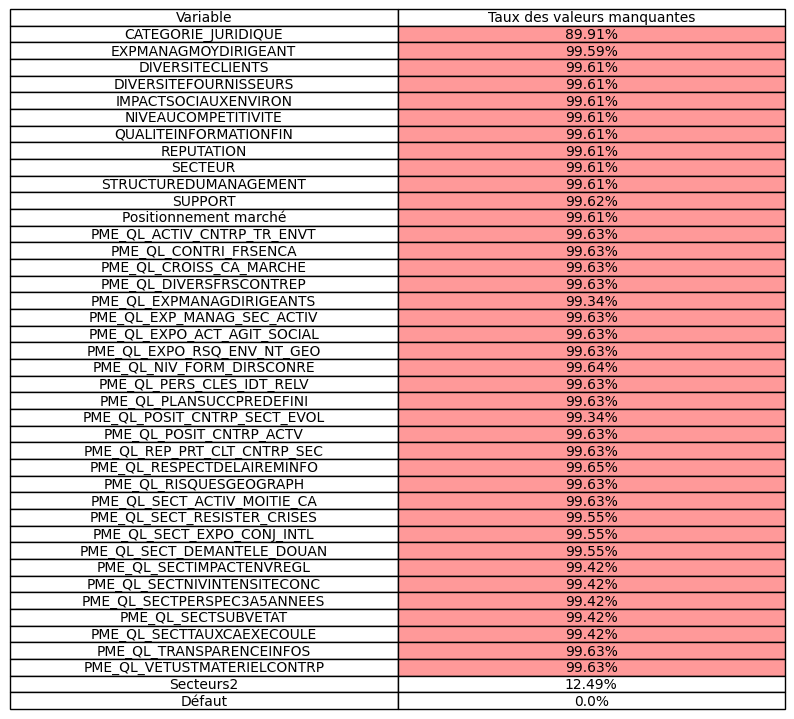

In [30]:
table_plot(df.loc[:,"CATEGORIE_JURIDIQUE":])

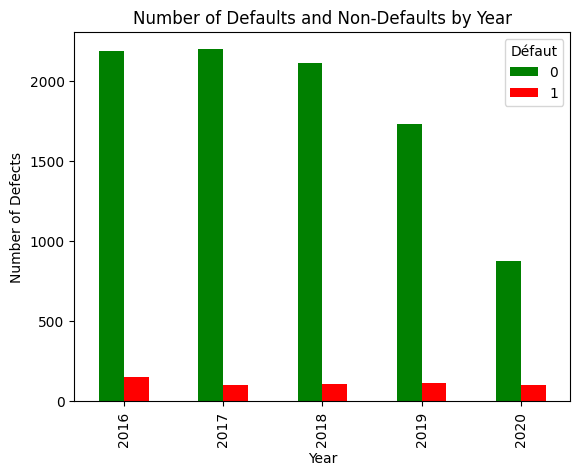

In [29]:
import matplotlib.pyplot as plt

# Create a new figure and ax object
fig, ax = plt.subplots()

# Count the number of defects and non-defects for each year
defect_counts = df.groupby('Annee')['Défaut'].value_counts().unstack(fill_value=0)

# Plot the defect counts
defect_counts.plot(kind='bar', ax=ax, stacked=False, color=['green', 'red'])

# Set the x-axis labels
ax.set_xlabel('Year')

# Set the y-axis label
ax.set_ylabel('Number of Defects')

# Set the title of the plot
ax.set_title('Number of Defaults and Non-Defaults by Year')

# Show the plot
plt.show()

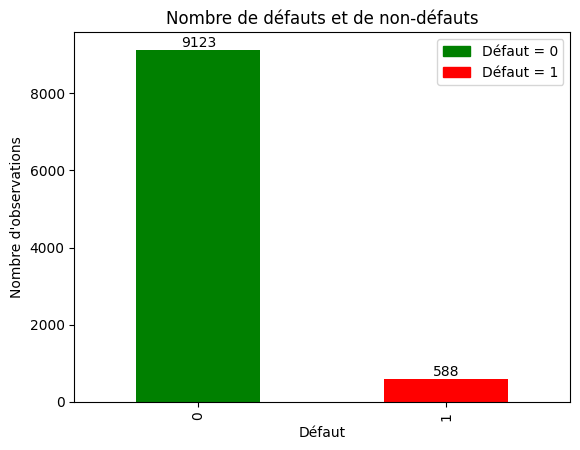

In [18]:
import matplotlib.pyplot as plt
import pandas as pd

# Example DataFrame

# Create a new figure and ax object
fig, ax = plt.subplots()

# Count the number of defects and non-defects
defect_counts = df['Défaut'].value_counts()

# Plot the defect counts
bars = defect_counts.plot(kind='bar', ax=ax, stacked=True, color=['green', 'red'])

# Add labels to the bars
ax.bar_label(bars.containers[0])

# Set the x-axis labels
ax.set_xlabel('Défaut')

# Set the y-axis label
ax.set_ylabel('Nombre d\'observations')


# Ajouter une légende en haut à droite
colors = {'Défaut = 0': 'green', 'Défaut = 1': 'red'}
labels = list(colors.keys())
handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]
ax.legend(handles, labels, loc='upper right')

# Set the title of the plot
ax.set_title('Nombre de défauts et de non-défauts')

# Show the plot
plt.show()

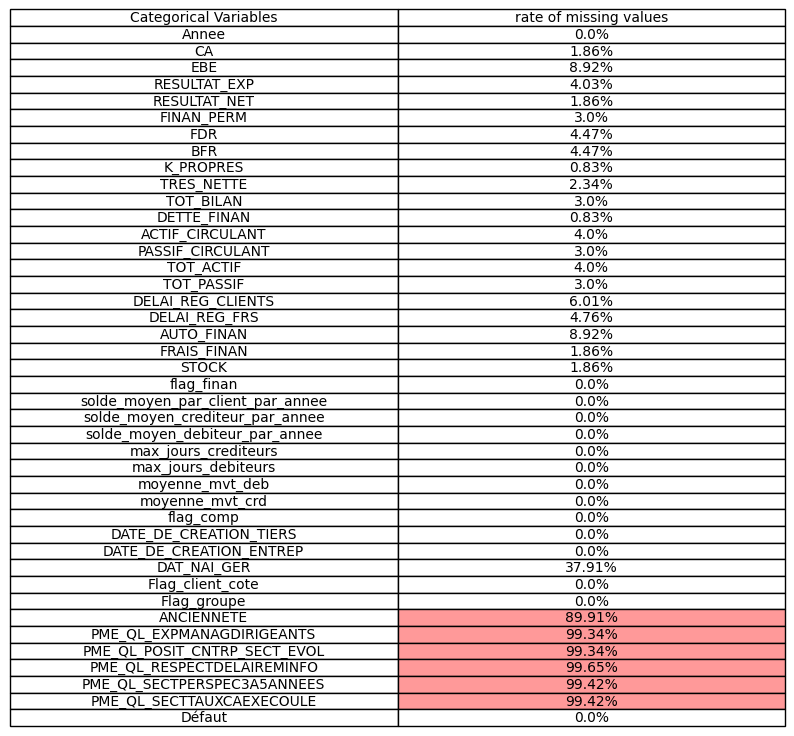

In [21]:
table_plot(df.loc[:,'Annee':].select_dtypes(exclude=[object]))

In [ ]:
df["SEC_ACTIV"]

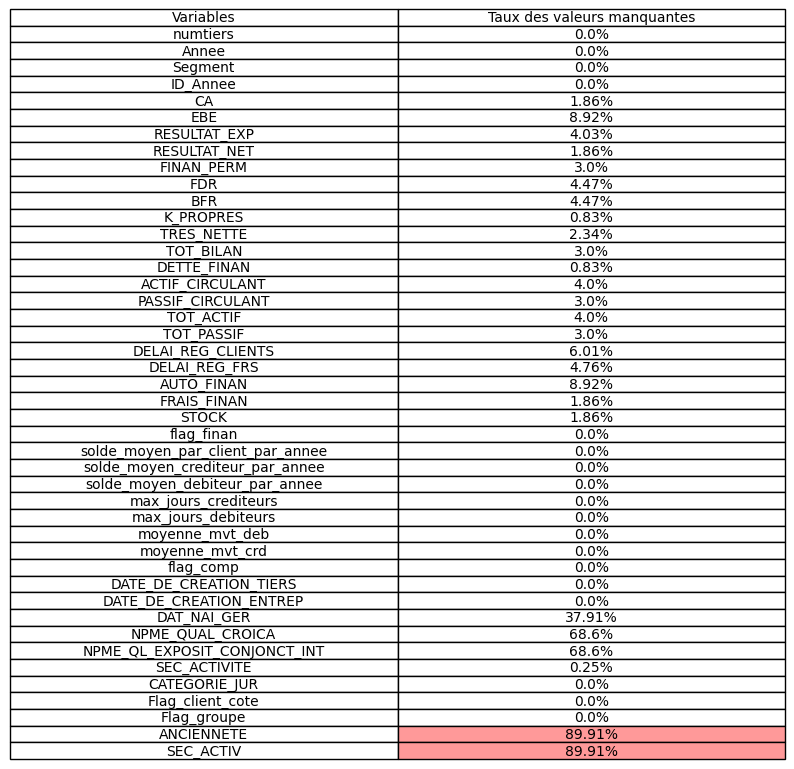

In [24]:
table_plot(df.loc[:,:"SEC_ACTIV"])

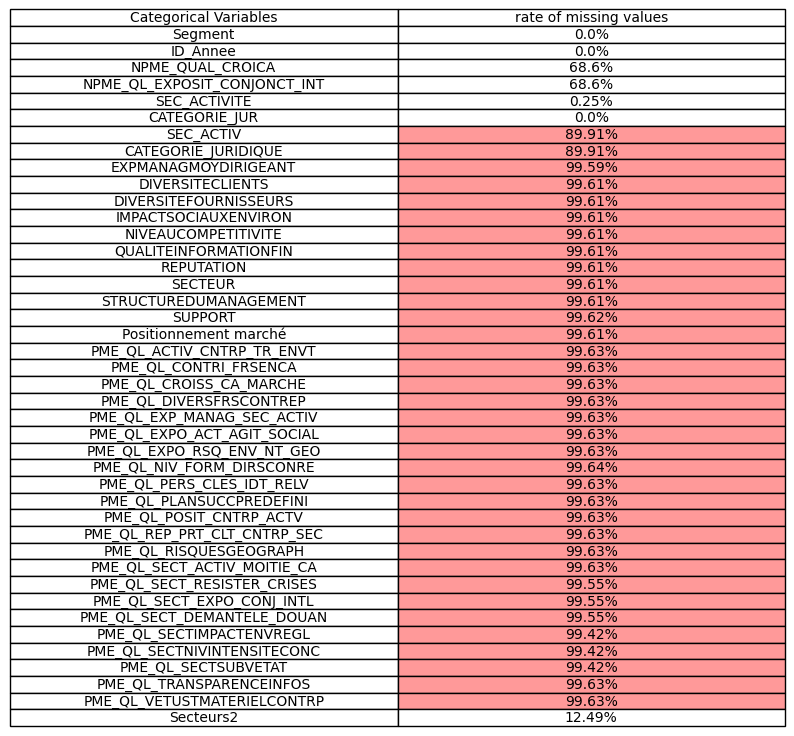

In [32]:
table_plot(df.select_dtypes(include=[object]))

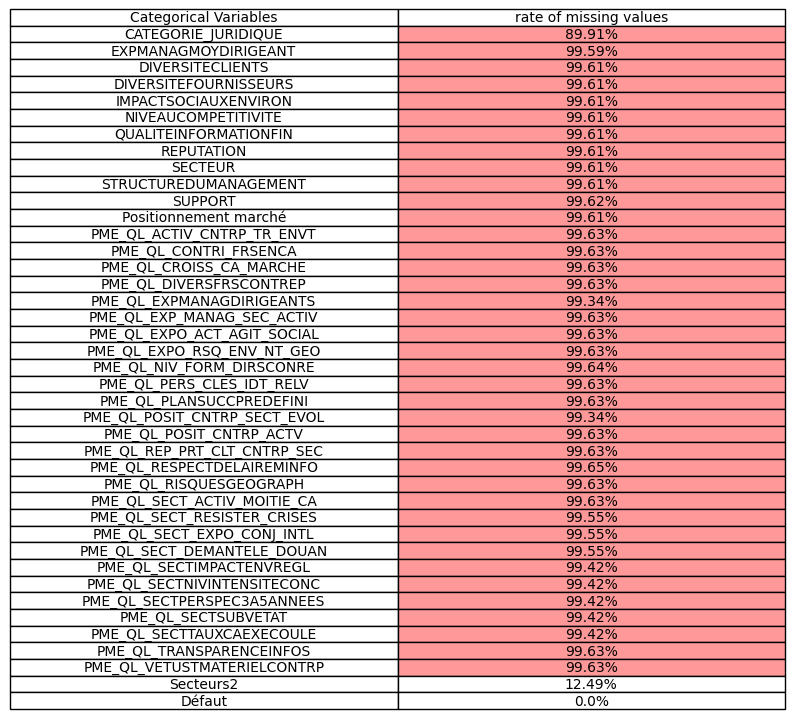

In [33]:
table_plot(df2)

In [34]:
df.dtypes.value_counts()

object            42
float64           33
int64              7
datetime64[ns]     3
Name: count, dtype: int64

### Correlation

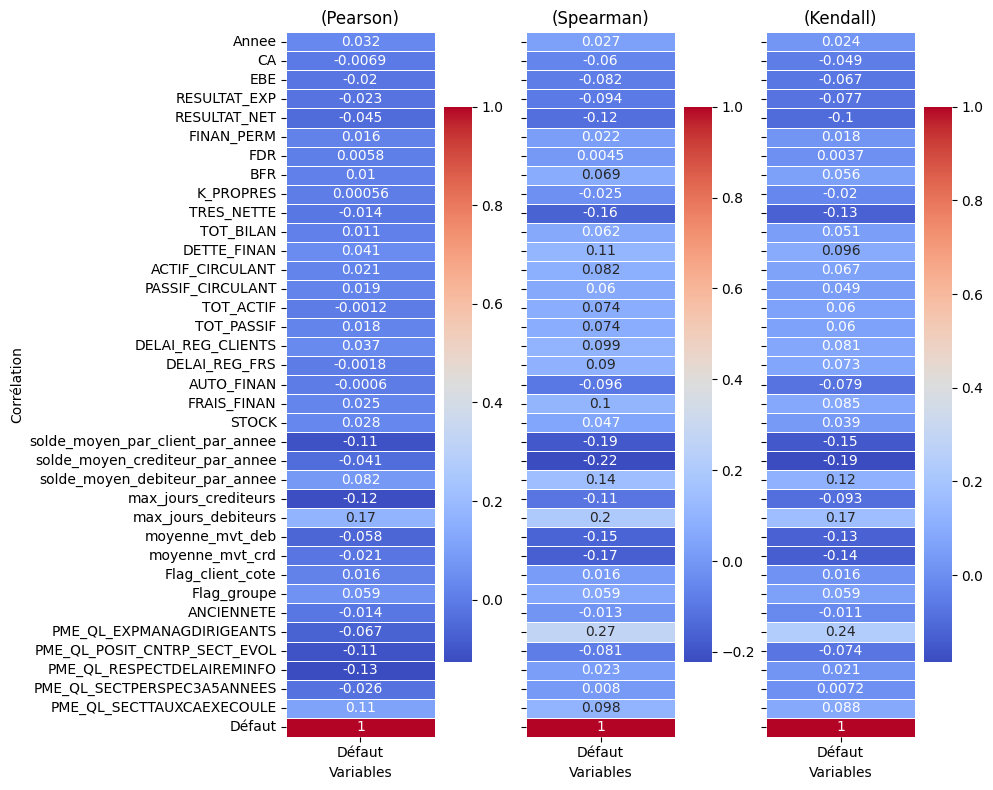

In [306]:
correlation_heatmap_all_methods(df.select_dtypes(include=[float,int]).drop(columns=["numtiers","flag_comp","flag_finan"]),  target_variable='Défaut')

In [37]:
# Exemple de dataset
data = {
    'var1': ['A', 'B', 'A', 'A', 'B', 'C', 'A', 'C', 'B', 'C'],
    'var2': ['X', 'Y', 'X', 'Z', 'Y', 'Y', 'X', 'Z', 'Z', 'X'],
    'var3': ['Q', 'Q', 'Q', 'W', 'W', 'W', 'Q', 'W', 'Q', 'W']
}
dfkl = pd.DataFrame(data)
dfkl

,var1,var2,var3
0,A,X,Q
1,B,Y,Q
2,A,X,Q
3,A,Z,W
4,B,Y,W
5,C,Y,W
6,A,X,Q
7,C,Z,W
8,B,Z,Q
9,C,X,W


Index(['var1', 'var2', 'var3'], dtype='object')


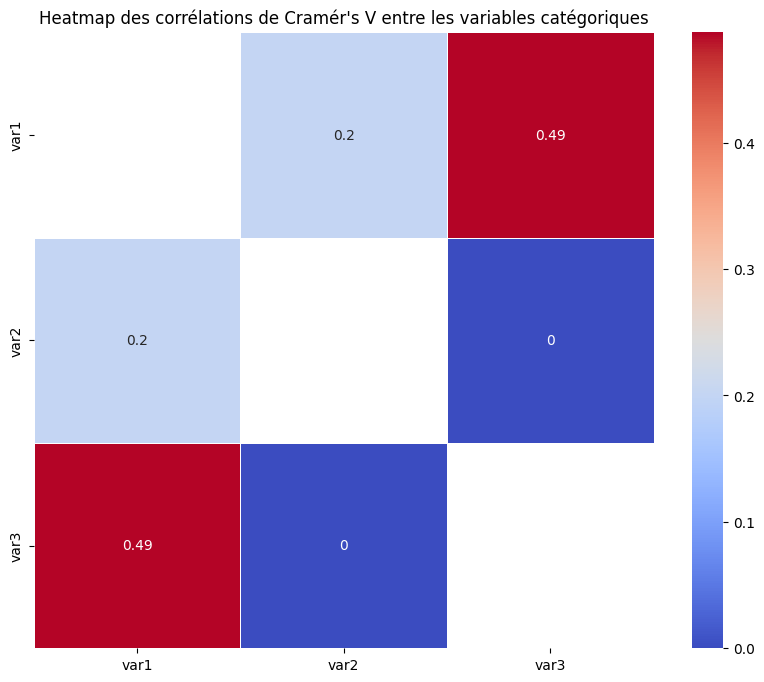

In [40]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

def cramers_v(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))    
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))



# Filtrer les colonnes catégoriques
categorical_columns = dfkl.select_dtypes(include=['object', 'category']).columns
print(categorical_columns)
# Calcul de Cramér's V pour chaque paire de variables catégoriques
results = pd.DataFrame(index=categorical_columns, columns=categorical_columns)

for col1 in categorical_columns:
    for col2 in categorical_columns:
        if col1 != col2:
            confusion_matrix = pd.crosstab(dfkl[col1], dfkl[col2])
            results.loc[col1, col2] = cramers_v(confusion_matrix.values)

# Création du heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(results.astype(float), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Heatmap des corrélations de Cramér's V entre les variables catégoriques")
plt.show()

In [50]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

def cramers_v(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))    
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))



# Filtrer les colonnes catégoriques
categorical_columns = df.select_dtypes(include=['object', 'category']).columns
print(categorical_columns)
# Calcul de Cramér's V pour chaque paire de variables catégoriques
results = pd.DataFrame(index=categorical_columns, columns=categorical_columns)

for col1 in categorical_columns:
    for col2 in categorical_columns:
        if col1 != col2:
            confusion_matrix = pd.crosstab(df[col1], df[col2])
            print(type(confusion_matrix.values))
            print(cramers_v(confusion_matrix.values))
            results.loc[col1, col2] = cramers_v(confusion_matrix.values)

# Création du heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(results.astype(float), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Heatmap des corrélations de Cramér's V entre les variables catégoriques")
plt.show()

Index(['Segment', 'ID_Annee', 'NPME_QUAL_CROICA',
       'NPME_QL_EXPOSIT_CONJONCT_INT', 'SEC_ACTIVITE', 'CATEGORIE_JUR',
       'SEC_ACTIV', 'CATEGORIE_JURIDIQUE', 'EXPMANAGMOYDIRIGEANT',
       'DIVERSITECLIENTS', 'DIVERSITEFOURNISSEURS', 'IMPACTSOCIAUXENVIRON',
       'NIVEAUCOMPETITIVITE', 'QUALITEINFORMATIONFIN', 'REPUTATION', 'SECTEUR',
       'STRUCTUREDUMANAGEMENT', 'SUPPORT', 'Positionnement marché',
       'PME_QL_ACTIV_CNTRP_TR_ENVT', 'PME_QL_CONTRI_FRSENCA',
       'PME_QL_CROISS_CA_MARCHE', 'PME_QL_DIVERSFRSCONTREP',
       'PME_QL_EXP_MANAG_SEC_ACTIV', 'PME_QL_EXPO_ACT_AGIT_SOCIAL',
       'PME_QL_EXPO_RSQ_ENV_NT_GEO', 'PME_QL_NIV_FORM_DIRSCONRE',
       'PME_QL_PERS_CLES_IDT_RELV', 'PME_QL_PLANSUCCPREDEFINI',
       'PME_QL_POSIT_CNTRP_ACTV', 'PME_QL_REP_PRT_CLT_CNTRP_SEC',
       'PME_QL_RISQUESGEOGRAPH', 'PME_QL_SECT_ACTIV_MOITIE_CA',
       'PME_QL_SECT_RESISTER_CRISES', 'PME_QL_SECT_EXPO_CONJ_INTL',
       'PME_QL_SECT_DEMANTELE_DOUAN', 'PME_QL_SECTIMPACTENVREGL',
  

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in

<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan


C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide



<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
inf
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan


C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

divide by zero encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide



<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
inf
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
inf
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
inf
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
inf
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
inf
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
inf
<class 'numpy.ndarray'>
inf
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
inf
<class 'numpy.ndarray'>
inf
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
inf
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
inf


C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

divide by zero encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

divide by zero encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

divide by zero encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered

<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan
<class 'numpy.ndarray'>
nan


C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

invalid value encountered in scalar divide



<class 'numpy.ndarray'>
inf
<class 'numpy.ndarray'>
0.6467872106010849
<class 'numpy.ndarray'>
0.23066190762156064
<class 'numpy.ndarray'>
0.062071948431855824
<class 'numpy.ndarray'>
0.09944553642514975
<class 'numpy.ndarray'>
0.07721179046774418
<class 'numpy.ndarray'>


C:\Users\user\AppData\Local\Temp\ipykernel_23040\605732601.py:15: RuntimeWarning:

divide by zero encountered in scalar divide



ValueError: No data; `observed` has size 0.

### Spearman

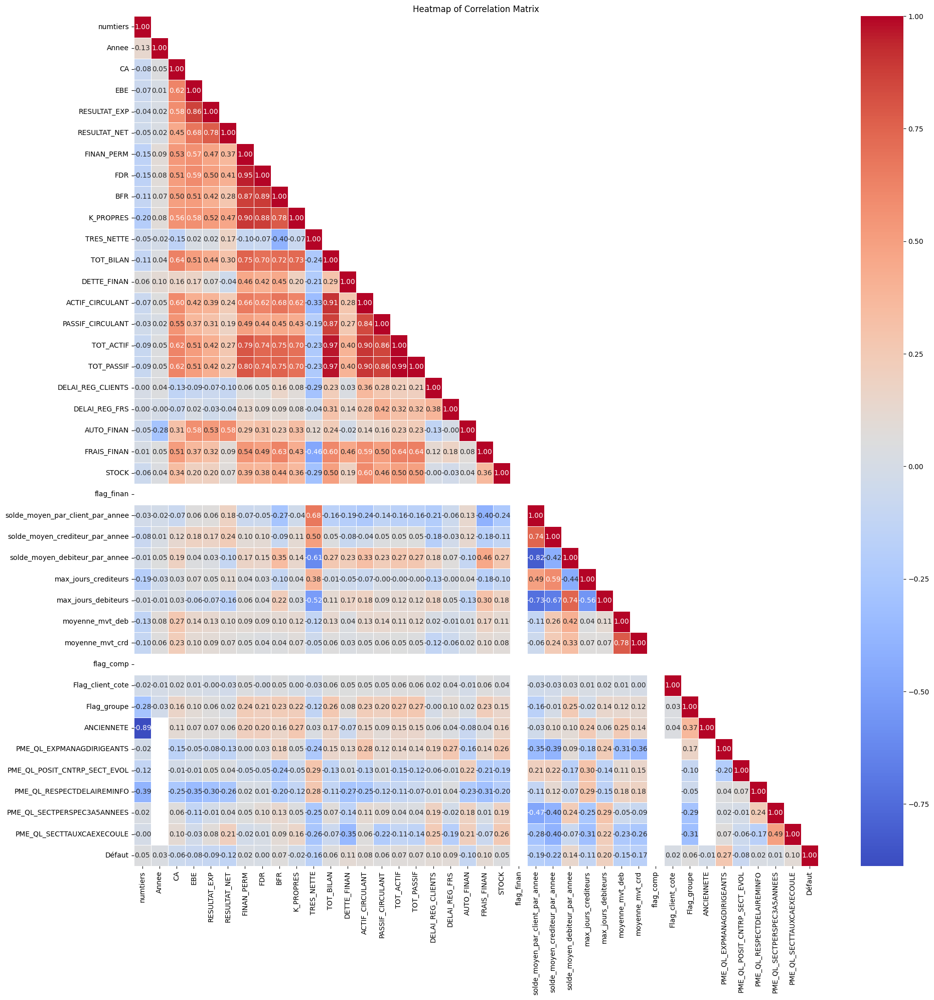

In [25]:
correlation_Heatmap(df.select_dtypes(include=[float,int]),"spearman")

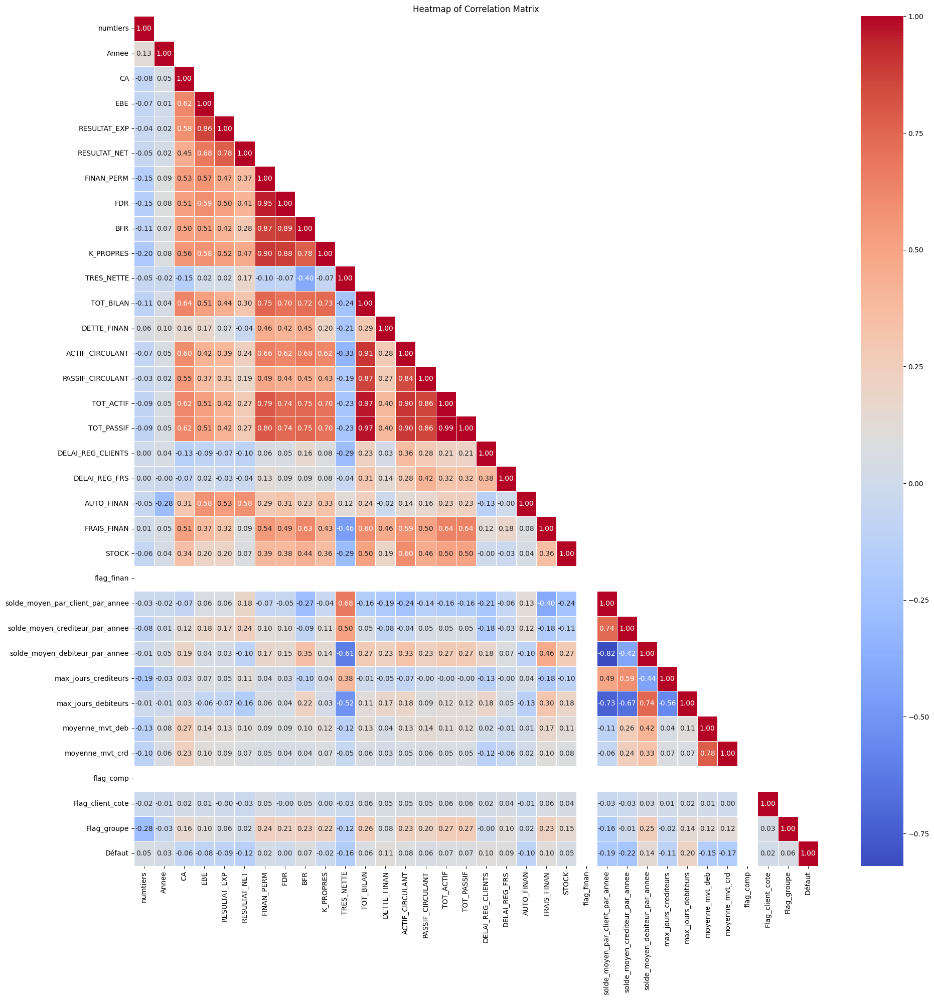

In [26]:
correlation_Heatmap(df[df.columns[(df.count()/len(df))>=0.5]].select_dtypes(include=[float,int]),"spearman")

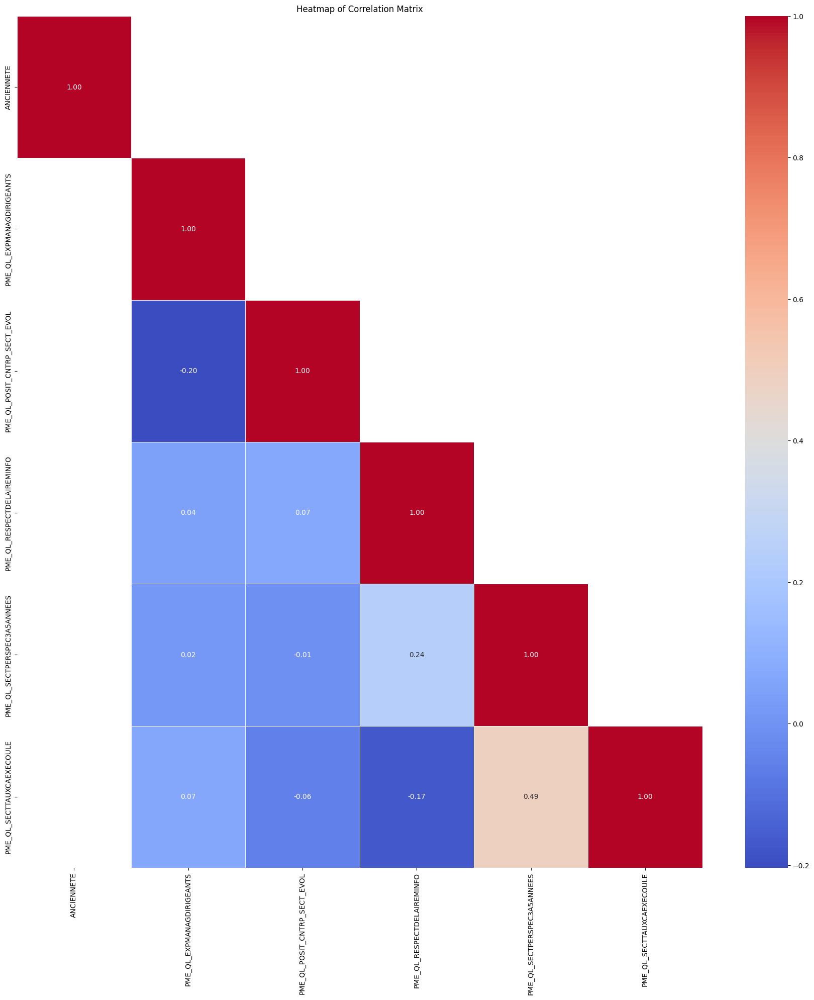

In [27]:
correlation_Heatmap(df[df.columns[(df.count()/len(df))<0.5]].select_dtypes(include=[float,int]),"spearman")

### Pearson

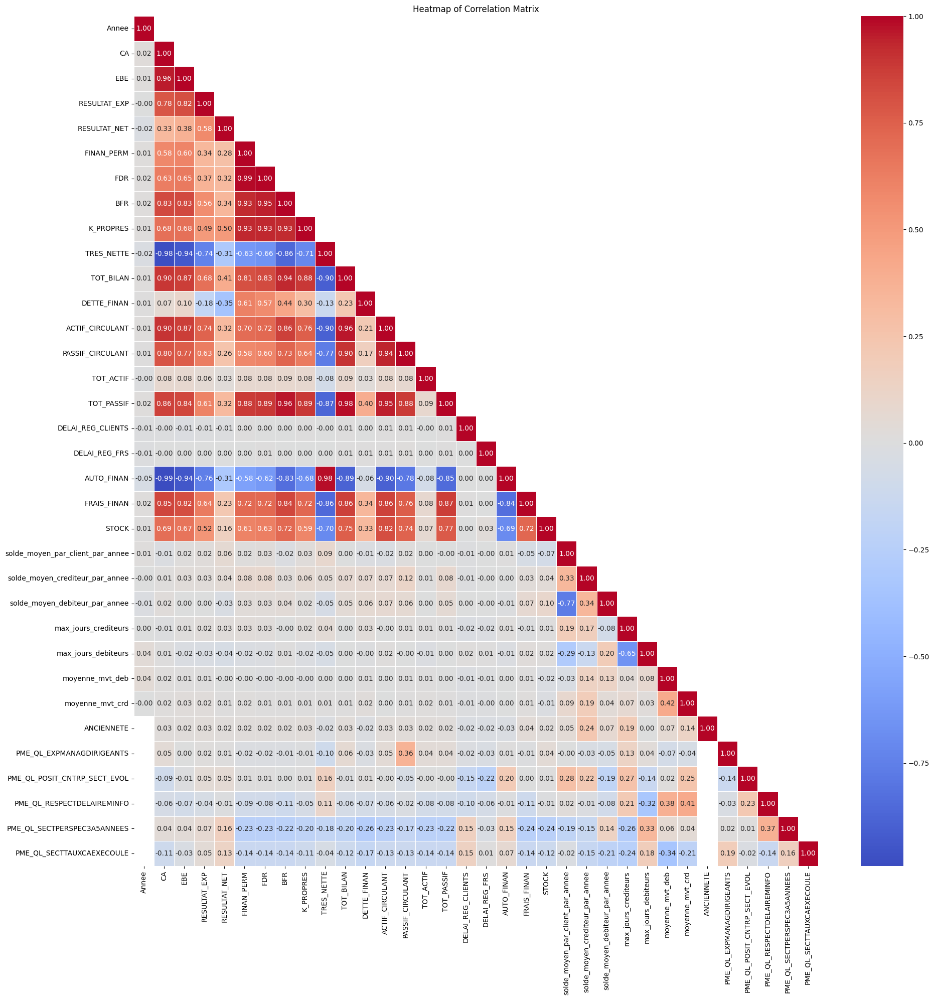

In [169]:
df_pearson=df.copy()
df_pearson=df_pearson.drop(columns=["flag_finan","flag_comp","numtiers","Segment","ID_Annee",'NPME_QL_EXPOSIT_CONJONCT_INT','NPME_QUAL_CROICA','SEC_ACTIVITE','CATEGORIE_JUR', 'Flag_client_cote', 'Flag_groupe', 'Secteurs2','Défaut'])
correlation_Heatmap(df_pearson.select_dtypes(include=[float,int]),"pearson")

In [170]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9711 entries, 0 to 9710
Data columns (total 85 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   numtiers                          9711 non-null   int64         
 1   Annee                             9711 non-null   int64         
 2   Segment                           9711 non-null   object        
 3   ID_Annee                          9711 non-null   object        
 4   CA                                9530 non-null   float64       
 5   EBE                               8845 non-null   float64       
 6   RESULTAT_EXP                      9320 non-null   float64       
 7   RESULTAT_NET                      9530 non-null   float64       
 8   FINAN_PERM                        9420 non-null   float64       
 9   FDR                               9277 non-null   float64       
 10  BFR                               9277 non-null 

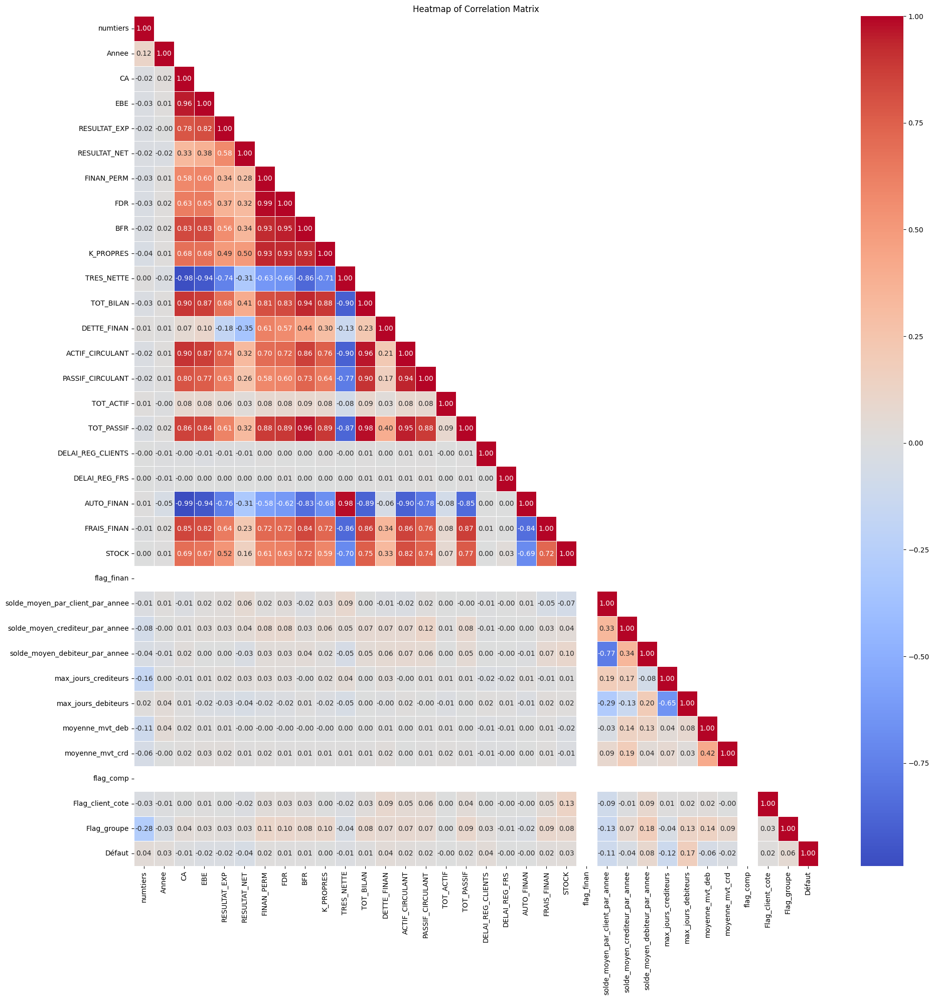

In [29]:
correlation_Heatmap(df[df.columns[(df.count()/len(df))>=0.5]].select_dtypes(include=[float,int]),"pearson")

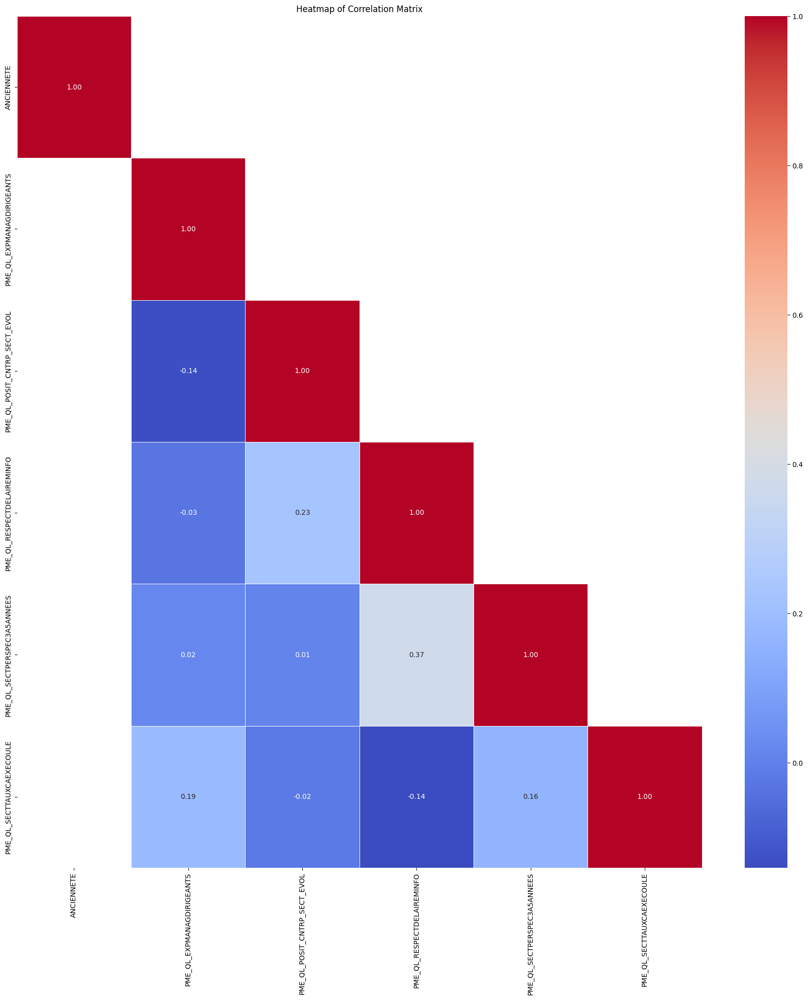

In [30]:
correlation_Heatmap(df[df.columns[(df.count()/len(df))<0.5]].select_dtypes(include=[float,int]),"pearson")

### Kendall

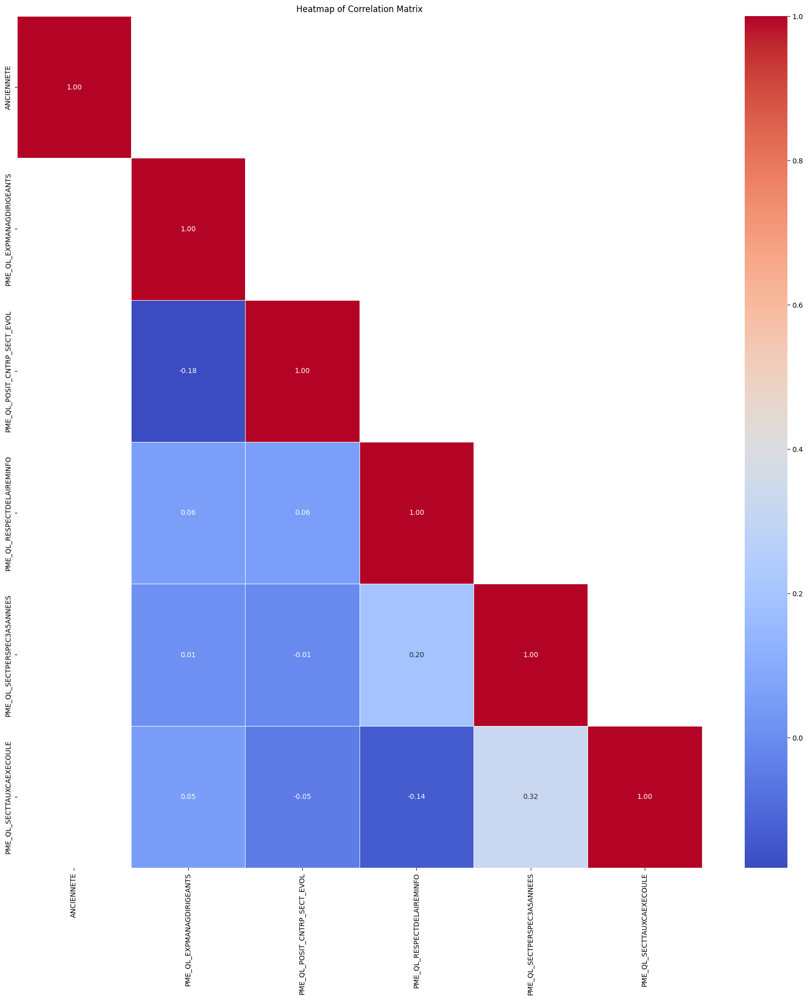

In [31]:
correlation_Heatmap(df[df.columns[(df.count()/len(df))<0.5]].select_dtypes(include=[float,int]),"kendall")

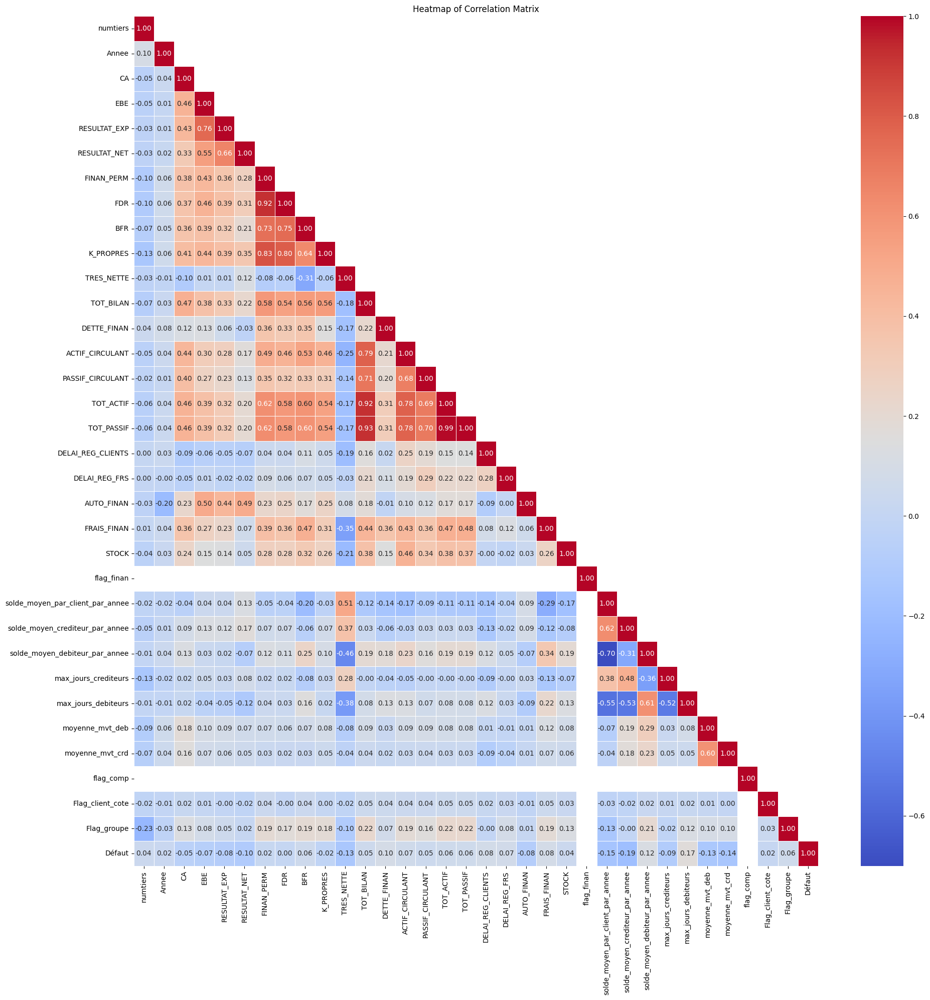

In [32]:
correlation_Heatmap(df[df.columns[(df.count()/len(df))>=0.5]].select_dtypes(include=[float,int]),"kendall")

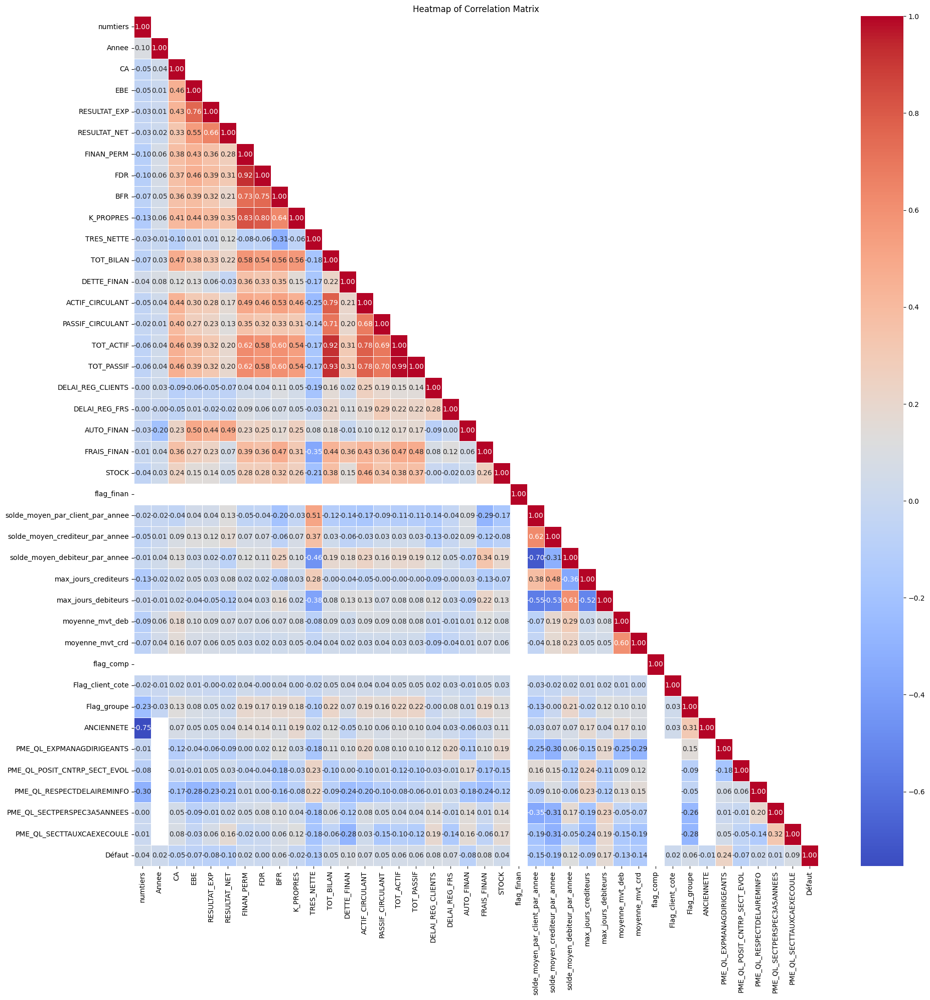

In [33]:
correlation_Heatmap(df.select_dtypes(include=[float,int]),"kendall")

### V_Cramer

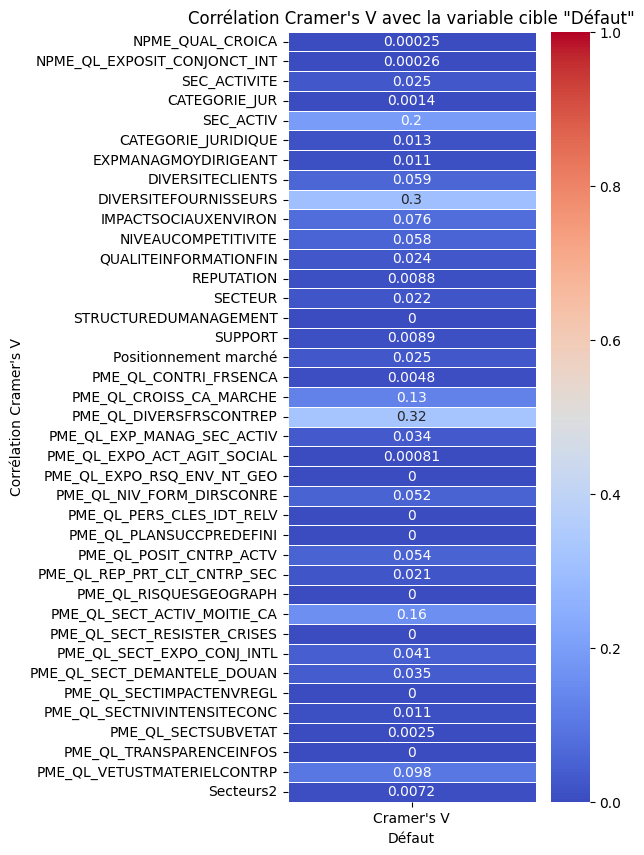

In [20]:
categorical_target_correlation_heatmap(df.drop(columns=['Segment','ID_Annee','PME_QL_ACTIV_CNTRP_TR_ENVT']), target_variable="Défaut")

### Plots

In [30]:
plot_null_notnullvalues(df.select_dtypes(include=[object]),echelle=1.1)

In [31]:
plot_null_notnullvalues(df.select_dtypes(exclude=[object]),echelle=1.1)

In [32]:
plot_boxplots_h(df, ["Annee"], yaxis_range=None)

In [34]:
plot_boxplot_v(df, "Secteurs2", yaxis_range=None)

In [108]:
#[-700000000,700000000]
#df["TRES_NETTE"]
plot_boxplot_h(df, "CA", yaxis_range=[df["CA"].min(),400000000])

In [32]:
df[df['Défaut']==1]["Annee"].count()/df["Annee"].count()

0.06054989187519308

In [33]:
df["Annee"].count()

9711

In [34]:
# totale de tous ces pourcentages = taux défaut totale 
df[df['Défaut']==1]["Annee"].value_counts()/df["Annee"].count()

Annee
2016    0.015961
2019    0.011842
2018    0.011533
2017    0.010812
2020    0.010401
Name: count, dtype: float64

In [35]:
df["Annee"].value_counts()

Annee
2016    2347
2017    2305
2018    2230
2019    1849
2020     980
Name: count, dtype: int64

In [36]:
df[df['Défaut']==1]["Annee"].value_counts()

Annee
2016    155
2019    115
2018    112
2017    105
2020    101
Name: count, dtype: int64

In [37]:
df[df['Défaut']==1]["Annee"].value_counts()/df["Annee"].value_counts()

Annee
2016    0.066042
2017    0.045553
2018    0.050224
2019    0.062196
2020    0.103061
Name: count, dtype: float64

## Data Preparation

In [18]:
df_cramer=df.copy()

In [19]:
# Supprimer les features qui ont des valeurs nulls > ou = à 70% des toutes les instances
#seuil des valeurs nulls 
seuil=0.5
df=df[df.columns[(df.count()/len(df))>=seuil]]
df.head()

,numtiers,Annee,Segment,ID_Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,...,flag_comp,DATE_DE_CREATION_TIERS,DATE_DE_CREATION_ENTREP,DAT_NAI_GER,SEC_ACTIVITE,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,Défaut
0,5200000001114,2017,PME,5200000001114_2017,27209244.29,1243534.60,964250.29,225538.69,4335258.76,4335258.76,...,1,2005-12-15,2001-02-14,1961-01-01,Activites de nettoyage,SARL,0,0,Autres sections,0
1,5200000001114,2018,PME,5200000001114_2018,17401718.12,874156.43,634975.42,286005.55,4621264.31,4621264.31,...,1,2005-12-15,2001-02-14,1961-01-01,Activites de nettoyage,SARL,0,0,Autres sections,0
2,5200000001114,2016,PME,5200000001114_2016,24109436.43,753869.48,426626.06,210857.98,4109720.08,4109720.08,...,1,2005-12-15,2001-02-14,1961-01-01,Activites de nettoyage,SARL,0,0,Autres sections,0
3,5200000003355,2016,PME,5200000003355_2016,31195868.50,5209063.92,4343626.96,3040536.96,7306476.76,7306476.76,...,1,2008-05-30,2008-04-30,NaT,Autres commerces de gros,SARL,0,0,Autres sections,1
4,5200000007319,2019,PME,5200000007319_2019,28290515.52,6309036.96,4975869.22,3169470.28,24322628.66,24309159.29,...,1,1981-04-23,1981-06-05,1933-01-12,Fabrication de machines et transformateurs ele...,SARL,0,0,Bâtiments et travaux publics,0


In [20]:
unique_numtiers = df["numtiers"].nunique()
nb_différences = df.groupby("DAT_NAI_GER")["numtiers"].nunique().sum() #nombre de répetition de DAT_NAI_GER lorsque numtiers différents
total_values = nb_différences + df["DAT_NAI_GER"].nunique()
print("nombres des numtiers uniques =",unique_numtiers)
print("nombres des DAT_NAI_GER uniques =",df["DAT_NAI_GER"].nunique())
print("nombres des DAT_NAI_GER uniques + nombre de répetition de DAT_NAI_GER lorsque numtiers différents =",nb_différences+df["DAT_NAI_GER"].nunique())

nombres des numtiers uniques = 3606
nombres des DAT_NAI_GER uniques = 1535
nombres des DAT_NAI_GER uniques + nombre de répetition de DAT_NAI_GER lorsque numtiers différents = 3761


In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9711 entries, 0 to 9710
Data columns (total 42 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   numtiers                          9711 non-null   int64         
 1   Annee                             9711 non-null   int64         
 2   Segment                           9711 non-null   object        
 3   ID_Annee                          9711 non-null   object        
 4   CA                                9530 non-null   float64       
 5   EBE                               8845 non-null   float64       
 6   RESULTAT_EXP                      9320 non-null   float64       
 7   RESULTAT_NET                      9530 non-null   float64       
 8   FINAN_PERM                        9420 non-null   float64       
 9   FDR                               9277 non-null   float64       
 10  BFR                               9277 non-null 

In [22]:
filtered_df=df.copy()
count_unique_numtiers = filtered_df.groupby('DAT_NAI_GER')['numtiers'].nunique()
nb_rep_DAT_NAI_GER=count_unique_numtiers[count_unique_numtiers>1].sum()
nb_différences=nb_rep_DAT_NAI_GER-count_unique_numtiers[count_unique_numtiers>1].count()
print("le nombre de répétition de DAT_NAI_GER lorsque numtiers différents =",nb_rep_DAT_NAI_GER)

le nombre de répétition de DAT_NAI_GER lorsque numtiers différents = 953


In [23]:
df["DAT_NAI_GER"]

0      1961-01-01
1      1961-01-01
2      1961-01-01
3             NaT
4      1933-01-12
          ...    
9706          NaT
9707   1953-01-01
9708   1964-02-22
9709   1973-11-20
9710   1971-01-01
Name: DAT_NAI_GER, Length: 9711, dtype: datetime64[ns]

In [24]:
df=df.drop(columns=["numtiers","Segment","ID_Annee"])

### df_pearson Preparation

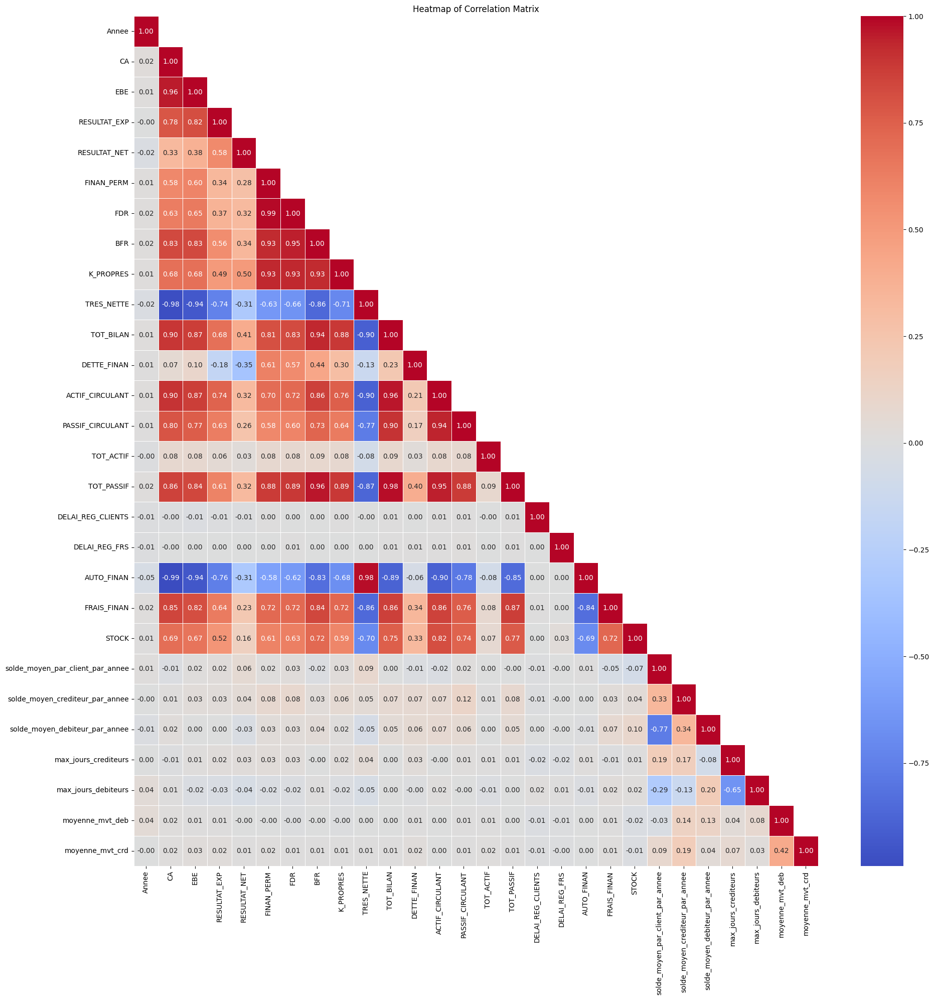

In [344]:
df_pearson=df.copy()
df_pearson=df_pearson.drop(["flag_finan","flag_comp","Flag_groupe","Flag_client_cote",'Défaut'],axis=1)
correlation_Heatmap(df_pearson.select_dtypes(include=[float,int]),"pearson")

In [29]:
from scipy.stats import pearsonr
# Sélectionner uniquement les colonnes de type float et int
df_numeric = df_pearson.select_dtypes(include=[float, int])

# Initialiser un DataFrame pour stocker les résultats
pearson_results = pd.DataFrame(index=['r de pearson', 'p-value'])


# Imputation par la moyenne
df_numeric = df_numeric.apply(lambda x: x.fillna(x.mean()), axis=0)

# Calculer le coefficient de corrélation de Pearson pour chaque paire de colonnes
for col in df_numeric.columns:
    r, p = pearsonr(df_numeric[col], df_numeric[col])
    pearson_results[col] = [r, p]

pearson_results

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,AUTO_FINAN,FRAIS_FINAN,STOCK,solde_moyen_par_client_par_annee,solde_moyen_crediteur_par_annee,solde_moyen_debiteur_par_annee,max_jours_crediteurs,max_jours_debiteurs,moyenne_mvt_deb,moyenne_mvt_crd
r de pearson,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
p-value,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### df_cramer Preparation

In [117]:
# Supprimer les features qui ont des valeurs nulls > ou = à 70% des toutes les instances
#seuil des valeurs nulls 
seuil=0.3
df_cramer=df_cramer[df_cramer.columns[(df_cramer.count()/len(df_cramer))>=seuil]]
df_cramer.head()

,numtiers,Annee,Segment,ID_Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,...,DATE_DE_CREATION_ENTREP,DAT_NAI_GER,NPME_QUAL_CROICA,NPME_QL_EXPOSIT_CONJONCT_INT,SEC_ACTIVITE,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,Défaut
0,5200000001114,2017,PME,5200000001114_2017,27209244.29,1243534.60,964250.29,225538.69,4335258.76,4335258.76,...,2001-02-14,1961-01-01,NaN,NaN,Activites de nettoyage,SARL,0,0,Autres sections,0
1,5200000001114,2018,PME,5200000001114_2018,17401718.12,874156.43,634975.42,286005.55,4621264.31,4621264.31,...,2001-02-14,1961-01-01,Autres,Autres,Activites de nettoyage,SARL,0,0,Autres sections,0
2,5200000001114,2016,PME,5200000001114_2016,24109436.43,753869.48,426626.06,210857.98,4109720.08,4109720.08,...,2001-02-14,1961-01-01,NaN,NaN,Activites de nettoyage,SARL,0,0,Autres sections,0
3,5200000003355,2016,PME,5200000003355_2016,31195868.50,5209063.92,4343626.96,3040536.96,7306476.76,7306476.76,...,2008-04-30,NaT,NaN,NaN,Autres commerces de gros,SARL,0,0,Autres sections,1
4,5200000007319,2019,PME,5200000007319_2019,28290515.52,6309036.96,4975869.22,3169470.28,24322628.66,24309159.29,...,1981-06-05,1933-01-12,NaN,NaN,Fabrication de machines et transformateurs ele...,SARL,0,0,Bâtiments et travaux publics,0


In [118]:
df_cramer=df_cramer[['NPME_QL_EXPOSIT_CONJONCT_INT','NPME_QUAL_CROICA','SEC_ACTIVITE','CATEGORIE_JUR', 'Flag_groupe', 'Secteurs2','Défaut']]
#df_cramer=df_cramer[['SEC_ACTIVITE','CATEGORIE_JUR', 'Flag_client_cote', 'Flag_groupe', 'Secteurs2','Défaut']]
df_cramer

,NPME_QL_EXPOSIT_CONJONCT_INT,NPME_QUAL_CROICA,SEC_ACTIVITE,CATEGORIE_JUR,Flag_groupe,Secteurs2,Défaut
0,NaN,NaN,Activites de nettoyage,SARL,0,Autres sections,0
1,Autres,Autres,Activites de nettoyage,SARL,0,Autres sections,0
2,NaN,NaN,Activites de nettoyage,SARL,0,Autres sections,0
3,NaN,NaN,Autres commerces de gros,SARL,0,Autres sections,1
4,NaN,NaN,Fabrication de machines et transformateurs ele...,SARL,0,Bâtiments et travaux publics,0
...,...,...,...,...,...,...,...
9706,forte,en phase ou en d,Fabrication de produits pharmaceutiques de bas...,SA a conseil d'administration,0,Industries chimiques et parachimiques,0
9707,NaN,NaN,"Commerce de gros de fruits et legumes, commerc...",SARL a associe unique,0,"Agriculture, chasse et sylviculture",0
9708,forte,au-dessus,Recuperation de matieres metalliques recyclables,SARL,0,NaN,0
9709,forte,au-dessus,Conseil en systemes informatiques,SARL a associe unique,0,NaN,0


In [119]:
df_cramer["Défaut"]=df_cramer["Défaut"].astype(object)
df_cramer["Flag_groupe"]=df_cramer["Flag_groupe"].astype(object)

In [120]:
df_cramer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9711 entries, 0 to 9710
Data columns (total 7 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   NPME_QL_EXPOSIT_CONJONCT_INT  3049 non-null   object
 1   NPME_QUAL_CROICA              3049 non-null   object
 2   SEC_ACTIVITE                  9687 non-null   object
 3   CATEGORIE_JUR                 9711 non-null   object
 4   Flag_groupe                   9711 non-null   object
 5   Secteurs2                     8498 non-null   object
 6   Défaut                        9711 non-null   object
dtypes: object(7)
memory usage: 531.2+ KB


In [107]:
df_cramer[df_cramer.select_dtypes(include=[object]).columns]=df_cramer.select_dtypes(include=[object]).fillna('NA')
df_cramer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9711 entries, 0 to 9710
Data columns (total 7 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   NPME_QL_EXPOSIT_CONJONCT_INT  9711 non-null   object
 1   NPME_QUAL_CROICA              9711 non-null   object
 2   SEC_ACTIVITE                  9711 non-null   object
 3   CATEGORIE_JUR                 9711 non-null   object
 4   Flag_groupe                   9711 non-null   int64 
 5   Secteurs2                     9711 non-null   object
 6   Défaut                        9711 non-null   int64 
dtypes: int64(2), object(5)
memory usage: 531.2+ KB


C:\Users\user\AppData\Local\Temp\ipykernel_20968\2088767641.py:1: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_cramer[df_cramer.select_dtypes(include=[object]).columns]=df_cramer.select_dtypes(include=[object]).fillna('NA')


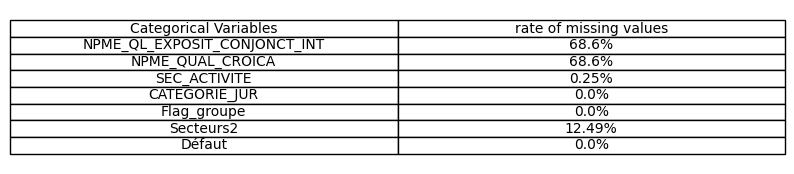

In [121]:
table_plot(df_cramer)

In [122]:
df_cramer["Flag_groupe"].value_counts()

Flag_groupe
0    7784
1    1927
Name: count, dtype: int64

In [123]:
df_cramer.nunique()

NPME_QL_EXPOSIT_CONJONCT_INT      3
NPME_QUAL_CROICA                  3
SEC_ACTIVITE                    191
CATEGORIE_JUR                    13
Flag_groupe                       2
Secteurs2                        17
Défaut                            2
dtype: int64

Index(['NPME_QL_EXPOSIT_CONJONCT_INT', 'NPME_QUAL_CROICA', 'SEC_ACTIVITE',
       'CATEGORIE_JUR', 'Flag_groupe', 'Secteurs2', 'Défaut'],
      dtype='object')
<class 'numpy.ndarray'>
1.0
<class 'numpy.ndarray'>
0.6467872106010849
<class 'numpy.ndarray'>
0.23593081563650417
<class 'numpy.ndarray'>
0.06424582133420019
<class 'numpy.ndarray'>
0.030605754769141232
<class 'numpy.ndarray'>
0.1332440783773107
<class 'numpy.ndarray'>
0.0
<class 'numpy.ndarray'>
0.6467872106010849
<class 'numpy.ndarray'>
1.0000000000000002
<class 'numpy.ndarray'>
0.23066190762156064
<class 'numpy.ndarray'>
0.062071948431855824
<class 'numpy.ndarray'>
0.06098138306742225
<class 'numpy.ndarray'>
0.087105793878958
<class 'numpy.ndarray'>
0.0
<class 'numpy.ndarray'>
0.23593081563650417
<class 'numpy.ndarray'>
0.23066190762156064
<class 'numpy.ndarray'>
0.9999999999999999
<class 'numpy.ndarray'>
0.33104232703472136
<class 'numpy.ndarray'>
0.30588707149128497
<class 'numpy.ndarray'>
0.5407787841612418
<class 'numpy.

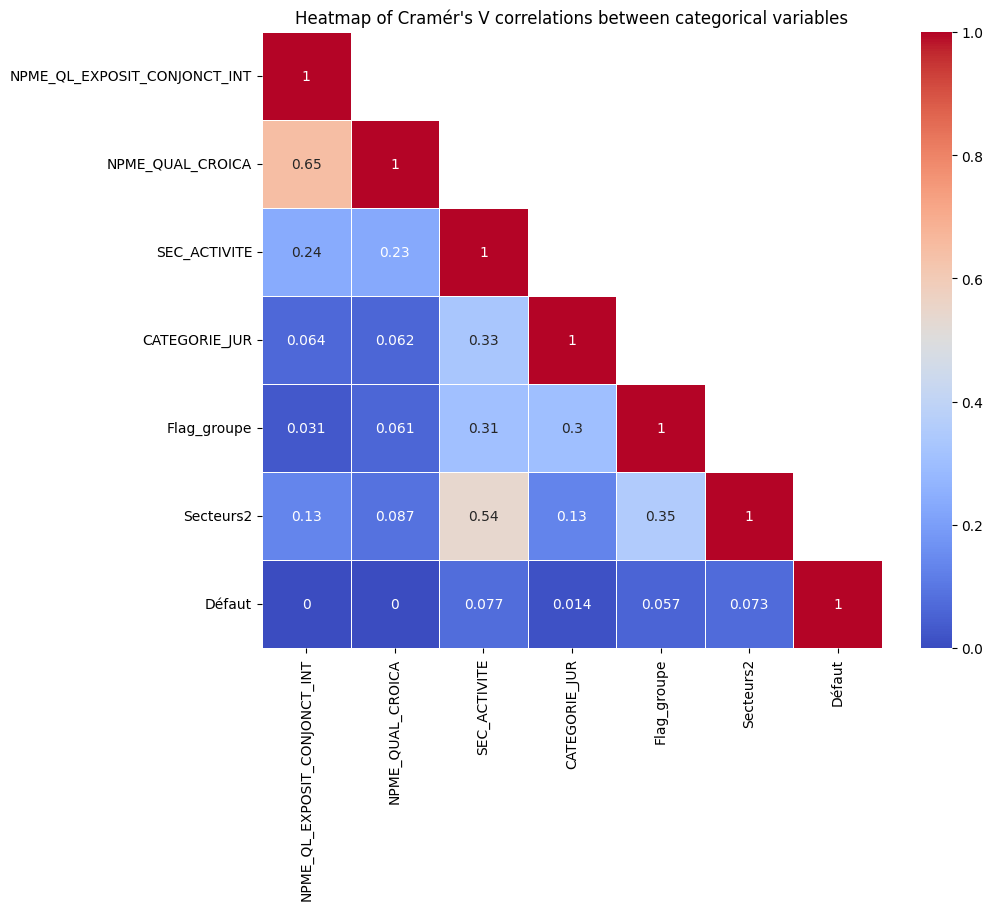

In [124]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

def cramers_v(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))    
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))



# Filtrer les colonnes catégoriques
categorical_columns = df_cramer.select_dtypes(include=['object', 'category']).columns
print(categorical_columns)
# Calcul de Cramér's V pour chaque paire de variables catégoriques
results = pd.DataFrame(index=categorical_columns, columns=categorical_columns)

for col1 in categorical_columns:
    for col2 in categorical_columns:
            confusion_matrix = pd.crosstab(df_cramer[col1], df_cramer[col2])
            print(type(confusion_matrix.values))
            print(cramers_v(confusion_matrix.values))
            results.loc[col1, col2] = cramers_v(confusion_matrix.values)
# Création du masque pour le triangle supérieur
mask = np.triu(np.ones_like(results, dtype=bool), k=1)

# Création du heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(results.astype(float), annot=True, cmap='coolwarm', linewidths=0.5,mask=mask)
plt.title("Heatmap of Cramér's V correlations between categorical variables")
plt.show()

In [638]:
df_cramer.select_dtypes(include=object)

,SEC_ACTIVITE,CATEGORIE_JUR,Secteurs2
0,Activites de nettoyage,SARL,Autres sections
1,Activites de nettoyage,SARL,Autres sections
2,Activites de nettoyage,SARL,Autres sections
3,Autres commerces de gros,SARL,Autres sections
4,Fabrication de machines et transformateurs ele...,SARL,Bâtiments et travaux publics
...,...,...,...
9706,Fabrication de produits pharmaceutiques de bas...,SA a conseil d'administration,Industries chimiques et parachimiques
9707,"Commerce de gros de fruits et legumes, commerc...",SARL a associe unique,"Agriculture, chasse et sylviculture"
9708,Recuperation de matieres metalliques recyclables,SARL,NA
9709,Conseil en systemes informatiques,SARL a associe unique,NA


### df Preparation

In [25]:
df.columns[df.nunique() == 1]

Index(['flag_finan', 'flag_comp'], dtype='object')

In [26]:
df = df.drop(df.columns[df.nunique() == 1], axis=1)
df.shape

(9711, 37)

In [27]:
#fillna des données catégoriques
df.loc[:, ['SEC_ACTIVITE', 'CATEGORIE_JUR', 'Flag_client_cote', 'Flag_groupe']] = df.loc[:, ['SEC_ACTIVITE', 'CATEGORIE_JUR', 'Flag_client_cote', 'Flag_groupe']].fillna('NA')

In [28]:
plot_NA_notnullvalues(df, columns_to_display=['SEC_ACTIVITE', 'CATEGORIE_JUR', 'Flag_client_cote', 'Flag_groupe'],echelle=0.1)

In [29]:
df["Secteurs2"].nunique

<bound method IndexOpsMixin.nunique of 0                             Autres sections
1                             Autres sections
2                             Autres sections
3                             Autres sections
4                Bâtiments et travaux publics
                        ...                  
9706    Industries chimiques et parachimiques
9707      Agriculture, chasse et sylviculture
9708                                      NaN
9709                                      NaN
9710                                      NaN
Name: Secteurs2, Length: 9711, dtype: object>

In [30]:
plot_null_notnullvalues(df,echelle=1)

In [31]:
df["Secteurs2"]=df["Secteurs2"].fillna("Autres sections")

In [32]:
# convertir les colonnes en timestamp
df.loc[:, ['DATE_DE_CREATION_TIERS',	'DATE_DE_CREATION_ENTREP',	'DAT_NAI_GER']] = df.loc[:, ['DATE_DE_CREATION_TIERS',	'DATE_DE_CREATION_ENTREP',	'DAT_NAI_GER']].map(lambda x: pd.Timestamp(x))


In [33]:
df.loc[:, ['DATE_DE_CREATION_TIERS',	'DATE_DE_CREATION_ENTREP',	'DAT_NAI_GER']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9711 entries, 0 to 9710
Data columns (total 3 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   DATE_DE_CREATION_TIERS   9711 non-null   datetime64[ns]
 1   DATE_DE_CREATION_ENTREP  9711 non-null   datetime64[ns]
 2   DAT_NAI_GER              6030 non-null   datetime64[ns]
dtypes: datetime64[ns](3)
memory usage: 227.7 KB


In [34]:
df["Annee"]=df["Annee"].astype(str)

In [35]:
# Creation des nouvelles colonnes pour  la période de création de l'entreprise  et Tiers
#Conversion des valeurs de colonnes de dates en nombre de jours
# df["Annee"]-pd.to_datetime(df["DATE_DE_CREATION_ENTREP"])
def periode_creation(df,col="Annee"):
    #date="31/12/"+df[col]
    date="31/12/2023"
    df["PERIODE_DE_CREATION_ENTREP"]=pd.to_datetime(date)-pd.to_datetime(df["DATE_DE_CREATION_ENTREP"])
    df["PERIODE_DE_CREATION_TIERS"]=pd.to_datetime(date)-pd.to_datetime(df["DATE_DE_CREATION_TIERS"])
    df["Age_GER"]=pd.to_datetime(date)-pd.to_datetime(df["DAT_NAI_GER"])

In [36]:
periode_creation(df,col="Annee")

C:\Users\user\AppData\Local\Temp\ipykernel_20984\427948970.py:7: UserWarning:

Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.

C:\Users\user\AppData\Local\Temp\ipykernel_20984\427948970.py:8: UserWarning:

Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.

C:\Users\user\AppData\Local\Temp\ipykernel_20984\427948970.py:9: UserWarning:

Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.



In [37]:
#chaque observation a sa propre valeur tout dépend de l'année de cloture de bilan
df[["Annee","PERIODE_DE_CREATION_ENTREP","Age_GER"]]

,Annee,PERIODE_DE_CREATION_ENTREP,Age_GER
0,2017,8355 days,23009 days
1,2018,8355 days,23009 days
2,2016,8355 days,23009 days
3,2016,5723 days,NaT
4,2019,15549 days,33225 days
...,...,...,...
9706,2020,3453 days,NaT
9707,2017,8491 days,25931 days
9708,2020,4785 days,21862 days
9709,2020,3240 days,18303 days


In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9711 entries, 0 to 9710
Data columns (total 40 columns):
 #   Column                            Non-Null Count  Dtype          
---  ------                            --------------  -----          
 0   Annee                             9711 non-null   object         
 1   CA                                9530 non-null   float64        
 2   EBE                               8845 non-null   float64        
 3   RESULTAT_EXP                      9320 non-null   float64        
 4   RESULTAT_NET                      9530 non-null   float64        
 5   FINAN_PERM                        9420 non-null   float64        
 6   FDR                               9277 non-null   float64        
 7   BFR                               9277 non-null   float64        
 8   K_PROPRES                         9630 non-null   float64        
 9   TRES_NETTE                        9484 non-null   float64        
 10  TOT_BILAN                         94

In [39]:
from sklearn.impute import KNNImputer
def fillna_imputation(df=df,method="mean"):
    if method=="mean":
        df.loc[:, df.count()/df.shape[0] < 1 ] = df.loc[:, df.count()/df.shape[0] < 1].apply(lambda x: x.fillna(x.mean()))
    elif method=="median":
        df.loc[:, df.count()/df.shape[0] < 1 ] = df.loc[:, df.count()/df.shape[0] < 1].apply(lambda x: x.fillna(x.median()))
    elif method=="mode":
        df.loc[:, df.count()/df.shape[0] < 1 ] = df.loc[:, df.count()/df.shape[0] < 1].apply(lambda x: x.fillna(x.mode()[0]))
    elif method=="knn":
        imputer = KNNImputer(n_neighbors=3)
        # Appliquer l'imputation KNN uniquement sur les colonnes sélectionnées
        df.loc[:, df.count()/df.shape[0] < 1 ] = imputer.fit_transform(df.loc[:, df.count()/df.shape[0] < 1 ])

In [40]:
#df.loc[:, df.count()/df.shape[0] < 1 ] = df.loc[:, df.count()/df.shape[0] < 1].apply(lambda x: x.fillna(x.mean()))
#df.loc[:, df.count()/df.shape[0] < 1 ] = df.loc[:, df.count()/df.shape[0] < 1].apply(lambda x: x.fillna(x.median()))
#df.loc[:, df.count()/df.shape[0] < 1 ] = df.loc[:, df.count()/df.shape[0] < 1].apply(lambda x: x.fillna(x.mode()[0]))
# remplissage les nulls  par l'age du gérant de la meme entreprise sinon fillna(mean)
fillna_imputation(df=df,method="mean")

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9711 entries, 0 to 9710
Data columns (total 40 columns):
 #   Column                            Non-Null Count  Dtype          
---  ------                            --------------  -----          
 0   Annee                             9711 non-null   object         
 1   CA                                9711 non-null   float64        
 2   EBE                               9711 non-null   float64        
 3   RESULTAT_EXP                      9711 non-null   float64        
 4   RESULTAT_NET                      9711 non-null   float64        
 5   FINAN_PERM                        9711 non-null   float64        
 6   FDR                               9711 non-null   float64        
 7   BFR                               9711 non-null   float64        
 8   K_PROPRES                         9711 non-null   float64        
 9   TRES_NETTE                        9711 non-null   float64        
 10  TOT_BILAN                         97

In [42]:
#df.loc[:,["Age_GER","DAT_NAI_GER"]]=df.loc[:,["Age_GER","DAT_NAI_GER"]].apply(lambda x: x.fillna(x.mean()))

In [43]:
df[["Annee","PERIODE_DE_CREATION_ENTREP","PERIODE_DE_CREATION_ENTREP","Age_GER"]]

,Annee,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_ENTREP,Age_GER
0,2017,8355 days,8355 days,23009 days 00:00:00
1,2018,8355 days,8355 days,23009 days 00:00:00
2,2016,8355 days,8355 days,23009 days 00:00:00
3,2016,5723 days,5723 days,20428 days 16:53:15.223880704
4,2019,15549 days,15549 days,33225 days 00:00:00
...,...,...,...,...
9706,2020,3453 days,3453 days,20428 days 16:53:15.223880704
9707,2017,8491 days,8491 days,25931 days 00:00:00
9708,2020,4785 days,4785 days,21862 days 00:00:00
9709,2020,3240 days,3240 days,18303 days 00:00:00


In [44]:
df["DAT_NAI_GER"]=df["DAT_NAI_GER"].astype(str).str.slice(0, 10)
# Assuming 'your_column' is the column you want to convert
df["DAT_NAI_GER"] = pd.to_datetime(df["DAT_NAI_GER"])
df["DAT_NAI_GER"]

0      1961-01-01
1      1961-01-01
2      1961-01-01
3      1968-01-25
4      1933-01-12
          ...    
9706   1968-01-25
9707   1953-01-01
9708   1964-02-22
9709   1973-11-20
9710   1971-01-01
Name: DAT_NAI_GER, Length: 9711, dtype: datetime64[ns]

In [45]:
def Days_to_Years(df):
    df['Age_GER'] = df['Age_GER'].dt.days
    df["PERIODE_DE_CREATION_ENTREP"]=round(df["PERIODE_DE_CREATION_ENTREP"].astype(str).str.replace(' days', '').astype(float)/365)
    df["PERIODE_DE_CREATION_TIERS"]=round(df["PERIODE_DE_CREATION_TIERS"].astype(str).str.replace(' days', '').astype(float)/365)
    df["Age_GER"]=round(df["Age_GER"].astype(str).str.replace(' days', '').astype(float)/365)

In [46]:
def Days_to_Years(df):
    df['Age_GER'] = df['Age_GER'].dt.days
    df["PERIODE_DE_CREATION_ENTREP"]=df["PERIODE_DE_CREATION_ENTREP"].astype(str).str.replace(' days', '').astype(float)/365
    df["PERIODE_DE_CREATION_TIERS"]=df["PERIODE_DE_CREATION_TIERS"].astype(str).str.replace(' days', '').astype(float)/365
    df["Age_GER"]=df["Age_GER"].astype(str).str.replace(' days', '').astype(float)/365

In [47]:
Days_to_Years(df)

In [48]:
columns_date=['Annee','DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP',	'DAT_NAI_GER','Age_GER','PERIODE_DE_CREATION_TIERS','PERIODE_DE_CREATION_ENTREP']
df.loc[:, columns_date]

,Annee,DATE_DE_CREATION_TIERS,DATE_DE_CREATION_ENTREP,DAT_NAI_GER,Age_GER,PERIODE_DE_CREATION_TIERS,PERIODE_DE_CREATION_ENTREP
0,2017,2005-12-15,2001-02-14,1961-01-01,63.038356,18.054795,22.890411
1,2018,2005-12-15,2001-02-14,1961-01-01,63.038356,18.054795,22.890411
2,2016,2005-12-15,2001-02-14,1961-01-01,63.038356,18.054795,22.890411
3,2016,2008-05-30,2008-04-30,1968-01-25,55.967123,15.597260,15.679452
4,2019,1981-04-23,1981-06-05,1933-01-12,91.027397,42.717808,42.600000
...,...,...,...,...,...,...,...
9706,2020,2019-04-17,2014-07-18,1968-01-25,55.967123,4.709589,9.460274
9707,2017,2019-04-26,2000-10-01,1953-01-01,71.043836,4.684932,23.263014
9708,2020,2019-05-14,2010-11-24,1964-02-22,59.895890,4.635616,13.109589
9709,2020,2019-05-29,2015-02-16,1973-11-20,50.145205,4.594521,8.876712


In [49]:
df.loc[:, ['Age_GER','PERIODE_DE_CREATION_ENTREP']].head()

,Age_GER,PERIODE_DE_CREATION_ENTREP
0,63.038356,22.890411
1,63.038356,22.890411
2,63.038356,22.890411
3,55.967123,15.679452
4,91.027397,42.600000


In [50]:
# Groupement par 'numtiers'
"""
grouped = df.groupby('numtiers')

selected_rows = grouped.apply(lambda x: x.loc[:, ['Annee','Age_GER', 'PERIODE_DE_CREATION_ENTREP']])

selected_rows.head(3)"""

"\ngrouped = df.groupby('numtiers')\n\nselected_rows = grouped.apply(lambda x: x.loc[:, ['Annee','Age_GER', 'PERIODE_DE_CREATION_ENTREP']])\n\nselected_rows.head(3)"

In [51]:
# Sélection des lignes avec les numtiers spécifiés
"""
selected_rows = df.loc[df['numtiers'].isin([5200000001114, 5200000007319, 5200009571412]), ['Age_GER', 'PERIODE_DE_CREATION_ENTREP']]

selected_rows
"""

"\nselected_rows = df.loc[df['numtiers'].isin([5200000001114, 5200000007319, 5200009571412]), ['Age_GER', 'PERIODE_DE_CREATION_ENTREP']]\n\nselected_rows\n"

In [52]:
df[columns_date].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9711 entries, 0 to 9710
Data columns (total 7 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Annee                       9711 non-null   object        
 1   DATE_DE_CREATION_TIERS      9711 non-null   datetime64[ns]
 2   DATE_DE_CREATION_ENTREP     9711 non-null   datetime64[ns]
 3   DAT_NAI_GER                 9711 non-null   datetime64[ns]
 4   Age_GER                     9711 non-null   float64       
 5   PERIODE_DE_CREATION_TIERS   9711 non-null   float64       
 6   PERIODE_DE_CREATION_ENTREP  9711 non-null   float64       
dtypes: datetime64[ns](3), float64(3), object(1)
memory usage: 531.2+ KB


In [53]:
df["Annee"]=df["Annee"].astype("int64")

In [54]:
df_NA=df.copy()

In [55]:
df.dtypes.value_counts()

float64           30
int64              4
datetime64[ns]     3
object             3
Name: count, dtype: int64

In [56]:
df.select_dtypes(include=object)

,SEC_ACTIVITE,CATEGORIE_JUR,Secteurs2
0,Activites de nettoyage,SARL,Autres sections
1,Activites de nettoyage,SARL,Autres sections
2,Activites de nettoyage,SARL,Autres sections
3,Autres commerces de gros,SARL,Autres sections
4,Fabrication de machines et transformateurs ele...,SARL,Bâtiments et travaux publics
...,...,...,...
9706,Fabrication de produits pharmaceutiques de bas...,SA a conseil d'administration,Industries chimiques et parachimiques
9707,"Commerce de gros de fruits et legumes, commerc...",SARL a associe unique,"Agriculture, chasse et sylviculture"
9708,Recuperation de matieres metalliques recyclables,SARL,Autres sections
9709,Conseil en systemes informatiques,SARL a associe unique,Autres sections


In [57]:
from sklearn.preprocessing import LabelEncoder

# Columns to encode
columns_to_encode = ['SEC_ACTIVITE', 'CATEGORIE_JUR', 'Secteurs2']

# Initialize label encoder
label_encoder = LabelEncoder()

# Dictionnaire pour stocker les encodages
encoding_dict = {}

# Appliquer l'encodage des étiquettes à chaque colonne sélectionnée
for col in columns_to_encode:
    # Appliquer l'encodage des étiquettes à la colonne
    df[col] = label_encoder.fit_transform(df[col])
    
    # Stocker les valeurs originales et leur encodage dans le dictionnaire
    encoding_dict[col] = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))

In [58]:
# Afficher le dictionnaire contenant les encodages
print(encoding_dict.items())

dict_items([('SEC_ACTIVITE', {'"Platrerie, menuiserie bois et matieres plastiques, menuiserie metallique ; serrurerie, revetement d': 0, 'Activites d?architecture, metreurs, geometres, ingenierie, etudes techniques': 1, 'Activites de banques de donnees': 2, 'Activites de nettoyage': 3, 'Activites de radio et de television': 4, 'Activites extra-territoriales': 5, 'Activites hospitalieres, pratique medicale, pratique dentaire, activites des auxiliaires medicaux, s': 6, 'Activites juridiques, activites comptables, etudes de marche et sondages, conseil pour les affaires': 7, 'Activites liees aux competences generales de l?administration, activites liees aux competences speci': 8, 'Activites photographiques, conditionnement a facon, secretariat, traduction et routage, organisation': 9, 'Activites veterinaires': 10, 'Agences de presse': 11, 'Agences de voyage': 12, 'Agences immobilieres, administration de biens immobiliers, supports juridiques de gestion de patrimo': 13, 'Appret et tannage d

In [59]:
for col, encoding in encoding_dict.items():
    print(f"Colonne: {col}")
    if 'NA' in encoding:
        print(f"Encodage de 'NA' dans cette colonne: {encoding['NA']}")
    else:
        print("La colonne ne contient pas de valeur 'NA'")

Colonne: SEC_ACTIVITE
Encodage de 'NA' dans cette colonne: 142
Colonne: CATEGORIE_JUR
La colonne ne contient pas de valeur 'NA'
Colonne: Secteurs2
La colonne ne contient pas de valeur 'NA'


### df_encoding

In [60]:
# Créer une liste pour stocker les données
data = []

# Parcourir chaque colonne et chaque encodage dans le dictionnaire encoding_dict
for col, encoding in encoding_dict.items():
    # Parcourir chaque paire valeur d'origine - valeur encodée
    for value, code in encoding.items():
        # Ajouter les valeurs à la liste
        data.append([col, value, code])

# Créer la DataFrame à partir de la liste de données
df_encoding = pd.DataFrame(data, columns=['Colonne', 'Valeur d\'Origine', 'Valeur Encodée'])

# Afficher la DataFrame

grouped = df_encoding.groupby("Colonne")

# Appliquer la fonction max() pour obtenir la valeur maximale de "Valeur Encodée" dans chaque groupe
grouped["Valeur Encodée"].max()
#fréquence de chaque modalité nombre de défauts de chauque modalité pour vérifier le modéle
# regroupement des modalités

Colonne
CATEGORIE_JUR     12
SEC_ACTIVITE     191
Secteurs2         16
Name: Valeur Encodée, dtype: int32

In [61]:
df_encoding

,Colonne,Valeur d'Origine,Valeur Encodée
0,SEC_ACTIVITE,"""Platrerie, menuiserie bois et matieres plasti...",0
1,SEC_ACTIVITE,"Activites d?architecture, metreurs, geometres,...",1
2,SEC_ACTIVITE,Activites de banques de donnees,2
3,SEC_ACTIVITE,Activites de nettoyage,3
4,SEC_ACTIVITE,Activites de radio et de television,4
...,...,...,...
217,Secteurs2,PTC,12
218,Secteurs2,"Production et distribution d'électricité, de g...",13
219,Secteurs2,Promotion Immobilière,14
220,Secteurs2,"Pêche, Aquaculture",15


In [62]:
group=df_encoding.groupby("Colonne")

selected_rows = group.apply(lambda x: x.loc[:,["Valeur d'Origine"	,"Valeur Encodée"]])


selected_rows[selected_rows["Valeur d\'Origine"]=="NA"]

C:\Users\user\AppData\Local\Temp\ipykernel_20984\4230469980.py:3: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,,Valeur d'Origine,Valeur Encodée
Colonne,,,
SEC_ACTIVITE,142,NA,142


In [63]:
df_encoding[df_encoding["Valeur d\'Origine"]=='NA']

,Colonne,Valeur d'Origine,Valeur Encodée
142,SEC_ACTIVITE,NA,142


In [64]:
df[columns_to_encode]

,SEC_ACTIVITE,CATEGORIE_JUR,Secteurs2
0,3,6,2
1,3,6,2
2,3,6,2
3,19,6,2
4,98,6,3
...,...,...,...
9706,111,4,7
9707,37,7,1
9708,163,6,2
9709,42,7,2


In [65]:
df.dtypes.value_counts()

float64           30
int64              4
datetime64[ns]     3
int32              3
Name: count, dtype: int64

In [66]:
df

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,DAT_NAI_GER,SEC_ACTIVITE,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,Défaut,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER
0,2017,27209244.29,1243534.60,964250.29,225538.69,4335258.76,4335258.76,7803888.80,4335258.76,-3468630.04,...,1961-01-01,3,6,0,0,2,0,22.890411,18.054795,63.038356
1,2018,17401718.12,874156.43,634975.42,286005.55,4621264.31,4621264.31,7861023.65,4621264.31,-3239759.34,...,1961-01-01,3,6,0,0,2,0,22.890411,18.054795,63.038356
2,2016,24109436.43,753869.48,426626.06,210857.98,4109720.08,4109720.08,9794792.31,4109720.08,-5685072.23,...,1961-01-01,3,6,0,0,2,0,22.890411,18.054795,63.038356
3,2016,31195868.50,5209063.92,4343626.96,3040536.96,7306476.76,7306476.76,7147534.46,7306476.76,158942.30,...,1968-01-25,19,6,0,0,2,1,15.679452,15.597260,55.967123
4,2019,28290515.52,6309036.96,4975869.22,3169470.28,24322628.66,24309159.29,8861455.59,24322628.66,15447703.70,...,1933-01-12,98,6,0,0,3,0,42.600000,42.717808,91.027397
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9706,2020,17039000.00,-3501000.00,-9970000.00,-12313000.00,83153000.00,67209000.00,88453000.00,21931000.00,-21244000.00,...,1968-01-25,111,4,0,0,7,0,9.460274,4.709589,55.967123
9707,2017,21802317.68,-332377.54,-1010307.33,-3418023.48,7090079.10,3672055.62,4843489.08,-2418023.48,-1171433.46,...,1953-01-01,37,7,0,0,1,0,23.263014,4.684932,71.043836
9708,2020,36863000.00,1224000.00,656000.00,79000.00,16889000.00,16889000.00,14488000.00,12299000.00,2401000.00,...,1964-02-22,163,6,0,0,2,0,13.109589,4.635616,59.895890
9709,2020,11741000.00,-154000.00,-216000.00,-410000.00,1998000.00,1588000.00,4173000.00,1513000.00,-2585000.00,...,1973-11-20,42,7,0,0,2,0,8.876712,4.594521,50.145205


## Feature Selection 

In [85]:
def get_redundant_pairs(df):
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

def get_top_abs_correlations(df, threshold=0.8):
    au_corr = df.corr().abs().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[au_corr > threshold]

# Obtenir les paires de features corrélées
top_correlations = get_top_abs_correlations(df.select_dtypes(include=[float,int]), threshold=0.8)


print(top_correlations)

CA                AUTO_FINAN          0.991143
TOT_BILAN         TOT_PASSIF          0.983548
TRES_NETTE        AUTO_FINAN          0.981128
CA                TRES_NETTE          0.978559
FINAN_PERM        FDR                 0.975168
CA                EBE                 0.958315
TOT_BILAN         ACTIF_CIRCULANT     0.957468
BFR               TOT_PASSIF          0.957241
FDR               BFR                 0.947612
EBE               AUTO_FINAN          0.944205
ACTIF_CIRCULANT   TOT_PASSIF          0.939777
EBE               TRES_NETTE          0.934360
ACTIF_CIRCULANT   PASSIF_CIRCULANT    0.933510
FINAN_PERM        K_PROPRES           0.930996
BFR               TOT_BILAN           0.930796
FDR               K_PROPRES           0.925224
BFR               K_PROPRES           0.916395
FINAN_PERM        BFR                 0.915483
CA                ACTIF_CIRCULANT     0.904149
TOT_BILAN         PASSIF_CIRCULANT    0.898898
CA                TOT_BILAN           0.897273
TRES_NETTE   

In [86]:
# Liste pour stocker les features à supprimer
features_to_drop = set()

for feature1, feature2 in top_correlations.index:
    features_to_drop.add(feature2)

# Supprimer les features redondantes
df_reduced = df.drop(columns=features_to_drop)

df_reduced

,Annee,CA,RESULTAT_NET,FINAN_PERM,DETTE_FINAN,TOT_ACTIF,DELAI_REG_CLIENTS,DELAI_REG_FRS,solde_moyen_par_client_par_annee,solde_moyen_crediteur_par_annee,...,DAT_NAI_GER,SEC_ACTIVITE,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,Défaut,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER
0,2017,27209244.29,225538.69,4335258.76,0.00,2.610072e+07,279.39,135.40,-5.528701e+08,0.000000e+00,...,1961-01-01,3,6,0,0,2,0,16.887671,12.052055,57.035616
1,2018,17401718.12,286005.55,4621264.31,0.00,2.553354e+07,421.86,110.30,-4.379568e+08,0.000000e+00,...,1961-01-01,3,6,0,0,2,0,17.887671,13.052055,58.035616
2,2016,24109436.43,210857.98,4109720.08,0.00,2.402376e+07,281.50,115.33,-4.958788e+08,0.000000e+00,...,1961-01-01,3,6,0,0,2,0,15.887671,11.052055,56.035616
3,2016,31195868.50,3040536.96,7306476.76,0.00,1.345239e+07,65.58,47.30,0.000000e+00,0.000000e+00,...,1968-01-25,19,6,0,0,2,1,8.676712,8.594521,50.682192
4,2019,28290515.52,3169470.28,24322628.66,0.00,6.237724e+07,354.83,423.87,1.566150e+09,1.566150e+09,...,1933-01-12,98,6,0,0,3,0,38.597260,38.715068,87.024658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9706,2020,17039000.00,-12313000.00,83153000.00,61222000.00,1.335870e+08,63.26,256.26,6.706450e+07,6.706450e+07,...,1968-01-25,111,4,0,0,7,0,6.460274,1.709589,50.682192
9707,2017,21802317.68,-3418023.48,7090079.10,9508102.58,2.251018e+07,27.49,132.63,2.594341e+07,2.980027e+07,...,1953-01-01,37,7,0,0,1,0,17.260274,-1.317808,65.041096
9708,2020,36863000.00,79000.00,16889000.00,4590000.00,3.025600e+07,72.52,173.19,-7.526242e+06,2.813720e+07,...,1964-02-22,163,6,0,0,2,0,10.109589,1.635616,56.895890
9709,2020,11741000.00,-410000.00,1998000.00,485000.00,1.738000e+07,437.57,229.76,-1.305506e+07,1.067281e+07,...,1973-11-20,42,7,0,0,2,0,5.876712,1.594521,47.145205


In [87]:
def get_redundant_pairs(df):
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

def get_top_abs_correlations(df, threshold=0.8):
    au_corr = df.corr().abs().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[au_corr > threshold]

# Obtenir les paires de variables fortement corrélées
top_correlations = get_top_abs_correlations(df.select_dtypes(include=[float, int]), threshold=0.8)

# Afficher les paires de variables fortement corrélées
print(top_correlations)

CA                AUTO_FINAN          0.991143
TOT_BILAN         TOT_PASSIF          0.983548
TRES_NETTE        AUTO_FINAN          0.981128
CA                TRES_NETTE          0.978559
FINAN_PERM        FDR                 0.975168
CA                EBE                 0.958315
TOT_BILAN         ACTIF_CIRCULANT     0.957468
BFR               TOT_PASSIF          0.957241
FDR               BFR                 0.947612
EBE               AUTO_FINAN          0.944205
ACTIF_CIRCULANT   TOT_PASSIF          0.939777
EBE               TRES_NETTE          0.934360
ACTIF_CIRCULANT   PASSIF_CIRCULANT    0.933510
FINAN_PERM        K_PROPRES           0.930996
BFR               TOT_BILAN           0.930796
FDR               K_PROPRES           0.925224
BFR               K_PROPRES           0.916395
FINAN_PERM        BFR                 0.915483
CA                ACTIF_CIRCULANT     0.904149
TOT_BILAN         PASSIF_CIRCULANT    0.898898
CA                TOT_BILAN           0.897273
TRES_NETTE   

In [88]:
# Calculer la matrice de corrélation
corr_matrix = df.select_dtypes(include=[float, int]).corr()
target_variable = 'Défaut'
target_correlations = corr_matrix[target_variable].abs()

# Liste des variables à examiner (exclure la variable cible)
variables = [col for col in df.select_dtypes(include=[float, int]).columns if col != target_variable]

# Dictionnaire pour suivre les variables à conserver
to_keep = {}
for var in variables:
    if var not in to_keep:
        # Obtenir les variables corrélées avec `var`
        correlated_vars = [v for v in variables if corr_matrix[var][v] > 0.8 and v != var]
        # Ajouter la variable `var` et les variables corrélées à `to_keep`
        for v in correlated_vars:
            # Comparer la corrélation avec la variable cible
            if target_correlations[var] >= target_correlations[v]:
                to_keep[var] = target_correlations[var]
            else:
                to_keep[v] = target_correlations[v]

# Filtrer les variables à conserver
selected_variables = list(to_keep.keys())

# Afficher les variables sélectionnées
print("Variables sélectionnées:", selected_variables)

Variables sélectionnées: ['EBE', 'BFR', 'TOT_BILAN', 'ACTIF_CIRCULANT', 'TOT_PASSIF', 'FRAIS_FINAN', 'RESULTAT_EXP', 'FINAN_PERM', 'FDR', 'TRES_NETTE', 'PASSIF_CIRCULANT', 'STOCK']


In [89]:
df[selected_variables]

,EBE,BFR,TOT_BILAN,ACTIF_CIRCULANT,TOT_PASSIF,FRAIS_FINAN,RESULTAT_EXP,FINAN_PERM,FDR,TRES_NETTE,PASSIF_CIRCULANT,STOCK
0,1243534.60,7803888.80,26100715.04,24008816.65,2.610072e+07,384831.72,964250.29,4335258.76,4335258.76,-3468630.04,17676459.24,285581.60
1,874156.43,7861023.65,25533540.92,23455555.45,2.553354e+07,294959.37,634975.42,4621264.31,4621264.31,-3239759.34,16836816.56,892736.73
2,753869.48,9794792.31,24023757.37,21706718.05,2.402376e+07,523.81,426626.06,4109720.08,4109720.08,-5685072.23,13663725.12,776165.00
3,5209063.92,7147534.46,13452385.31,7991087.50,1.345239e+07,0.00,4343626.96,7306476.76,7306476.76,158942.30,6145908.55,1795240.00
4,6309036.96,8861455.59,62377241.90,38340684.79,6.237724e+07,70130.93,4975869.22,24322628.66,24309159.29,15447703.70,38054613.24,3578688.53
...,...,...,...,...,...,...,...,...,...,...,...,...
9706,-3501000.00,88453000.00,68364000.00,20331000.00,1.335840e+08,5239000.00,-9970000.00,83153000.00,67209000.00,-21244000.00,28159000.00,11116000.00
9707,-332377.54,4843489.08,13002074.34,14651420.05,2.251018e+07,749292.71,-1010307.33,7090079.10,3672055.62,-1171433.46,13541734.83,2109691.79
9708,1224000.00,14488000.00,25667000.00,25209000.00,3.025700e+07,473000.00,656000.00,16889000.00,16889000.00,2401000.00,13368000.00,10590000.00
9709,-154000.00,4173000.00,16896000.00,16213000.00,1.738100e+07,289000.00,-216000.00,1998000.00,1588000.00,-2585000.00,12613000.00,402000.00


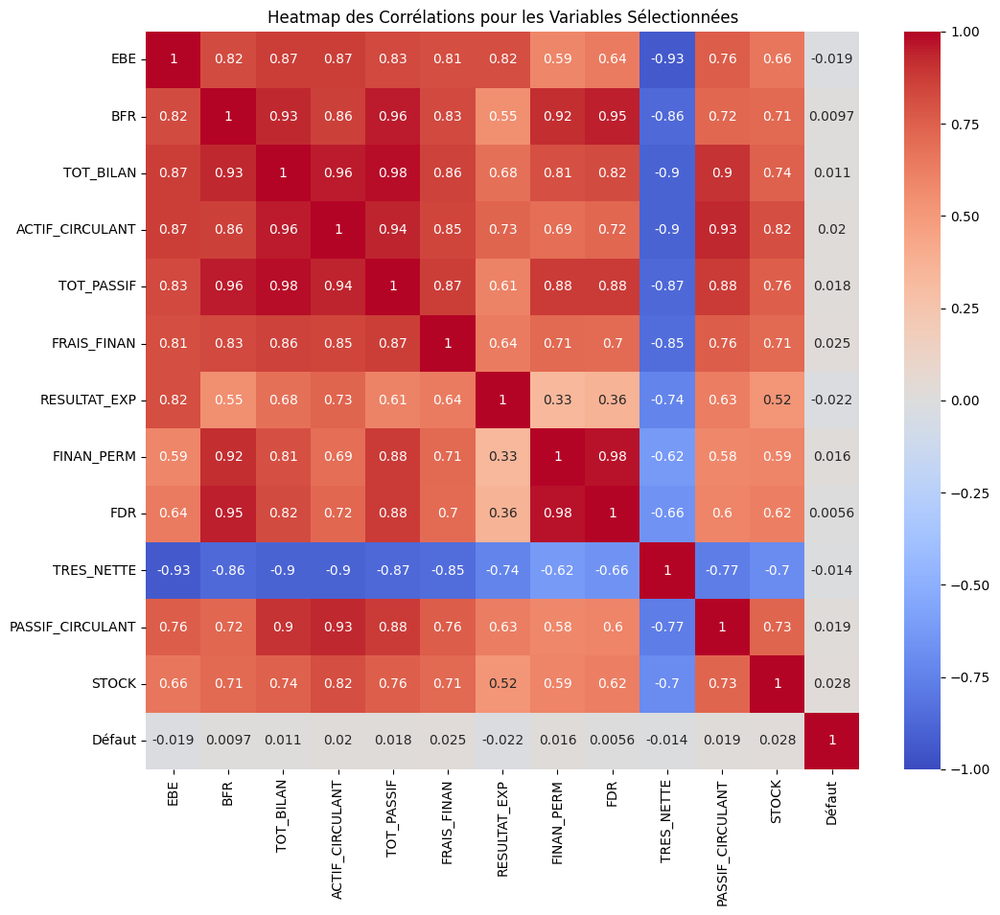

In [90]:
import seaborn as sns
import matplotlib.pyplot as plt

# Créer une heatmap des corrélations pour les variables sélectionnées
filtered_corr_matrix = corr_matrix.loc[selected_variables + [target_variable], selected_variables + [target_variable]]

plt.figure(figsize=(12, 10))
sns.heatmap(filtered_corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0)
plt.title('Heatmap des Corrélations pour les Variables Sélectionnées')
plt.show()

In [491]:
df.dtypes.value_counts()

float64           27
int64              7
datetime64[ns]     3
int32              3
Name: count, dtype: int64

### KBEST

In [212]:
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import SelectKBest, f_classif 

df_kbest=df.copy()
df_kbest=df_kbest.drop(columns=['DATE_DE_CREATION_ENTREP','DATE_DE_CREATION_TIERS','DAT_NAI_GER'])
#df_kbest=df_kbest.select_dtypes(include=[float,int])
# Assurez-vous que toutes les colonnes catégoriques sont encodées en numérique
label_encoder = LabelEncoder()
for col in df_kbest.select_dtypes(include=['object']):  # Sélectionnez uniquement les colonnes catégoriques
    df_kbest[col] = label_encoder.fit_transform(df_kbest[col])

# Maintenant, vous pouvez procéder à la sélection des caractéristiques
X = df_kbest.loc[:, :"Secteurs2"]
y = df_kbest["Défaut"]

selector = SelectKBest(score_func=f_classif, k=5)
selector.fit(X, y)

# Récupération des scores KBest et des noms de colonnes
scores = selector.scores_
feature_names = X.columns

# Trier les scores et les noms de colonnes par ordre décroissant des scores
sorted_indices = np.argsort(scores)[::-1]
sorted_scores = scores[sorted_indices]
sorted_feature_names = feature_names[sorted_indices]

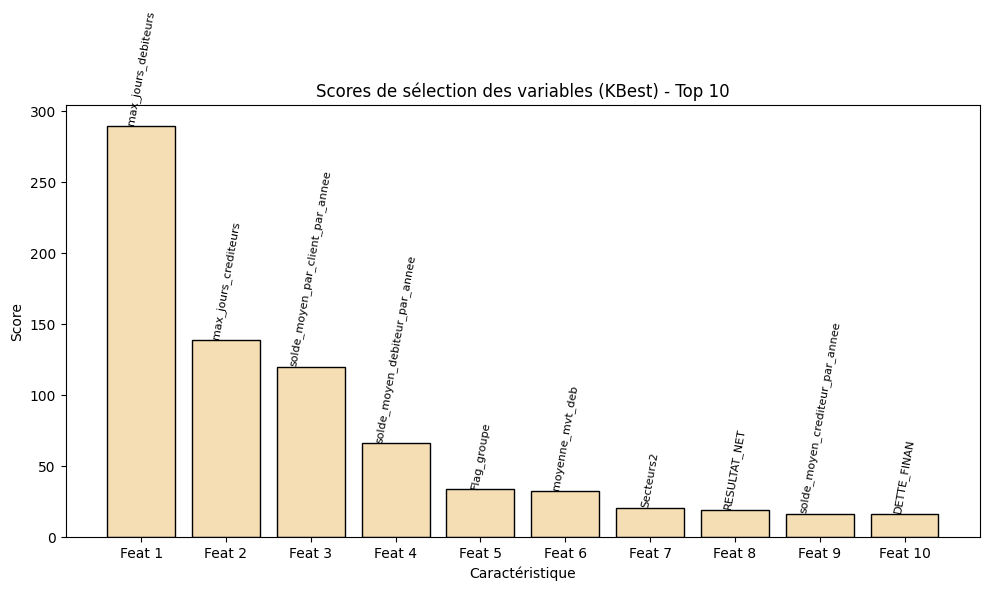

In [213]:
# Récupération des dix premiers scores KBest et des noms de colonnes correspondants
top_scores = sorted_scores[:10]
top_feature_names = sorted_feature_names[:10]

# Création de l'histogramme des scores pour les dix premières caractéristiques
plt.figure(figsize=(10, 6))
bars = plt.bar(range(len(top_scores)), top_scores, color=(0.96, 0.87, 0.7), edgecolor='black')

# Ajouter les noms de colonnes sur chaque barre
for bar, feature_name in zip(bars, top_feature_names):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), feature_name, ha='center', va='bottom', rotation=80, fontsize=8)

plt.title('Scores de sélection des variables (KBest) - Top 10')
plt.xlabel('Caractéristique')
plt.ylabel('Score')
plt.xticks(range(len(top_scores)), [f'Feat {i+1}' for i in range(len(top_scores))])
plt.tight_layout()  # Ajuster automatiquement les espacements pour éviter le chevauchement
plt.show()

In [89]:
df.loc[:,['SEC_ACTIVITE','CATEGORIE_JUR','Secteurs2']].dtypes

SEC_ACTIVITE     int32
CATEGORIE_JUR    int32
Secteurs2        int32
dtype: object

## Modeling and Evaluation Before GAN

In [67]:
df["Défaut"].value_counts()

Défaut
0    9123
1     588
Name: count, dtype: int64

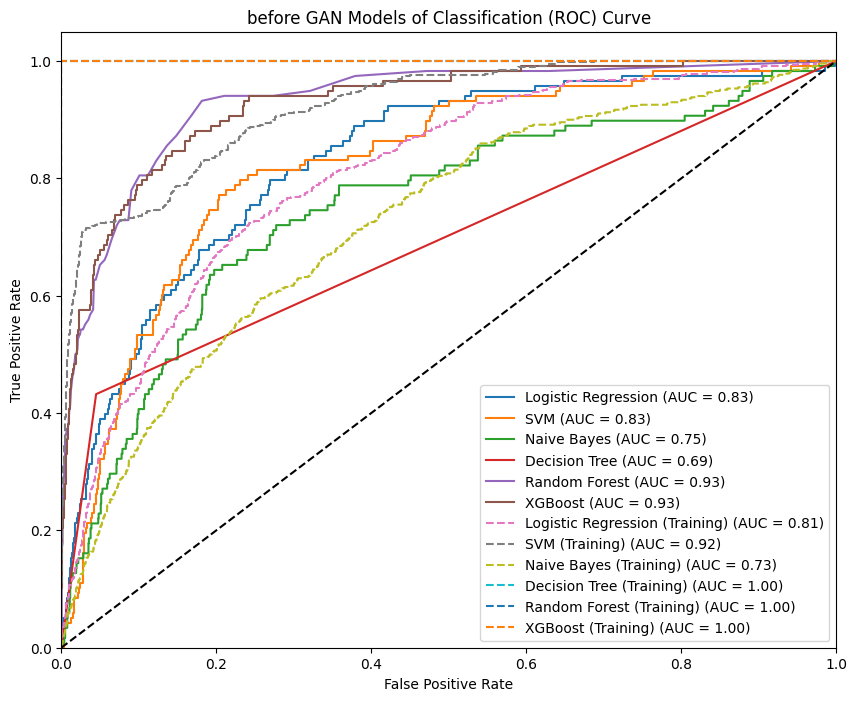

In [68]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn import svm
import xgboost as xgb
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import roc_curve, roc_auc_score


df_modeling_before_GAN=df.copy()
df_modeling_before_GAN= df_modeling_before_GAN.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
X = df_modeling_before_GAN.drop(columns=["Défaut"])
y=df_modeling_before_GAN["Défaut"]

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)



# Standardize features if needed
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize models
models = {
    "Logistic Regression": LogisticRegression(),
    "SVM": svm.SVC(probability=True),  # Note: setting probability=True for SVC to enable probability estimates
    "Naive Bayes": GaussianNB(),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "XGBoost": xgb.XGBClassifier()
    
    }

# Plot ROC curves for each model
plt.figure(figsize=(10, 8))
for name, model in models.items():
    model.fit(X_train, y_train)
    y_score = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label='%s (AUC = %0.2f)' % (name, roc_auc))

# Plot ROC curves for training set
for name, model in models.items():
    if hasattr(model, "predict_proba"):
        y_pred_proba = model.predict_proba(X_train)[:, 1]
    else:  # Use decision function for SVM
        y_pred_proba = model.decision_function(X_train)
        y_pred_proba = (y_pred_proba - y_pred_proba.min()) / (y_pred_proba.max() - y_pred_proba.min())  # Normalize
    fpr, tpr, _ = roc_curve(y_train, y_pred_proba)
    auc = roc_auc_score(y_train, y_pred_proba)
    plt.plot(fpr, tpr, linestyle='--', label=f'{name} (Training) (AUC = {auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('before GAN Models of Classification (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [69]:
df_modeling_before_GAN["Défaut"].value_counts()

Défaut
0    9123
1     588
Name: count, dtype: int64

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



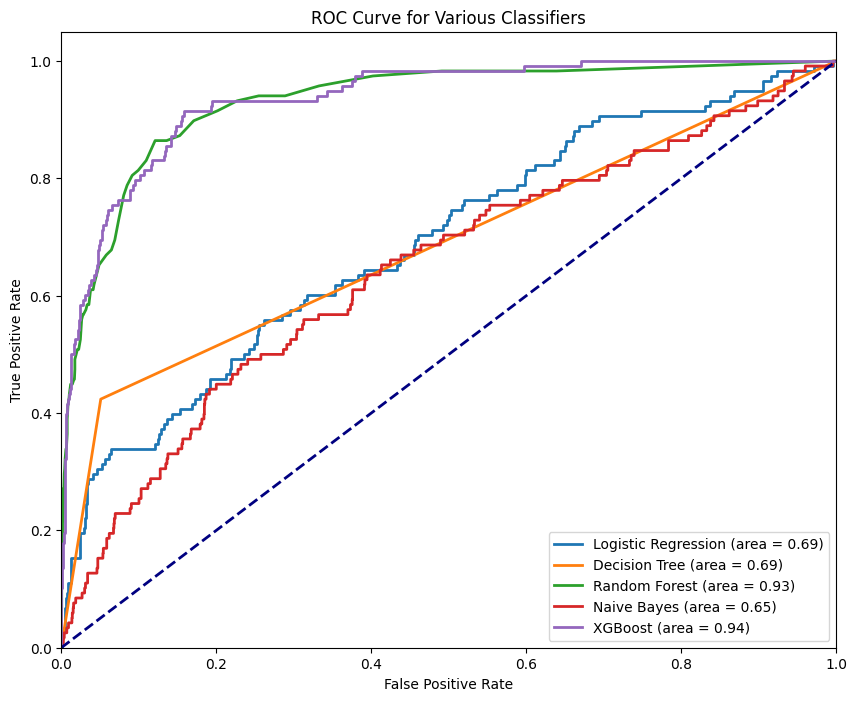

In [70]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
import xgboost as xgb
from sklearn.metrics import roc_curve, auc


df_modeling_before_GAN=df.copy()
df_modeling_before_GAN= df_modeling_before_GAN.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
X = df_modeling_before_GAN.drop(columns=["Défaut"])
y=df_modeling_before_GAN["Défaut"]


# Stratified split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Classifiers to be used
classifiers = {
    'Logistic Regression': LogisticRegression(),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Naive Bayes': GaussianNB(),
    'XGBoost': xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss')
}

# Plot setup
plt.figure(figsize=(10, 8))

for name, clf in classifiers.items():
    clf.fit(X_train, y_train)
    y_score = clf.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{name} (area = {roc_auc:.2f})')

# Plot the ROC curve
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Various Classifiers')
plt.legend(loc="lower right")
plt.show()

In [71]:
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor

df_modeling_before_GAN=df.copy()
df_modeling_before_GAN= df_modeling_before_GAN.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
X = df_modeling_before_GAN.drop(columns=["Défaut"])
y=df_modeling_before_GAN["Défaut"]

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)


# Standardize features if needed
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize Random Forest classifier for classification tasks
clf = LogisticRegression()

# Initialize Random Forest regressor for regression tasks
#clf = RandomForestRegressor()

# Train the Decision Tree model
clf.fit(X_train, y_train)

# Make predictions
y_pred = clf.predict(X_test)

# Evaluate the performance
acc = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f'Logistic Regression')
print(f'Accuracy: {acc:.2f}')
print('Classification Report:\n', report)

Logistic Regression
Accuracy: 0.94
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97      1825
           1       0.20      0.01      0.02       118

    accuracy                           0.94      1943
   macro avg       0.57      0.50      0.49      1943
weighted avg       0.89      0.94      0.91      1943



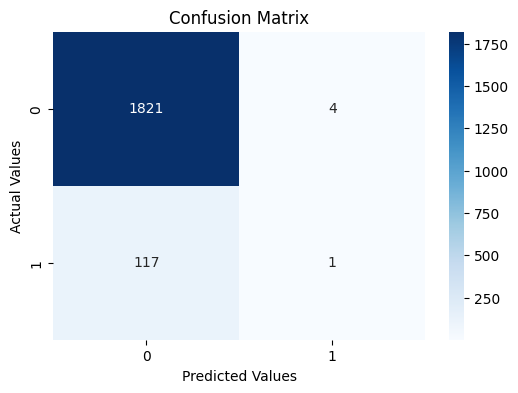

In [72]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Calculer la matrice de confusion
conf_matrix = confusion_matrix(y_test, y_pred)

# Créer une figure
plt.figure(figsize=(6, 4))

# Utiliser seaborn pour créer la heatmap
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='g')

# Ajouter des étiquettes et des titres
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.title('Confusion Matrix')


# Afficher la figure
plt.show()

## GAN Model

In [73]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [74]:
tf.__version__

'2.10.1'

In [75]:
#accuracy = CategoricalAccuracy()
#accuracy([1], [3])

In [76]:
BUFFER_SIZE = 60000 #mélanger les données aléatoirement 
BATCH_SIZE = 256 #diviser les données en des lots
#Un lot est un ensemble d'exemples qui sont traités simultanément par le modèle lors de l'entraînement.

In [77]:
#Cette cellule a pour objectif de normaliser les données entre -1 et 1
defauts = df[df['Défaut'] == 1].drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
defauts = defauts.drop(['Défaut'], axis=1)
defauts_before_encoding=defauts.copy()
#Transformer catégorique en numérique
#Transformer toutes les valeurs entre -1 et 1
#defauts = defauts[['CA', 'RESULTAT_EXP']]

defauts = defauts.apply(lambda x: (x - min(x)) * 2 / (max(x) - min(x)) - 1) #transformer les valeurs entre -1 et 1
defauts_after_encoding=defauts.copy() #datasets contiennent les valeurs entre -1 et 1
defauts = np.array(defauts)
n_features = defauts.shape[1]
latent_space = 100
train_dataset = tf.data.Dataset.from_tensor_slices(defauts).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

n_features

36

In [78]:
# Supposons que vous ayez plusieurs lignes sous forme de tableau NumPy appelé 'numpy_rows'
# generated_defaut: array pour la transformer en dataframe
# defauts_before_encoding: dataframe pour extraire max et min pour chaque colonne pour annuler encodage
def array_to_dataframe_original_values(generated_defaut,defauts_before_encoding):
    numpy_rows = np.array(generated_defaut)
    min_transformed = defauts_before_encoding.min()
    max_transformed = defauts_before_encoding.max()
    # Convertir les lignes numpy en DataFrame
    df_GAN = pd.DataFrame(numpy_rows)
    col_GAN=defauts_before_encoding.columns
    df_GAN = pd.DataFrame(numpy_rows, columns=col_GAN)
    #convert the valuesof GAN from echelle [-1;1] to the the original echelle of the dataset
    df_GAN = df_GAN.apply(lambda x: ((x + 1) * (max_transformed[x.name] - min_transformed[x.name]) / 2) + min_transformed[x.name])

    # Afficher le DataFrame
    return df_GAN

In [79]:
def compare_Datasets(defauts_after_encoding,defauts_before_encoding):
    if all(defauts_after_encoding.columns == defauts_before_encoding.columns):
        print("The datasets have same columns.")
    else:
        print("The datasets have differents columns.")

    if defauts_before_encoding.shape == defauts_after_encoding.shape:
        print("The datasets have the same shape.")
    else:
        print("The datasets have different shapes.")

    if (defauts_before_encoding == defauts_after_encoding).all().all():
        print("The datasets are identical.")
    else:
        print("The datasets are not identical.")

In [80]:
compare_Datasets(defauts_after_encoding,defauts_before_encoding)

The datasets have same columns.
The datasets have the same shape.
The datasets are not identical.


In [81]:
def original_data(defauts_before_encoding,defauts_after_encoding):
    min_transformed = defauts_before_encoding.min()
    max_transformed = defauts_before_encoding.max()
    defauts_original_values = defauts_after_encoding.apply(lambda x: ((x + 1) * (max_transformed[x.name] - min_transformed[x.name]) / 2) + min_transformed[x.name])
    return defauts_original_values

In [82]:
min_transformed = defauts_before_encoding.min()
max_transformed = defauts_before_encoding.max()
defauts_original_values = defauts_after_encoding.apply(lambda x: ((x + 1) * (max_transformed[x.name] - min_transformed[x.name]) / 2) + min_transformed[x.name])

In [83]:
defauts_original_values

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,moyenne_mvt_deb,moyenne_mvt_crd,SEC_ACTIVITE,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER
3,2016.0,3.119587e+07,5209063.92,4343626.96,3040536.96,7306476.76,7306476.76,7147534.46,7306476.76,158942.30,...,0.000000,0.000000,19.0,6.0,0.0,0.0,2.0,15.679452,15.597260,55.967123
14,2018.0,2.911274e+07,1721797.43,-1983804.17,-5836831.45,16190812.39,10177626.24,40687364.80,9924803.60,-30509738.56,...,37.083333,3.250000,9.0,6.0,0.0,0.0,10.0,24.791781,24.882192,54.704110
51,2016.0,1.097071e+07,982082.10,837086.20,335242.09,5131506.99,5131506.99,7685030.72,5131506.99,-2553523.73,...,91.583333,6.416667,46.0,6.0,0.0,0.0,3.0,17.134247,17.035616,55.967123
86,2019.0,1.118169e+07,729593.02,625832.02,161898.31,15960136.95,15960136.95,22430858.24,15960136.95,-6470721.29,...,4.666667,0.833333,139.0,4.0,0.0,1.0,6.0,43.164384,50.679452,55.967123
100,2020.0,1.752700e+07,-152000.00,-911000.00,32000.00,34929000.00,34927000.00,41092000.00,29078000.00,-6165000.00,...,182.166667,28.583333,122.0,6.0,0.0,0.0,8.0,49.030137,36.317808,55.967123
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9652,2019.0,1.141427e+07,45064.62,15414.63,-99368.27,5431925.30,5332557.03,5607968.90,5431925.30,-275411.87,...,1.166667,0.000000,46.0,6.0,0.0,0.0,2.0,14.797260,6.035616,54.032877
9667,2020.0,1.280320e+08,11520000.00,10927000.00,7784000.00,32501000.00,32173000.00,87562000.00,24540000.00,-55389000.00,...,44.583333,8.083333,188.0,6.0,0.0,0.0,11.0,10.002740,5.882192,52.819178
9680,2019.0,2.184755e+07,367984.72,165255.96,51334.50,5033735.93,5033735.93,5159454.41,5033735.93,-125718.48,...,10.833333,0.583333,46.0,6.0,0.0,0.0,2.0,22.676712,5.789041,71.043836
9686,2020.0,1.300700e+08,4189000.00,3930000.00,1909000.00,49433000.00,49433000.00,62153000.00,31262000.00,-12720000.00,...,103.750000,68.833333,141.0,6.0,0.0,0.0,9.0,6.709589,5.712329,55.967123


In [84]:
# Check if the values are identical
values_identical = defauts_original_values.equals(defauts_before_encoding)

# Check if the data types are identical
types_identical = defauts_original_values.dtypes.equals(defauts_before_encoding.dtypes)

# Print the result
if values_identical and types_identical:
    print("The datasets are identical in values and data types.")
elif values_identical:
    print("The datasets have identical values but different data types.")
elif types_identical:
    print("The datasets have identical data types but different values.")
else:
    print("The datasets are different both in values and data types.")

The datasets are different both in values and data types.


In [85]:
compare_Datasets(defauts_before_encoding,defauts_original_values)

The datasets have same columns.
The datasets have the same shape.
The datasets are not identical.


In [86]:
#pour calculer nombres des valuers égales et le nombre des valeurs différentes entre les datasets
#(defauts_original_values == defauts_before_encoding).apply(pd.Series.value_counts)

In [87]:
#defauts_original_values-defauts_before_encoding

In [88]:
defauts.shape

(588, 36)

In [89]:
defauts.size #multiplication(columns*rows)

21168

## Creation Generator 

In [ ]:
def make_generator_model_defaut(latent_space=100, n_features=2):
    model = tf.keras.Sequential()
    model.add(layers.Dense(128, input_shape=(latent_space,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Dense(64))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Dense(48))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Dense(n_features, activation='tanh'))

    return model

In [ ]:
generator_defaut = make_generator_model_defaut(n_features=n_features, latent_space=latent_space)

#latent space or vector space is comprised of latent variable, 
#latent Variable is a random variable that we cannot observe directly.
noise = tf.random.normal([3, latent_space]) #latent_space=100
# creer un tenseur contanant des valeurs aléatoires suivant une distribution normale
generated_defaut = generator_defaut(noise, training=False)
generated_defaut

In [ ]:
df_GAN=array_to_dataframe_original_values(generated_defaut,defauts_before_encoding)
df_GAN

## Creation Discriminator

In [ ]:
def make_discriminator_model_defaut(n_features=2):
    model = tf.keras.Sequential()
    model.add(layers.Dense(128, input_shape=(n_features,)))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Dense(64))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Dense(32))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Dense(1))

    return model

## Decision REAL/FAKE DATA

In [ ]:
discriminator_defaut = make_discriminator_model_defaut(n_features=n_features)
decision = discriminator_defaut(generated_defaut, training=False)
print (decision)

In [ ]:
def decision_RealGAN_Data(decision,thershold=0):
    threshold = thershold  # Choisissez un seuil approprié en fonction de vos données et de vos besoins
    Real=0
    for d in decision:
        if d >= threshold:
            Real+=1
            print("Real row :", (tf.constant(d).numpy()))
        else:
            print("Fake row :", tf.constant(d).numpy())

    result= round(Real/len(decision),2)
    print("pourcentage des données générées detectés comme REAL =",result)
    return result

In [ ]:
decision_RealGAN_Data(decision,thershold=0)

In [ ]:
#predictions = np.array(generated_defaut).reshape((3, 39, 1, 1))

## Generator and Discriminator Losses

In [ ]:
# Juste pour tester
#tensor = tf.constant([[1, 2, 3], [4, 5, 6]])
#tf.zeros_like(tensor)

In [ ]:
# Juste pour tester
#len(tf.zeros_like(tensor))

In [ ]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
cross_entropy

In [ ]:
def discriminator_loss_defaut(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    #compare les prédictions du discriminateur sur les vraies images à un tableau de 1
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    #compare les prédictions du discriminateur sur les fausses images (générées) à un tableau de 0
    total_loss = real_loss + fake_loss
    return total_loss

In [ ]:
def generator_loss_defaut(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)
    #compare les décisions du discriminateur sur les images générées à un tableau de 1

## Generator and Discriminator Optimizer

In [ ]:
generator_optimizer_defaut = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer_defaut = tf.keras.optimizers.Adam(1e-4)

In [ ]:
# Obtenir la date et l'heure actuelles
# Obtenir la date et l'heure actuelles
import datetime
date_heure_actuelles = datetime.datetime.now()

# Formater la date et l'heure dans le format souhaité
date_heure_actuelles = date_heure_actuelles.strftime("%d-%m-%Y %HH%MM%SS")

checkpoint_dir = f'./training_checkpoints_defaut/{date_heure_actuelles}'


#checkpoint_dir = f'./training_checkpoints_defaut/{date_heure_actuelles}'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer_defaut,
                                 discriminator_optimizer=discriminator_optimizer_defaut,
                                 generator=generator_defaut,
                                 discriminator=discriminator_defaut)

In [ ]:
checkpoint_prefix

## Generation of 600 examples 

In [390]:
def generation_examples(num_examples_to_generate,noise_dim=latent_space,EPOCHS=50):
    EPOCHS = EPOCHS
    noise_dim = latent_space
    num_examples_to_generate = num_examples_to_generate

    # créer un tenseur contenant des valeurs aléatoires suivant une distribution normale
    seed = tf.random.normal([num_examples_to_generate, noise_dim])
    seed.shape
    return seed

In [391]:
EPOCHS = 50
noise_dim = latent_space
num_examples_to_generate = 600

# créer un tenseur contenant des valeurs aléatoires suivant une distribution normale
seed = tf.random.normal([num_examples_to_generate, noise_dim])
seed.shape

TensorShape([600, 100])

In [392]:
#seed=generation_examples(num_examples_to_generate=600,noise_dim=latent_space,EPOCHS=50)

In [ ]:
seed

In [ ]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
discriminator_losses = []
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim]) #BATCH_SIZE=256 et noise_dim=latent_space=100 paramétres internes de la GAN 

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator_defaut(noise, training=True)

      real_output = discriminator_defaut(images, training=True)
      fake_output = discriminator_defaut(generated_images, training=True)

      gen_loss = generator_loss_defaut(fake_output)
      disc_loss = discriminator_loss_defaut(real_output, fake_output)
    
    print(disc_loss)
    discriminator_losses.append(disc_loss)
    #print(sum(discriminator_losses[-100:]) / 100)
    
    gradients_of_generator = gen_tape.gradient(gen_loss, generator_defaut.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator_defaut.trainable_variables)

    generator_optimizer_defaut.apply_gradients(zip(gradients_of_generator, generator_defaut.trainable_variables))
    discriminator_optimizer_defaut.apply_gradients(zip(gradients_of_discriminator, discriminator_defaut.trainable_variables))

In [ ]:
#train_step()

In [ ]:
#génerer des images à partir des nouvelles lignes générées l'ancienne méthode
def generate_and_save_images_old(model, epoch, test_input):
  # Notice `training` is set to False.
  # This is so all layers run in inference mode (batchnorm).
  predictions = model(test_input, training=False)
  if len(predictions.shape) == 2:
     batch_size, n_features = predictions.shape
     predictions = np.array(predictions).reshape((batch_size, n_features, 1, 1))
  print(n_features)
  fig = plt.figure(figsize=(4, 4))

  for i in range(predictions.shape[0]):
      plt.subplot(4, 4, i+1)
      plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
      plt.axis('off')

  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

In [ ]:
chosen_features = np.random.choice(defauts_after_encoding.columns, replace=False, size=2)
feature_1 = 'RESULTAT_NET'
feature_2 = 'TRES_NETTE'
plt.scatter(defauts_after_encoding[feature_1], defauts_after_encoding[feature_2], label='True data')
generated_data = generator_defaut(np.random.randn(600, 100))
feature_1_index = np.where(defauts_after_encoding.columns == feature_1)[0][0]
feature_2_index = np.where(defauts_after_encoding.columns == feature_2)[0][0]
plt.scatter(generated_data[:, feature_1_index], generated_data[:, feature_2_index], label='Fake data')
plt.xlabel(feature_1)
plt.ylabel(feature_2)
plt.legend()
chosen_features[0]
defauts_after_encoding

In [272]:
def generate_and_save_images(date_heure_actuelles,model, epoch, test_input, n_random=1):
  # Notice `training` is set to False.
  # This is so all layers run in inference mode (batchnorm).
  
  directory = f'Generate_600_defauts_rows/Latent_space={latent_space} le {date_heure_actuelles}'
  #directory = f'Generate_600_defauts_rows/Latent_space={latent_space}'
  print(directory)
  #Create directory if it doesn't exist
  if not os.path.exists(directory):
    os.makedirs(directory)

  directory_name = 'epoch_{}'.format(epoch)
  #if not os.path.exists(directory_name):
  #   os.mkdir(directory_name)
  for image_index in range(n_random):
    plt.figure()
    chosen_features = np.random.choice(defauts_after_encoding.columns, replace=False, size=2)
    feature_1 = chosen_features[0]
    feature_2 = chosen_features[1]
    if n_random == 1:
      feature_1 = 'RESULTAT_NET'
      feature_2 = 'TRES_NETTE'
    plt.scatter(defauts_after_encoding[feature_1], defauts_after_encoding[feature_2], label='True data', alpha=0.5)

    generated_data = model(test_input) #model of generating new row in our example= generator_defaut
    feature_1_index = np.where(defauts_after_encoding.columns == feature_1)[0][0]
    feature_2_index = np.where(defauts_after_encoding.columns == feature_2)[0][0] 
    plt.scatter(generated_data[:, feature_1_index], generated_data[:, feature_2_index], label='Fake data', alpha=0.5)
    plt.xlabel(feature_1)
    plt.ylabel(feature_2)
    plt.legend()
    # Specify the file path
    images='{}_{}.png'.format(directory_name, image_index)
    file_path = os.path.join(directory, images)
    plt.savefig(file_path)
    plt.close()
  
  return generated_data

In [273]:
b=generate_and_save_images(date_heure_actuelles,generator_defaut, 0, seed)
df_GAN_After_Learning=array_to_dataframe_original_values(b,defauts_before_encoding)
df_GAN_After_Learning


NameError: name 'date_heure_actuelles' is not defined

In [ ]:
discriminator_defaut = make_discriminator_model_defaut(n_features=n_features)
decision_Finale = discriminator_defaut(b, training=False)
print (np.max(decision_Finale))

In [ ]:
#pour visualiser fake data aprés l'apprentissage du modéle de la GAN
"""
feature_1_index = np.where(defauts_after_encoding.columns == 'RESULTAT_NET')[0][0]
feature_2_index = np.where(defauts_after_encoding.columns == 'TRES_NETTE')[0][0] 
plt.scatter(b[:, feature_1_index], b[:, feature_2_index], label='Fake data', alpha=0.5)
plt.xlabel(feature_1)
plt.ylabel(feature_2)
plt.legend()
"""

In [ ]:
seed

In [ ]:
#generate_and_save_images(date_heure_actuelles,generator_defaut, 0, np.random.randn(1, latent_space))
#pour generer une seule ligne: fake data

In [ ]:
#np.random.randn(1, latent_space)

In [ ]:
def train(dataset, epochs,Array_GAN_After_Learning):
  # Specify the directory path where you want to save the file
  #directory = f'Generate_600_defauts_rows/Latent_space={latent_space} epochs={epochs}'
  #Create directory if it doesn't exist
  #if not os.path.exists(directory):
  # os.makedirs(directory)
  
  #date_heure_actuelles = datetime.datetime.now()

  # Formater la date et l'heure dans le format souhaité
  #date_heure_actuelles = date_heure_actuelles.strftime("%d-%m-%Y %HH%MM%SS")

  #checkpoint_dir = f'./training_checkpoints_defaut/{date_heure_actuelles}'


  #checkpoint_dir = f'./training_checkpoints_defaut/{date_heure_actuelles}'
  #checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
  #checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer_defaut,
  #                                discriminator_optimizer=discriminator_optimizer_defaut,
  #                               generator=generator_defaut,
  #                                discriminator=discriminator_defaut)

  for epoch in range(epochs):
    start = time.time()

    for image_batch in dataset:
      train_step(image_batch)

    # Produce images for the GIF as you go
    display.clear_output(wait=True)
    generate_and_save_images(date_heure_actuelles,
                             generator_defaut,
                             epoch + 1,
                             seed,
                             )

    # Save the model every 15 epochs
    if (epoch + 1) % 15 == 0:
      #checkpoint.save(file_prefix = checkpoint_prefix)
      generator_defaut.save(checkpoint_prefix + "_" + str(epoch) +".h5")

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))
  
  

  
  # Generate after the final epoch
  display.clear_output(wait=True)
  Array_GAN_After_Learning=generate_and_save_images(date_heure_actuelles,
                           generator_defaut,
                           epochs,
                           seed,
                           )
  #df_GAN_After_Learning=array_to_dataframe_original_values(Array_GAN_After_Learning,defauts_before_encoding)

In [ ]:
checkpoint_prefix 

In [ ]:
Array_GAN_After_Learning=np.array
epochs=5000
train(train_dataset, epochs,Array_GAN_After_Learning=Array_GAN_After_Learning)

## data Understanding (DATA GENERATED)

In [90]:
# Chemin du répertoire que vous souhaitez explorer
import os
chemin = './training_checkpoints_defaut'

# Lister tous les dossiers dans le chemin spécifié
dossiers = [nom for nom in os.listdir(chemin) if os.path.isdir(os.path.join(chemin, nom))]

# Afficher les dossiers
print("Les dossiers dans le chemin spécifié sont :")
for dossier in dossiers:
    print(dossier)

Les dossiers dans le chemin spécifié sont :
08-05-2024 14H44M31S  mean
12-05-2024 18H17M58S median
12-05-2024 19H20M51S mode
16-05-2024 13H48M03S
Latent_space=100


In [91]:
# With Mean imputation
#checkpoint_dir = f'./training_checkpoints_defaut/08-05-2024 14H44M31S  mean'
checkpoint_dir = f'./training_checkpoints_defaut/16-05-2024 13H48M03S'


# With Median imputation
#checkpoint_dir = f'./training_checkpoints_defaut/12-05-2024 18H17M58S median'

# With Mode imputation
#checkpoint_dir = f'./training_checkpoints_defaut/12-05-2024 19H20M51S mode'


#checkpoint_dir = f'./training_checkpoints_defaut/{date_heure_actuelles}'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")

In [92]:
import tensorflow.keras.models as models

In [93]:
gen_defaut_rows =df[df['Défaut'] == 0].shape[0] - df[df['Défaut'] == 1].shape[0]
gen_defaut_rows

8535

In [94]:
best_generator = models.load_model(checkpoint_prefix +'_4994.h5')
latent_space=100
Array_GAN_After_Learning=best_generator.predict(np.random.randn(gen_defaut_rows, latent_space))
print('les données générées =',len(Array_GAN_After_Learning))
print(len(Array_GAN_After_Learning[0]))
Array_GAN_After_Learning

267/267 [==============================] - 3s 1ms/step
les données générées = 8535
36


array([[ 0.29208907, -0.9857854 , -0.03606808, ..., -0.46321902,
        -0.4656427 , -0.59089774],
       [-0.99531764, -0.81156045,  0.572078  , ..., -0.9406296 ,
        -0.48656228, -0.00181277],
       [-0.96030533, -0.06910931,  0.30892995, ..., -0.06148217,
         0.05900407, -0.12651458],
       ...,
       [ 0.5683702 , -0.8542795 ,  0.12034323, ..., -0.67264384,
        -0.73153687, -0.32557693],
       [-0.95866144, -0.5981123 ,  0.08025696, ..., -0.6192956 ,
        -0.8886429 , -0.28170812],
       [ 0.8562366 , -0.7450306 ,  0.08774718, ..., -0.887578  ,
        -0.8768532 , -0.20535071]], dtype=float32)

In [95]:
worst_generator = models.load_model(checkpoint_prefix +'_14.h5')
latent_space=100
Array_GAN_first_Learning=worst_generator.predict(np.random.randn(gen_defaut_rows, latent_space))
print('les données générées =',len(Array_GAN_first_Learning))
print(len(Array_GAN_first_Learning[0]))
Array_GAN_first_Learning

267/267 [==============================] - 0s 1ms/step
les données générées = 8535
36


array([[-0.28190184, -0.6005999 ,  0.26916915, ...,  0.01401238,
         0.0992311 ,  0.40590203],
       [-0.02353039,  0.73266953,  0.09362907, ...,  0.7538283 ,
         0.55186015,  0.45915592],
       [-0.34666306,  0.663313  , -0.39642242, ...,  0.41370055,
        -0.15713266,  0.44445646],
       ...,
       [-0.6018908 , -0.1896661 , -0.10067341, ...,  0.3239581 ,
         0.46752724, -0.12364649],
       [-0.02043143,  0.35557744, -0.35761485, ..., -0.06294029,
        -0.5055005 ,  0.3498831 ],
       [-0.09338511, -0.4233745 ,  0.15721539, ...,  0.6681816 ,
         0.28079966,  0.38876644]], dtype=float32)

In [96]:
import numpy as np

# Assuming df is your DataFrame
defauts_after_encoding_array = defauts_after_encoding.values

In [97]:
print("shape", len(defauts_after_encoding_array))
defauts_after_encoding_array 

shape 588


array([[-1.        , -0.74434017,  0.21802557, ..., -0.7301766 ,
        -0.66074951, -0.08517758],
       [ 0.        , -0.76141209,  0.14908286, ..., -0.49616548,
        -0.34244388, -0.12023728],
       [-1.        , -0.91009164,  0.1344588 , ..., -0.69281644,
        -0.61143984, -0.08517758],
       ...,
       [ 0.5       , -0.8209525 ,  0.12231819, ..., -0.55048195,
        -0.99699446,  0.33333333],
       [ 1.        ,  0.06596406,  0.19785907, ..., -0.96052909,
        -0.99962431, -0.08517758],
       [ 1.        , -0.39110276,  0.21047559, ..., -0.87497362,
        -1.        , -0.18123051]])

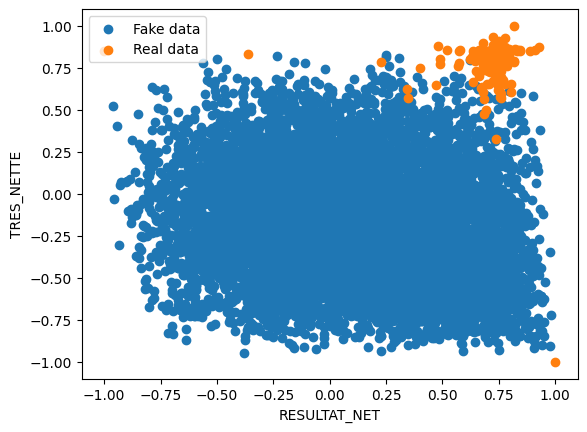

In [98]:
# Pour afficher les données premiére génération
feature_1 = 'RESULTAT_NET'
feature_2 = 'TRES_NETTE'
feature_1_index = np.where(defauts_after_encoding.columns == feature_1)[0][0]
feature_2_index = np.where(defauts_after_encoding.columns == feature_2)[0][0] 
plt.scatter(Array_GAN_first_Learning[:, feature_1_index], Array_GAN_first_Learning[:, feature_2_index], label='Fake data')
plt.scatter(defauts_after_encoding_array[:, feature_1_index], defauts_after_encoding_array[:, feature_2_index], label='Real data')
plt.xlabel(feature_1)
plt.ylabel(feature_2)
plt.legend()

In [99]:
len(Array_GAN_After_Learning)

8535

In [100]:
len(Array_GAN_first_Learning)

8535

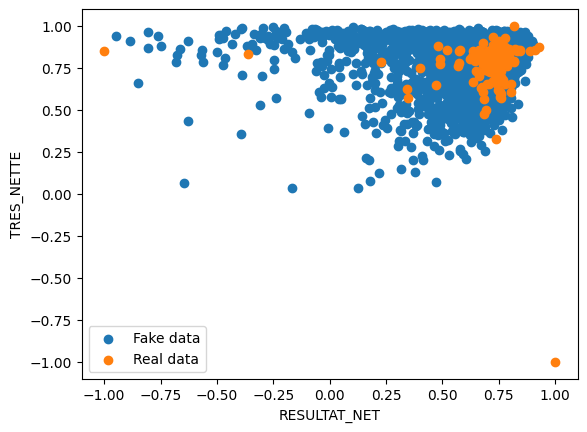

In [101]:
# Pour afficher les données générées 
feature_1 = 'RESULTAT_NET'
feature_2 = 'TRES_NETTE'
feature_1_index = np.where(defauts_after_encoding.columns == feature_1)[0][0]
feature_2_index = np.where(defauts_after_encoding.columns == feature_2)[0][0] 
plt.scatter(Array_GAN_After_Learning[:, feature_1_index], Array_GAN_After_Learning[:, feature_2_index], label='Fake data')
plt.scatter(defauts_after_encoding_array[:, feature_1_index], defauts_after_encoding_array[:, feature_2_index], label='Real data')
plt.xlabel(feature_1)
plt.ylabel(feature_2)
plt.legend()

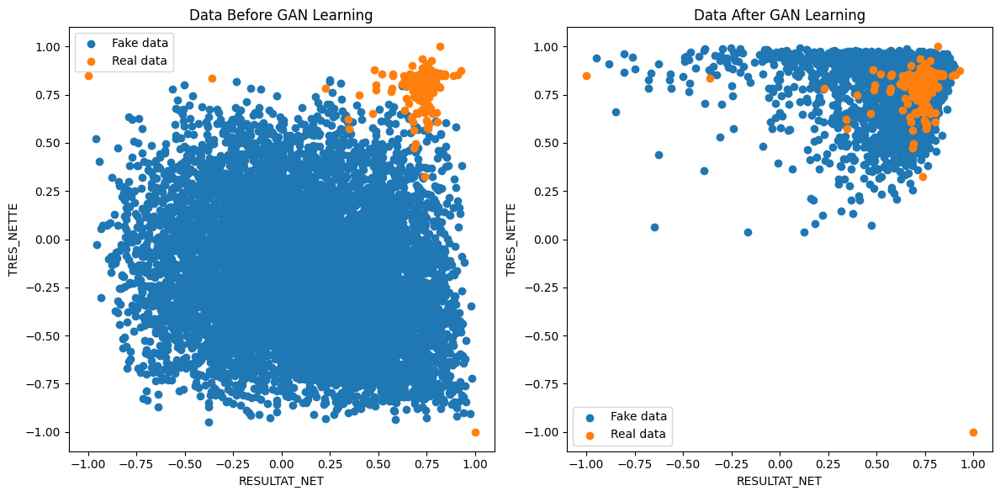

In [102]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming the necessary data is loaded into these variables:
# Array_GAN_first_Learning, Array_GAN_After_Learning, defauts_after_encoding_array, defauts_after_encoding

# Plotting the first set of data
plt.figure(figsize=(12, 6))

# First subplot
plt.subplot(1, 2, 1)
feature_1 = 'RESULTAT_NET'
feature_2 = 'TRES_NETTE'
feature_1_index = np.where(defauts_after_encoding.columns == feature_1)[0][0]
feature_2_index = np.where(defauts_after_encoding.columns == feature_2)[0][0] 
plt.scatter(Array_GAN_first_Learning[:, feature_1_index], Array_GAN_first_Learning[:, feature_2_index], label='Fake data')
plt.scatter(defauts_after_encoding_array[:, feature_1_index], defauts_after_encoding_array[:, feature_2_index], label='Real data')
plt.xlabel(feature_1)
plt.ylabel(feature_2)
plt.legend()
plt.title('Data Before GAN Learning')

# Second subplot
plt.subplot(1, 2, 2)
feature_1 = 'RESULTAT_NET'
feature_2 = 'TRES_NETTE'
feature_1_index = np.where(defauts_after_encoding.columns == feature_1)[0][0]
feature_2_index = np.where(defauts_after_encoding.columns == feature_2)[0][0] 
plt.scatter(Array_GAN_After_Learning[:, feature_1_index], Array_GAN_After_Learning[:, feature_2_index], label='Fake data')
plt.scatter(defauts_after_encoding_array[:, feature_1_index], defauts_after_encoding_array[:, feature_2_index], label='Real data')
plt.xlabel(feature_1)
plt.ylabel(feature_2)
plt.legend()
plt.title('Data After GAN Learning')

# Display the plots
plt.tight_layout()
plt.show()

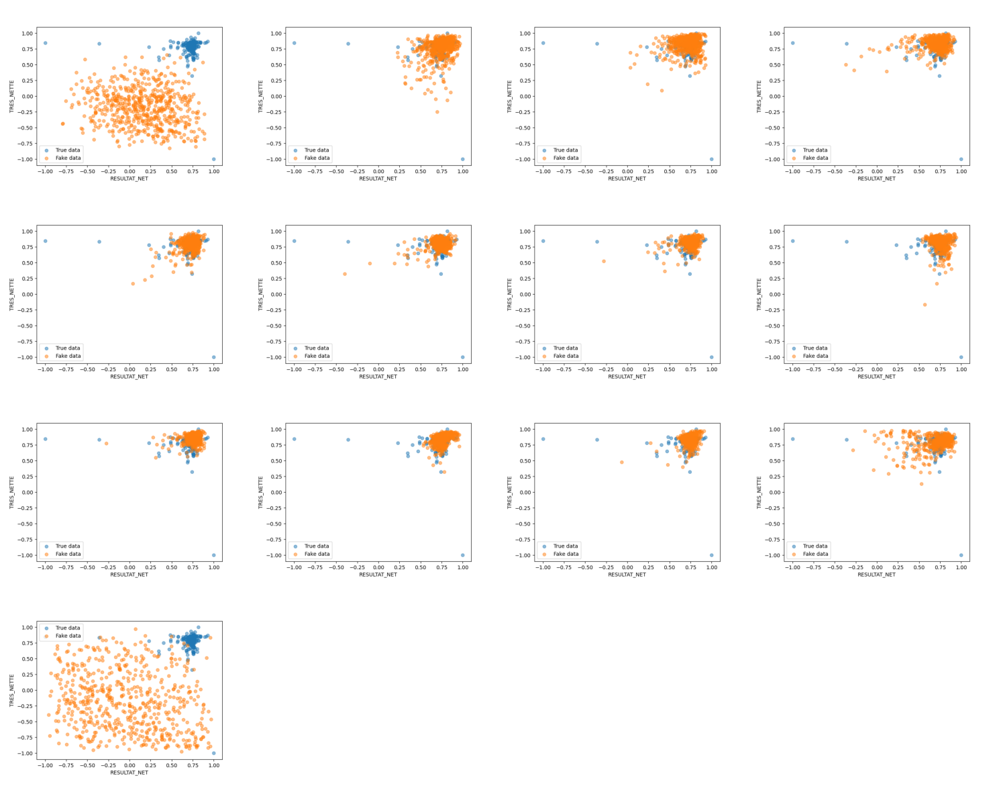

In [103]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def display_images_from_folder(folder_path):
    # Obtenir la liste des fichiers d'images dans le dossier
    image_files = [f for f in os.listdir(folder_path) if f.endswith(('jpg', 'jpeg', 'png', 'bmp', 'gif'))]

    # Sélectionner une image pour chaque tranche de 100 images
    image_files_selected = [image_files[i] for i in range(0, len(image_files), 400)]

    # Calculer le nombre de lignes nécessaires
    num_rows = (len(image_files_selected) + 3) // 4  # Arrondi supérieur de la division par 4

    # Créer une nouvelle figure matplotlib
    fig, axes = plt.subplots(num_rows, 4, figsize=(15, num_rows * 3))

    # Parcourir les fichiers d'images sélectionnés et les afficher sur la figure
    for i, image_file in enumerate(image_files_selected):
        # Ouvrir l'image
        image_path = os.path.join(folder_path, image_file)
        img = Image.open(image_path)

        # Calculer les coordonnées de subplot pour cette image
        row_index = i // 4
        col_index = i % 4

        # Afficher l'image sur le subplot correspondant
        axes[row_index, col_index].imshow(img)
        axes[row_index, col_index].axis('off')  # Désactiver les axes

    # Masquer les sous-plots restants
    for i in range(len(image_files_selected), num_rows * 4):
        row_index = i // 4
        col_index = i % 4
        axes[row_index, col_index].axis('off')

    # Ajuster automatiquement l'espacement entre les sous-plots
    plt.tight_layout()

    # Afficher la figure
    plt.show()

# Exemple d'utilisation
folder_path = "C:/Users/user/Desktop/STAGE/CODE/Dataframes/Generate_600_defauts_rows/Latent_space=100 le 16-05-2024 13H48M03S"
display_images_from_folder(folder_path)

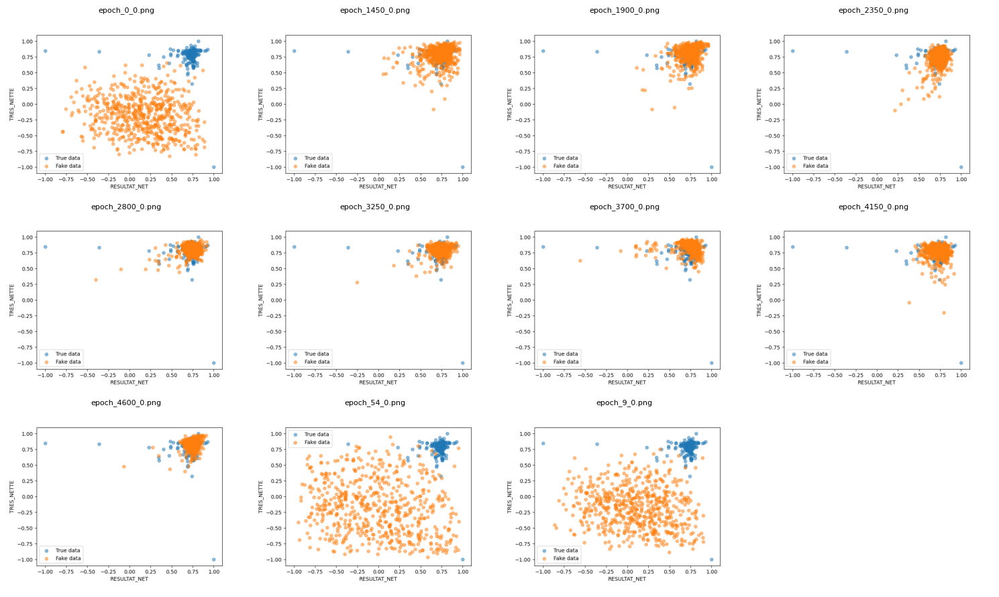

In [104]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def display_images_from_folder(folder_path):
    # Obtenir la liste des fichiers d'images dans le dossier
    image_files = [f for f in os.listdir(folder_path) if f.endswith(('jpg', 'jpeg', 'png', 'bmp', 'gif'))]

    # Sélectionner une image pour chaque tranche de 100 images
    image_files_selected = [image_files[i] for i in range(0, len(image_files), 500)]

    # Calculer le nombre de lignes nécessaires
    num_rows = (len(image_files_selected) + 3) // 4  # Arrondi supérieur de la division par 4

    # Créer une nouvelle figure matplotlib
    fig, axes = plt.subplots(num_rows, 4, figsize=(15, num_rows * 3))

    # Parcourir les fichiers d'images sélectionnés et les afficher sur la figure
    for i, image_file in enumerate(image_files_selected):
        # Ouvrir l'image
        image_path = os.path.join(folder_path, image_file)
        img = Image.open(image_path)

        # Calculer les coordonnées de subplot pour cette image
        row_index = i // 4
        col_index = i % 4

        # Afficher l'image sur le subplot correspondant
        axes[row_index, col_index].imshow(img)
        axes[row_index, col_index].axis('off')  # Désactiver les axes
        
        # Afficher le nom de l'image sous l'image correspondante
        axes[row_index, col_index].set_title(image_file, fontsize=8, pad=2)

    # Masquer les sous-plots restants
    for i in range(len(image_files_selected), num_rows * 4):
        row_index = i // 4
        col_index = i % 4
        axes[row_index, col_index].axis('off')

    # Ajuster automatiquement l'espacement entre les sous-plots
    plt.tight_layout()

    # Afficher la figure
    plt.show()

# Exemple d'utilisation
folder_path = "C:/Users/user/Desktop/STAGE/CODE/Dataframes/Generate_600_defauts_rows/Latent_space=100 le 16-05-2024 13H48M03S"
display_images_from_folder(folder_path)

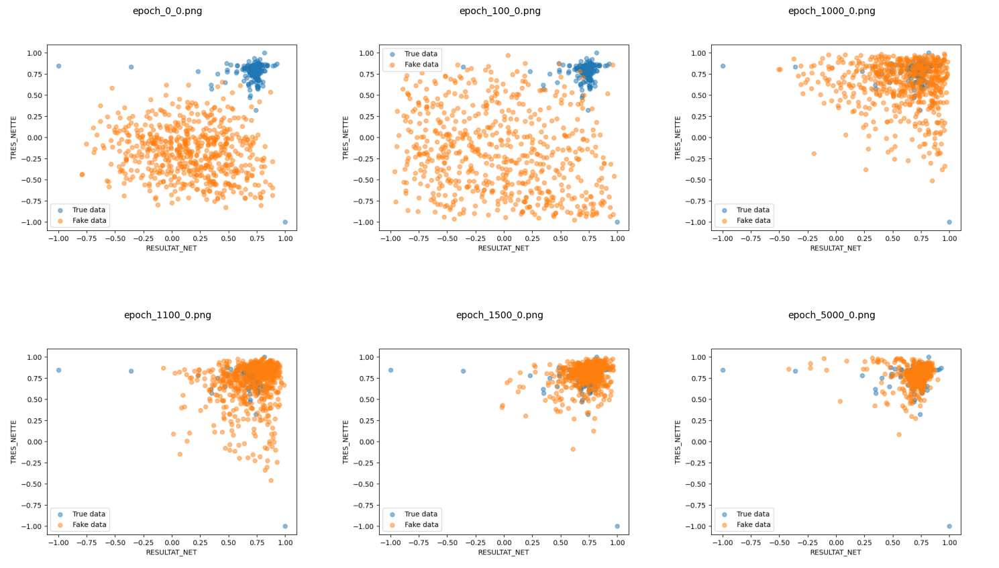

In [105]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def display_images(images_path, image_names):
    # Créer une nouvelle figure matplotlib
    num_images = len(image_names)
    num_rows = (num_images + 2) // 3  # Calculer le nombre de lignes nécessaires
    fig, axes = plt.subplots(num_rows, 3, figsize=(15, num_rows * 5))

    # Parcourir les noms des images et les afficher sur la figure
    for i, image_name in enumerate(image_names):
        # Ouvrir l'image
        image_path = os.path.join(images_path, image_name)
        img = Image.open(image_path)

        # Calculer les coordonnées de subplot pour cette image
        row_index = i // 3
        col_index = i % 3

        # Afficher l'image sur le subplot correspondant
        axes[row_index, col_index].imshow(img)
        axes[row_index, col_index].axis('off')  # Désactiver les axes

        # Afficher le nom de l'image sous l'image correspondante
        axes[row_index, col_index].set_title(image_name, fontsize=10, pad=2)

    # Masquer les sous-plots restants
    for i in range(num_images, num_rows * 3):
        row_index = i // 3
        col_index = i % 3
        axes[row_index, col_index].axis('off')

    # Ajuster automatiquement l'espacement entre les sous-plots
    plt.tight_layout()

    # Afficher la figure
    plt.show()

# Chemin du dossier contenant les images
images_folder = "C:/Users/user/Desktop/STAGE/CODE/Dataframes/Generate_600_defauts_rows/Latent_space=100 le 16-05-2024 13H48M03S"

# Noms des images à afficher
image_names = ['epoch_0_0.png', 'epoch_100_0.png', 'epoch_1000_0.png',
               'epoch_1100_0.png', 'epoch_1500_0.png', 'epoch_5000_0.png']


# Afficher les images
display_images(images_folder, image_names)

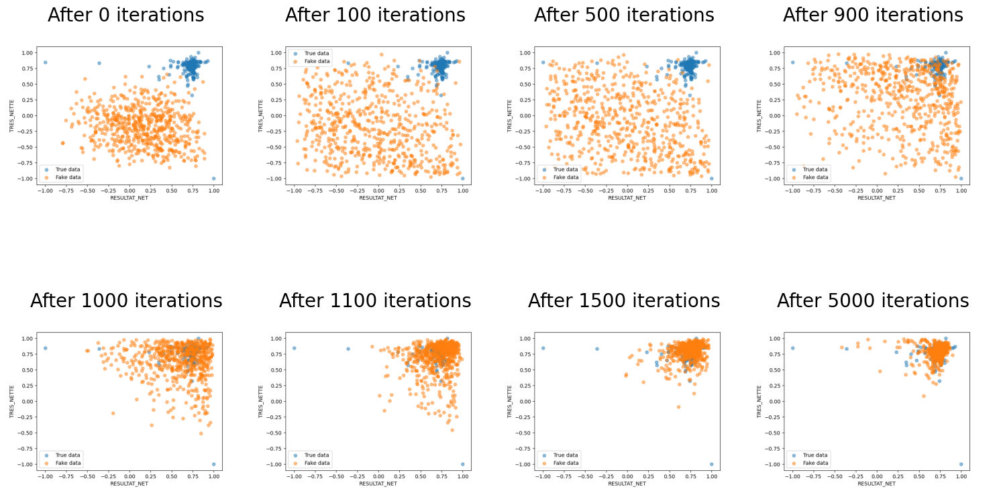

In [106]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def display_images(images_path, image_names):
    # Créer une nouvelle figure matplotlib
    num_images = len(image_names)
    num_rows = (num_images + 2) // 4  # Calculer le nombre de lignes nécessaires
    fig, axes = plt.subplots(num_rows, 4, figsize=(15, num_rows * 5))

    # Parcourir les noms des images et les afficher sur la figure
    for i, image_name in enumerate(image_names):
        # Extraire le nombre d'itérations de l'image
        iterations = int(image_name.split('_')[1])  # Le nombre est entre le premier et le deuxième '_'

        # Ouvrir l'image
        image_path = os.path.join(images_path, image_name)
        img = Image.open(image_path)

        # Calculer les coordonnées de subplot pour cette image
        row_index = i // 4
        col_index = i % 4

        # Afficher l'image sur le subplot correspondant
        axes[row_index, col_index].imshow(img)
        axes[row_index, col_index].axis('off')  # Désactiver les axes

        # Afficher le nom de l'image sous l'image correspondante
        axes[row_index, col_index].set_title(f"After {iterations} iterations", fontsize=20, pad=2)

    # Masquer les sous-plots restants
    for i in range(num_images, num_rows * 4):
        row_index = i // 4
        col_index = i % 4
        axes[row_index, col_index].axis('off')

    # Ajuster automatiquement l'espacement entre les sous-plots
    plt.tight_layout()

    # Afficher la figure
    plt.show()

# Chemin du dossier contenant les images
images_folder = "C:/Users/user/Desktop/STAGE/CODE/Dataframes/Generate_600_defauts_rows/Latent_space=100 le 16-05-2024 13H48M03S"

# Noms des images à afficher
image_names = ['epoch_0_0.png', 'epoch_100_0.png','epoch_500_0.png','epoch_900_0.png', 'epoch_1000_0.png',
               'epoch_1100_0.png', 'epoch_1500_0.png','epoch_5000_0.png']


# Afficher les images
display_images(images_folder, image_names)

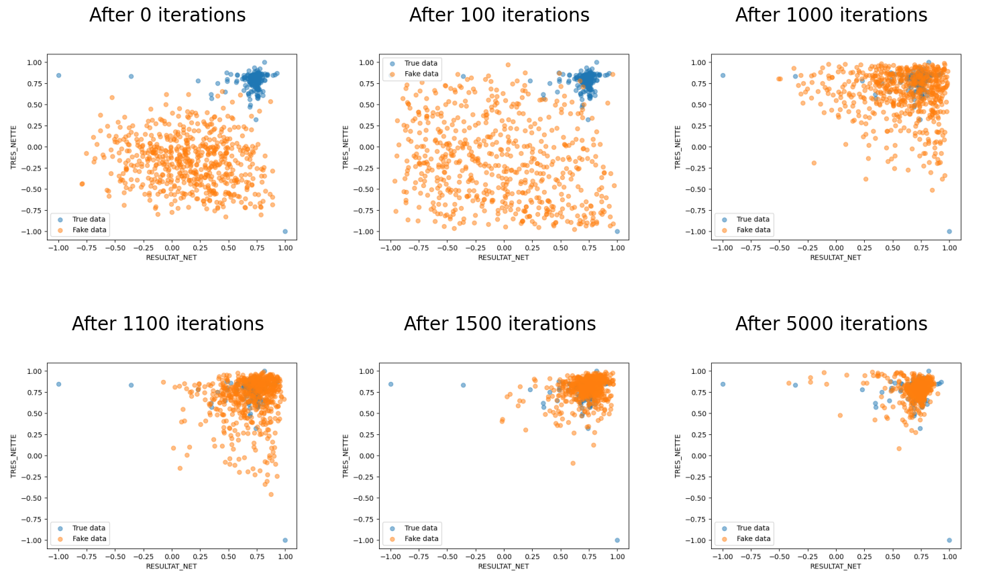

In [107]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def display_images(images_path, image_names):
    # Créer une nouvelle figure matplotlib
    num_images = len(image_names)
    num_rows = (num_images + 2) // 3  # Calculer le nombre de lignes nécessaires
    fig, axes = plt.subplots(num_rows, 3, figsize=(15, num_rows * 5))

    # Parcourir les noms des images et les afficher sur la figure
    for i, image_name in enumerate(image_names):
        # Extraire le nombre d'itérations de l'image
        iterations = int(image_name.split('_')[1])  # Le nombre est entre le premier et le deuxième '_'

        # Ouvrir l'image
        image_path = os.path.join(images_path, image_name)
        img = Image.open(image_path)

        # Calculer les coordonnées de subplot pour cette image
        row_index = i // 3
        col_index = i % 3

        # Afficher l'image sur le subplot correspondant
        axes[row_index, col_index].imshow(img)
        axes[row_index, col_index].axis('off')  # Désactiver les axes

        # Afficher le nom de l'image sous l'image correspondante
        axes[row_index, col_index].set_title(f"After {iterations} iterations", fontsize=20, pad=2)

    # Masquer les sous-plots restants
    for i in range(num_images, num_rows * 3):
        row_index = i // 3
        col_index = i % 3
        axes[row_index, col_index].axis('off')

    # Ajuster automatiquement l'espacement entre les sous-plots
    plt.tight_layout()

    # Afficher la figure
    plt.show()

# Chemin du dossier contenant les images
images_folder = "C:/Users/user/Desktop/STAGE/CODE/Dataframes/Generate_600_defauts_rows/Latent_space=100 le 16-05-2024 13H48M03S"

# Noms des images à afficher
image_names = ['epoch_0_0.png', 'epoch_100_0.png', 'epoch_1000_0.png',
               'epoch_1100_0.png', 'epoch_1500_0.png', 'epoch_5000_0.png']

# Afficher les images
display_images(images_folder, image_names)

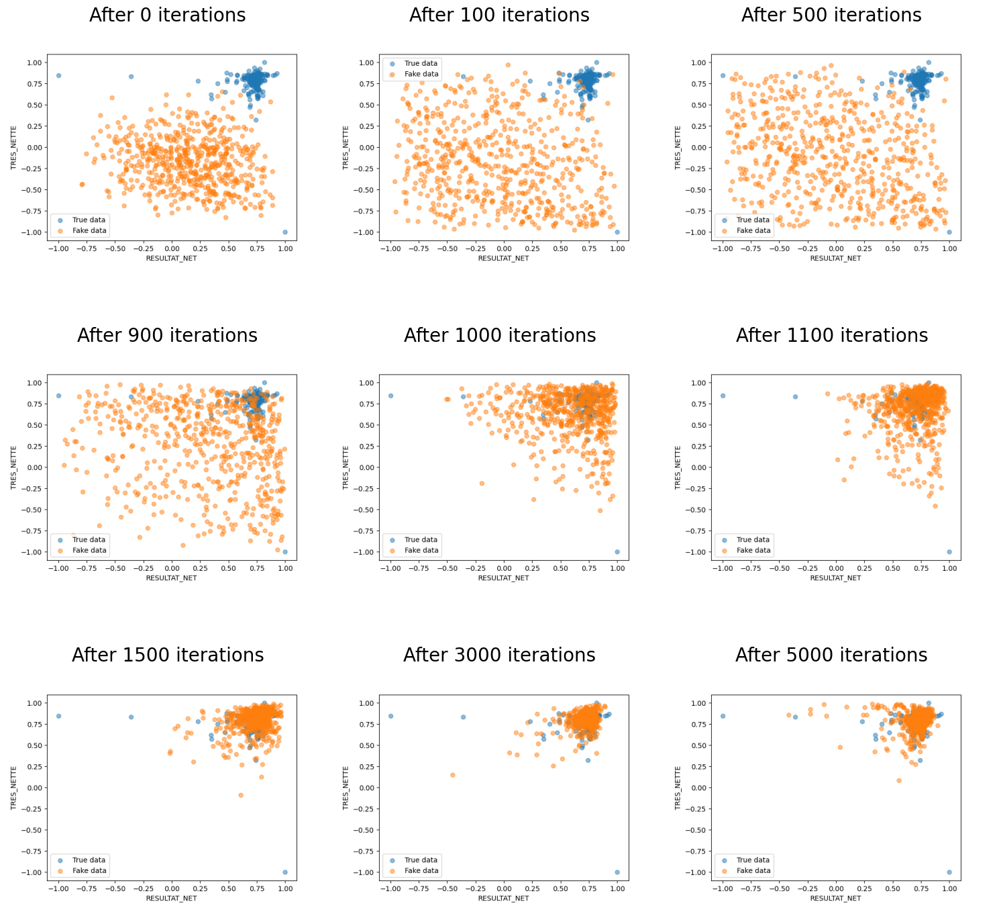

In [108]:
# Noms des images à afficher
image_names_presentation = ['epoch_0_0.png', 'epoch_100_0.png','epoch_500_0.png','epoch_900_0.png', 'epoch_1000_0.png',
               'epoch_1100_0.png', 'epoch_1500_0.png','epoch_3000_0.png', 'epoch_5000_0.png']

# Afficher les images
display_images(images_folder, image_names_presentation)

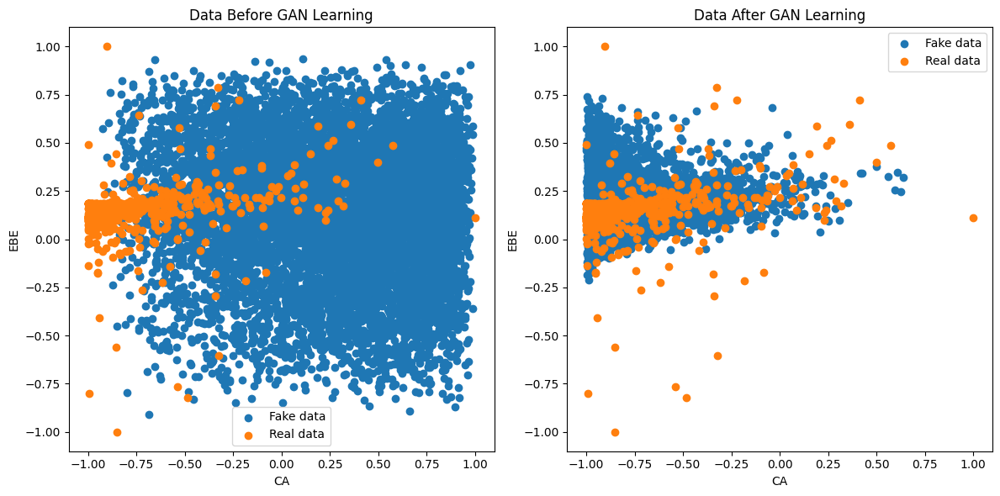

In [481]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming the necessary data is loaded into these variables:
# Array_GAN_first_Learning, Array_GAN_After_Learning, defauts_after_encoding_array, defauts_after_encoding

# Plotting the first set of data
plt.figure(figsize=(12, 6))

# First subplot
plt.subplot(1, 2, 1)
feature_1 = 'CA'
feature_2 = 'EBE'
feature_1_index = np.where(defauts_after_encoding.columns == feature_1)[0][0]
feature_2_index = np.where(defauts_after_encoding.columns == feature_2)[0][0] 
plt.scatter(Array_GAN_first_Learning[:, feature_1_index], Array_GAN_first_Learning[:, feature_2_index], label='Fake data')
plt.scatter(defauts_after_encoding_array[:, feature_1_index], defauts_after_encoding_array[:, feature_2_index], label='Real data')
plt.xlabel(feature_1)
plt.ylabel(feature_2)
plt.legend()
plt.title('Data Before GAN Learning')

# Second subplot
plt.subplot(1, 2, 2)
feature_1 = 'CA'
feature_2 = 'EBE'
feature_1_index = np.where(defauts_after_encoding.columns == feature_1)[0][0]
feature_2_index = np.where(defauts_after_encoding.columns == feature_2)[0][0] 
plt.scatter(Array_GAN_After_Learning[:, feature_1_index], Array_GAN_After_Learning[:, feature_2_index], label='Fake data')
plt.scatter(defauts_after_encoding_array[:, feature_1_index], defauts_after_encoding_array[:, feature_2_index], label='Real data')
plt.xlabel(feature_1)
plt.ylabel(feature_2)
plt.legend()
plt.title('Data After GAN Learning')

# Display the plots
plt.tight_layout()
plt.show()

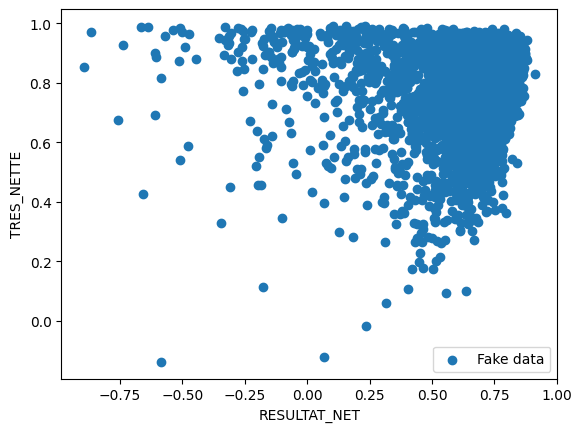

In [482]:
# Pour afficher les données générées 
feature_1 = 'RESULTAT_NET'
feature_2 = 'TRES_NETTE'
feature_1_index = np.where(defauts_after_encoding.columns == feature_1)[0][0]
feature_2_index = np.where(defauts_after_encoding.columns == feature_2)[0][0] 
plt.scatter(Array_GAN_After_Learning[:, feature_1_index], Array_GAN_After_Learning[:, feature_2_index], label='Fake data')
plt.xlabel(feature_1)
plt.ylabel(feature_2)
plt.legend()

In [483]:
# Decision discriminator pour chaque row juste pour voir l'exactitude des données 
#decision = discriminator_defaut(Array_GAN_After_Learning, training=False)
#decision_RealGAN_Data(decision,thershold=0)

#### Convert array générées to dataframe

In [484]:
df_GAN_After_Learning=array_to_dataframe_original_values(Array_GAN_After_Learning,defauts_before_encoding)
df_GAN_After_Learning

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,moyenne_mvt_deb,moyenne_mvt_crd,SEC_ACTIVITE,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER
0,2018.246094,9029169.0,2259952.0,-7545848.0,-1684416.0,124207584.0,33648256.0,19847216.0,-55726752.0,-10074432.0,...,155.306931,1.165469,173.682648,5.647442,6.380081e-04,1.698732e-06,11.235747,23.884674,15.279221,39.468872
1,2016.575317,4001062.0,-4900012.0,-19817104.0,-6142928.0,-121348784.0,-100058144.0,139121536.0,-105841760.0,-27045664.0,...,1.877974,0.045178,165.708923,5.623359,5.364418e-07,9.999998e-01,5.155880,19.231415,8.857102,47.616905
2,2019.267944,6324522.0,-5296172.0,-16728112.0,-10172096.0,-2760416.0,180831040.0,55371008.0,10781664.0,-65616800.0,...,42.683395,1.123710,167.861023,4.544621,1.062825e-02,2.482563e-02,10.338106,38.465778,35.953201,39.403938
3,2017.732666,41297724.0,4737200.0,8769384.0,6265584.0,50502560.0,56825840.0,42267904.0,2586560.0,-54009056.0,...,111.237846,9.770894,58.508671,7.444239,2.863526e-03,9.920620e-01,7.798184,14.495866,18.274593,64.845840
4,2017.592285,28826572.0,8347000.0,-16201160.0,13277104.0,-96704968.0,99401536.0,-59109024.0,58910048.0,14856480.0,...,30.435040,0.005250,43.841911,6.058011,1.996756e-06,0.000000e+00,1.586001,15.614800,14.188169,63.857674
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8530,2016.391113,37868344.0,-494628.0,5405256.0,-11725184.0,-16675392.0,-28768864.0,31926832.0,-44031760.0,-38049632.0,...,33.962154,0.756548,99.983131,5.869663,1.406670e-04,9.996958e-01,7.624580,26.917580,22.022989,58.343300
8531,2016.133545,20783900.0,15466668.0,-23006328.0,-7763040.0,-78967272.0,217337728.0,-114600496.0,74423712.0,33755808.0,...,5.676054,0.000733,62.894260,5.382417,3.278255e-07,0.000000e+00,2.234286,10.729160,10.800699,40.809296
8532,2018.971313,11161574.0,1710012.0,-6252216.0,-4215696.0,30655632.0,-29230480.0,-10390352.0,-38703760.0,-438528.0,...,53.143051,0.689513,167.595810,5.639025,6.958842e-05,7.450581e-07,11.769138,8.124009,6.736030,49.326382
8533,2019.296387,20264230.0,930912.0,-7769416.0,-3702144.0,-58917056.0,106848384.0,-23667232.0,112750048.0,-16552000.0,...,27.211573,0.151285,178.489609,5.123032,3.235936e-04,3.409386e-05,11.867708,23.404606,12.035771,59.636173


In [485]:
df_GAN_After_Learning.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8535 entries, 0 to 8534
Data columns (total 36 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Annee                             8535 non-null   float32
 1   CA                                8535 non-null   float32
 2   EBE                               8535 non-null   float32
 3   RESULTAT_EXP                      8535 non-null   float32
 4   RESULTAT_NET                      8535 non-null   float32
 5   FINAN_PERM                        8535 non-null   float32
 6   FDR                               8535 non-null   float32
 7   BFR                               8535 non-null   float32
 8   K_PROPRES                         8535 non-null   float32
 9   TRES_NETTE                        8535 non-null   float32
 10  TOT_BILAN                         8535 non-null   float32
 11  DETTE_FINAN                       8535 non-null   float32
 12  ACTIF_

### Data preparation (Data generated)

In [486]:
df_GEN=df_GAN_After_Learning.copy()
df_GEN['Annee'] = df_GEN['Annee'].apply(round)

In [487]:
df_GEN

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,moyenne_mvt_deb,moyenne_mvt_crd,SEC_ACTIVITE,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER
0,2018,9029169.0,2259952.0,-7545848.0,-1684416.0,124207584.0,33648256.0,19847216.0,-55726752.0,-10074432.0,...,155.306931,1.165469,173.682648,5.647442,6.380081e-04,1.698732e-06,11.235747,23.884674,15.279221,39.468872
1,2017,4001062.0,-4900012.0,-19817104.0,-6142928.0,-121348784.0,-100058144.0,139121536.0,-105841760.0,-27045664.0,...,1.877974,0.045178,165.708923,5.623359,5.364418e-07,9.999998e-01,5.155880,19.231415,8.857102,47.616905
2,2019,6324522.0,-5296172.0,-16728112.0,-10172096.0,-2760416.0,180831040.0,55371008.0,10781664.0,-65616800.0,...,42.683395,1.123710,167.861023,4.544621,1.062825e-02,2.482563e-02,10.338106,38.465778,35.953201,39.403938
3,2018,41297724.0,4737200.0,8769384.0,6265584.0,50502560.0,56825840.0,42267904.0,2586560.0,-54009056.0,...,111.237846,9.770894,58.508671,7.444239,2.863526e-03,9.920620e-01,7.798184,14.495866,18.274593,64.845840
4,2018,28826572.0,8347000.0,-16201160.0,13277104.0,-96704968.0,99401536.0,-59109024.0,58910048.0,14856480.0,...,30.435040,0.005250,43.841911,6.058011,1.996756e-06,0.000000e+00,1.586001,15.614800,14.188169,63.857674
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8530,2016,37868344.0,-494628.0,5405256.0,-11725184.0,-16675392.0,-28768864.0,31926832.0,-44031760.0,-38049632.0,...,33.962154,0.756548,99.983131,5.869663,1.406670e-04,9.996958e-01,7.624580,26.917580,22.022989,58.343300
8531,2016,20783900.0,15466668.0,-23006328.0,-7763040.0,-78967272.0,217337728.0,-114600496.0,74423712.0,33755808.0,...,5.676054,0.000733,62.894260,5.382417,3.278255e-07,0.000000e+00,2.234286,10.729160,10.800699,40.809296
8532,2019,11161574.0,1710012.0,-6252216.0,-4215696.0,30655632.0,-29230480.0,-10390352.0,-38703760.0,-438528.0,...,53.143051,0.689513,167.595810,5.639025,6.958842e-05,7.450581e-07,11.769138,8.124009,6.736030,49.326382
8533,2019,20264230.0,930912.0,-7769416.0,-3702144.0,-58917056.0,106848384.0,-23667232.0,112750048.0,-16552000.0,...,27.211573,0.151285,178.489609,5.123032,3.235936e-04,3.409386e-05,11.867708,23.404606,12.035771,59.636173


In [488]:
from datetime import datetime, timedelta

# Définition de la fonction pour convertir la période en date
def convertir_periode_en_date_reference(periode_annees, date_reference):
    # Définition de la fonction interne pour convertir une seule période en date
    def convertir(periode_annees):
        # Convertir la période en années en un nombre flottant
        annees = periode_annees
        # Diviser les années en années et mois
        annees_entieres = int(annees)
        mois_supplementaires = int((annees - annees_entieres) * 12)
        
        # Ajouter les années et les mois à la date de référence
        date_finale = datetime.strptime(date_reference, '%d/%m/%Y') - timedelta(days=annees_entieres * 365 + mois_supplementaires * 30)
        
        return date_finale.strftime('%d/%m/%Y')

    # Appliquer la fonction interne à chaque élément de la série de périodes
    
    return periode_annees.apply(convertir)

In [489]:
import pandas as pd
from datetime import datetime, timedelta



# Define the function to convert the period to date
def convertir_periode_en_date(df, period_col, year_col):
    # Internal function to convert a single period and reference date to final date
    def convertir(row):
        # Extract period in years and the reference date
        periode_annees = row[period_col]
        #date_reference = f"31/12/{int(row[year_col])}"  # Ensure year is an integer and convert to string
        date_reference = "31/12/2023"

        # Convert the reference date to datetime
        date_reference = datetime.strptime(date_reference, '%d/%m/%Y')
        
        # Convert the period to years and months
        annees_entieres = int(periode_annees)
        mois_supplementaires = int((periode_annees - annees_entieres) * 12)
        
        # Subtract the period from the reference date
        date_finale = date_reference - timedelta(days=annees_entieres * 365 + mois_supplementaires * 30)
        
        return date_finale.strftime('%d/%m/%Y')
    
    # Apply the internal function to each row
    return df.apply(convertir, axis=1)

In [490]:
df_GEN['DATE_DE_CREATION_ENTREP'] = convertir_periode_en_date(df_GEN,'PERIODE_DE_CREATION_ENTREP',"Annee")
df_GEN['DATE_DE_CREATION_TIERS'] = convertir_periode_en_date(df_GEN,'PERIODE_DE_CREATION_TIERS',"Annee" )
df_GEN['DAT_NAI_GER'] = convertir_periode_en_date(df_GEN,'Age_GER',"Annee")


In [491]:
df_GEN

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER,DATE_DE_CREATION_ENTREP,DATE_DE_CREATION_TIERS,DAT_NAI_GER
0,2018,9029169.0,2259952.0,-7545848.0,-1684416.0,124207584.0,33648256.0,19847216.0,-55726752.0,-10074432.0,...,5.647442,6.380081e-04,1.698732e-06,11.235747,23.884674,15.279221,39.468872,11/03/2000,05/10/2008,12/08/1984
1,2017,4001062.0,-4900012.0,-19817104.0,-6142928.0,-121348784.0,-100058144.0,139121536.0,-105841760.0,-27045664.0,...,5.623359,5.364418e-07,9.999998e-01,5.155880,19.231415,8.857102,47.616905,05/11/2004,08/03/2015,15/06/1976
2,2019,6324522.0,-5296172.0,-16728112.0,-10172096.0,-2760416.0,180831040.0,55371008.0,10781664.0,-65616800.0,...,4.544621,1.062825e-02,2.482563e-02,10.338106,38.465778,35.953201,39.403938,12/08/1985,13/02/1988,11/09/1984
3,2018,41297724.0,4737200.0,8769384.0,6265584.0,50502560.0,56825840.0,42267904.0,2586560.0,-54009056.0,...,7.444239,2.863526e-03,9.920620e-01,7.798184,14.495866,18.274593,64.845840,06/08/2009,06/10/2005,22/03/1959
4,2018,28826572.0,8347000.0,-16201160.0,13277104.0,-96704968.0,99401536.0,-59109024.0,58910048.0,14856480.0,...,6.058011,1.996756e-06,0.000000e+00,1.586001,15.614800,14.188169,63.857674,07/06/2008,04/11/2009,21/03/1960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8530,2016,37868344.0,-494628.0,5405256.0,-11725184.0,-16675392.0,-28768864.0,31926832.0,-44031760.0,-38049632.0,...,5.869663,1.406670e-04,9.996958e-01,7.624580,26.917580,22.022989,58.343300,10/02/1997,05/01/2002,16/09/1965
8531,2016,20783900.0,15466668.0,-23006328.0,-7763040.0,-78967272.0,217337728.0,-114600496.0,74423712.0,33755808.0,...,5.382417,3.278255e-07,0.000000e+00,2.234286,10.729160,10.800699,40.809296,07/05/2013,07/04/2013,15/04/1983
8532,2019,11161574.0,1710012.0,-6252216.0,-4215696.0,30655632.0,-29230480.0,-10390352.0,-38703760.0,-438528.0,...,5.639025,6.958842e-05,7.450581e-07,11.769138,8.124009,6.736030,49.326382,03/12/2015,06/05/2017,14/10/1974
8533,2019,20264230.0,930912.0,-7769416.0,-3702144.0,-58917056.0,106848384.0,-23667232.0,112750048.0,-16552000.0,...,5.123032,3.235936e-04,3.409386e-05,11.867708,23.404606,12.035771,59.636173,07/09/2000,03/01/2012,18/06/1964


In [492]:
import math
#columns_to_encode = ['SEC_ACTIVITE', 'CATEGORIE_JUR', 'Secteurs2']

# Appliquer la fonction round pour avoir des valeurs arrondi
df_GEN['Flag_client_cote'] = df_GEN['Flag_client_cote'].apply(round)
df_GEN['Flag_groupe'] = df_GEN['Flag_groupe'].apply(round)
df_GEN[columns_to_encode] = df_GEN[columns_to_encode].apply(round).astype(int)
#df_GEN['PERIODE_DE_CREATION_ENTREP']=df_GEN['PERIODE_DE_CREATION_ENTREP'].apply(round)
#df_GEN['PERIODE_DE_CREATION_TIERS']=df_GEN['PERIODE_DE_CREATION_TIERS'].apply(round)
#df_GEN['Age_GER']=df_GEN['Age_GER'].apply(round)

In [493]:
df_GEN

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER,DATE_DE_CREATION_ENTREP,DATE_DE_CREATION_TIERS,DAT_NAI_GER
0,2018,9029169.0,2259952.0,-7545848.0,-1684416.0,124207584.0,33648256.0,19847216.0,-55726752.0,-10074432.0,...,6,0,0,11,23.884674,15.279221,39.468872,11/03/2000,05/10/2008,12/08/1984
1,2017,4001062.0,-4900012.0,-19817104.0,-6142928.0,-121348784.0,-100058144.0,139121536.0,-105841760.0,-27045664.0,...,6,0,1,5,19.231415,8.857102,47.616905,05/11/2004,08/03/2015,15/06/1976
2,2019,6324522.0,-5296172.0,-16728112.0,-10172096.0,-2760416.0,180831040.0,55371008.0,10781664.0,-65616800.0,...,5,0,0,10,38.465778,35.953201,39.403938,12/08/1985,13/02/1988,11/09/1984
3,2018,41297724.0,4737200.0,8769384.0,6265584.0,50502560.0,56825840.0,42267904.0,2586560.0,-54009056.0,...,7,0,1,8,14.495866,18.274593,64.845840,06/08/2009,06/10/2005,22/03/1959
4,2018,28826572.0,8347000.0,-16201160.0,13277104.0,-96704968.0,99401536.0,-59109024.0,58910048.0,14856480.0,...,6,0,0,2,15.614800,14.188169,63.857674,07/06/2008,04/11/2009,21/03/1960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8530,2016,37868344.0,-494628.0,5405256.0,-11725184.0,-16675392.0,-28768864.0,31926832.0,-44031760.0,-38049632.0,...,6,0,1,8,26.917580,22.022989,58.343300,10/02/1997,05/01/2002,16/09/1965
8531,2016,20783900.0,15466668.0,-23006328.0,-7763040.0,-78967272.0,217337728.0,-114600496.0,74423712.0,33755808.0,...,5,0,0,2,10.729160,10.800699,40.809296,07/05/2013,07/04/2013,15/04/1983
8532,2019,11161574.0,1710012.0,-6252216.0,-4215696.0,30655632.0,-29230480.0,-10390352.0,-38703760.0,-438528.0,...,6,0,0,12,8.124009,6.736030,49.326382,03/12/2015,06/05/2017,14/10/1974
8533,2019,20264230.0,930912.0,-7769416.0,-3702144.0,-58917056.0,106848384.0,-23667232.0,112750048.0,-16552000.0,...,5,0,0,12,23.404606,12.035771,59.636173,07/09/2000,03/01/2012,18/06/1964


In [494]:
df_GEN["DAT_NAI_GER"]

0       12/08/1984
1       15/06/1976
2       11/09/1984
3       22/03/1959
4       21/03/1960
           ...    
8530    16/09/1965
8531    15/04/1983
8532    14/10/1974
8533    18/06/1964
8534    15/02/1980
Name: DAT_NAI_GER, Length: 8535, dtype: object

In [495]:
df_GEN["Défaut"]=1

In [496]:
df_GEN

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,Flag_client_cote,Flag_groupe,Secteurs2,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER,DATE_DE_CREATION_ENTREP,DATE_DE_CREATION_TIERS,DAT_NAI_GER,Défaut
0,2018,9029169.0,2259952.0,-7545848.0,-1684416.0,124207584.0,33648256.0,19847216.0,-55726752.0,-10074432.0,...,0,0,11,23.884674,15.279221,39.468872,11/03/2000,05/10/2008,12/08/1984,1
1,2017,4001062.0,-4900012.0,-19817104.0,-6142928.0,-121348784.0,-100058144.0,139121536.0,-105841760.0,-27045664.0,...,0,1,5,19.231415,8.857102,47.616905,05/11/2004,08/03/2015,15/06/1976,1
2,2019,6324522.0,-5296172.0,-16728112.0,-10172096.0,-2760416.0,180831040.0,55371008.0,10781664.0,-65616800.0,...,0,0,10,38.465778,35.953201,39.403938,12/08/1985,13/02/1988,11/09/1984,1
3,2018,41297724.0,4737200.0,8769384.0,6265584.0,50502560.0,56825840.0,42267904.0,2586560.0,-54009056.0,...,0,1,8,14.495866,18.274593,64.845840,06/08/2009,06/10/2005,22/03/1959,1
4,2018,28826572.0,8347000.0,-16201160.0,13277104.0,-96704968.0,99401536.0,-59109024.0,58910048.0,14856480.0,...,0,0,2,15.614800,14.188169,63.857674,07/06/2008,04/11/2009,21/03/1960,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8530,2016,37868344.0,-494628.0,5405256.0,-11725184.0,-16675392.0,-28768864.0,31926832.0,-44031760.0,-38049632.0,...,0,1,8,26.917580,22.022989,58.343300,10/02/1997,05/01/2002,16/09/1965,1
8531,2016,20783900.0,15466668.0,-23006328.0,-7763040.0,-78967272.0,217337728.0,-114600496.0,74423712.0,33755808.0,...,0,0,2,10.729160,10.800699,40.809296,07/05/2013,07/04/2013,15/04/1983,1
8532,2019,11161574.0,1710012.0,-6252216.0,-4215696.0,30655632.0,-29230480.0,-10390352.0,-38703760.0,-438528.0,...,0,0,12,8.124009,6.736030,49.326382,03/12/2015,06/05/2017,14/10/1974,1
8533,2019,20264230.0,930912.0,-7769416.0,-3702144.0,-58917056.0,106848384.0,-23667232.0,112750048.0,-16552000.0,...,0,0,12,23.404606,12.035771,59.636173,07/09/2000,03/01/2012,18/06/1964,1


In [497]:
df_GEN[columns_to_encode].dtypes

SEC_ACTIVITE     int32
CATEGORIE_JUR    int32
Secteurs2        int32
dtype: object

In [498]:
df_GEN["Défaut"].value_counts()

Défaut
1    8535
Name: count, dtype: int64

In [499]:
df_GEN["Annee"].value_counts()

Annee
2016    2354
2017    2179
2019    1473
2018    1417
2020    1112
Name: count, dtype: int64

In [500]:
df[df["Défaut"]==1]["Annee"].value_counts()

Annee
2016    155
2019    115
2018    112
2017    105
2020    101
Name: count, dtype: int64

In [501]:
df[df["Défaut"]==0]["Annee"].value_counts()

Annee
2017    2200
2016    2192
2018    2118
2019    1734
2020     879
Name: count, dtype: int64

In [502]:
df_Before_GAN=df.copy()
#df_Before_GAN

In [503]:
df_Before_GAN

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,DAT_NAI_GER,SEC_ACTIVITE,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,Défaut,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER
0,2017,27209244.29,1243534.60,964250.29,225538.69,4335258.76,4335258.76,7803888.80,4335258.76,-3468630.04,...,1961-01-01,3,6,0,0,2,0,22.890411,18.054795,63.038356
1,2018,17401718.12,874156.43,634975.42,286005.55,4621264.31,4621264.31,7861023.65,4621264.31,-3239759.34,...,1961-01-01,3,6,0,0,2,0,22.890411,18.054795,63.038356
2,2016,24109436.43,753869.48,426626.06,210857.98,4109720.08,4109720.08,9794792.31,4109720.08,-5685072.23,...,1961-01-01,3,6,0,0,2,0,22.890411,18.054795,63.038356
3,2016,31195868.50,5209063.92,4343626.96,3040536.96,7306476.76,7306476.76,7147534.46,7306476.76,158942.30,...,1968-01-25,19,6,0,0,2,1,15.679452,15.597260,55.967123
4,2019,28290515.52,6309036.96,4975869.22,3169470.28,24322628.66,24309159.29,8861455.59,24322628.66,15447703.70,...,1933-01-12,98,6,0,0,3,0,42.600000,42.717808,91.027397
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9706,2020,17039000.00,-3501000.00,-9970000.00,-12313000.00,83153000.00,67209000.00,88453000.00,21931000.00,-21244000.00,...,1968-01-25,111,4,0,0,7,0,9.460274,4.709589,55.967123
9707,2017,21802317.68,-332377.54,-1010307.33,-3418023.48,7090079.10,3672055.62,4843489.08,-2418023.48,-1171433.46,...,1953-01-01,37,7,0,0,1,0,23.263014,4.684932,71.043836
9708,2020,36863000.00,1224000.00,656000.00,79000.00,16889000.00,16889000.00,14488000.00,12299000.00,2401000.00,...,1964-02-22,163,6,0,0,2,0,13.109589,4.635616,59.895890
9709,2020,11741000.00,-154000.00,-216000.00,-410000.00,1998000.00,1588000.00,4173000.00,1513000.00,-2585000.00,...,1973-11-20,42,7,0,0,2,0,8.876712,4.594521,50.145205


In [504]:
df_Before_GAN["Annee"].value_counts()

Annee
2016    2347
2017    2305
2018    2230
2019    1849
2020     980
Name: count, dtype: int64

In [505]:
# Concatenate the DataFrames along rows (vertically)
df_totale = pd.concat([df_GEN, df_Before_GAN])

# Print the concatenated DataFrame
df_totale

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,Flag_client_cote,Flag_groupe,Secteurs2,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER,DATE_DE_CREATION_ENTREP,DATE_DE_CREATION_TIERS,DAT_NAI_GER,Défaut
0,2018,9029169.00,2259952.00,-7545848.00,-1684416.00,124207584.0,3.364826e+07,1.984722e+07,-5.572675e+07,-10074432.00,...,0,0,11,23.884674,15.279221,39.468872,11/03/2000,05/10/2008,12/08/1984,1
1,2017,4001062.00,-4900012.00,-19817104.00,-6142928.00,-121348784.0,-1.000581e+08,1.391215e+08,-1.058418e+08,-27045664.00,...,0,1,5,19.231415,8.857102,47.616905,05/11/2004,08/03/2015,15/06/1976,1
2,2019,6324522.00,-5296172.00,-16728112.00,-10172096.00,-2760416.0,1.808310e+08,5.537101e+07,1.078166e+07,-65616800.00,...,0,0,10,38.465778,35.953201,39.403938,12/08/1985,13/02/1988,11/09/1984,1
3,2018,41297724.00,4737200.00,8769384.00,6265584.00,50502560.0,5.682584e+07,4.226790e+07,2.586560e+06,-54009056.00,...,0,1,8,14.495866,18.274593,64.845840,06/08/2009,06/10/2005,22/03/1959,1
4,2018,28826572.00,8347000.00,-16201160.00,13277104.00,-96704968.0,9.940154e+07,-5.910902e+07,5.891005e+07,14856480.00,...,0,0,2,15.614800,14.188169,63.857674,07/06/2008,04/11/2009,21/03/1960,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9706,2020,17039000.00,-3501000.00,-9970000.00,-12313000.00,83153000.0,6.720900e+07,8.845300e+07,2.193100e+07,-21244000.00,...,0,0,7,9.460274,4.709589,55.967123,2014-07-18 00:00:00,2019-04-17 00:00:00,1968-01-25 00:00:00,0
9707,2017,21802317.68,-332377.54,-1010307.33,-3418023.48,7090079.1,3.672056e+06,4.843489e+06,-2.418023e+06,-1171433.46,...,0,0,1,23.263014,4.684932,71.043836,2000-10-01 00:00:00,2019-04-26 00:00:00,1953-01-01 00:00:00,0
9708,2020,36863000.00,1224000.00,656000.00,79000.00,16889000.0,1.688900e+07,1.448800e+07,1.229900e+07,2401000.00,...,0,0,2,13.109589,4.635616,59.895890,2010-11-24 00:00:00,2019-05-14 00:00:00,1964-02-22 00:00:00,0
9709,2020,11741000.00,-154000.00,-216000.00,-410000.00,1998000.0,1.588000e+06,4.173000e+06,1.513000e+06,-2585000.00,...,0,0,2,8.876712,4.594521,50.145205,2015-02-16 00:00:00,2019-05-29 00:00:00,1973-11-20 00:00:00,0


In [506]:
defauts_after_encoding

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,moyenne_mvt_deb,moyenne_mvt_crd,SEC_ACTIVITE,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER
3,-1.0,-0.744340,0.218026,-0.638710,0.770255,-0.912880,-0.829556,-0.842756,-0.715450,0.849210,...,-1.000000,-1.000000,-0.801047,-0.50,-1.0,-1.0,-0.750,-0.730177,-0.660750,-0.085178
14,0.0,-0.761412,0.149083,-0.656297,0.709999,-0.908030,-0.827255,-0.815572,-0.712808,0.742997,...,-0.941765,-0.998414,-0.905759,-0.50,-1.0,-1.0,0.250,-0.496165,-0.342444,-0.120237
51,-1.0,-0.910092,0.134459,-0.648456,0.751893,-0.914068,-0.831300,-0.842320,-0.717646,0.839816,...,-0.856180,-0.996868,-0.518325,-0.50,-1.0,-1.0,-0.625,-0.692816,-0.611440,-0.085178
86,0.5,-0.908363,0.129467,-0.649044,0.750716,-0.908156,-0.822619,-0.830369,-0.706716,0.826250,...,-0.992672,-0.999593,0.455497,-1.00,-1.0,1.0,-0.250,-0.024344,0.541937,-0.085178
100,1.0,-0.856361,0.112038,-0.653315,0.749834,-0.897800,-0.807413,-0.815244,-0.693476,0.827309,...,-0.713931,-0.986047,0.277487,-0.50,-1.0,-1.0,0.000,0.126293,0.049591,-0.085178
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9652,0.5,-0.906457,0.115934,-0.650740,0.748943,-0.913904,-0.831139,-0.844004,-0.717342,0.847706,...,-0.998168,-1.000000,-0.518325,-0.50,-1.0,-1.0,-0.750,-0.752832,-0.988541,-0.138870
9667,1.0,0.049262,0.342792,-0.620412,0.802452,-0.899125,-0.809621,-0.777581,-0.698056,0.656834,...,-0.929988,-0.996054,0.968586,-0.50,-1.0,-1.0,0.375,-0.875959,-0.993801,-0.172561
9680,0.5,-0.820953,0.122318,-0.650324,0.749966,-0.914121,-0.831379,-0.844367,-0.717744,0.848224,...,-0.982988,-0.999715,-0.518325,-0.50,-1.0,-1.0,-0.750,-0.550482,-0.996994,0.333333
9686,1.0,0.065964,0.197859,-0.639860,0.762575,-0.889881,-0.795783,-0.798175,-0.691271,0.804607,...,-0.837074,-0.966399,0.476440,-0.50,-1.0,-1.0,0.125,-0.960529,-0.999624,-0.085178


### Plot Gan Model

In [507]:
df

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,DAT_NAI_GER,SEC_ACTIVITE,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,Défaut,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER
0,2017,27209244.29,1243534.60,964250.29,225538.69,4335258.76,4335258.76,7803888.80,4335258.76,-3468630.04,...,1961-01-01,3,6,0,0,2,0,22.890411,18.054795,63.038356
1,2018,17401718.12,874156.43,634975.42,286005.55,4621264.31,4621264.31,7861023.65,4621264.31,-3239759.34,...,1961-01-01,3,6,0,0,2,0,22.890411,18.054795,63.038356
2,2016,24109436.43,753869.48,426626.06,210857.98,4109720.08,4109720.08,9794792.31,4109720.08,-5685072.23,...,1961-01-01,3,6,0,0,2,0,22.890411,18.054795,63.038356
3,2016,31195868.50,5209063.92,4343626.96,3040536.96,7306476.76,7306476.76,7147534.46,7306476.76,158942.30,...,1968-01-25,19,6,0,0,2,1,15.679452,15.597260,55.967123
4,2019,28290515.52,6309036.96,4975869.22,3169470.28,24322628.66,24309159.29,8861455.59,24322628.66,15447703.70,...,1933-01-12,98,6,0,0,3,0,42.600000,42.717808,91.027397
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9706,2020,17039000.00,-3501000.00,-9970000.00,-12313000.00,83153000.00,67209000.00,88453000.00,21931000.00,-21244000.00,...,1968-01-25,111,4,0,0,7,0,9.460274,4.709589,55.967123
9707,2017,21802317.68,-332377.54,-1010307.33,-3418023.48,7090079.10,3672055.62,4843489.08,-2418023.48,-1171433.46,...,1953-01-01,37,7,0,0,1,0,23.263014,4.684932,71.043836
9708,2020,36863000.00,1224000.00,656000.00,79000.00,16889000.00,16889000.00,14488000.00,12299000.00,2401000.00,...,1964-02-22,163,6,0,0,2,0,13.109589,4.635616,59.895890
9709,2020,11741000.00,-154000.00,-216000.00,-410000.00,1998000.00,1588000.00,4173000.00,1513000.00,-2585000.00,...,1973-11-20,42,7,0,0,2,0,8.876712,4.594521,50.145205


In [508]:
df.iloc[:,38]

0       18.054795
1       18.054795
2       18.054795
3       15.597260
4       42.717808
          ...    
9706     4.709589
9707     4.684932
9708     4.635616
9709     4.594521
9710     4.580822
Name: PERIODE_DE_CREATION_TIERS, Length: 9711, dtype: float64

<class 'numpy.ndarray'>
Counter({0: 9123, 1: 588})


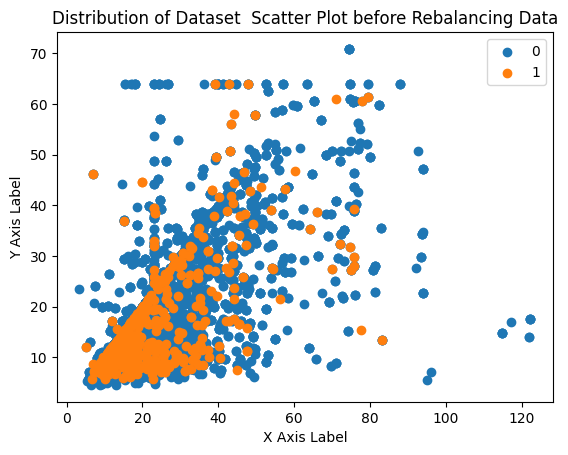

In [514]:
from matplotlib import pyplot 
from collections import Counter
from numpy import where
X1 = df.iloc[:,:40]
Y1 = df.iloc[:,36]
X1 = X1.values
Y1 = Y1.values
print(type(X1))
counter = 0
#o_df = pd.DataFrame()
#for i in list(df_KNN_imputed.columns)[:39]:
#    o_df[i] = X_oversampled[i]
#counter += 1
#o_df["Class"] = Y_oversampled
#df = o_df.copy()
k=Counter(Y1)
print(k)
for label, _ in k.items():
	row_ix = where(Y1 == label)[0]
	#print(row_ix==0)
	#print(row_ix==1)
	#print(type(row_ix))
	pyplot.scatter(X1[row_ix, 37], X1[row_ix, 38],label=str(label))

# Set the title and labels for axes
plt.title('Distribution of Dataset  Scatter Plot before Rebalancing Data')
plt.xlabel('X Axis Label')
plt.ylabel('Y Axis Label')
pyplot.legend()
pyplot.show()



In [515]:
df

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,DAT_NAI_GER,SEC_ACTIVITE,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,Défaut,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER
0,2017,27209244.29,1243534.60,964250.29,225538.69,4335258.76,4335258.76,7803888.80,4335258.76,-3468630.04,...,1961-01-01,3,6,0,0,2,0,22.890411,18.054795,63.038356
1,2018,17401718.12,874156.43,634975.42,286005.55,4621264.31,4621264.31,7861023.65,4621264.31,-3239759.34,...,1961-01-01,3,6,0,0,2,0,22.890411,18.054795,63.038356
2,2016,24109436.43,753869.48,426626.06,210857.98,4109720.08,4109720.08,9794792.31,4109720.08,-5685072.23,...,1961-01-01,3,6,0,0,2,0,22.890411,18.054795,63.038356
3,2016,31195868.50,5209063.92,4343626.96,3040536.96,7306476.76,7306476.76,7147534.46,7306476.76,158942.30,...,1968-01-25,19,6,0,0,2,1,15.679452,15.597260,55.967123
4,2019,28290515.52,6309036.96,4975869.22,3169470.28,24322628.66,24309159.29,8861455.59,24322628.66,15447703.70,...,1933-01-12,98,6,0,0,3,0,42.600000,42.717808,91.027397
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9706,2020,17039000.00,-3501000.00,-9970000.00,-12313000.00,83153000.00,67209000.00,88453000.00,21931000.00,-21244000.00,...,1968-01-25,111,4,0,0,7,0,9.460274,4.709589,55.967123
9707,2017,21802317.68,-332377.54,-1010307.33,-3418023.48,7090079.10,3672055.62,4843489.08,-2418023.48,-1171433.46,...,1953-01-01,37,7,0,0,1,0,23.263014,4.684932,71.043836
9708,2020,36863000.00,1224000.00,656000.00,79000.00,16889000.00,16889000.00,14488000.00,12299000.00,2401000.00,...,1964-02-22,163,6,0,0,2,0,13.109589,4.635616,59.895890
9709,2020,11741000.00,-154000.00,-216000.00,-410000.00,1998000.00,1588000.00,4173000.00,1513000.00,-2585000.00,...,1973-11-20,42,7,0,0,2,0,8.876712,4.594521,50.145205


<class 'numpy.ndarray'>
Counter({0: 8932, 1: 588})


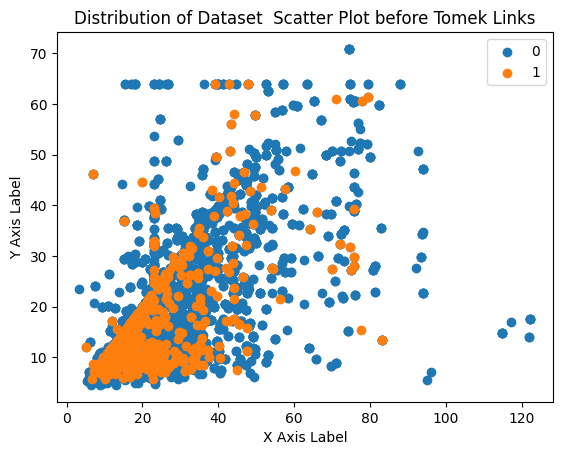

In [521]:
import pandas as pd
from imblearn.under_sampling import TomekLinks

# Suppose df est votre DataFrame initial
# df = pd.read_csv("BASE_MODELISATION_PME.csv")

dk=df.copy()
dk=dk.drop(columns=["Défaut","DAT_NAI_GER","DATE_DE_CREATION_ENTREP","DATE_DE_CREATION_TIERS"])
dk["Défaut"]=df["Défaut"]

X = dk.iloc[:, :36]  # Features
Y = dk.iloc[:, 36]    # Target variable

# Appliquer la méthode Tomek Links pour sous-échantillonner
tomek_links = TomekLinks()
X_resampled, Y_resampled = tomek_links.fit_resample(X, Y)

# Créer un nouveau DataFrame avec les données sous-échantillonnées
df_tomeklinks = pd.DataFrame(X_resampled, columns=X.columns)
df_tomeklinks['Class'] = Y_resampled


X1 = df_tomeklinks.iloc[:,:36]
Y1 = df_tomeklinks.iloc[:,36]
X1 = X1.values
Y1 = Y1.values
print(type(X1))
counter = 0
#o_df = pd.DataFrame()
#for i in list(df_KNN_imputed.columns)[:39]:
#    o_df[i] = X_oversampled[i]
#counter += 1
#o_df["Class"] = Y_oversampled
#df = o_df.copy()
k=Counter(Y1)
print(k)
for label, _ in k.items():
	row_ix = where(Y1 == label)[0]
	#print(row_ix==0)
	#print(row_ix==1)
	#print(type(row_ix))
	pyplot.scatter(X1[row_ix, 33], X1[row_ix, 34],label=str(label))

# Set the title and labels for axes
plt.title('Distribution of Dataset  Scatter Plot before Tomek Links')
plt.xlabel('X Axis Label')
plt.ylabel('Y Axis Label')
pyplot.legend()
pyplot.show()

[1 1 1 ... 0 0 0]
Counter({1: 9123, 0: 9123})


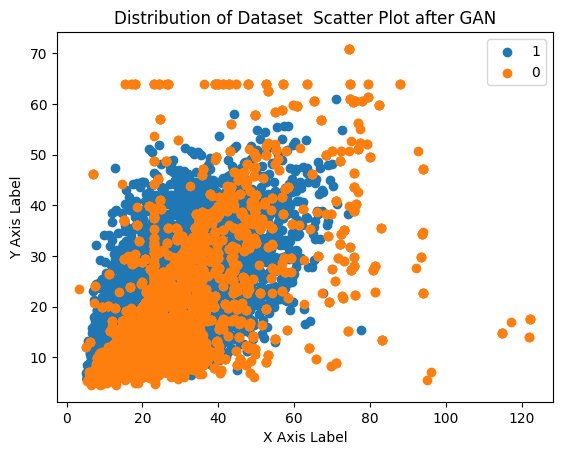

In [510]:
from matplotlib import pyplot 
from collections import Counter
from numpy import where
#df=pd.read_csv("BASE_MODELISATION_PME.csv")
X = df_totale.iloc[:,:39]
Y = df_totale.iloc[:,39]
X = X.values
Y = Y.values
print(Y)
counter = 0
#o_df = pd.DataFrame()
#for i in list(df_KNN_imputed.columns)[:39]:
#    o_df[i] = X_oversampled[i]
#counter += 1
#o_df["Class"] = Y_oversampled
#df = o_df.copy()
k=Counter(Y)
print(k)

# Définir une palette de couleurs pour les classes
colors = ['blue','red']
color_map = {label: color for label, color in zip(k.keys(), colors)}

for label, _ in k.items():
	row_ix = where(Y == label)[0]
	#print(row_ix==0)
	#print(row_ix==1)
	#print(type(row_ix))
	pyplot.scatter(X[row_ix, 33], X[row_ix, 34],label=str(label))

# Set the title and labels for axes
plt.title('Distribution of Dataset  Scatter Plot after GAN')
plt.xlabel('X Axis Label')
plt.ylabel('Y Axis Label')
pyplot.legend()
pyplot.show()


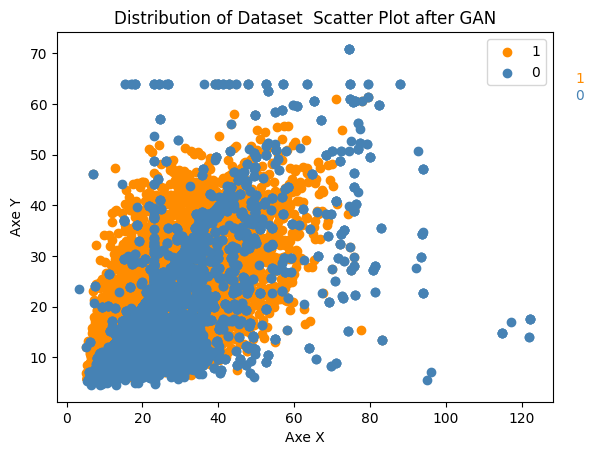

In [513]:
from matplotlib import pyplot as plt
from collections import Counter
from numpy import where

# Définir les couleurs pour les classes
colors = ['darkorange','steelblue']

# Compter les occurrences de chaque classe
class_counter = Counter(Y)

# Définir une palette de couleurs pour les classes
color_map = {label: color for label, color in zip(class_counter.keys(), colors)}

# Parcourir chaque classe
for label, _ in class_counter.items():
    # Trouver les indices des échantillons appartenant à cette classe
    row_ix = where(Y == label)[0]
    # Tracer les points pour cette classe avec la couleur correspondante
    plt.scatter(X[row_ix, 33], X[row_ix, 34], label=str(label), color=color_map[label])

# Calculer la position horizontale pour le texte de la légende
legend_x_position = max(X[:, 33]) + 0.1 * (max(X[:, 33]) - min(X[:, 33]))
# Calculer la position verticale pour le texte de la légende
legend_y_position = max(X[:, 34]) - 0.1 * (max(X[:, 34]) - min(X[:, 34]))

# Afficher le numéro de classe dans la légende
for label, _ in class_counter.items():
    plt.text(legend_x_position, legend_y_position, str(label), color=color_map[label])
    legend_y_position -= 0.05 * (max(X[:, 34]) - min(X[:, 34]))

# Ajouter le titre et les étiquettes des axes
plt.title('Distribution of Dataset  Scatter Plot after GAN')
plt.xlabel('Axe X')
plt.ylabel('Axe Y')

# Afficher la légende
plt.legend()

plt.show()

In [152]:
df_totale["Défaut"].value_counts()

Défaut
1    9123
0    9123
Name: count, dtype: int64

In [153]:
# appartenance à un groupe
df_totale["Flag_groupe"].value_counts()/df_totale["Flag_groupe"].count()

Flag_groupe
0    0.76625
1    0.23375
Name: count, dtype: float64

In [154]:
df_GEN["Flag_groupe"].value_counts()/df_GEN["Flag_groupe"].count()

Flag_groupe
0    0.726069
1    0.273931
Name: count, dtype: float64

In [155]:
df["Flag_groupe"].value_counts()/df["Flag_groupe"].count()

Flag_groupe
0    0.801565
1    0.198435
Name: count, dtype: float64

In [156]:
df_encoding[df_encoding["Valeur d\'Origine"]=="NA"]

,Colonne,Valeur d'Origine,Valeur Encodée
142,SEC_ACTIVITE,NA,142


In [157]:
df_totale.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18246 entries, 0 to 9710
Data columns (total 40 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Annee                             18246 non-null  int64  
 1   CA                                18246 non-null  float64
 2   EBE                               18246 non-null  float64
 3   RESULTAT_EXP                      18246 non-null  float64
 4   RESULTAT_NET                      18246 non-null  float64
 5   FINAN_PERM                        18246 non-null  float64
 6   FDR                               18246 non-null  float64
 7   BFR                               18246 non-null  float64
 8   K_PROPRES                         18246 non-null  float64
 9   TRES_NETTE                        18246 non-null  float64
 10  TOT_BILAN                         18246 non-null  float64
 11  DETTE_FINAN                       18246 non-null  float64
 12  ACTIF_CIRC

In [158]:
def get_original_data(encoded_data, encoding_dict):
    original_data = encoded_data.copy()  # Copiez les données encodées pour éviter de les modifier
    
    # Parcourez chaque colonne dans les données encodées
    for col, encoding in encoding_dict.items():
        # Inversez le dictionnaire d'encodage pour obtenir la correspondance inverse
        inverse_encoding = {v: k for k, v in encoding.items()}
        
        # Remplacez les valeurs encodées par les valeurs d'origine dans la colonne correspondante
        original_data[col] = original_data[col].map(inverse_encoding)
    
    return original_data


In [159]:
df_encoding.columns

Index(['Colonne', 'Valeur d'Origine', 'Valeur Encodée'], dtype='object')

In [160]:
df_encoding[df_encoding["Valeur d'Origine"]=='NA']

,Colonne,Valeur d'Origine,Valeur Encodée
142,SEC_ACTIVITE,NA,142


In [161]:
df_totale["SEC_ACTIVITE"] = df_totale["SEC_ACTIVITE"].replace(142, pd.NA)

In [162]:
plot_null_notnullvalues(df_totale, columns_to_display=["SEC_ACTIVITE","Secteurs2"],echelle=0.1)

In [163]:
#imputation des null values pour la variable SEC_ACTIVITE
df_totale = df_totale.apply(lambda x: x.fillna(x.mode()[0]))

C:\Users\user\AppData\Local\Temp\ipykernel_23972\3230661353.py:2: FutureWarning:

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [164]:
plot_null_notnullvalues(df_totale, columns_to_display=["SEC_ACTIVITE","Secteurs2"],echelle=0.1)

In [165]:
# Exemple d'utilisation :
# data_encoded est votre DataFrame avec des données encodées
# encoding_dict est un dictionnaire contenant les correspondances entre les valeurs encodées et les valeurs d'origine
original_data=get_original_data(df_totale, encoding_dict)
original_data.loc[original_data["SEC_ACTIVITE"] == "NA", "SEC_ACTIVITE"].count()

0

In [166]:
def replace_NA_with_null(df, columns, valeur="NA"):
    # Remplace NA par NaN dans les colonnes spécifiées
    df1=df.copy()
    df1[columns] = df1[columns].replace(valeur, np.nan)
    return df1

In [167]:
df_totale_originale=replace_NA_with_null(original_data,columns=["SEC_ACTIVITE","Secteurs2"],valeur="NA")
#df_totale_decoded

In [168]:
plot_null_notnullvalues(df_totale_originale, columns_to_display=["SEC_ACTIVITE","Secteurs2"],echelle=0.1)

In [169]:
df_totale.columns

Index(['Annee', 'CA', 'EBE', 'RESULTAT_EXP', 'RESULTAT_NET', 'FINAN_PERM',
       'FDR', 'BFR', 'K_PROPRES', 'TRES_NETTE', 'TOT_BILAN', 'DETTE_FINAN',
       'ACTIF_CIRCULANT', 'PASSIF_CIRCULANT', 'TOT_ACTIF', 'TOT_PASSIF',
       'DELAI_REG_CLIENTS', 'DELAI_REG_FRS', 'AUTO_FINAN', 'FRAIS_FINAN',
       'STOCK', 'solde_moyen_par_client_par_annee',
       'solde_moyen_crediteur_par_annee', 'solde_moyen_debiteur_par_annee',
       'max_jours_crediteurs', 'max_jours_debiteurs', 'moyenne_mvt_deb',
       'moyenne_mvt_crd', 'SEC_ACTIVITE', 'CATEGORIE_JUR', 'Flag_client_cote',
       'Flag_groupe', 'Secteurs2', 'PERIODE_DE_CREATION_ENTREP',
       'PERIODE_DE_CREATION_TIERS', 'Age_GER', 'DATE_DE_CREATION_ENTREP',
       'DATE_DE_CREATION_TIERS', 'DAT_NAI_GER', 'Défaut'],
      dtype='object')

### Correlation

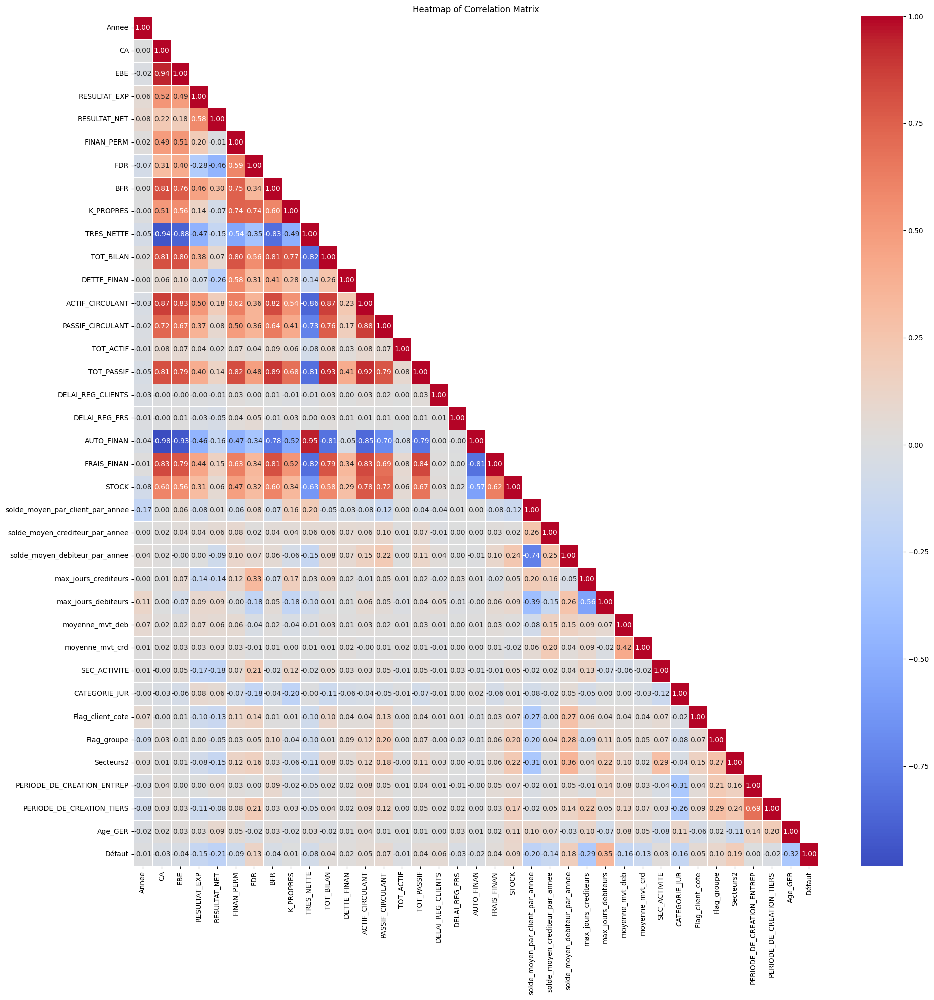

In [170]:
import seaborn as sns
correlation_Heatmap(df_totale.select_dtypes(include=[int,float]),method="pearson")

In [171]:
correlation_Heatmap(df_totale[top_feature_names],method="pearson")

NameError: name 'top_feature_names' is not defined

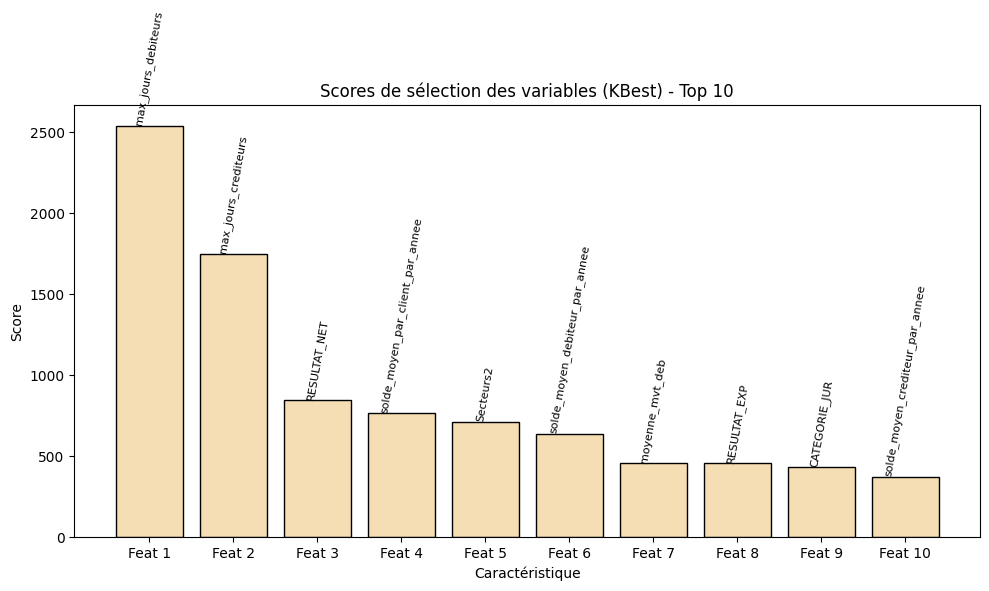

In [167]:
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import SelectKBest, f_classif 

df_kbest_totale=df_totale.copy()
df_kbest_totale=df_kbest_totale.select_dtypes(include=[float,int])
# Assurez-vous que toutes les colonnes catégoriques sont encodées en numérique
label_encoder = LabelEncoder()
for col in df_kbest_totale.select_dtypes(include=['object']):  # Sélectionnez uniquement les colonnes catégoriques
    df_kbest_totale[col] = label_encoder.fit_transform(df_kbest_totale[col])

# Maintenant, vous pouvez procéder à la sélection des caractéristiques
X = df_kbest_totale.loc[:, :"Secteurs2"]
y = df_kbest_totale["Défaut"]

selector = SelectKBest(score_func=f_classif, k=5)
selector.fit(X, y)

# Récupération des scores KBest et des noms de colonnes
scores = selector.scores_
feature_names = X.columns

# Trier les scores et les noms de colonnes par ordre décroissant des scores
sorted_indices = np.argsort(scores)[::-1]
sorted_scores = scores[sorted_indices]
sorted_feature_names = feature_names[sorted_indices]

# Récupération des dix premiers scores KBest et des noms de colonnes correspondants
top_scores = sorted_scores[:10]
top_feature_names = sorted_feature_names[:10]

# Création de l'histogramme des scores pour les dix premières caractéristiques
plt.figure(figsize=(10, 6))
bars = plt.bar(range(len(top_scores)), top_scores, color=(0.96, 0.87, 0.7), edgecolor='black')

# Ajouter les noms de colonnes sur chaque barre
for bar, feature_name in zip(bars, top_feature_names):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), feature_name, ha='center', va='bottom', rotation=80, fontsize=8)

plt.title('Scores de sélection des variables (KBest) - Top 10')
plt.xlabel('Caractéristique')
plt.ylabel('Score')
plt.xticks(range(len(top_scores)), [f'Feat {i+1}' for i in range(len(top_scores))])
plt.tight_layout()  # Ajuster automatiquement les espacements pour éviter le chevauchement
plt.show()

## Data Modeling and evaluation

In [172]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn import svm
import xgboost as xgb
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn import metrics

In [173]:
df_totale.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18246 entries, 0 to 9710
Data columns (total 40 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Annee                             18246 non-null  int64  
 1   CA                                18246 non-null  float64
 2   EBE                               18246 non-null  float64
 3   RESULTAT_EXP                      18246 non-null  float64
 4   RESULTAT_NET                      18246 non-null  float64
 5   FINAN_PERM                        18246 non-null  float64
 6   FDR                               18246 non-null  float64
 7   BFR                               18246 non-null  float64
 8   K_PROPRES                         18246 non-null  float64
 9   TRES_NETTE                        18246 non-null  float64
 10  TOT_BILAN                         18246 non-null  float64
 11  DETTE_FINAN                       18246 non-null  float64
 12  ACTIF_CIRC

In [174]:
# Assuming 'target_column' is your binary target variable
df_tot=df_totale.copy()
df_tot= df_tot.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)


y = df_tot['Défaut']
X = df_tot.drop('Défaut', axis=1)

LogisticRegression
Accuracy: 0.90
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.90      0.90      1825
           1       0.90      0.91      0.90      1825

    accuracy                           0.90      3650
   macro avg       0.90      0.90      0.90      3650
weighted avg       0.90      0.90      0.90      3650



c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



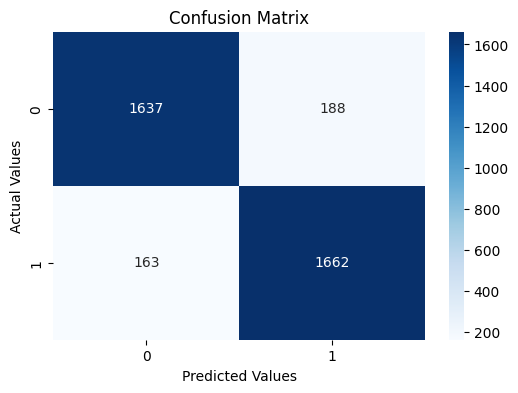

In [175]:
def modeling(df=df_tot,modelisation=LogisticRegression(),target_column='Défaut'):
    y = df[target_column]
    X = df.drop(target_column, axis=1)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)


    # Standardize features if needed
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Create a  model
    model = modelisation

    # Train the model on the training set
    model.fit(X_train, y_train)



    # Create a model classifier
    logitic_regression = modelisation

    # Train the classifier on the training set
    logitic_regression.fit(X_train,y_train) 

    # Make predictions on the test set
    y_pred = logitic_regression.predict(X_test)

    # Evaluate the performance
    acc = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred)

    print(f'{str(modelisation).split("(")[0]}')
    print(f'Accuracy: {acc:.2f}')
    print('Classification Report:\n', report)

    import matplotlib.pyplot as plt
    import seaborn as sns
    from sklearn.metrics import confusion_matrix

    # Calculer la matrice de confusion
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Créer une figure
    plt.figure(figsize=(6, 4))

    # Utiliser seaborn pour créer la heatmap
    sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='g')

    # Ajouter des étiquettes et des titres
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title('Confusion Matrix')


    # Afficher la figure
    plt.show()


modeling(df=df_tot,modelisation=LogisticRegression(),target_column='Défaut')

In [176]:
df.shape

(9711, 40)

In [177]:
df_tot.shape

(18246, 37)

In [178]:
df.columns

Index(['Annee', 'CA', 'EBE', 'RESULTAT_EXP', 'RESULTAT_NET', 'FINAN_PERM',
       'FDR', 'BFR', 'K_PROPRES', 'TRES_NETTE', 'TOT_BILAN', 'DETTE_FINAN',
       'ACTIF_CIRCULANT', 'PASSIF_CIRCULANT', 'TOT_ACTIF', 'TOT_PASSIF',
       'DELAI_REG_CLIENTS', 'DELAI_REG_FRS', 'AUTO_FINAN', 'FRAIS_FINAN',
       'STOCK', 'solde_moyen_par_client_par_annee',
       'solde_moyen_crediteur_par_annee', 'solde_moyen_debiteur_par_annee',
       'max_jours_crediteurs', 'max_jours_debiteurs', 'moyenne_mvt_deb',
       'moyenne_mvt_crd', 'DATE_DE_CREATION_TIERS', 'DATE_DE_CREATION_ENTREP',
       'DAT_NAI_GER', 'SEC_ACTIVITE', 'CATEGORIE_JUR', 'Flag_client_cote',
       'Flag_groupe', 'Secteurs2', 'Défaut', 'PERIODE_DE_CREATION_ENTREP',
       'PERIODE_DE_CREATION_TIERS', 'Age_GER'],
      dtype='object')

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\user\anaconda

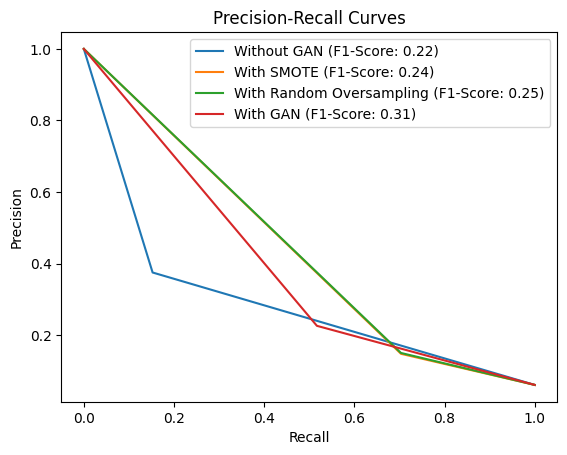

In [179]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve, f1_score
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE, RandomOverSampler
from imblearn.ensemble import BalancedRandomForestClassifier
from imblearn.pipeline import make_pipeline
import matplotlib.pyplot as plt

def plot_curves(df, df_gan):
    

    df= df.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
    # Séparation des données en caractéristiques et étiquettes
    X = df.drop('Défaut', axis=1)
    y = df['Défaut']
    

    X_gan = df_gan.drop('Défaut', axis=1)
    y_gan = df_gan['Défaut']

    # Division des données en ensembles de formation et de test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
    X_train_gan, X_test_gan, y_train_gan, y_test_gan = train_test_split(X_gan, y_gan, test_size=0.2, random_state=42)

    # Création de modèles avec différentes techniques d'échantillonnage
    models = {
        "Without GAN": LogisticRegression(),
        "With SMOTE": make_pipeline(SMOTE(), LogisticRegression()),
        "With Random Oversampling": make_pipeline(RandomOverSampler(), LogisticRegression()),
        "With GAN": LogisticRegression()
    }

    # Entraînement des modèles
    for model_name, model in models.items():
        if model_name == "With GAN":
            model.fit(X_train_gan, y_train_gan)
            y_pred = model.predict(X_test)
        else:
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)

        # Calcul des scores
        precision, recall, _ = precision_recall_curve(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)

        # Affichage des courbes
        plt.plot(recall, precision, label=f'{model_name} (F1-Score: {f1:.2f})')

    # Affichage des légendes et des titres
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curves')
    plt.legend()
    plt.show()

# Utilisation de la fonction avec vos DataFrames
plot_curves(df, df_tot)

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\user\anaconda

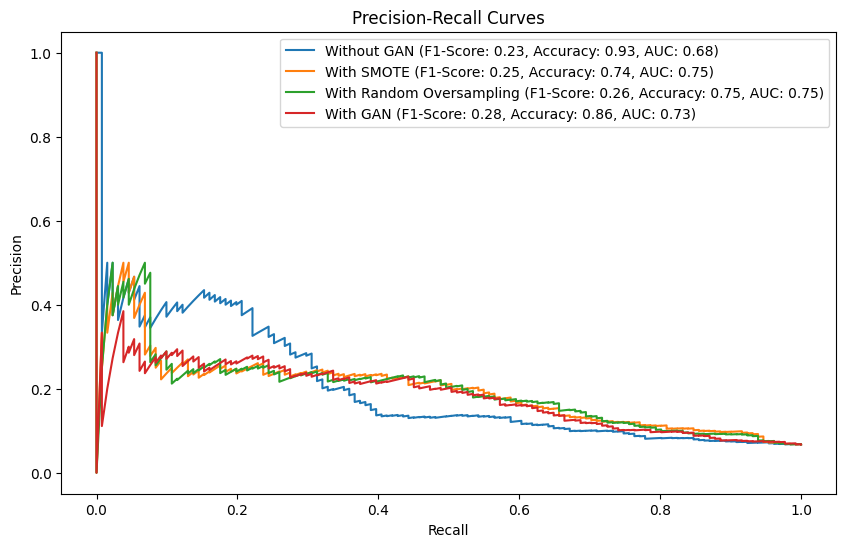

In [180]:
from sklearn.metrics import precision_recall_curve, f1_score, accuracy_score, roc_auc_score
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE, RandomOverSampler
from imblearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

def plot_curves(df, df_gan):

    df= df.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
    # Séparation des données en caractéristiques et étiquettes
    X = df.drop('Défaut', axis=1)
    y = df['Défaut']
    

    X_gan = df_gan.drop('Défaut', axis=1)
    y_gan = df_gan['Défaut']
    # Division des données en ensembles de formation et de test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    X_train_gan, X_test_gan, y_train_gan, y_test_gan = train_test_split(X_gan, y_gan, test_size=0.2, random_state=42)

    # Création de modèles avec différentes techniques d'échantillonnage
    models = {
        "Without GAN": LogisticRegression(),
        "With SMOTE": make_pipeline(SMOTE(), LogisticRegression()),
        "With Random Oversampling": make_pipeline(RandomOverSampler(), LogisticRegression()),
        "With GAN": LogisticRegression()
    }

    # Préparation des listes pour stocker les résultats
    results_precision = {}
    results_recall = {}
    results_f1 = {}
    results_accuracy = {}
    results_auc = {}

    # Entraînement des modèles
    for model_name, model in models.items():
        if model_name == "With GAN":
            model.fit(X_train_gan, y_train_gan)
            y_pred = model.predict(X_test)
            y_proba = model.predict_proba(X_test)[:, 1]
        else:
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)
            y_proba = model.predict_proba(X_test)[:, 1]

        # Calcul des scores
        precision, recall, _ = precision_recall_curve(y_test, y_proba)
        f1 = f1_score(y_test, y_pred)
        accuracy = accuracy_score(y_test, y_pred)
        auc = roc_auc_score(y_test, y_proba)

        # Stockage des résultats
        results_precision[model_name] = precision
        results_recall[model_name] = recall
        results_f1[model_name] = f1
        results_accuracy[model_name] = accuracy
        results_auc[model_name] = auc

    # Affichage des courbes Precision-Recall
    plt.figure(figsize=(10, 6))
    for model_name, precision in results_precision.items():
        recall = results_recall[model_name]
        plt.plot(recall, precision, label=f'{model_name} (F1-Score: {results_f1[model_name]:.2f}, Accuracy: {results_accuracy[model_name]:.2f}, AUC: {results_auc[model_name]:.2f})')

    # Affichage des légendes et des titres
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curves')
    plt.legend()
    plt.show()

# Utilisation de la fonction avec vos DataFrames
plot_curves(df, df_tot)

LogisticRegression
Accuracy: 0.90
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.90      0.90      1825
           1       0.90      0.91      0.90      1825

    accuracy                           0.90      3650
   macro avg       0.90      0.90      0.90      3650
weighted avg       0.90      0.90      0.90      3650



c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



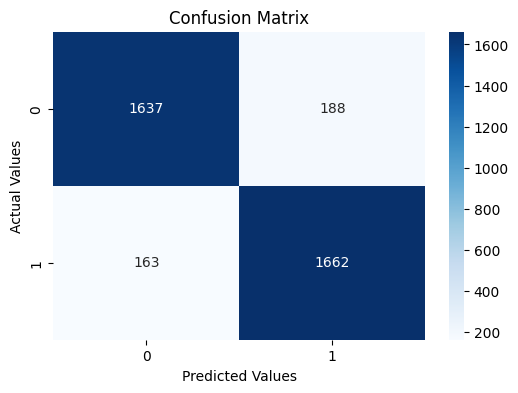

In [181]:
modeling(df=df_tot,modelisation=LogisticRegression(),target_column='Défaut')

In [175]:
df_tot

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,moyenne_mvt_crd,SEC_ACTIVITE,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER,Défaut
0,2018,21522534.00,3936548.00,-8713040.00,6880320.00,-92156896.0,6.002878e+07,-5.494462e+07,6.316240e+07,16965024.00,...,0.014652,43,6,0,0,1,7.544353,5.779374,44.336025,1
1,2017,49200660.00,-80700.00,9846856.00,8864928.00,-59760096.0,-7.889171e+07,3.663589e+07,3.253152e+06,-3084736.00,...,0.162396,94,5,0,0,4,10.449370,4.628391,44.179279,1
2,2020,2425973.50,8573632.00,-65567100.00,-49485296.00,297318240.0,5.873477e+08,-1.514557e+08,2.058596e+08,-52542848.00,...,8.386740,181,5,0,0,7,6.796561,6.554873,39.690022,1
3,2019,1514504.25,-7889264.00,-19131112.00,-13625968.00,1533600.0,1.325726e+08,1.017446e+08,-4.480898e+07,-27729632.00,...,0.176316,119,5,0,1,15,20.941473,8.248598,26.096813,1
4,2016,44379268.00,-4514144.00,32152632.00,4500544.00,-96273072.0,-1.105937e+08,4.045472e+07,-1.142530e+08,-40254400.00,...,0.034799,96,9,0,1,2,3.178458,1.401156,43.644432,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9706,2020,17039000.00,-3501000.00,-9970000.00,-12313000.00,83153000.0,6.720900e+07,8.845300e+07,2.193100e+07,-21244000.00,...,0.833333,111,4,0,0,7,6.460274,1.709589,50.682192,0
9707,2017,21802317.68,-332377.54,-1010307.33,-3418023.48,7090079.1,3.672056e+06,4.843489e+06,-2.418023e+06,-1171433.46,...,4.333333,37,7,0,0,1,17.260274,-1.317808,65.041096,0
9708,2020,36863000.00,1224000.00,656000.00,79000.00,16889000.0,1.688900e+07,1.448800e+07,1.229900e+07,2401000.00,...,4.583333,163,6,0,0,2,10.109589,1.635616,56.895890,0
9709,2020,11741000.00,-154000.00,-216000.00,-410000.00,1998000.0,1.588000e+06,4.173000e+06,1.513000e+06,-2585000.00,...,5.166667,42,7,0,0,2,5.876712,1.594521,47.145205,0


c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Random Oversampling Counter({0: 9123, 1: 9123})
Smote Oversampling Counter({0: 9123, 1: 9123})


c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



UnderSampling oneSided selection Counter({0: 8861, 1: 588})
Undersampling with Tomek Links Counter({0: 8932, 1: 588})


c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\user\anaconda

Undersampling with NearMiss-1 Counter({0: 588, 1: 588})
Undersampling with NearMiss-2 Counter({0: 588, 1: 588})
Undersampling with NearMiss-3 Counter({0: 588, 1: 588})


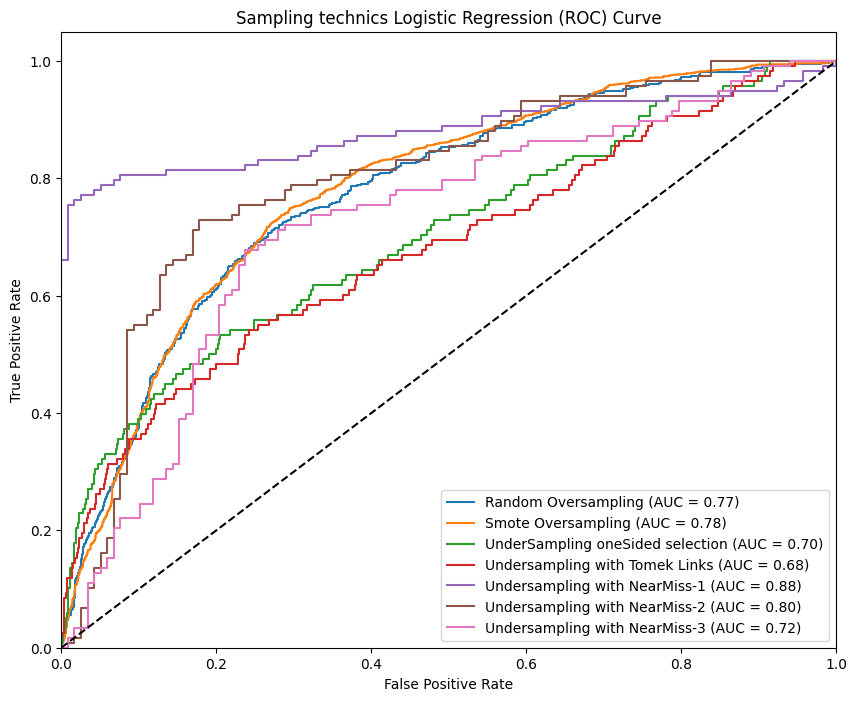

In [182]:
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import OneSidedSelection, TomekLinks, NearMiss
import matplotlib.pyplot as plt


X = df.drop(columns=["DATE_DE_CREATION_ENTREP","DATE_DE_CREATION_TIERS","DAT_NAI_GER","Défaut"])
y = df["Défaut"]




X_gan = df_tot.drop(columns=["Défaut"])
y_gan = df["Défaut"]

# Split the data into training and testing sets
#X_train_gan, X_test_gan, y_train_gan, y_test_gan = train_test_split(X_gan, y_gan, test_size=0.2, stratify=y_gan, random_state=42)

# Standardize features if needed
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize models
models = {
    "Random Oversampling": LogisticRegression(),
    "Smote Oversampling": LogisticRegression(),  
    "UnderSampling oneSided selection": LogisticRegression(),
    "Undersampling with Tomek Links": LogisticRegression(),
    "Undersampling with NearMiss-1": LogisticRegression(),
    "Undersampling with NearMiss-2": LogisticRegression(),
    "Undersampling with NearMiss-3": LogisticRegression()
}

# Plot ROC curves for each model
plt.figure(figsize=(10, 8))
for name, model in models.items():
    if name == "Random Oversampling":
        sampler = RandomOverSampler()
    elif name == "Smote Oversampling":
        sampler = SMOTE()
    elif name == "UnderSampling oneSided selection":
        sampler = OneSidedSelection()
    elif name == "Undersampling with Tomek Links":
        sampler = TomekLinks()
    elif name.startswith("Undersampling with NearMiss"):
        sampler = NearMiss(version=int(name[-1]))
    
    X_resampled, y_resampled = sampler.fit_resample(X, y)
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=42)
    model.fit(X_resampled, y_resampled)
    print(name ,Counter(y_resampled))
    y_score = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label='%s (AUC = %0.2f)' % (name, roc_auc))


plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Sampling technics Logistic Regression (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [179]:

#"Logistic Regression": LogisticRegression(),
#    "SVM": svm.SVC(probability=True),  # Note: setting probability=True for SVC to enable probability estimates
#    "Naive Bayes": GaussianNB(),
#    "Decision Tree": DecisionTreeClassifier(),
#    "Random Forest": RandomForestClassifier(),
#    "XGBoost": xgb.XGBClassifier()

### Correlation Variables

In [358]:
import seaborn as sns
def correlation_Heatmap(df=df_totale,method="pearson"):
    # Calcul de la matrice de corrélation
    correlation_matrix11 = df.corr(method=method)
    # Création d'un masque pour cacher la moitié supérieure de la matrice de corrélation
    mask = np.triu(np.ones_like(correlation_matrix11, dtype=bool),k=1)

    # Set up the matplotlib figure
    plt.figure(figsize=(22, 22))

    # Create a heatmap using Seaborn
    sns.heatmap(correlation_matrix11, mask=mask, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
    #sns.heatmap(correlation_matrix11, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
    # Add a title
    plt.title('Heatmap of Correlation Matrix with most frequent IMPUTATION')

    # Show the plot
    plt.show()

In [359]:
def new_finan_columns(df_Quanti):
    df_Quanti["FDR/TOT_ACTIF"]=df_Quanti["FDR"]/df_Quanti["TOT_ACTIF"]
    #df_Quanti["Bénéfices non distribués/TOT_ACTIF"]=df_Quanti["Bénéfices non distribués"]/df_Quanti["TOT_ACTIF"]
    #df_Quanti["BAII /TOT_ACTIF"]=df_Quanti["BAII"]/df_Quanti["TOT_ACTIF"]   
    #(BAII = Bénéfice avant intérêts et impôts)
    df_Quanti["K_PROPRES/TOT_PASSIF"]=df_Quanti["K_PROPRES"]/df_Quanti["TOT_PASSIF"]
    df_Quanti["CA/TOT_ACTIF"]=df_Quanti["CA"]/df_Quanti["TOT_ACTIF"]
    #df_Quanti["Z"]=df_Quanti["FDR/TOT_ACTIF"]*1.2+col2*1.4+col3*3.3+df_Quanti["K_PROPRES/TOT_PASSIF"]*0.6+df_Quanti["CA/TOT_ACTIF"]*1
    #df_Quanti["Z"]=df_Quanti["FDR/TOT_ACTIF"]*1.2+df_Quanti["K_PROPRES/TOT_PASSIF"]*0.6+df_Quanti["CA/TOT_ACTIF"]*1

In [360]:
df_corr=df_totale.copy()
df_corr=df_corr.drop(columns=["DAT_NAI_GER","DATE_DE_CREATION_ENTREP","DATE_DE_CREATION_TIERS"])

In [361]:
new_finan_columns(df_corr)

In [362]:
df_corr

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,Flag_client_cote,Flag_groupe,Secteurs2,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER,Défaut,FDR/TOT_ACTIF,K_PROPRES/TOT_PASSIF,CA/TOT_ACTIF
0,2019,17007656.00,-881656.00,29442344.00,-13123200.00,67041312.0,-3.312848e+06,3.755686e+07,-39351824.00,-24474496.00,...,0,1,15,14.559589,7.142668,41.771782,1,-0.064277,-0.203743,0.329990
1,2016,29959614.00,1900724.00,15121368.00,6445040.00,-48390072.0,-8.973942e+07,-1.754814e+07,31733792.00,2567008.00,...,0,0,1,20.815861,9.345347,32.354317,1,-1.057461,0.685317,0.353035
2,2018,22607588.00,-2236468.00,6517312.00,6887232.00,16010608.0,-5.865349e+07,-1.904494e+07,35797472.00,-8448224.00,...,0,0,1,3.948555,1.896558,45.396778,1,-5.293663,0.772042,2.040407
3,2020,11851303.00,-2701688.00,-3622304.00,5232576.00,-22451456.0,-3.095539e+07,-1.237379e+07,44947456.00,-28733184.00,...,0,0,6,3.441316,1.905543,46.251610,1,-11.505500,4.278245,4.404892
4,2016,45969536.00,70952.00,24846648.00,1692144.00,-59061272.0,-1.156643e+08,1.275821e+08,-8974608.00,-18069984.00,...,0,0,0,3.773149,1.740443,42.913860,1,-4.433007,-0.370352,1.761851
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9706,2020,17039000.00,-3501000.00,-9970000.00,-12313000.00,83153000.0,6.720900e+07,8.845300e+07,21931000.00,-21244000.00,...,0,0,7,6.460274,1.709589,50.682192,0,0.503110,0.164174,0.127550
9707,2017,21802317.68,-332377.54,-1010307.33,-3418023.48,7090079.1,3.672056e+06,4.843489e+06,-2418023.48,-1171433.46,...,0,0,1,17.260274,-1.317808,65.041096,0,0.163129,-0.107419,0.968554
9708,2020,36863000.00,1224000.00,656000.00,79000.00,16889000.0,1.688900e+07,1.448800e+07,12299000.00,2401000.00,...,0,0,2,10.109589,1.635616,56.895890,0,0.558203,0.406484,1.218370
9709,2020,11741000.00,-154000.00,-216000.00,-410000.00,1998000.0,1.588000e+06,4.173000e+06,1513000.00,-2585000.00,...,0,0,2,5.876712,1.594521,47.145205,0,0.091369,0.087049,0.675547


In [363]:
df_corr["Défaut"].unique()

array([1, 0], dtype=int64)

In [364]:
from scipy.stats import f_oneway

def continuous_categorical_correlation(df, continuous_var, categorical_var):

    # Plot boxplot to visualize the relationship
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=categorical_var, y=continuous_var, data=df)
    plt.title(f'Boxplot of {continuous_var} by {categorical_var}')
    plt.show()

    # Perform ANOVA
    anova_result = f_oneway(*(df[df[categorical_var] == category][continuous_var] for category in df[categorical_var].unique()))
    p_value = anova_result.pvalue
    print("ANOVA p-value:", p_value)
    
    return p_value

In [365]:
def continuous_categorical_correlation(df, continuous_var, categorical_var):

    # Reset index to handle duplicate indexes
    df = df.reset_index(drop=True)
    
    # Plot boxplot to visualize the relationship
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=categorical_var, y=continuous_var, data=df)
    plt.title(f'Boxplot of {continuous_var} by {categorical_var}')
    plt.show()

    # Perform ANOVA
    groups = [df[df[categorical_var] == category][continuous_var] for category in df[categorical_var].unique()]
    #print("groups=",groups)
    #print("groups*=",*groups)
    anova_result = f_oneway(*groups)
    print(anova_result)
    p_value = anova_result.pvalue
    print("ANOVA p-value:", p_value)
    
    return p_value

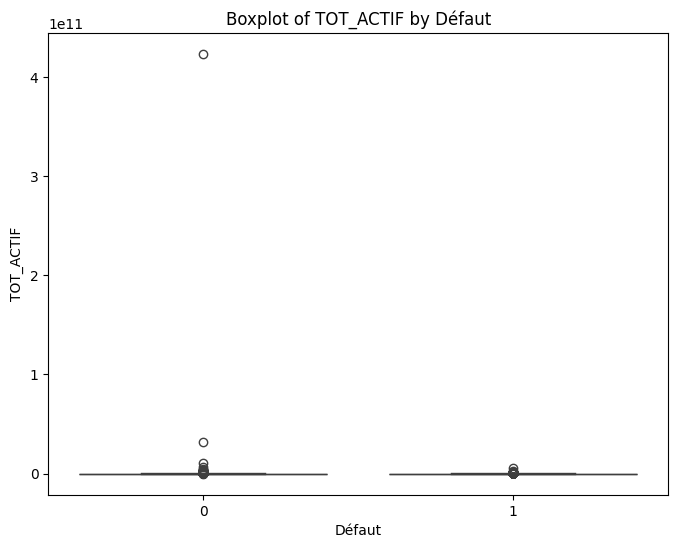

F_onewayResult(statistic=1.1946577062845605, pvalue=0.27440648305206444)
ANOVA p-value: 0.27440648305206444


0.27440648305206444

In [188]:
continuous_categorical_correlation(df_corr, continuous_var="TOT_ACTIF", categorical_var="Défaut")

In [164]:
df_TOT_PASSIF=df_corr[df_corr["TOT_PASSIF"]!=0]

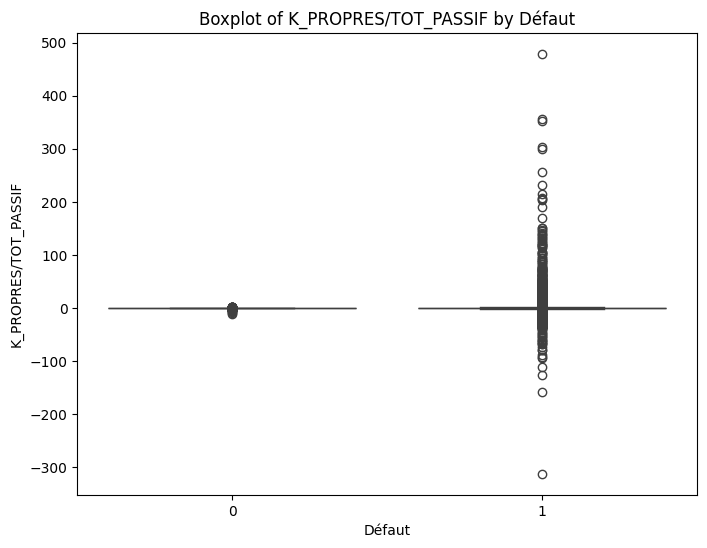

F_onewayResult(statistic=96.70791479084139, pvalue=9.159503065542077e-23)
ANOVA p-value: 9.159503065542077e-23


9.159503065542077e-23

In [165]:
continuous_categorical_correlation(df_TOT_PASSIF, continuous_var="K_PROPRES/TOT_PASSIF", categorical_var="Défaut")

In [166]:
df_TOT_ACTIF=df_corr[df_corr["TOT_ACTIF"]!=0]
df_TOT_ACTIF.shape

(18155, 40)

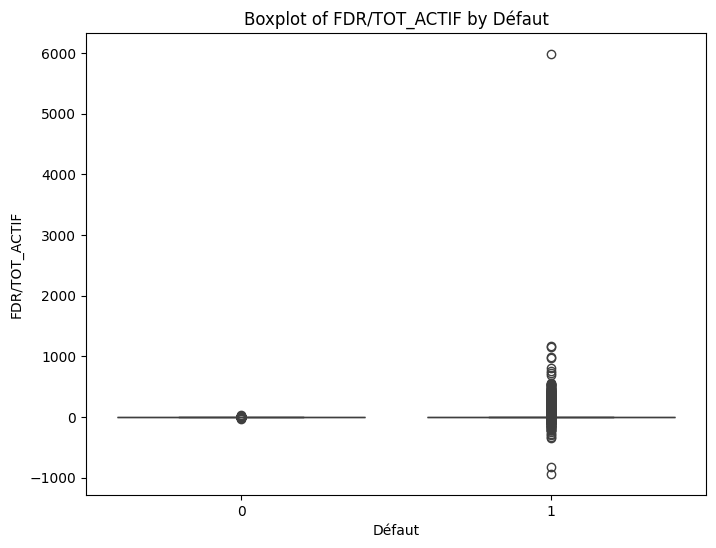

F_onewayResult(statistic=159.85742396505717, pvalue=1.732398903948244e-36)
ANOVA p-value: 1.732398903948244e-36


1.732398903948244e-36

In [167]:
continuous_categorical_correlation(df_TOT_ACTIF, continuous_var="FDR/TOT_ACTIF", categorical_var="Défaut")

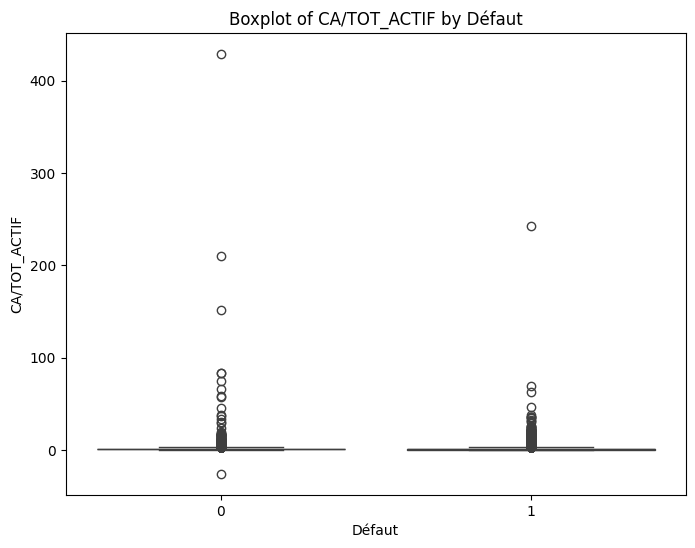

F_onewayResult(statistic=0.15419342758939752, pvalue=0.6945643626972209)
ANOVA p-value: 0.6945643626972209


0.6945643626972209

In [168]:
continuous_categorical_correlation(df_TOT_ACTIF, continuous_var="CA/TOT_ACTIF", categorical_var="Défaut")
#t-test 2 classes
#ANOVA   3classes

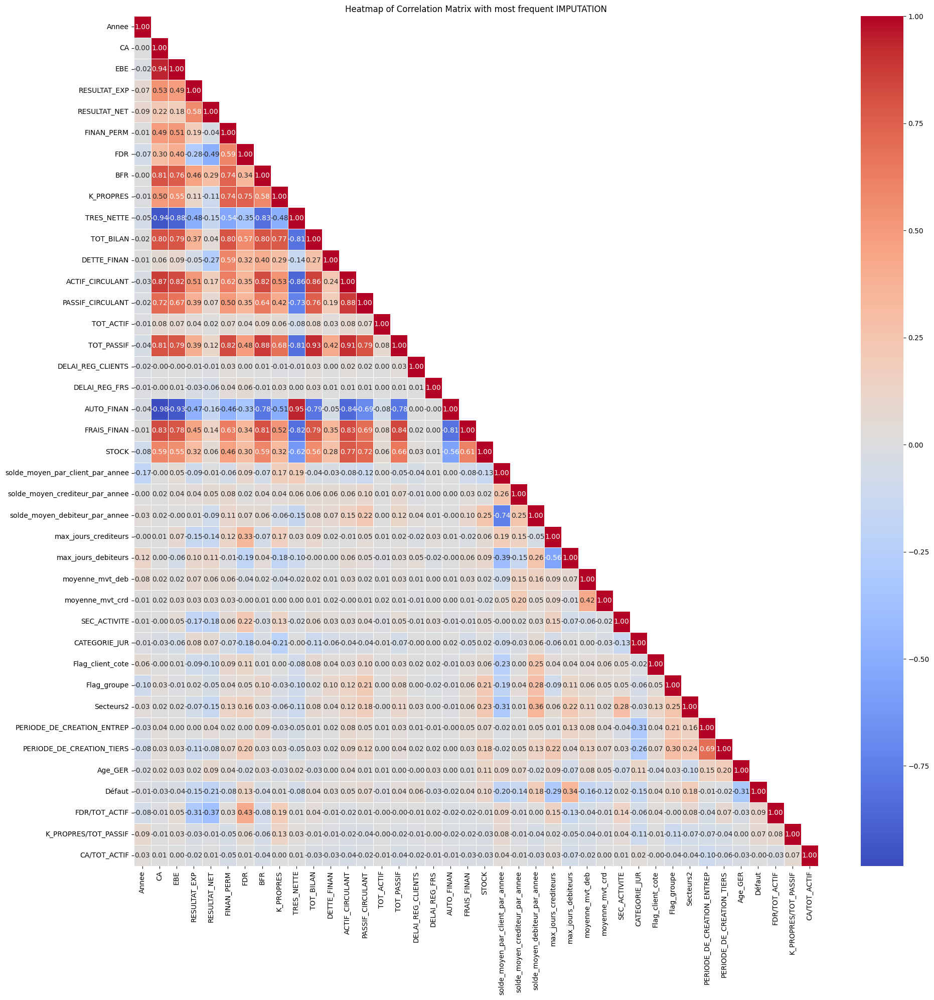

In [169]:
correlation_Heatmap(df_corr,method="pearson")

### Support Vector Machine

In [170]:
modeling(df=df_tot,modelisation=svm.SVC(),target_column='Défaut')

SVC
Accuracy: 0.96
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.98      0.96      1851
           1       0.98      0.93      0.96      1799

    accuracy                           0.96      3650
   macro avg       0.96      0.96      0.96      3650
weighted avg       0.96      0.96      0.96      3650



### Xgboost

In [190]:
modeling(df=df_tot,modelisation=xgb.XGBClassifier(),target_column='Défaut')

XGBClassifier
Accuracy: 0.97
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.98      0.97      1800
           1       0.98      0.96      0.97      1850

    accuracy                           0.97      3650
   macro avg       0.97      0.97      0.97      3650
weighted avg       0.97      0.97      0.97      3650



### RandomForest Classification

In [ ]:
modeling(df_tot,modelisation=RandomForestClassifier(),target_column='Défaut')

### Logistic Regression

In [ ]:
df_tot.columns

In [ ]:
df_totale.columns

In [171]:
modeling(df=df_tot,modelisation=LogisticRegression(),target_column='Défaut')

LogisticRegression
Accuracy: 0.91
Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.90      0.91      1791
           1       0.91      0.92      0.91      1859

    accuracy                           0.91      3650
   macro avg       0.91      0.91      0.91      3650
weighted avg       0.91      0.91      0.91      3650



### Gaussian Naive Bayes

In [172]:
modeling(df=df_tot,modelisation=GaussianNB(),target_column='Défaut')

GaussianNB
Accuracy: 0.56
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.14      0.24      1809
           1       0.54      0.98      0.69      1841

    accuracy                           0.56      3650
   macro avg       0.71      0.56      0.47      3650
weighted avg       0.71      0.56      0.47      3650



### ROC Curve

In [189]:
df_kbest_GAN = pd.concat([df_GEN, df_Before_GAN])
df_kbest= pd.concat([df_totale[top_feature_names], df_Before_GAN])

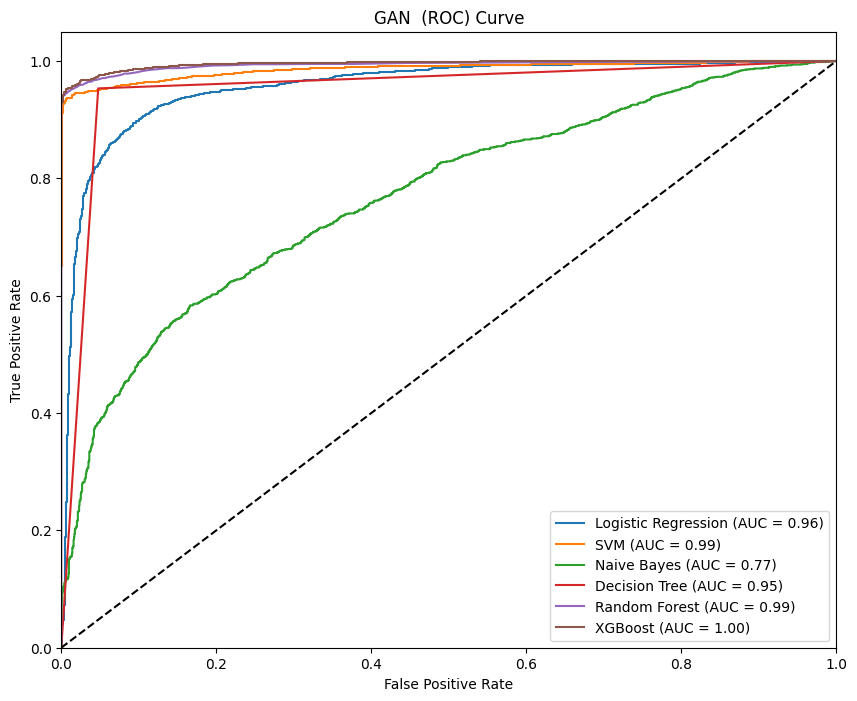

In [190]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn import svm
import xgboost as xgb
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size=0.2,random_state=42)


# Standardize features if needed
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize models
models = {
    "Logistic Regression": LogisticRegression(),
    "SVM": svm.SVC(probability=True),  # Note: setting probability=True for SVC to enable probability estimates
    "Naive Bayes": GaussianNB(),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "XGBoost": xgb.XGBClassifier()
    
    }

# Plot ROC curves for each model
plt.figure(figsize=(10, 8))
for name, model in models.items():
    model.fit(X_train, y_train)
    y_score = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label='%s (AUC = %0.2f)' % (name, roc_auc))

plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('GAN  (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [ ]:
df_tot= df_tot.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)


y = df_tot['Défaut']
X = df_tot.drop('Défaut', axis=1)

In [217]:
df.columns

Index(['Annee', 'CA', 'EBE', 'RESULTAT_EXP', 'RESULTAT_NET', 'FINAN_PERM',
       'FDR', 'BFR', 'K_PROPRES', 'TRES_NETTE', 'TOT_BILAN', 'DETTE_FINAN',
       'ACTIF_CIRCULANT', 'PASSIF_CIRCULANT', 'TOT_ACTIF', 'TOT_PASSIF',
       'DELAI_REG_CLIENTS', 'DELAI_REG_FRS', 'AUTO_FINAN', 'FRAIS_FINAN',
       'STOCK', 'solde_moyen_par_client_par_annee',
       'solde_moyen_crediteur_par_annee', 'solde_moyen_debiteur_par_annee',
       'max_jours_crediteurs', 'max_jours_debiteurs', 'moyenne_mvt_deb',
       'moyenne_mvt_crd', 'DATE_DE_CREATION_TIERS', 'DATE_DE_CREATION_ENTREP',
       'DAT_NAI_GER', 'SEC_ACTIVITE', 'CATEGORIE_JUR', 'Flag_client_cote',
       'Flag_groupe', 'Secteurs2', 'Défaut', 'PERIODE_DE_CREATION_ENTREP',
       'PERIODE_DE_CREATION_TIERS', 'Age_GER'],
      dtype='object')

In [194]:

dfdrop=df.copy()
dfdrop= dfdrop.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



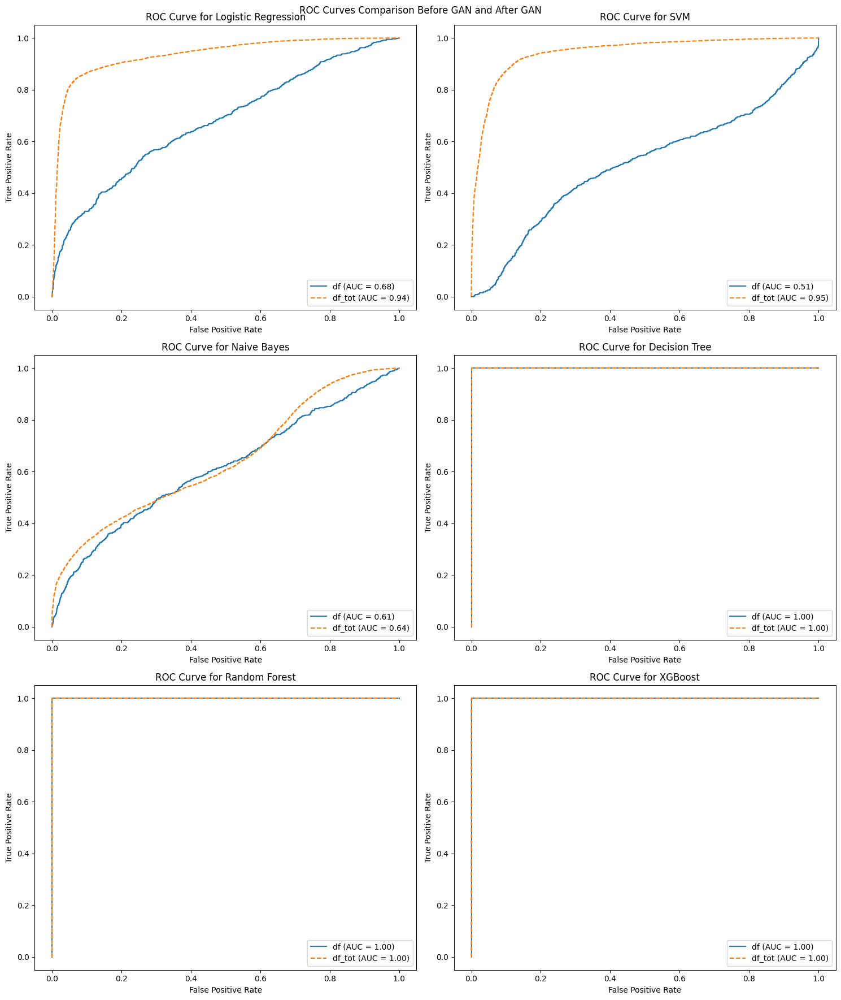

In [195]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb

def plot_roc_curves(df, df_tot, models, fig_title):
    num_models = len(models)
    num_cols = 2  # Two figures per line
    num_rows = -(-num_models // num_cols)  # Ceiling division to calculate the number of rows

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 6))  # Create subplots
    
    plt.suptitle(fig_title)  # Add title to the entire figure
    
    for ax, (name, model) in zip(axes.flatten(), models.items()):
        # Plot ROC curve for df
        model.fit(df.drop(columns=["Défaut"]), df["Défaut"])
        y_pred_proba_df = model.predict_proba(df.drop(columns=["Défaut"]))[:, 1]
        fpr_df, tpr_df, _ = roc_curve(df["Défaut"], y_pred_proba_df)
        auc_df = auc(fpr_df, tpr_df)
        ax.plot(fpr_df, tpr_df, label=f'df (AUC = {auc_df:.2f})')

        # Plot ROC curve for df_tot
        model.fit(df_tot.drop(columns=["Défaut"]), df_tot["Défaut"])
        y_pred_proba_df_tot = model.predict_proba(df_tot.drop(columns=["Défaut"]))[:, 1]
        fpr_df_tot, tpr_df_tot, _ = roc_curve(df_tot["Défaut"], y_pred_proba_df_tot)
        auc_df_tot = auc(fpr_df_tot, tpr_df_tot)
        ax.plot(fpr_df_tot, tpr_df_tot, label=f'df_tot (AUC = {auc_df_tot:.2f})', linestyle='--')

        ax.set_xlabel('False Positive Rate')
        ax.set_ylabel('True Positive Rate')
        ax.set_title(f'ROC Curve for {name}')
        ax.legend(loc="lower right")

    # Remove empty subplots if any
    for ax in axes.flatten()[len(models):]:
        fig.delaxes(ax)

    plt.tight_layout()
    plt.show()



# Example usage:
plot_roc_curves(dfdrop, df_tot, models, fig_title="ROC Curves Comparison Before GAN and After GAN")

### Comparaison Before and After GAN

In [172]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def evaluate_performance(model, X_train, y_train, X_test, y_test):
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Predictions on training set
    y_train_pred = model.predict(X_train)
    
    # Predictions on testing set
    y_test_pred = model.predict(X_test)
    
    # Compute performance metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    
    train_precision = precision_score(y_train, y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    
    train_recall = recall_score(y_train, y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    
    train_f1_score = f1_score(y_train, y_train_pred)
    test_f1_score = f1_score(y_test, y_test_pred)
    
    # Return performance metrics
    return {
        "Train Accuracy": train_accuracy, "Test Accuracy": test_accuracy,
        "Train Precision": train_precision, "Test Precision": test_precision,
        "Train Recall": train_recall, "Test Recall": test_recall,
        "Train F1 Score": train_f1_score, "Test F1 Score": test_f1_score
    }

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



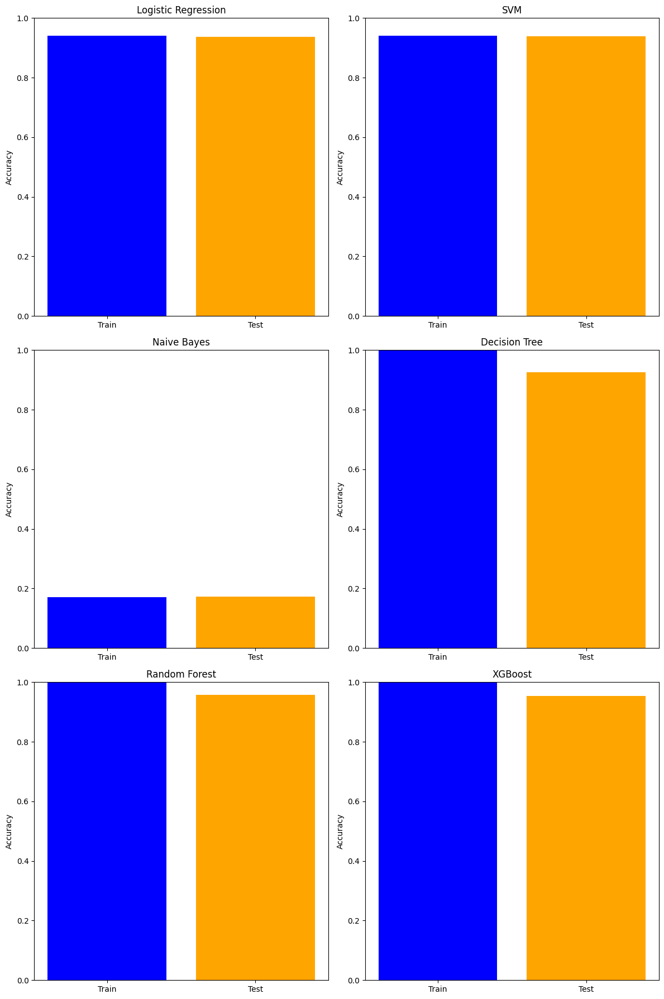

In [173]:
from sklearn.svm import SVC
# Initialize models
models = {
    "Logistic Regression": LogisticRegression(),
    "SVM": SVC(probability=True),
    "Naive Bayes": GaussianNB(),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "XGBoost": xgb.XGBClassifier()
}

# Initialize a dictionary to store performance metrics for each model
performance_metrics = {}

# Evaluate performance for each model
for name, model in models.items():
    performance_metrics[name] = evaluate_performance(model, X_train, y_train, X_test, y_test)

# Plotting performance metrics for each model
num_plots = len(performance_metrics)
num_cols = 2  # Two plots per row
num_rows = -(-num_plots // num_cols)  # Ceiling division to calculate the number of rows
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 6*num_rows))

plot_idx = 0
for name, metrics in performance_metrics.items():
    row = plot_idx // num_cols
    col = plot_idx % num_cols
    ax = axes[row, col]
    
    ax.bar(["Train", "Test"], [metrics["Train Accuracy"], metrics["Test Accuracy"]], color=["blue", "orange"])
    ax.set_title(name)
    ax.set_ylabel("Accuracy")
    ax.set_ylim(0, 1)  # Fix y-axis to be between 0 and 1

    plot_idx += 1

# Hide empty subplots if any
for i in range(plot_idx, num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.show()

In [180]:

import pandas as pd

# Initialize models
models = {
    "Logistic Regression": LogisticRegression(),
    "SVM": SVC(probability=True),
    "Naive Bayes": GaussianNB(),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "XGBoost": xgb.XGBClassifier()
}

# Initialize a dictionary to store performance metrics for each model
performance_metrics = {}

# Evaluate performance for each model
for name, model in models.items():
    performance_metrics[name] = evaluate_performance(model, X_train, y_train, X_test, y_test)

# Create a DataFrame to store performance metrics
performance_df = pd.DataFrame(performance_metrics).T  # Transpose to have models as rows

# Display the DataFrame
performance_df

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1 Score,Test F1 Score
Logistic Regression,0.939882,0.937725,0.560000,0.200000,0.029787,0.008475,0.056566,0.016260
SVM,0.940396,0.939269,1.000000,0.000000,0.014894,0.000000,0.029350,0.000000
Naive Bayes,0.171859,0.173443,0.065442,0.064912,0.955319,0.940678,0.122494,0.121444
Decision Tree,1.000000,0.922800,1.000000,0.388889,1.000000,0.474576,1.000000,0.427481
Random Forest,1.000000,0.956768,1.000000,0.840000,1.000000,0.355932,1.000000,0.500000
XGBoost,1.000000,0.954195,1.000000,0.693333,1.000000,0.440678,1.000000,0.538860


In [181]:
from sklearn.metrics import roc_auc_score

# Initialize empty lists to store AUC values for train and test sets
auc_train_values = []
auc_test_values = []

# Compute AUC for each model
for name, model in models.items():
    # Fit the model
    model.fit(X_train, y_train)
    
    # Predict probabilities on train and test sets
    y_train_pred_proba = model.predict_proba(X_train)[:, 1]
    y_test_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Calculate AUC for train and test sets
    auc_train = roc_auc_score(y_train, y_train_pred_proba)
    auc_test = roc_auc_score(y_test, y_test_pred_proba)
    
    # Append AUC values to lists
    auc_train_values.append(auc_train)
    auc_test_values.append(auc_test)

# Add AUC train and AUC test columns to the DataFrame
performance_df['AUC Train'] = auc_train_values
performance_df['AUC Test'] = auc_test_values

# Display the updated DataFrame
performance_df

,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1 Score,Test F1 Score,AUC Train,AUC Test
Logistic Regression,0.939882,0.937725,0.560000,0.200000,0.029787,0.008475,0.056566,0.016260,0.807297,0.831112
SVM,0.940396,0.939269,1.000000,0.000000,0.014894,0.000000,0.029350,0.000000,0.920416,0.817924
Naive Bayes,0.171859,0.173443,0.065442,0.064912,0.955319,0.940678,0.122494,0.121444,0.725910,0.751465
Decision Tree,1.000000,0.922800,1.000000,0.388889,1.000000,0.474576,1.000000,0.427481,1.000000,0.692266
Random Forest,1.000000,0.956768,1.000000,0.840000,1.000000,0.355932,1.000000,0.500000,1.000000,0.928974
XGBoost,1.000000,0.954195,1.000000,0.693333,1.000000,0.440678,1.000000,0.538860,1.000000,0.933211


In [182]:
from sklearn.metrics import roc_auc_score

# Initialize empty lists to store AUC values for train and test sets
auc_train_values = []
auc_test_values = []

# Compute AUC for each model
for name, model in models.items():
    # Fit the model
    model.fit(X_train, y_train)
    
    # Predict probabilities on train and test sets
    y_train_pred_proba = model.predict_proba(X_train)[:, 1]
    y_test_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Calculate AUC for train and test sets
    auc_train = roc_auc_score(y_train, y_train_pred_proba)
    auc_test = roc_auc_score(y_test, y_test_pred_proba)
    
    # Append AUC values to lists
    auc_train_values.append(auc_train)
    auc_test_values.append(auc_test)

# Add AUC train and AUC test columns to the DataFrame
performance_df['AUC Train'] = auc_train_values
performance_df['AUC Test'] = auc_test_values

# Display the updated DataFrame
performance_df

,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1 Score,Test F1 Score,AUC Train,AUC Test
Logistic Regression,0.939882,0.937725,0.560000,0.200000,0.029787,0.008475,0.056566,0.016260,0.807297,0.831112
SVM,0.940396,0.939269,1.000000,0.000000,0.014894,0.000000,0.029350,0.000000,0.922271,0.816448
Naive Bayes,0.171859,0.173443,0.065442,0.064912,0.955319,0.940678,0.122494,0.121444,0.725910,0.751465
Decision Tree,1.000000,0.922800,1.000000,0.388889,1.000000,0.474576,1.000000,0.427481,1.000000,0.708266
Random Forest,1.000000,0.956768,1.000000,0.840000,1.000000,0.355932,1.000000,0.500000,1.000000,0.930594
XGBoost,1.000000,0.954195,1.000000,0.693333,1.000000,0.440678,1.000000,0.538860,1.000000,0.933211


In [183]:
df_Before_GAN

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,DAT_NAI_GER,SEC_ACTIVITE,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,Défaut,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER
0,2017,27209244.29,1243534.60,964250.29,225538.69,4335258.76,4335258.76,7803888.80,4335258.76,-3468630.04,...,1961-01-01,3,6,0,0,2,0,16.887671,12.052055,57.035616
1,2018,17401718.12,874156.43,634975.42,286005.55,4621264.31,4621264.31,7861023.65,4621264.31,-3239759.34,...,1961-01-01,3,6,0,0,2,0,17.887671,13.052055,58.035616
2,2016,24109436.43,753869.48,426626.06,210857.98,4109720.08,4109720.08,9794792.31,4109720.08,-5685072.23,...,1961-01-01,3,6,0,0,2,0,15.887671,11.052055,56.035616
3,2016,31195868.50,5209063.92,4343626.96,3040536.96,7306476.76,7306476.76,7147534.46,7306476.76,158942.30,...,1968-01-25,19,6,0,0,2,1,8.676712,8.594521,50.682192
4,2019,28290515.52,6309036.96,4975869.22,3169470.28,24322628.66,24309159.29,8861455.59,24322628.66,15447703.70,...,1933-01-12,98,6,0,0,3,0,38.597260,38.715068,87.024658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9706,2020,17039000.00,-3501000.00,-9970000.00,-12313000.00,83153000.00,67209000.00,88453000.00,21931000.00,-21244000.00,...,1968-01-25,111,4,0,0,7,0,6.460274,1.709589,50.682192
9707,2017,21802317.68,-332377.54,-1010307.33,-3418023.48,7090079.10,3672055.62,4843489.08,-2418023.48,-1171433.46,...,1953-01-01,37,7,0,0,1,0,17.260274,-1.317808,65.041096
9708,2020,36863000.00,1224000.00,656000.00,79000.00,16889000.00,16889000.00,14488000.00,12299000.00,2401000.00,...,1964-02-22,163,6,0,0,2,0,10.109589,1.635616,56.895890
9709,2020,11741000.00,-154000.00,-216000.00,-410000.00,1998000.00,1588000.00,4173000.00,1513000.00,-2585000.00,...,1973-11-20,42,7,0,0,2,0,5.876712,1.594521,47.145205


### Gan Evaluation splitting then resampling 

In [184]:
# Split the data into features and target
X = df.drop(columns=["Défaut"])
y = df["Défaut"]

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
y_train.value_counts()

Défaut
0    7298
1     470
Name: count, dtype: int64

In [185]:
gen_defaut_rows2 =y_train[y_train==0].count()-y_train[y_train==1].count()
gen_defaut_rows2

6828

In [186]:
import tensorflow.keras.models as models
best_generator = models.load_model(checkpoint_prefix +'_4994.h5')
latent_space=100
Array_GAN_After_Learning2=best_generator.predict(np.random.randn(gen_defaut_rows2, latent_space))
print('les données générées =',len(Array_GAN_After_Learning2))
print(len(Array_GAN_After_Learning2[0]))
Array_GAN_After_Learning2

214/214 [==============================] - 0s 1ms/step
les données générées = 6828
36


array([[-0.5098382 , -0.95467144,  0.19409817, ..., -0.9345583 ,
        -0.8925222 , -0.52147204],
       [-0.20799161, -0.8955031 ,  0.12704524, ..., -0.7758975 ,
        -0.92854315, -0.30307814],
       [-0.95848554, -0.8561635 ,  0.02615632, ..., -0.14593528,
        -0.71328366, -0.42816523],
       ...,
       [ 0.3355899 , -0.80650747,  0.06791381, ..., -0.03430156,
        -0.48529375, -0.40096188],
       [ 0.6980935 , -0.84325695,  0.06375904, ..., -0.8734295 ,
        -0.9143319 , -0.1952634 ],
       [ 0.764947  , -0.89253926,  0.05073475, ..., -0.24119894,
        -0.3716812 , -0.51028967]], dtype=float32)

In [187]:
X_train_gan=array_to_dataframe_original_values(Array_GAN_After_Learning2,defauts_before_encoding)
X_train_gan["Défaut"]=1
y_train_gan=X_train_gan["Défaut"]
X_train_gan=X_train_gan.drop(columns=["Défaut"])
X_train_gan

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,moyenne_mvt_deb,moyenne_mvt_crd,SEC_ACTIVITE,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER
0,2016.980347,5531036.00,3998768.0,-38408384.0,-39411600.0,-14009584.0,326381696.0,-127844944.0,131705472.0,-7390304.0,...,6.725872,0.151651,119.327126,5.157907,5.996823e-04,0.000000e+00,6.609486,3.750957,4.335983,33.486290
1,2017.583984,12750816.00,607092.0,3698424.0,7773472.0,-63664696.0,-98516048.0,34171344.0,19015776.0,3292448.0,...,12.981053,0.020269,161.999893,5.007607,5.364418e-07,7.152557e-07,2.620257,10.008711,3.275784,41.463051
2,2016.083008,17551074.00,-4496084.0,-15146816.0,-6127744.0,-26367960.0,-57656656.0,31237296.0,25296608.0,-10748384.0,...,45.754776,0.470706,15.344592,5.944469,2.411008e-05,1.713246e-03,4.393157,34.855114,9.611489,36.894287
3,2018.619751,2989363.25,-6740180.0,-18677104.0,4023488.0,-102424040.0,-22500464.0,52828576.0,-109555056.0,-63037600.0,...,1.694914,0.048841,158.007004,5.588872,6.523728e-05,1.000000e+00,14.569137,4.343102,2.541580,20.114145
4,2016.761963,32697024.00,2025088.0,14401096.0,1089424.0,-20819960.0,-48524128.0,48734704.0,-28569680.0,-12410848.0,...,58.841839,0.850445,121.335182,6.144191,2.419949e-05,5.452335e-04,9.746485,8.138750,2.795616,49.618156
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6823,2017.629395,22256462.00,14296.0,22735608.0,2274784.0,-28035696.0,-83099288.0,9615504.0,10376864.0,-4718464.0,...,26.333845,0.100368,73.344414,5.734945,2.026558e-06,1.192093e-07,4.247647,3.665570,1.499593,32.970444
6824,2018.516479,13806203.00,2561000.0,8939224.0,-510528.0,54267536.0,150146304.0,46334576.0,-70804400.0,-31816512.0,...,177.903046,2.675879,140.644730,5.939286,1.797706e-03,6.490946e-05,5.002372,13.664821,13.117473,49.402153
6825,2018.671143,23610152.00,-2383904.0,-5481096.0,3970224.0,-47150512.0,-30114688.0,62783712.0,-16990256.0,-17693280.0,...,17.390676,0.259346,98.377907,4.588811,2.890825e-05,1.286449e-01,1.451362,39.258072,16.321888,37.887882
6826,2019.396240,19125944.00,-2594056.0,3664856.0,10532304.0,-84643552.0,-61156224.0,-53762496.0,79718080.0,-9159904.0,...,23.647642,0.333340,7.601234,5.474007,2.416968e-05,0.000000e+00,2.736681,6.161943,3.694061,45.400948


In [188]:
y_train.value_counts()

Défaut
0    7298
1     470
Name: count, dtype: int64

#### Etapes de reequilibrage et preparation des classes

In [192]:
import math
# Split the data into features and target
X_gan = df.drop(columns=["Défaut"])
y_gan = df["Défaut"]
# Split the data into features and target
X = df.drop(columns=["Défaut"])
y = df["Défaut"]


# Split data into train and test sets
X_train_gan, X_test_gan, y_train_gan, y_test_gan = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
y_train.value_counts()

gen_defaut_rows2 =y_train[y_train==0].count()-y_train[y_train==1].count()
gen_defaut_rows2
best_generator = models.load_model(checkpoint_prefix +'_4994.h5')
latent_space=100
Array_GAN_After_Learning2=best_generator.predict(np.random.randn(gen_defaut_rows2, latent_space))
print('les données générées =',len(Array_GAN_After_Learning2))
print(len(Array_GAN_After_Learning2[0]))
Array_GAN_After_Learning2
X_train_gan=array_to_dataframe_original_values(Array_GAN_After_Learning2,defauts_before_encoding)
X_train_gan["Défaut"]=1
y_train_gan=X_train_gan["Défaut"]
X_train_gan=X_train_gan.drop(columns=["Défaut"])
columns_to_encode = ['SEC_ACTIVITE', 'CATEGORIE_JUR', 'Secteurs2']
# Appliquer la fonction round pour avoir des valeurs arrondi
X_train_gan["Annee"]=X_train_gan["Annee"].apply(round)
X_train_gan['Flag_client_cote'] = X_train_gan['Flag_client_cote'].apply(round)
X_train_gan['Flag_groupe'] = X_train_gan['Flag_groupe'].apply(round)
X_train_gan[columns_to_encode] = X_train_gan[columns_to_encode].apply(round).astype(int)
X_train_gan

214/214 [==============================] - 0s 1ms/step
les données générées = 6828
36


,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,moyenne_mvt_deb,moyenne_mvt_crd,SEC_ACTIVITE,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER
0,2016,82027336.0,4323464.0,19898232.0,2258128.0,-36850288.0,-83053040.0,85563296.0,7941888.0,-21969248.0,...,18.147058,0.040904,108,5,0,0,1,20.010010,12.808583,35.677601
1,2017,56473604.0,6972720.0,5229600.0,3149376.0,87370032.0,42710896.0,67032688.0,-23940528.0,-44185728.0,...,97.240868,1.858524,25,7,0,0,2,11.360613,11.065855,44.642014
2,2018,11383968.0,756528.0,1405624.0,-3337952.0,-74312424.0,53922016.0,-26858528.0,28367136.0,7490656.0,...,23.479574,0.020635,179,5,0,0,6,5.761096,3.204563,43.245804
3,2017,24083734.0,1831628.0,-444376.0,-505808.0,39044224.0,-45920944.0,17930336.0,-14830368.0,-4327840.0,...,62.571899,1.071450,15,6,0,0,2,27.150349,13.734646,44.264969
4,2017,12088360.0,-1278732.0,3822160.0,-4420192.0,-59967088.0,-70160208.0,153718432.0,-36776848.0,-15426656.0,...,13.159559,0.203301,117,5,0,0,3,22.724077,7.114978,41.264191
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6823,2016,32645546.0,8901084.0,-7904000.0,6938976.0,66829184.0,8680848.0,29555616.0,10008000.0,-4660160.0,...,60.107285,0.147866,76,5,0,0,8,16.983971,9.260971,45.165543
6824,2016,12150115.0,-3679188.0,10866760.0,-12086592.0,-38343672.0,-97241888.0,144776064.0,-40846288.0,-12496896.0,...,20.075096,0.292192,46,5,0,1,2,28.772013,11.900950,49.113060
6825,2018,17236116.0,-2187180.0,-4482016.0,-4905968.0,4310768.0,-67983936.0,69246240.0,-27102256.0,-11821024.0,...,22.894865,0.425283,118,5,0,0,1,17.691542,9.644873,46.717476
6826,2020,2830746.0,-1454928.0,-5323992.0,-3781456.0,-15520992.0,-70037088.0,-52781224.0,-4120640.0,5351904.0,...,15.234410,0.082663,189,5,0,0,13,3.874666,1.721415,43.567474


In [193]:
df

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,DAT_NAI_GER,SEC_ACTIVITE,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,Défaut,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER
0,2017,27209244.29,1243534.60,964250.29,225538.69,4335258.76,4335258.76,7803888.80,4335258.76,-3468630.04,...,1961-01-01,3,6,0,0,2,0,16.887671,12.052055,57.035616
1,2018,17401718.12,874156.43,634975.42,286005.55,4621264.31,4621264.31,7861023.65,4621264.31,-3239759.34,...,1961-01-01,3,6,0,0,2,0,17.887671,13.052055,58.035616
2,2016,24109436.43,753869.48,426626.06,210857.98,4109720.08,4109720.08,9794792.31,4109720.08,-5685072.23,...,1961-01-01,3,6,0,0,2,0,15.887671,11.052055,56.035616
3,2016,31195868.50,5209063.92,4343626.96,3040536.96,7306476.76,7306476.76,7147534.46,7306476.76,158942.30,...,1968-01-25,19,6,0,0,2,1,8.676712,8.594521,50.682192
4,2019,28290515.52,6309036.96,4975869.22,3169470.28,24322628.66,24309159.29,8861455.59,24322628.66,15447703.70,...,1933-01-12,98,6,0,0,3,0,38.597260,38.715068,87.024658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9706,2020,17039000.00,-3501000.00,-9970000.00,-12313000.00,83153000.00,67209000.00,88453000.00,21931000.00,-21244000.00,...,1968-01-25,111,4,0,0,7,0,6.460274,1.709589,50.682192
9707,2017,21802317.68,-332377.54,-1010307.33,-3418023.48,7090079.10,3672055.62,4843489.08,-2418023.48,-1171433.46,...,1953-01-01,37,7,0,0,1,0,17.260274,-1.317808,65.041096
9708,2020,36863000.00,1224000.00,656000.00,79000.00,16889000.00,16889000.00,14488000.00,12299000.00,2401000.00,...,1964-02-22,163,6,0,0,2,0,10.109589,1.635616,56.895890
9709,2020,11741000.00,-154000.00,-216000.00,-410000.00,1998000.00,1588000.00,4173000.00,1513000.00,-2585000.00,...,1973-11-20,42,7,0,0,2,0,5.876712,1.594521,47.145205


#### Etapes de reequilibrage et preparation des données : roc curve 

214/214 [==============================] - 0s 1ms/step
y train de la GAN = Défaut
1    7298
0    7298
Name: count, dtype: int64
y test de la GAN = Défaut
0    1825
1     118
Name: count, dtype: int64
[[0.9662266  0.03377343]
 [0.9846112  0.01538881]
 [0.99078816 0.00921181]
 ...
 [0.97817385 0.02182614]
 [0.9969638  0.00303618]
 [0.990954   0.00904601]]


c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\user\anaconda

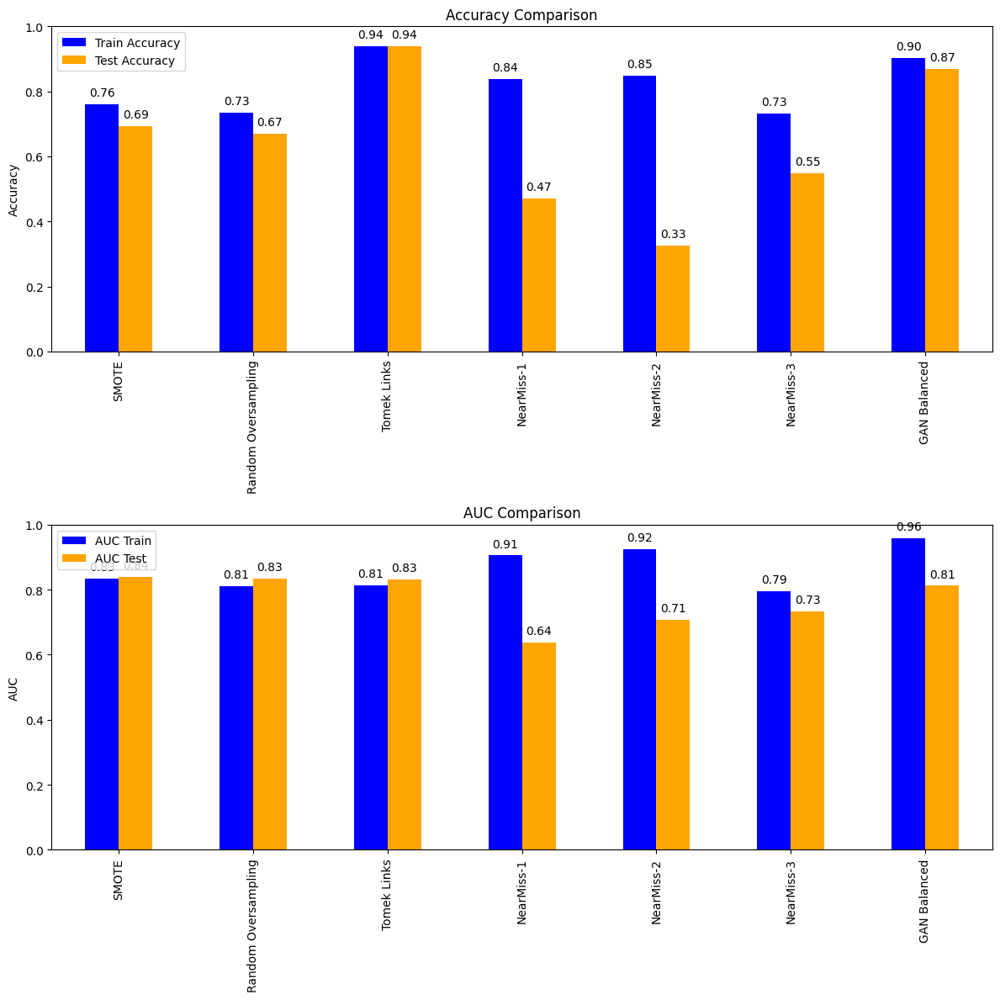

In [194]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE, RandomOverSampler, ADASYN
from imblearn.under_sampling import TomekLinks, NearMiss

def evaluate_performance(model, X_train, y_train, X_test, y_test):
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Predictions on training set
    y_train_pred = model.predict(X_train)
    
    # Predictions on testing set
    y_test_pred = model.predict(X_test)
    
    # Compute performance metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    
    train_precision = precision_score(y_train, y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    
    train_recall = recall_score(y_train, y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    
    train_f1_score = f1_score(y_train, y_train_pred)
    test_f1_score = f1_score(y_test, y_test_pred)
    
    # Predict probabilities
    y_train_pred_proba = model.predict_proba(X_train)[:, 1]
    y_test_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Calculate AUC for train and test sets
    auc_train = roc_auc_score(y_train, y_train_pred_proba)
    auc_test = roc_auc_score(y_test, y_test_pred_proba)
    

    # Make predictions on the test set
    #y_pred = model.predict(X_test)
    # Evaluate the performance
    #acc = accuracy_score(y_test, y_pred)
    #report = classification_report(y_test, y_pred)
    #print(f'Accuracy: {acc:.2f}')
    #print('Classification Report:\n', report)


    # Return performance metrics
    return {
        "Train Accuracy": train_accuracy, "Test Accuracy": test_accuracy,
        "Train Precision": train_precision, "Test Precision": test_precision,
        "Train Recall": train_recall, "Test Recall": test_recall,
        "Train F1 Score": train_f1_score, "Test F1 Score": test_f1_score,
        "AUC Train": auc_train, "AUC Test": auc_test
    }

def plot_performance_comparison(df, techniques, model):
    df= df.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
    # Split the data into features and target
    X = df.drop(columns=["Défaut"])
    y = df["Défaut"]

    # Split data into train and test sets of gan technique
    X_train_gan1, X_test_gan, y_train_gan1, y_test_gan = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

    gen_defaut_rows2 =y_train_gan1[y_train_gan1==0].count()-y_train_gan1[y_train_gan1==1].count()
    best_generator = models.load_model(checkpoint_prefix +'_4994.h5')
    latent_space=100
    Array_GAN_After_Learning2=best_generator.predict(np.random.randn(gen_defaut_rows2, latent_space))
    X_train_gan=array_to_dataframe_original_values(Array_GAN_After_Learning2,defauts_before_encoding)
    X_train_gan["Défaut"]=1
    y_train_gan=X_train_gan["Défaut"]
    X_train_gan=X_train_gan.drop(columns=["Défaut"])
    columns_to_encode = ['SEC_ACTIVITE', 'CATEGORIE_JUR', 'Secteurs2']
    # Appliquer la fonction round pour avoir des valeurs arrondi
    X_train_gan["Annee"]=X_train_gan["Annee"].apply(round)
    X_train_gan['Flag_client_cote'] = X_train_gan['Flag_client_cote'].apply(round)
    X_train_gan['Flag_groupe'] = X_train_gan['Flag_groupe'].apply(round)
    X_train_gan[columns_to_encode] = X_train_gan[columns_to_encode].apply(round).astype(int)
    X_train_gan = pd.concat([X_train_gan, X_train_gan1])
    y_train_gan = pd.concat([y_train_gan, y_train_gan1])
    print("y train de la GAN =",y_train_gan.value_counts())
    print("y test de la GAN =",y_test_gan.value_counts())
    print(model.predict_proba(X_test_gan))




    # Split data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

    # Standardize features if needed
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    X_train_gan = scaler.fit_transform(X_train_gan)
    X_test_gan = scaler.transform(X_test_gan)

    performance_metrics = {}
    
    for technique_name, technique in techniques.items():
        # Apply the oversampling technique
        X_resampled, y_resampled = technique.fit_resample(X_train, y_train)
        
        # Initialize and evaluate Logistic Regression model
        model = LogisticRegression()
        performance_metrics[technique_name] = evaluate_performance(model, X_resampled, y_resampled, X_test, y_test)
        
    # Evaluate performance for the balanced GAN dataset
    model_gan = LogisticRegression()
    performance_metrics["GAN Balanced"] = evaluate_performance(model_gan, X_train_gan, y_train_gan, X_test_gan, y_test_gan)

    # Create a DataFrame to store performance metrics
    performance_df = pd.DataFrame(performance_metrics).T  # Transpose to have techniques as rows

    # Plotting performance metrics
    fig, axes = plt.subplots(2, 1, figsize=(12, 12))

    # Plot Accuracy Comparison
    performance_df[['Train Accuracy', 'Test Accuracy']].plot(kind='bar', ax=axes[0], color=["blue", "orange"])
    axes[0].set_title("Accuracy Comparison")
    axes[0].set_ylabel("Accuracy")
    axes[0].set_ylim(0, 1)
    
    # Adding values in front of the bars for Accuracy
    for p in axes[0].patches:
        axes[0].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')

    # Plot AUC Comparison
    performance_df[['AUC Train', 'AUC Test']].plot(kind='bar', ax=axes[1], color=["blue", "orange"])
    axes[1].set_title("AUC Comparison")
    axes[1].set_ylabel("AUC")
    axes[1].set_ylim(0, 1)
    
    # Adding values in front of the bars for AUC
    for p in axes[1].patches:
        axes[1].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')

    plt.tight_layout()
    plt.show()




# Assume df_gan is your balanced dataset
df_gan = df_tot.copy()

# Define oversampling techniques
oversampling_techniques = {
    "SMOTE": SMOTE(random_state=42),
    "Random Oversampling": RandomOverSampler(random_state=42),
    "Tomek Links": TomekLinks(),
    "NearMiss-1": NearMiss(version=1), 
    "NearMiss-2": NearMiss(version=2),  
    "NearMiss-3": NearMiss(version=3)
}

plot_performance_comparison(df, oversampling_techniques,model)

In [376]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE, RandomOverSampler, ADASYN
from imblearn.under_sampling import TomekLinks, NearMiss

def evaluate_performance(model, X_train, y_train, X_test, y_test):
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Predictions on training set
    y_train_pred = model.predict(X_train)
    
    # Predictions on testing set
    y_test_pred = model.predict(X_test)
    
    # Compute performance metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    
    train_precision = precision_score(y_train, y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    
    train_recall = recall_score(y_train, y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    
    train_f1_score = f1_score(y_train, y_train_pred)
    test_f1_score = f1_score(y_test, y_test_pred)
    
    # Predict probabilities
    y_train_pred_proba = model.predict_proba(X_train)[:, 1]
    y_test_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Calculate AUC for train and test sets
    auc_train = roc_auc_score(y_train, y_train_pred_proba)
    auc_test = roc_auc_score(y_test, y_test_pred_proba)
    

    # Make predictions on the test set
    #y_pred = model.predict(X_test)
    # Evaluate the performance
    #acc = accuracy_score(y_test, y_pred)
    #report = classification_report(y_test, y_pred)
    #print(f'Accuracy: {acc:.2f}')
    #print('Classification Report:\n', report)


    # Return performance metrics
    return {
        "Train Accuracy": train_accuracy, "Test Accuracy": test_accuracy,
        "Train Precision": train_precision, "Test Precision": test_precision,
        "Train Recall": train_recall, "Test Recall": test_recall,
        "Train F1 Score": train_f1_score, "Test F1 Score": test_f1_score,
        "AUC Train": auc_train, "AUC Test": auc_test
    }

def plot_performance_comparison(df, techniques):
    df= df.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
    # Split the data into features and target
    X = df.drop(columns=["Défaut"])
    y = df["Défaut"]

    # Split data into train and test sets of gan technique
    X_train_gan1, X_test_gan, y_train_gan1, y_test_gan = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

    gen_defaut_rows2 =y_train_gan1[y_train_gan1==0].count()-y_train_gan1[y_train_gan1==1].count()
    best_generator = models.load_model(checkpoint_prefix +'_3929.h5')
    latent_space=100
    Array_GAN_After_Learning2=best_generator.predict(np.random.randn(gen_defaut_rows2, latent_space))
    X_train_gan=array_to_dataframe_original_values(Array_GAN_After_Learning2,defauts_before_encoding)
    X_train_gan["Défaut"]=1
    y_train_gan=X_train_gan["Défaut"]
    X_train_gan=X_train_gan.drop(columns=["Défaut"])
    columns_to_encode = ['SEC_ACTIVITE', 'CATEGORIE_JUR', 'Secteurs2']
    # Appliquer la fonction round pour avoir des valeurs arrondi
    X_train_gan["Annee"]=X_train_gan["Annee"].apply(round)
    X_train_gan['Flag_client_cote'] = X_train_gan['Flag_client_cote'].apply(round)
    X_train_gan['Flag_groupe'] = X_train_gan['Flag_groupe'].apply(round)
    X_train_gan[columns_to_encode] = X_train_gan[columns_to_encode].apply(round).astype(int)
    X_train_gan = pd.concat([X_train_gan, X_train_gan1])
    y_train_gan = pd.concat([y_train_gan, y_train_gan1])
    print("y train de la GAN =",y_train_gan.value_counts())
    print("y test de la GAN =",y_test_gan.value_counts())





    # Split data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

    # Standardize features if needed
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    X_train_gan = scaler.fit_transform(X_train_gan)
    X_test_gan = scaler.transform(X_test_gan)

    performance_metrics = {}
    
    for technique_name, technique in techniques.items():
        # Apply the oversampling technique
        X_resampled, y_resampled = technique.fit_resample(X_train, y_train)
        
        # Initialize and evaluate Logistic Regression model
        model = LogisticRegression()
        performance_metrics[technique_name] = evaluate_performance(model, X_resampled, y_resampled, X_test, y_test)
        
    # Evaluate performance for the balanced GAN dataset
    model_gan = LogisticRegression()
    performance_metrics["GAN Balanced"] = evaluate_performance(model_gan, X_train_gan, y_train_gan, X_test_gan, y_test_gan)

    # Create a DataFrame to store performance metrics
    performance_df = pd.DataFrame(performance_metrics).T  # Transpose to have techniques as rows

    # Plotting performance metrics
    fig, axes = plt.subplots(2, 1, figsize=(12, 12))

    # Plot Accuracy Comparison
    performance_df[['Train Recall', 'Test Recall']].plot(kind='bar', ax=axes[0], color=["blue", "orange"])
    axes[0].set_title("Recall Comparison")
    axes[0].set_ylabel("Recall")
    axes[0].set_ylim(0, 1)
    
    # Adding values in front of the bars for Accuracy
    for p in axes[0].patches:
        axes[0].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')

    # Plot AUC Comparison
    performance_df[['Train Precision', 'Test Precision']].plot(kind='bar', ax=axes[1], color=["blue", "orange"])
    axes[1].set_title("AUC Comparison")
    axes[1].set_ylabel("AUC")
    axes[1].set_ylim(0, 1)
    
    # Adding values in front of the bars for AUC
    for p in axes[1].patches:
        axes[1].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')

    plt.tight_layout()
    plt.show()





# Assume df_gan is your balanced dataset
df_gan = df_tot.copy()

# Define oversampling techniques
oversampling_techniques = {
    "SMOTE": SMOTE(random_state=42),
    "Random Oversampling": RandomOverSampler(random_state=42),
    "Tomek Links": TomekLinks(),
    "NearMiss-1": NearMiss(version=1), 
    "NearMiss-2": NearMiss(version=2),  
    "NearMiss-3": NearMiss(version=3)
}

plot_performance_comparison(df, oversampling_techniques)

214/214 [==============================] - 0s 1ms/step


TypeError: 'NoneType' object does not support item assignment

In [195]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE, RandomOverSampler, ADASYN
from imblearn.under_sampling import OneSidedSelection, TomekLinks, NearMiss

def evaluate_performance(model, X_train, y_train, X_test, y_test):
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Predictions on training set
    y_train_pred = model.predict(X_train)
    
    # Predictions on testing set
    y_test_pred = model.predict(X_test)
    
    # Compute performance metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    
    train_precision = precision_score(y_train, y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    
    train_recall = recall_score(y_train, y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    
    train_f1_score = f1_score(y_train, y_train_pred)
    test_f1_score = f1_score(y_test, y_test_pred)
    
    # Predict probabilities
    y_train_pred_proba = model.predict_proba(X_train)[:, 1]
    y_test_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Calculate AUC for train and test sets
    auc_train = roc_auc_score(y_train, y_train_pred_proba)
    auc_test = roc_auc_score(y_test, y_test_pred_proba)
    
    # Return performance metrics
    return {
        "Train Accuracy": train_accuracy, "Test Accuracy": test_accuracy,
        "Train Precision": train_precision, "Test Precision": test_precision,
        "Train Recall": train_recall, "Test Recall": test_recall,
        "Train F1 Score": train_f1_score, "Test F1 Score": test_f1_score,
        "AUC Train": auc_train, "AUC Test": auc_test
    }

def plot_performance_comparison(df, techniques):
    # Split the data into features and target
    X = df.drop(columns=["Défaut"])
    y = df["Défaut"]

    # Split data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

    # Standardize features if needed
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    performance_metrics = {}
    
    for technique_name, technique in techniques.items():
        # Apply the oversampling technique
        X_resampled, y_resampled = technique.fit_resample(X_train, y_train)
        
        # Initialize and evaluate Logistic Regression model
        model = LogisticRegression()
        performance_metrics[technique_name] = evaluate_performance(model, X_resampled, y_resampled, X_test, y_test)

    # Create a DataFrame to store performance metrics
    performance_df = pd.DataFrame(performance_metrics).T  # Transpose to have techniques as rows

    # Plotting performance metrics
    fig, axes = plt.subplots(2, 1, figsize=(12, 12))

    performance_df[['Train Accuracy', 'Test Accuracy']].plot(kind='bar', ax=axes[0], color=["blue", "orange"])
    axes[0].set_title("Accuracy Comparison")
    axes[0].set_ylabel("Accuracy")
    axes[0].set_ylim(0, 1)
    
    

    performance_df[['AUC Train', 'AUC Test']].plot(kind='bar', ax=axes[1], color=["blue", "orange"])
    axes[1].set_title("AUC Comparison")
    axes[1].set_ylabel("AUC")
    axes[1].set_ylim(0, 1)

    plt.tight_layout()
    plt.show()



# Define oversampling techniques
oversampling_techniques = {
    "SMOTE": SMOTE(random_state=42),
    "Random Oversampling": RandomOverSampler(random_state=42),
    "Tomek Links": TomekLinks(),
    "NearMiss-1": NearMiss(version=1), 
    "NearMiss-2": NearMiss(version=2),  
    "NearMiss-3": NearMiss(version=3) 
    
}




plot_performance_comparison(dfdrop, oversampling_techniques)

NameError: name 'dfdrop' is not defined

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\user\anaconda

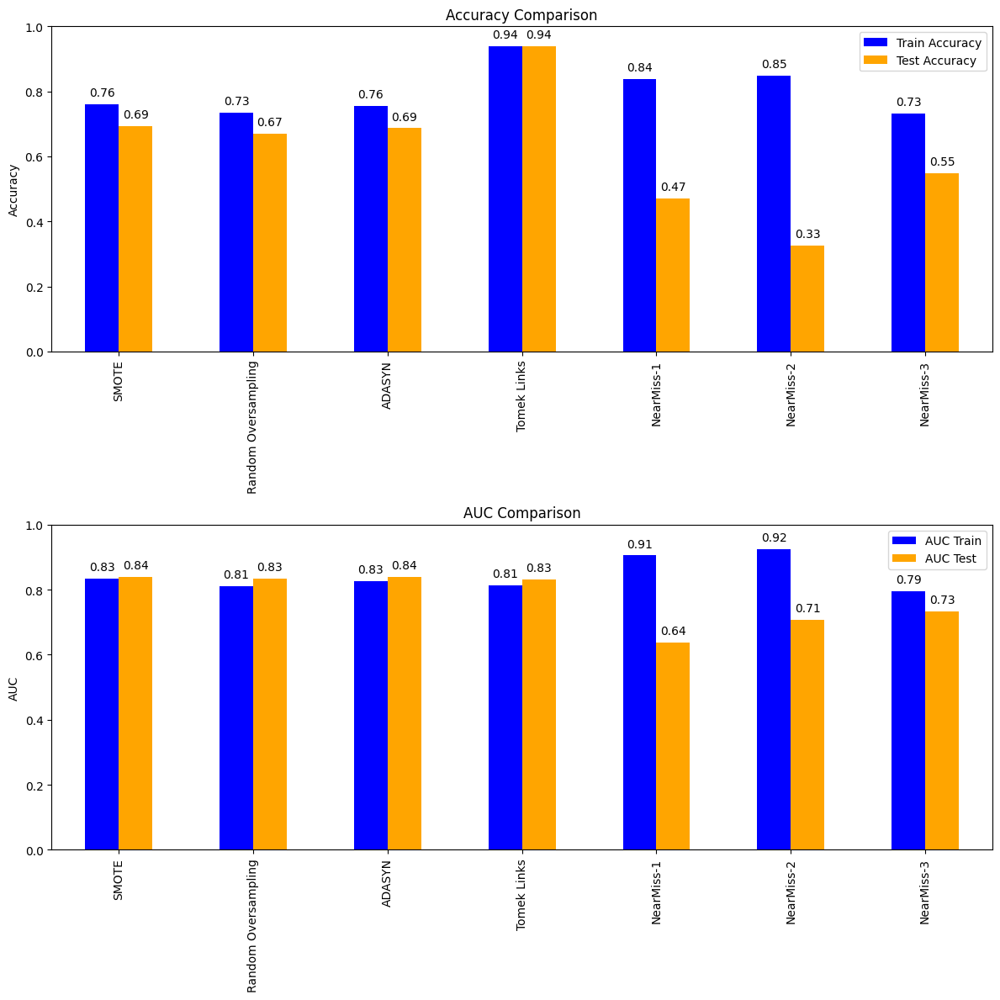

In [196]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE, RandomOverSampler, ADASYN
from imblearn.under_sampling import OneSidedSelection, TomekLinks, NearMiss


# Assuming 'target_column' is your binary target variable
df_tot=df_totale.copy()
df_tot= df_tot.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)


y = df_tot['Défaut']
X = df_tot.drop('Défaut', axis=1)

def evaluate_performance(model, X_train, y_train, X_test, y_test):
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Predictions on training set
    y_train_pred = model.predict(X_train)
    
    # Predictions on testing set
    y_test_pred = model.predict(X_test)
    
    # Compute performance metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    
    train_precision = precision_score(y_train, y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    
    train_recall = recall_score(y_train, y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    
    train_f1_score = f1_score(y_train, y_train_pred)
    test_f1_score = f1_score(y_test, y_test_pred)
    
    # Predict probabilities
    y_train_pred_proba = model.predict_proba(X_train)[:, 1]
    y_test_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Calculate AUC for train and test sets
    auc_train = roc_auc_score(y_train, y_train_pred_proba)
    auc_test = roc_auc_score(y_test, y_test_pred_proba)
    
    # Return performance metrics
    return {
        "Train Accuracy": train_accuracy, "Test Accuracy": test_accuracy,
        "Train Precision": train_precision, "Test Precision": test_precision,
        "Train Recall": train_recall, "Test Recall": test_recall,
        "Train F1 Score": train_f1_score, "Test F1 Score": test_f1_score,
        "AUC Train": auc_train, "AUC Test": auc_test
    }

def plot_performance_comparison(df, techniques):
    # Split the data into features and target
    X = df.drop(columns=["Défaut",'DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'])
    y = df["Défaut"]

    # Split data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

    # Standardize features if needed
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    performance_metrics = {}
    
    for technique_name, technique in techniques.items():
        # Apply the oversampling technique
        X_resampled, y_resampled = technique.fit_resample(X_train, y_train)
        
        # Initialize and evaluate Logistic Regression model
        model = LogisticRegression()
        performance_metrics[technique_name] = evaluate_performance(model, X_resampled, y_resampled, X_test, y_test)

    # Create a DataFrame to store performance metrics
    performance_df = pd.DataFrame(performance_metrics).T  # Transpose to have techniques as rows

    # Plotting performance metrics
    fig, axes = plt.subplots(2, 1, figsize=(12, 12))

    # Plot Accuracy Comparison
    performance_df[['Train Accuracy', 'Test Accuracy']].plot(kind='bar', ax=axes[0], color=["blue", "orange"])
    axes[0].set_title("Accuracy Comparison")
    axes[0].set_ylabel("Accuracy")
    axes[0].set_ylim(0, 1)
    
    # Adding values in front of the bars for Accuracy
    for p in axes[0].patches:
        axes[0].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')

    # Plot AUC Comparison
    performance_df[['AUC Train', 'AUC Test']].plot(kind='bar', ax=axes[1], color=["blue", "orange"])
    axes[1].set_title("AUC Comparison")
    axes[1].set_ylabel("AUC")
    axes[1].set_ylim(0, 1)
    
    # Adding values in front of the bars for AUC
    for p in axes[1].patches:
        axes[1].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')

    plt.tight_layout()
    plt.show()


# Define oversampling techniques
oversampling_techniques = {
    "SMOTE": SMOTE(random_state=42),
    "Random Oversampling": RandomOverSampler(random_state=42),
    "ADASYN": ADASYN(random_state=42),
    "Tomek Links": TomekLinks(),
    "NearMiss-1": NearMiss(version=1), 
    "NearMiss-2": NearMiss(version=2),  
    "NearMiss-3": NearMiss(version=3)
}

plot_performance_comparison(df, oversampling_techniques)

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\user\anaconda

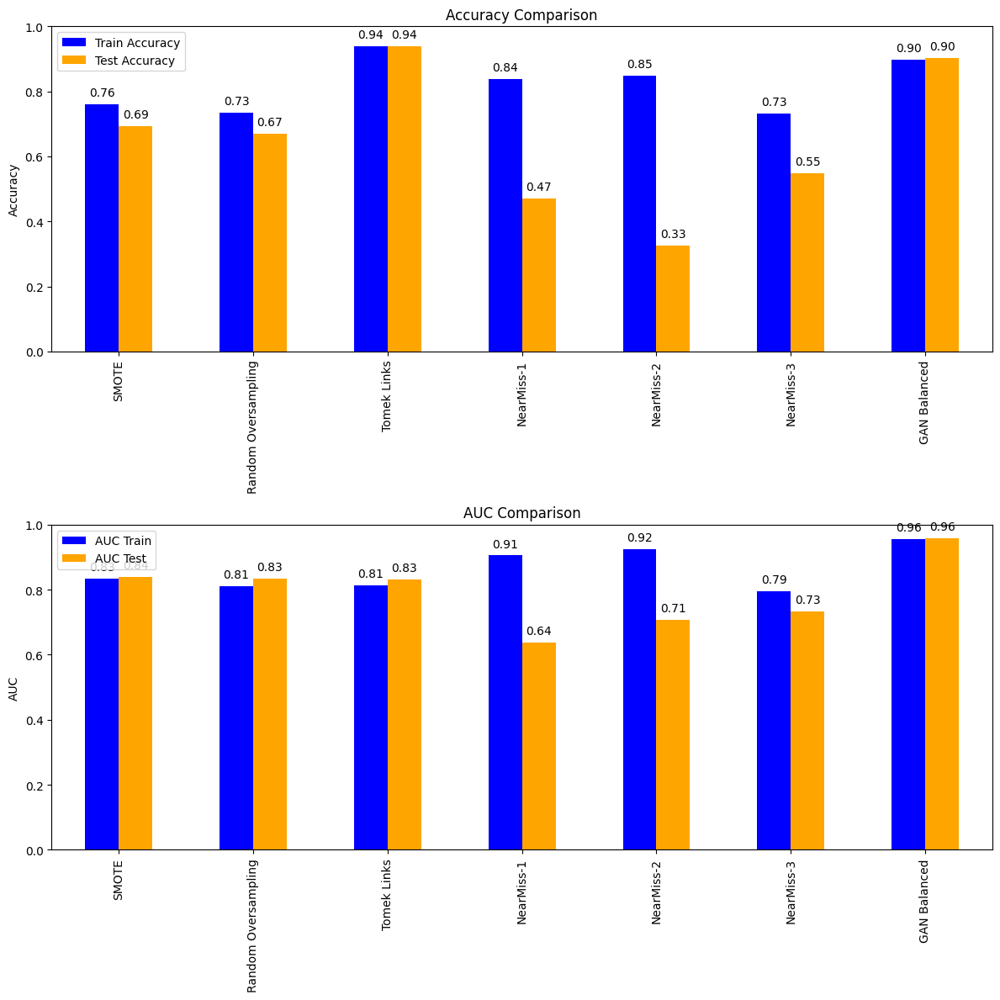

In [261]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE, RandomOverSampler, ADASYN
from imblearn.under_sampling import TomekLinks, NearMiss

def evaluate_performance(model, X_train, y_train, X_test, y_test):
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Predictions on training set
    y_train_pred = model.predict(X_train)
    
    # Predictions on testing set
    y_test_pred = model.predict(X_test)
    
    # Compute performance metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    
    train_precision = precision_score(y_train, y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    
    train_recall = recall_score(y_train, y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    
    train_f1_score = f1_score(y_train, y_train_pred)
    test_f1_score = f1_score(y_test, y_test_pred)
    
    # Predict probabilities
    y_train_pred_proba = model.predict_proba(X_train)[:, 1]
    y_test_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Calculate AUC for train and test sets
    auc_train = roc_auc_score(y_train, y_train_pred_proba)
    auc_test = roc_auc_score(y_test, y_test_pred_proba)
    
    # Return performance metrics
    return {
        "Train Accuracy": train_accuracy, "Test Accuracy": test_accuracy,
        "Train Precision": train_precision, "Test Precision": test_precision,
        "Train Recall": train_recall, "Test Recall": test_recall,
        "Train F1 Score": train_f1_score, "Test F1 Score": test_f1_score,
        "AUC Train": auc_train, "AUC Test": auc_test
    }

def plot_performance_comparison(df, df_gan, techniques):
    # Split the data into features and target
    X = df.drop(columns=["Défaut"])
    y = df["Défaut"]
    X_gan = df_gan.drop(columns=["Défaut"])
    y_gan = df_gan["Défaut"]

    # Split data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
    X_train_gan, X_test_gan, y_train_gan, y_test_gan = train_test_split(X_gan, y_gan, test_size=0.2, stratify=y_gan, random_state=42)

    # Standardize features if needed
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    X_train_gan = scaler.fit_transform(X_train_gan)
    X_test_gan = scaler.transform(X_test_gan)

    performance_metrics = {}
    
    for technique_name, technique in techniques.items():
        # Apply the oversampling technique
        X_resampled, y_resampled = technique.fit_resample(X_train, y_train)
        
        # Initialize and evaluate Logistic Regression model
        model = LogisticRegression()
        performance_metrics[technique_name] = evaluate_performance(model, X_resampled, y_resampled, X_test, y_test)
        
    # Evaluate performance for the balanced GAN dataset
    model_gan = LogisticRegression()
    performance_metrics["GAN Balanced"] = evaluate_performance(model_gan, X_train_gan, y_train_gan, X_test_gan, y_test_gan)

    # Create a DataFrame to store performance metrics
    performance_df = pd.DataFrame(performance_metrics).T  # Transpose to have techniques as rows

    # Plotting performance metrics
    fig, axes = plt.subplots(2, 1, figsize=(12, 12))

    # Plot Accuracy Comparison
    performance_df[['Train Accuracy', 'Test Accuracy']].plot(kind='bar', ax=axes[0], color=["blue", "orange"])
    axes[0].set_title("Accuracy Comparison")
    axes[0].set_ylabel("Accuracy")
    axes[0].set_ylim(0, 1)
    
    # Adding values in front of the bars for Accuracy
    for p in axes[0].patches:
        axes[0].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')

    # Plot AUC Comparison
    performance_df[['AUC Train', 'AUC Test']].plot(kind='bar', ax=axes[1], color=["blue", "orange"])
    axes[1].set_title("AUC Comparison")
    axes[1].set_ylabel("AUC")
    axes[1].set_ylim(0, 1)
    
    # Adding values in front of the bars for AUC
    for p in axes[1].patches:
        axes[1].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')

    plt.tight_layout()
    plt.show()



# Assume df_gan is your balanced dataset
df_gan = df_tot.copy()

# Define oversampling techniques
oversampling_techniques = {
    "SMOTE": SMOTE(random_state=42),
    "Random Oversampling": RandomOverSampler(random_state=42),
    "Tomek Links": TomekLinks(),
    "NearMiss-1": NearMiss(version=1), 
    "NearMiss-2": NearMiss(version=2),  
    "NearMiss-3": NearMiss(version=3)
}

plot_performance_comparison(df, df_gan, oversampling_techniques)

(18246, 36) (18246,)
(18246, 36) (18246,)
(9520, 36) (9520,)
(1176, 36) (1176,)
(1176, 36) (1176,)
(1176, 36) (1176,)


c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



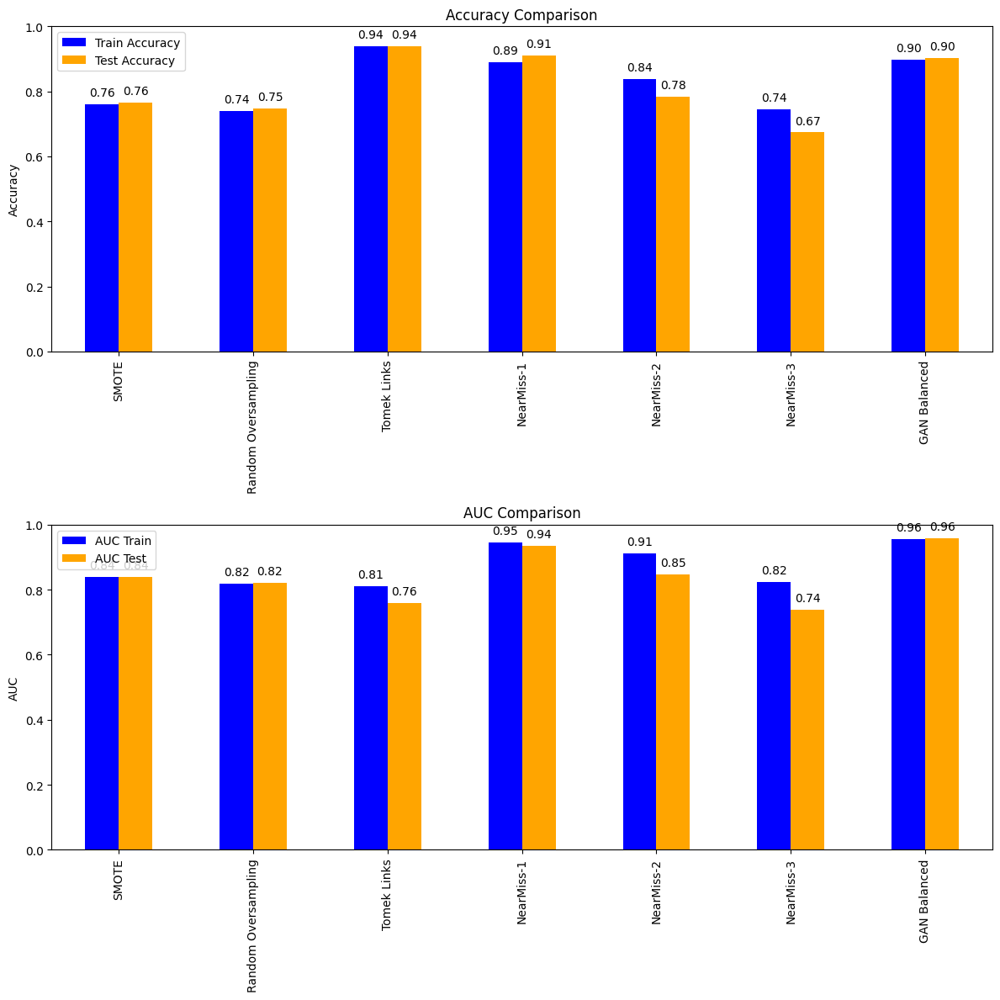

In [259]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE, RandomOverSampler, ADASYN
from imblearn.under_sampling import TomekLinks, NearMiss

def evaluate_performance(model, X_train, y_train, X_test, y_test):
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Predictions on training set
    y_train_pred = model.predict(X_train)
    
    # Predictions on testing set
    y_test_pred = model.predict(X_test)
    
    # Compute performance metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    
    train_precision = precision_score(y_train, y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    
    train_recall = recall_score(y_train, y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    
    train_f1_score = f1_score(y_train, y_train_pred)
    test_f1_score = f1_score(y_test, y_test_pred)
    
    # Predict probabilities
    y_train_pred_proba = model.predict_proba(X_train)[:, 1]
    y_test_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Calculate AUC for train and test sets
    auc_train = roc_auc_score(y_train, y_train_pred_proba)
    auc_test = roc_auc_score(y_test, y_test_pred_proba)
    
    # Return performance metrics
    return {
        "Train Accuracy": train_accuracy, "Test Accuracy": test_accuracy,
        "Train Precision": train_precision, "Test Precision": test_precision,
        "Train Recall": train_recall, "Test Recall": test_recall,
        "Train F1 Score": train_f1_score, "Test F1 Score": test_f1_score,
        "AUC Train": auc_train, "AUC Test": auc_test
    }

def plot_performance_comparison(df, df_gan, techniques):
    # Split the data into features and target
    performance_metrics = {}
    for technique_name, technique in techniques.items():
        # Apply the oversampling technique
        X = df.drop(columns=["Défaut"])
        y = df["Défaut"]
        X_resampled, y_resampled = technique.fit_resample(X, y)
        # Split data into train and test sets
        print(X_resampled.shape,y_resampled.shape)
        X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)
        # Initialize and evaluate Logistic Regression model
        model = LogisticRegression()
        performance_metrics[technique_name] = evaluate_performance(model, X_train, y_train, X_test, y_test)
    X_gan = df_gan.drop(columns=["Défaut"])
    y_gan = df_gan["Défaut"]
    
    
    X_train_gan, X_test_gan, y_train_gan, y_test_gan = train_test_split(X_gan, y_gan, test_size=0.2, stratify=y_gan, random_state=42)

    # Standardize features if needed
    X_train_gan = scaler.fit_transform(X_train_gan)
    X_test_gan = scaler.transform(X_test_gan)


    
    # Evaluate performance for the balanced GAN dataset
    model_gan = LogisticRegression()
    performance_metrics["GAN Balanced"] = evaluate_performance(model_gan, X_train_gan, y_train_gan, X_test_gan, y_test_gan)

    # Create a DataFrame to store performance metrics
    performance_df = pd.DataFrame(performance_metrics).T  # Transpose to have techniques as rows

    # Plotting performance metrics
    fig, axes = plt.subplots(2, 1, figsize=(12, 12))

    # Plot Accuracy Comparison
    performance_df[['Train Accuracy', 'Test Accuracy']].plot(kind='bar', ax=axes[0], color=["blue", "orange"])
    axes[0].set_title("Accuracy Comparison")
    axes[0].set_ylabel("Accuracy")
    axes[0].set_ylim(0, 1)
    
    # Adding values in front of the bars for Accuracy
    for p in axes[0].patches:
        axes[0].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')

    # Plot AUC Comparison
    performance_df[['AUC Train', 'AUC Test']].plot(kind='bar', ax=axes[1], color=["blue", "orange"])
    axes[1].set_title("AUC Comparison")
    axes[1].set_ylabel("AUC")
    axes[1].set_ylim(0, 1)
    
    # Adding values in front of the bars for AUC
    for p in axes[1].patches:
        axes[1].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')

    plt.tight_layout()
    plt.show()



# Assume df_gan is your balanced dataset
df_gan = df_tot.copy()

# Define oversampling techniques
oversampling_techniques = {
    "SMOTE": SMOTE(random_state=42),
    "Random Oversampling": RandomOverSampler(random_state=42),
    "Tomek Links": TomekLinks(),
    "NearMiss-1": NearMiss(version=1), 
    "NearMiss-2": NearMiss(version=2),  
    "NearMiss-3": NearMiss(version=3)
}

plot_performance_comparison(df, df_gan, oversampling_techniques)

(18246, 36) (18246,)
(18246, 36) (18246,)
(9520, 36) (9520,)
(1176, 36) (1176,)
(1176, 36) (1176,)
(1176, 36) (1176,)


c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



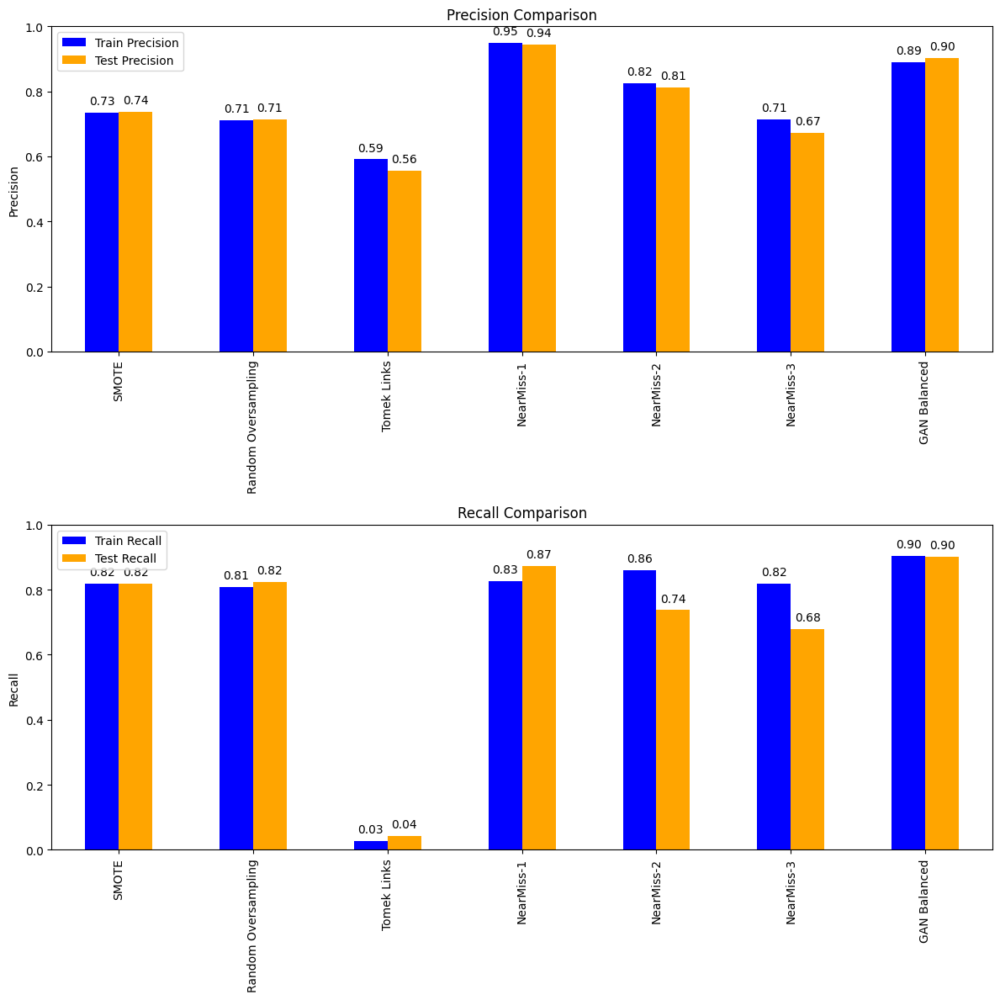

In [270]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE, RandomOverSampler, ADASYN
from imblearn.under_sampling import TomekLinks, NearMiss

def evaluate_performance(model, X_train, y_train, X_test, y_test):
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Predictions on training set
    y_train_pred = model.predict(X_train)
    
    # Predictions on testing set
    y_test_pred = model.predict(X_test)
    
    # Compute performance metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    
    train_precision = precision_score(y_train, y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    
    train_recall = recall_score(y_train, y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    
    train_f1_score = f1_score(y_train, y_train_pred)
    test_f1_score = f1_score(y_test, y_test_pred)
    
    # Predict probabilities
    y_train_pred_proba = model.predict_proba(X_train)[:, 1]
    y_test_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Calculate AUC for train and test sets
    auc_train = roc_auc_score(y_train, y_train_pred_proba)
    auc_test = roc_auc_score(y_test, y_test_pred_proba)
    
    # Return performance metrics
    return {
        "Train Accuracy": train_accuracy, "Test Accuracy": test_accuracy,
        "Train Precision": train_precision, "Test Precision": test_precision,
        "Train Recall": train_recall, "Test Recall": test_recall,
        "Train F1 Score": train_f1_score, "Test F1 Score": test_f1_score,
        "AUC Train": auc_train, "AUC Test": auc_test
    }

def plot_performance_comparison(df, df_gan, techniques):
    # Split the data into features and target
    performance_metrics = {}
    for technique_name, technique in techniques.items():
        # Apply the oversampling technique
        X = df.drop(columns=["Défaut"])
        y = df["Défaut"]
        X_resampled, y_resampled = technique.fit_resample(X, y)
        # Split data into train and test sets
        print(X_resampled.shape,y_resampled.shape)
        X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)
        # Initialize and evaluate Logistic Regression model
        model = LogisticRegression()
        performance_metrics[technique_name] = evaluate_performance(model, X_train, y_train, X_test, y_test)
    X_gan = df_gan.drop(columns=["Défaut"])
    y_gan = df_gan["Défaut"]
    
    
    X_train_gan, X_test_gan, y_train_gan, y_test_gan = train_test_split(X_gan, y_gan, test_size=0.2, stratify=y_gan, random_state=42)

    # Standardize features if needed
    X_train_gan = scaler.fit_transform(X_train_gan)
    X_test_gan = scaler.transform(X_test_gan)


    
    # Evaluate performance for the balanced GAN dataset
    model_gan = LogisticRegression()
    performance_metrics["GAN Balanced"] = evaluate_performance(model_gan, X_train_gan, y_train_gan, X_test_gan, y_test_gan)

    # Create a DataFrame to store performance metrics
    performance_df = pd.DataFrame(performance_metrics).T  # Transpose to have techniques as rows

    # Plotting performance metrics
    fig, axes = plt.subplots(2, 1, figsize=(12, 12))

    # Plot Accuracy Comparison
    performance_df[['Train Precision', 'Test Precision']].plot(kind='bar', ax=axes[0], color=["blue", "orange"])
    axes[0].set_title("Precision Comparison")
    axes[0].set_ylabel("Precision")
    axes[0].set_ylim(0, 1)
    
    # Adding values in front of the bars for Accuracy
    for p in axes[0].patches:
        axes[0].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')

    # Plot AUC Comparison
    performance_df[['Train Recall', 'Test Recall']].plot(kind='bar', ax=axes[1], color=["blue", "orange"])
    axes[1].set_title("Recall Comparison")
    axes[1].set_ylabel("Recall")
    axes[1].set_ylim(0, 1)
    
    # Adding values in front of the bars for AUC
    for p in axes[1].patches:
        axes[1].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')

    plt.tight_layout()
    plt.show()



# Assume df_gan is your balanced dataset
df_gan = df_tot.copy()

# Define oversampling techniques
oversampling_techniques = {
    "SMOTE": SMOTE(random_state=42),
    "Random Oversampling": RandomOverSampler(random_state=42),
    "Tomek Links": TomekLinks(),
    "NearMiss-1": NearMiss(version=1), 
    "NearMiss-2": NearMiss(version=2),  
    "NearMiss-3": NearMiss(version=3)
}

plot_performance_comparison(df, df_gan, oversampling_techniques)

(18246, 36) (18246,)
(18246, 36) (18246,)
(9520, 36) (9520,)
(1176, 36) (1176,)
(1176, 36) (1176,)
(1176, 36) (1176,)


c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



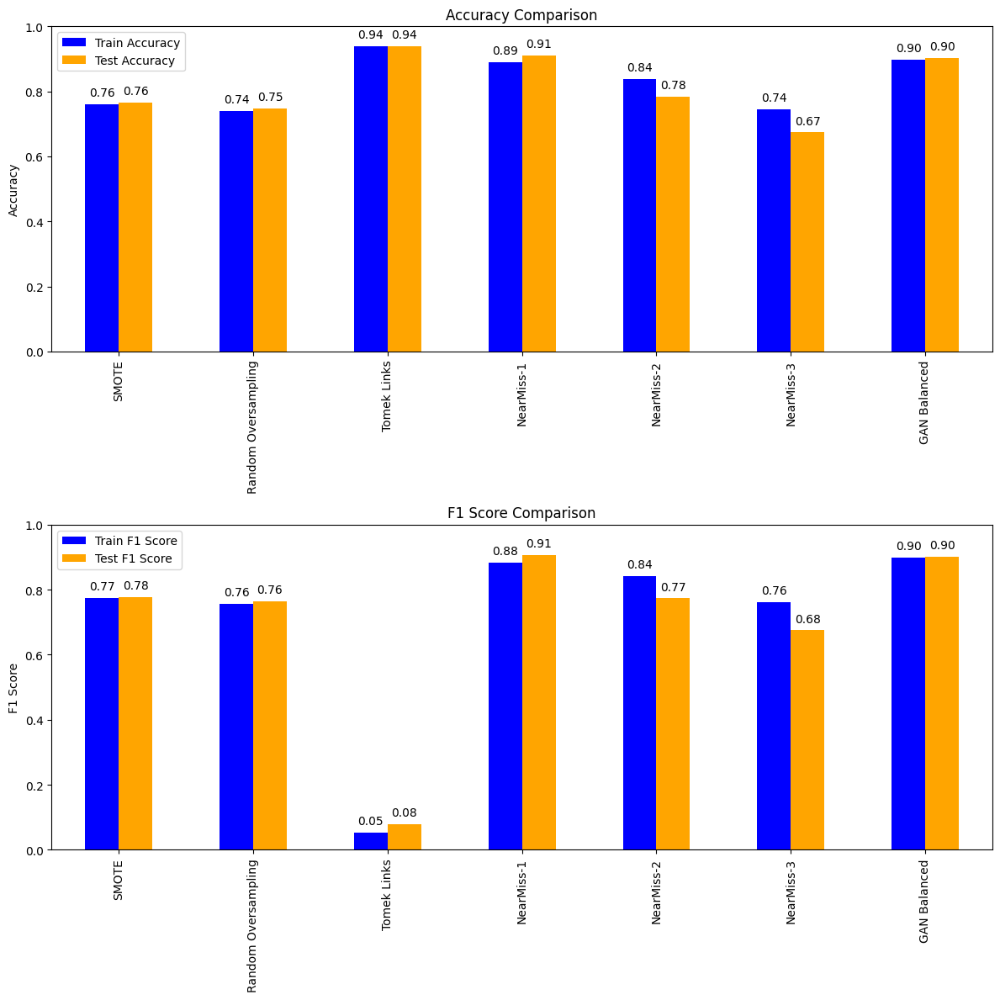

In [271]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE, RandomOverSampler, ADASYN
from imblearn.under_sampling import TomekLinks, NearMiss

def evaluate_performance(model, X_train, y_train, X_test, y_test):
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Predictions on training set
    y_train_pred = model.predict(X_train)
    
    # Predictions on testing set
    y_test_pred = model.predict(X_test)
    
    # Compute performance metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    
    train_precision = precision_score(y_train, y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    
    train_recall = recall_score(y_train, y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    
    train_f1_score = f1_score(y_train, y_train_pred)
    test_f1_score = f1_score(y_test, y_test_pred)
    
    # Predict probabilities
    y_train_pred_proba = model.predict_proba(X_train)[:, 1]
    y_test_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Calculate AUC for train and test sets
    auc_train = roc_auc_score(y_train, y_train_pred_proba)
    auc_test = roc_auc_score(y_test, y_test_pred_proba)
    
    # Return performance metrics
    return {
        "Train Accuracy": train_accuracy, "Test Accuracy": test_accuracy,
        "Train Precision": train_precision, "Test Precision": test_precision,
        "Train Recall": train_recall, "Test Recall": test_recall,
        "Train F1 Score": train_f1_score, "Test F1 Score": test_f1_score,
        "AUC Train": auc_train, "AUC Test": auc_test
    }

def plot_performance_comparison(df, df_gan, techniques):
    # Split the data into features and target
    performance_metrics = {}
    for technique_name, technique in techniques.items():
        # Apply the oversampling technique
        X = df.drop(columns=["Défaut"])
        y = df["Défaut"]
        X_resampled, y_resampled = technique.fit_resample(X, y)
        # Split data into train and test sets
        print(X_resampled.shape,y_resampled.shape)
        X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)
        # Initialize and evaluate Logistic Regression model
        model = LogisticRegression()
        performance_metrics[technique_name] = evaluate_performance(model, X_train, y_train, X_test, y_test)
    X_gan = df_gan.drop(columns=["Défaut"])
    y_gan = df_gan["Défaut"]
    
    
    X_train_gan, X_test_gan, y_train_gan, y_test_gan = train_test_split(X_gan, y_gan, test_size=0.2, stratify=y_gan, random_state=42)

    # Standardize features if needed
    X_train_gan = scaler.fit_transform(X_train_gan)
    X_test_gan = scaler.transform(X_test_gan)


    
    # Evaluate performance for the balanced GAN dataset
    model_gan = LogisticRegression()
    performance_metrics["GAN Balanced"] = evaluate_performance(model_gan, X_train_gan, y_train_gan, X_test_gan, y_test_gan)

    # Create a DataFrame to store performance metrics
    performance_df = pd.DataFrame(performance_metrics).T  # Transpose to have techniques as rows

    # Plotting performance metrics
    fig, axes = plt.subplots(2, 1, figsize=(12, 12))

    # Plot Accuracy Comparison
    performance_df[['Train Accuracy', 'Test Accuracy']].plot(kind='bar', ax=axes[0], color=["blue", "orange"])
    axes[0].set_title("Accuracy Comparison")
    axes[0].set_ylabel("Accuracy")
    axes[0].set_ylim(0, 1)
    
    # Adding values in front of the bars for Accuracy
    for p in axes[0].patches:
        axes[0].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')

    # Plot AUC Comparison
    performance_df[['Train F1 Score', 'Test F1 Score']].plot(kind='bar', ax=axes[1], color=["blue", "orange"])
    axes[1].set_title("F1 Score Comparison")
    axes[1].set_ylabel("F1 Score")
    axes[1].set_ylim(0, 1)
    
    # Adding values in front of the bars for AUC
    for p in axes[1].patches:
        axes[1].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')

    plt.tight_layout()
    plt.show()



# Assume df_gan is your balanced dataset
df_gan = df_tot.copy()

# Define oversampling techniques
oversampling_techniques = {
    "SMOTE": SMOTE(random_state=42),
    "Random Oversampling": RandomOverSampler(random_state=42),
    "Tomek Links": TomekLinks(),
    "NearMiss-1": NearMiss(version=1), 
    "NearMiss-2": NearMiss(version=2),  
    "NearMiss-3": NearMiss(version=3)
}

plot_performance_comparison(df, df_gan, oversampling_techniques)

In [194]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn import svm
import xgboost as xgb
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor


X=


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size=0.2,random_state=42)


# Standardize features if needed
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize models
models = {
    "Logistic Regression": LogisticRegression(),
    "SVM": svm.SVC(probability=True),  # Note: setting probability=True for SVC to enable probability estimates
    "Naive Bayes": GaussianNB(),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "XGBoost": xgb.XGBClassifier()
    
    }

# Plot ROC curves for each model
plt.figure(figsize=(10, 8))
for name, model in models.items():
    model.fit(X_train, y_train)
    y_score = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label='%s (AUC = %0.2f)' % (name, roc_auc))

plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('GAN  (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

DTypePromotionError: The DType <class 'numpy.dtypes.DateTime64DType'> could not be promoted by <class 'numpy.dtypes.Float64DType'>. This means that no common DType exists for the given inputs. For example they cannot be stored in a single array unless the dtype is `object`. The full list of DTypes is: (<class 'numpy.dtypes.Int64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.DateTime64DType'>, <class 'numpy.dtypes.DateTime64DType'>, <class 'numpy.dtypes.DateTime64DType'>, <class 'numpy.dtypes.Int32DType'>, <class 'numpy.dtypes.Int32DType'>, <class 'numpy.dtypes.Int64DType'>, <class 'numpy.dtypes.Int64DType'>, <class 'numpy.dtypes.Int32DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>)

### PLOTS DF_GAN and DF

In [ ]:
""" 
   # DF GAN
    X_gan = df_gan.drop(columns=["Défaut"])
    y_gan = df_gan["Défaut"]


    X_train_gan, X_test_gan, y_train_gan, y_test_gan = train_test_split(X_gan, y_gan, test_size=0.2, stratify=y_gan, random_state=42)

    # Standardize features if needed
    scaler = StandardScaler()
    X_train_gan = scaler.fit_transform(X_train_gan)
    X_test_gan = scaler.transform(X_test_gan)
    
    # DF other Techniques
    performance_metrics = {}
    
    for technique_name, technique in techniques.items():
        # Apply the oversampling technique
        # Split the data into features and target
        X = df.drop(columns=["Défaut"])
        X= X.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
        y = df["Défaut"]
        X_resampled, y_resampled = technique.fit_resample(X, y)
        # Split data into train and test sets
        X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=42)
        # Standardize features if needed
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)
        # Initialize and evaluate Logistic Regression model
        model = LogisticRegression()
        performance_metrics[technique_name] = evaluate_performance(model, X_train, y_train, X_test, y_test)"""

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



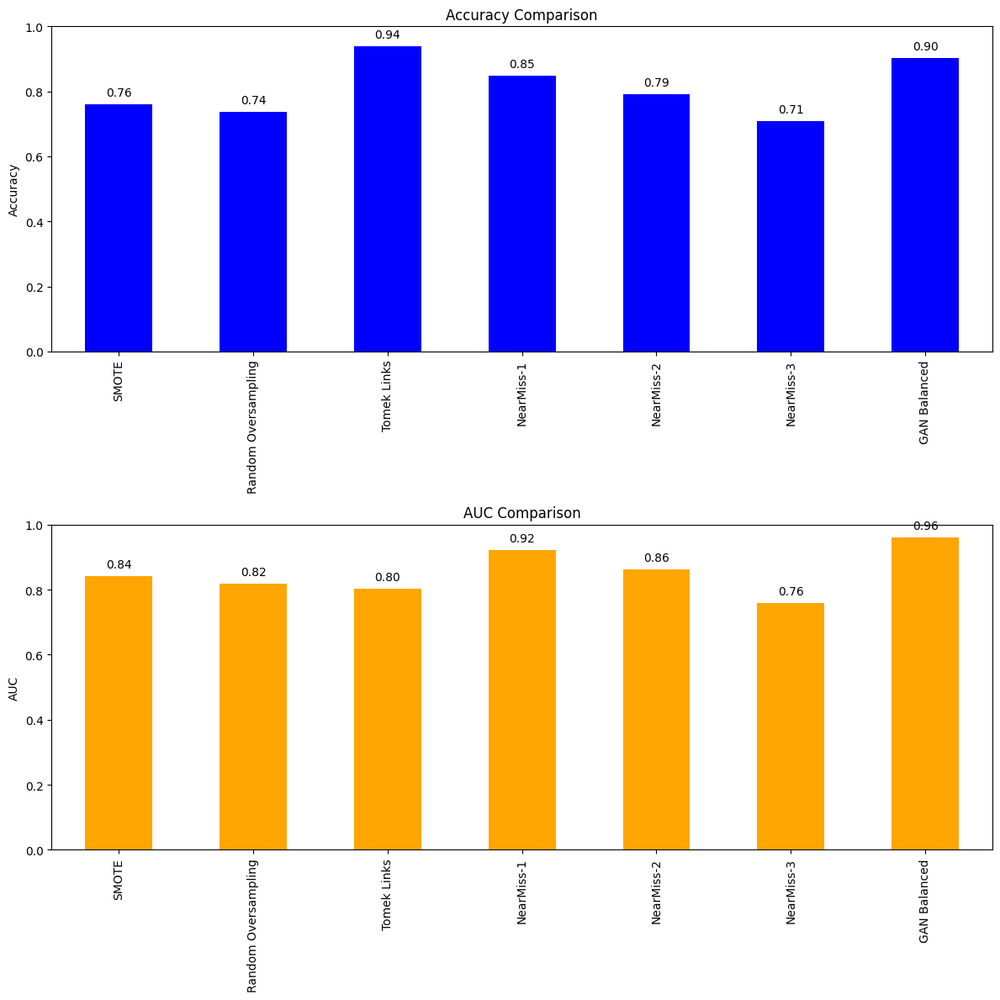

In [198]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE, RandomOverSampler, ADASYN
from imblearn.under_sampling import TomekLinks, NearMiss

def evaluate_performance(model, X_train, y_train, X_test, y_test):
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Predictions on training set
    y_train_pred = model.predict(X_train)
    
    # Predictions on testing set
    y_test_pred = model.predict(X_test)
    
    # Compute performance metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    
    train_precision = precision_score(y_train, y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    
    train_recall = recall_score(y_train, y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    
    train_f1_score = f1_score(y_train, y_train_pred)
    test_f1_score = f1_score(y_test, y_test_pred)
    
    # Predict probabilities
    y_train_pred_proba = model.predict_proba(X_train)[:, 1]
    y_test_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Calculate AUC for train and test sets
    auc_train = roc_auc_score(y_train, y_train_pred_proba)
    auc_test = roc_auc_score(y_test, y_test_pred_proba)
    
    # Return performance metrics
    return {
        "Train Accuracy": train_accuracy, "Test Accuracy": test_accuracy,
        "Train Precision": train_precision, "Test Precision": test_precision,
        "Train Recall": train_recall, "Test Recall": test_recall,
        "Train F1 Score": train_f1_score, "Test F1 Score": test_f1_score,
        "AUC Train": auc_train, "AUC Test": auc_test
    }

def plot_performance_comparison(df, df_gan, techniques):
    # DF GAN
    X_gan = df_gan.drop(columns=["Défaut"])
    y_gan = df_gan["Défaut"]


    X_train_gan, X_test_gan, y_train_gan, y_test_gan = train_test_split(X_gan, y_gan, test_size=0.2, stratify=y_gan, random_state=42)

    # Standardize features if needed
    scaler = StandardScaler()
    X_train_gan = scaler.fit_transform(X_train_gan)
    X_test_gan = scaler.transform(X_test_gan)
    
    # DF other Techniques
    performance_metrics = {}
    
    for technique_name, technique in techniques.items():
        # Apply the oversampling technique
        # Split the data into features and target
        X = df.drop(columns=["Défaut"])
        X= X.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
        y = df["Défaut"]
        X_resampled, y_resampled = technique.fit_resample(X, y)
        # Split data into train and test sets
        X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=42)
        # Standardize features if needed
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)
        # Initialize and evaluate Logistic Regression model
        model = LogisticRegression()
        performance_metrics[technique_name] = evaluate_performance(model, X_train, y_train, X_test, y_test)
        
    # Evaluate performance for the balanced GAN dataset
    model_gan = LogisticRegression()
    performance_metrics["GAN Balanced"] = evaluate_performance(model_gan, X_train_gan, y_train_gan, X_test_gan, y_test_gan)

    # Create a DataFrame to store performance metrics
    performance_df = pd.DataFrame(performance_metrics).T  # Transpose to have techniques as rows

    # Plotting performance metrics
    fig, axes = plt.subplots(2, 1, figsize=(12, 12))

    # Plot Accuracy Comparison
    performance_df[['Test Accuracy']].plot(kind='bar', ax=axes[0], color=["blue", "orange"])
    axes[0].set_title("Accuracy Comparison")
    axes[0].set_ylabel("Accuracy")
    axes[0].set_ylim(0, 1)
    axes[0].get_legend().remove()

    # Adding values in front of the bars for Accuracy
    for p in axes[0].patches:
        axes[0].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')

    # Plot AUC Comparison
    performance_df[['AUC Test']].plot(kind='bar', ax=axes[1], color=["orange"])
    axes[1].set_title("AUC Comparison")
    axes[1].set_ylabel("AUC")
    axes[1].set_ylim(0, 1)
    axes[1].get_legend().remove()
    
    # Adding values in front of the bars for AUC
    for p in axes[1].patches:
        axes[1].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')

    plt.tight_layout()
    plt.show()



# Assume df_gan is your balanced dataset
df_gan = df_tot.copy()

# Define oversampling techniques
oversampling_techniques = {
    "SMOTE": SMOTE(random_state=42),
    "Random Oversampling": RandomOverSampler(random_state=42),
    "Tomek Links": TomekLinks(),
    "NearMiss-1": NearMiss(version=1), 
    "NearMiss-2": NearMiss(version=2),  
    "NearMiss-3": NearMiss(version=3)
}

plot_performance_comparison(df, df_gan, oversampling_techniques)

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



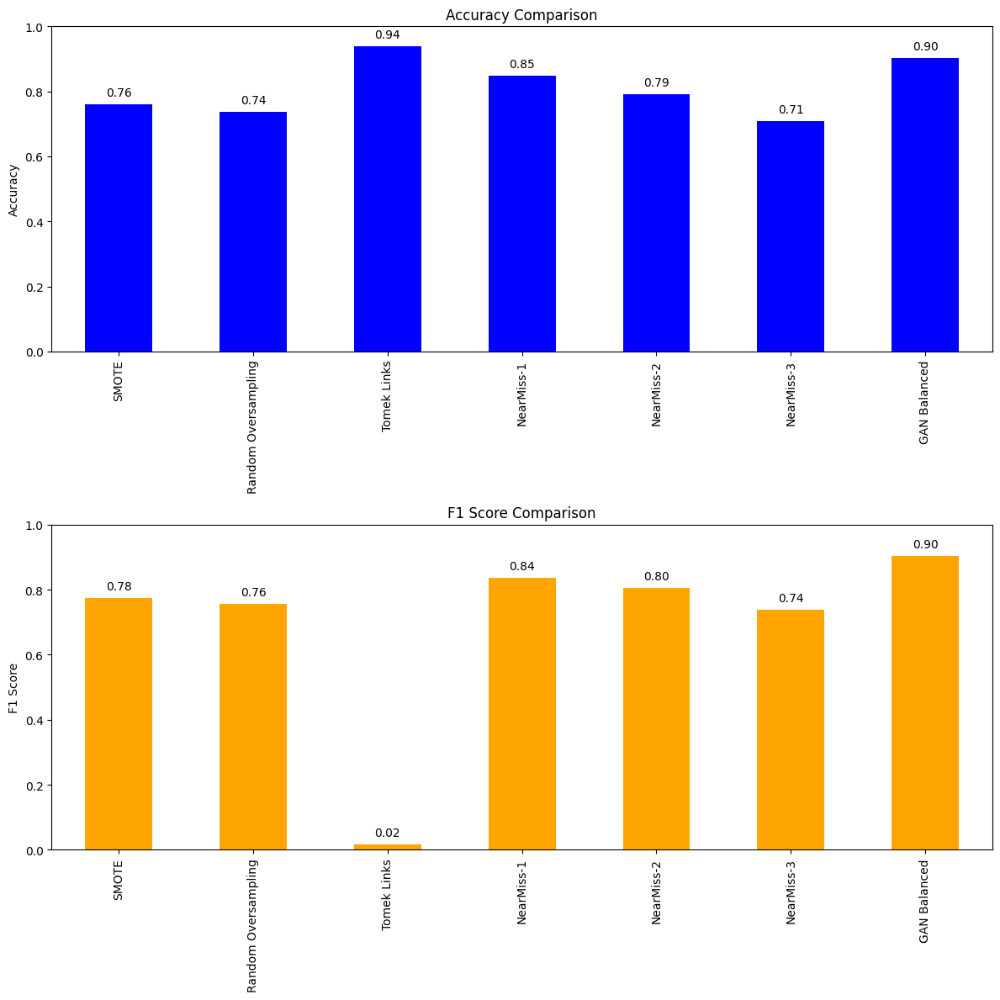

In [199]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE, RandomOverSampler, ADASYN
from imblearn.under_sampling import TomekLinks, NearMiss

def evaluate_performance(model, X_train, y_train, X_test, y_test):
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Predictions on training set
    y_train_pred = model.predict(X_train)
    
    # Predictions on testing set
    y_test_pred = model.predict(X_test)
    
    # Compute performance metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    
    train_precision = precision_score(y_train, y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    
    train_recall = recall_score(y_train, y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    
    train_f1_score = f1_score(y_train, y_train_pred)
    test_f1_score = f1_score(y_test, y_test_pred)
    
    # Predict probabilities
    y_train_pred_proba = model.predict_proba(X_train)[:, 1]
    y_test_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Calculate AUC for train and test sets
    auc_train = roc_auc_score(y_train, y_train_pred_proba)
    auc_test = roc_auc_score(y_test, y_test_pred_proba)
    
    # Return performance metrics
    return {
        "Train Accuracy": train_accuracy, "Test Accuracy": test_accuracy,
        "Train Precision": train_precision, "Test Precision": test_precision,
        "Train Recall": train_recall, "Test Recall": test_recall,
        "Train F1 Score": train_f1_score, "Test F1 Score": test_f1_score,
        "AUC Train": auc_train, "AUC Test": auc_test
    }

def plot_performance_comparison(df, df_gan, techniques):
    # DF GAN
    X_gan = df_gan.drop(columns=["Défaut"])
    y_gan = df_gan["Défaut"]


    X_train_gan, X_test_gan, y_train_gan, y_test_gan = train_test_split(X_gan, y_gan, test_size=0.2, stratify=y_gan, random_state=42)

    # Standardize features if needed
    scaler = StandardScaler()
    X_train_gan = scaler.fit_transform(X_train_gan)
    X_test_gan = scaler.transform(X_test_gan)
    
    # DF other Techniques
    performance_metrics = {}
    
    for technique_name, technique in techniques.items():
        # Apply the oversampling technique
        # Split the data into features and target
        X = df.drop(columns=["Défaut"])
        X= X.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
        y = df["Défaut"]
        X_resampled, y_resampled = technique.fit_resample(X, y)
        # Split data into train and test sets
        X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=42)
        # Standardize features if needed
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)
        # Initialize and evaluate Logistic Regression model
        model = LogisticRegression()
        performance_metrics[technique_name] = evaluate_performance(model, X_train, y_train, X_test, y_test)
        
    # Evaluate performance for the balanced GAN dataset
    model_gan = LogisticRegression()
    performance_metrics["GAN Balanced"] = evaluate_performance(model_gan, X_train_gan, y_train_gan, X_test_gan, y_test_gan)

    # Create a DataFrame to store performance metrics
    performance_df = pd.DataFrame(performance_metrics).T  # Transpose to have techniques as rows

    # Plotting performance metrics
    fig, axes = plt.subplots(2, 1, figsize=(12, 12))

    # Plot Accuracy Comparison
    performance_df[['Test Accuracy']].plot(kind='bar', ax=axes[0], color=["blue", "orange"])
    axes[0].set_title("Accuracy Comparison")
    axes[0].set_ylabel("Accuracy")
    axes[0].set_ylim(0, 1)
    axes[0].get_legend().remove()

    # Adding values in front of the bars for Accuracy
    for p in axes[0].patches:
        axes[0].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')

    # Plot AUC Comparison
    performance_df[['Test F1 Score']].plot(kind='bar', ax=axes[1], color=["orange"])
    axes[1].set_title("F1 Score Comparison")
    axes[1].set_ylabel("F1 Score")
    axes[1].set_ylim(0, 1)
    axes[1].get_legend().remove()
    
    # Adding values in front of the bars for AUC
    for p in axes[1].patches:
        axes[1].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')

    plt.tight_layout()
    plt.show()



# Assume df_gan is your balanced dataset
df_gan = df_tot.copy()

# Define oversampling techniques
oversampling_techniques = {
    "SMOTE": SMOTE(random_state=42),
    "Random Oversampling": RandomOverSampler(random_state=42),
    "Tomek Links": TomekLinks(),
    "NearMiss-1": NearMiss(version=1), 
    "NearMiss-2": NearMiss(version=2),  
    "NearMiss-3": NearMiss(version=3)
}

plot_performance_comparison(df, df_gan, oversampling_techniques)

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



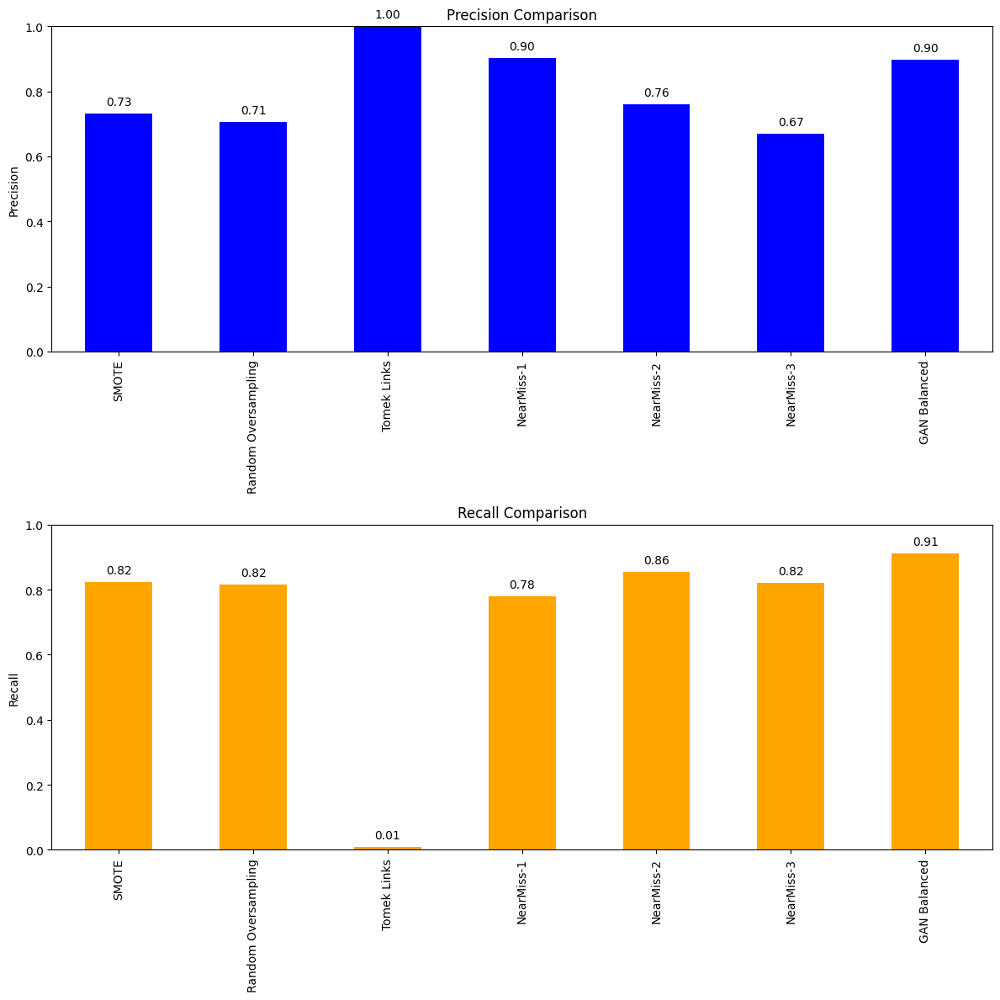

In [200]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE, RandomOverSampler, ADASYN
from imblearn.under_sampling import TomekLinks, NearMiss

def evaluate_performance(model, X_train, y_train, X_test, y_test):
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Predictions on training set
    y_train_pred = model.predict(X_train)
    
    # Predictions on testing set
    y_test_pred = model.predict(X_test)
    
    # Compute performance metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    
    train_precision = precision_score(y_train, y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    
    train_recall = recall_score(y_train, y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    
    train_f1_score = f1_score(y_train, y_train_pred)
    test_f1_score = f1_score(y_test, y_test_pred)
    
    # Predict probabilities
    y_train_pred_proba = model.predict_proba(X_train)[:, 1]
    y_test_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Calculate AUC for train and test sets
    auc_train = roc_auc_score(y_train, y_train_pred_proba)
    auc_test = roc_auc_score(y_test, y_test_pred_proba)
    
    # Return performance metrics
    return {
        "Train Accuracy": train_accuracy, "Test Accuracy": test_accuracy,
        "Train Precision": train_precision, "Test Precision": test_precision,
        "Train Recall": train_recall, "Test Recall": test_recall,
        "Train F1 Score": train_f1_score, "Test F1 Score": test_f1_score,
        "AUC Train": auc_train, "AUC Test": auc_test
    }

def plot_performance_comparison(df, df_gan, techniques):
    # DF GAN
    X_gan = df_gan.drop(columns=["Défaut"])
    y_gan = df_gan["Défaut"]


    X_train_gan, X_test_gan, y_train_gan, y_test_gan = train_test_split(X_gan, y_gan, test_size=0.2, stratify=y_gan, random_state=42)

    # Standardize features if needed
    scaler = StandardScaler()
    X_train_gan = scaler.fit_transform(X_train_gan)
    X_test_gan = scaler.transform(X_test_gan)
    
    # DF other Techniques
    performance_metrics = {}
    
    for technique_name, technique in techniques.items():
        # Apply the oversampling technique
        # Split the data into features and target
        X = df.drop(columns=["Défaut"])
        X= X.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
        y = df["Défaut"]
        X_resampled, y_resampled = technique.fit_resample(X, y)
        # Split data into train and test sets
        X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=42)
        # Standardize features if needed
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)
        # Initialize and evaluate Logistic Regression model
        model = LogisticRegression()
        performance_metrics[technique_name] = evaluate_performance(model, X_train, y_train, X_test, y_test)
        
    # Evaluate performance for the balanced GAN dataset
    model_gan = LogisticRegression()
    performance_metrics["GAN Balanced"] = evaluate_performance(model_gan, X_train_gan, y_train_gan, X_test_gan, y_test_gan)

    # Create a DataFrame to store performance metrics
    performance_df = pd.DataFrame(performance_metrics).T  # Transpose to have techniques as rows

    # Plotting performance metrics
    fig, axes = plt.subplots(2, 1, figsize=(12, 12))

    # Plot Accuracy Comparison
    performance_df[['Test Precision']].plot(kind='bar', ax=axes[0], color=["blue", "orange"])
    axes[0].set_title("Precision Comparison")
    axes[0].set_ylabel("Precision")
    axes[0].set_ylim(0, 1)
    axes[0].get_legend().remove()

    # Adding values in front of the bars for Accuracy
    for p in axes[0].patches:
        axes[0].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')

    # Plot AUC Comparison
    performance_df[['Test Recall']].plot(kind='bar', ax=axes[1], color=["orange"])
    axes[1].set_title("Recall Comparison")
    axes[1].set_ylabel("Recall")
    axes[1].set_ylim(0, 1)
    axes[1].get_legend().remove()
    
    # Adding values in front of the bars for AUC
    for p in axes[1].patches:
        axes[1].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')

    plt.tight_layout()
    plt.show()



# Assume df_gan is your balanced dataset
df_gan = df_tot.copy()

# Define oversampling techniques
oversampling_techniques = {
    "SMOTE": SMOTE(random_state=42),
    "Random Oversampling": RandomOverSampler(random_state=42),
    "Tomek Links": TomekLinks(),
    "NearMiss-1": NearMiss(version=1), 
    "NearMiss-2": NearMiss(version=2),  
    "NearMiss-3": NearMiss(version=3)
}

plot_performance_comparison(df, df_gan, oversampling_techniques)

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but LogisticRegression was fitted with feature names

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but LogisticRegression was fitted with feature names

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STO

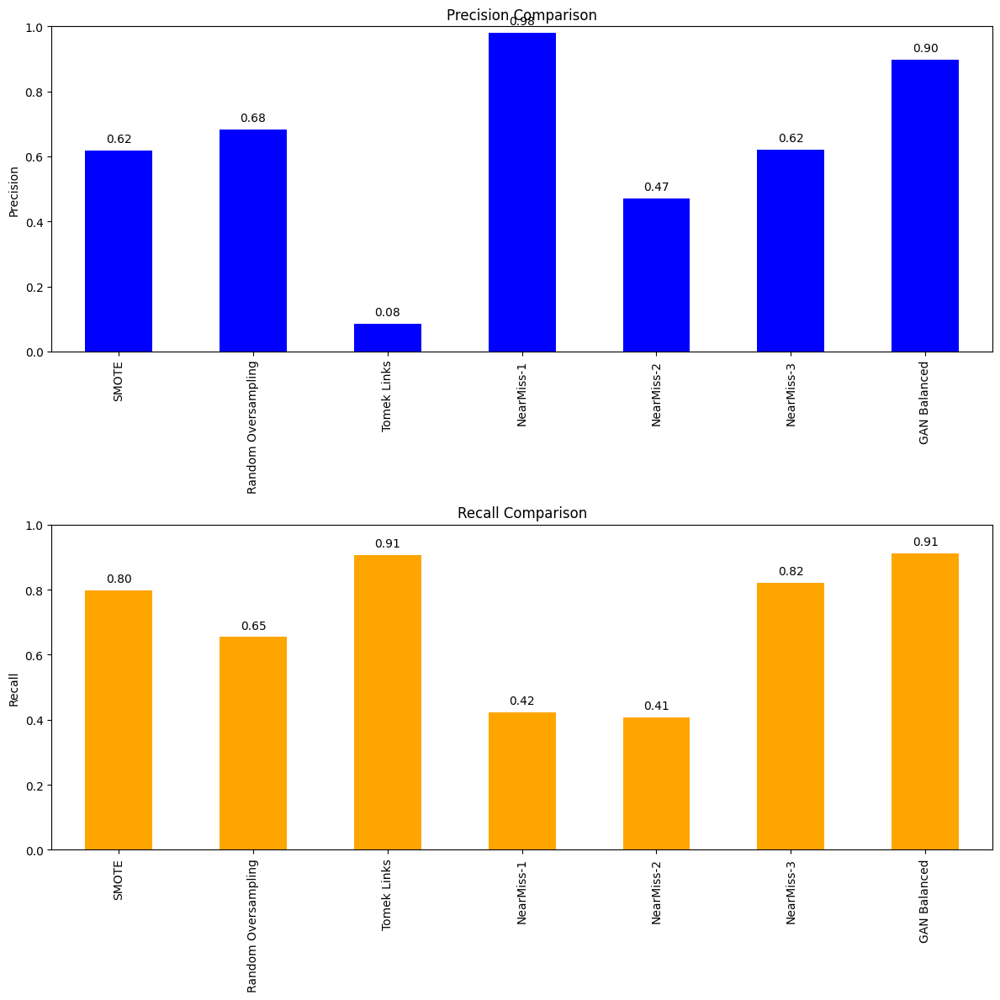

In [197]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE, RandomOverSampler, ADASYN
from imblearn.under_sampling import TomekLinks, NearMiss

def evaluate_performance(model, X_train, y_train, X_test, y_test):
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Predictions on training set
    y_train_pred = model.predict(X_train)
    
    # Predictions on testing set
    y_test_pred = model.predict(X_test)
    
    # Compute performance metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    
    train_precision = precision_score(y_train, y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    
    train_recall = recall_score(y_train, y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    
    train_f1_score = f1_score(y_train, y_train_pred)
    test_f1_score = f1_score(y_test, y_test_pred)
    
    # Predict probabilities
    y_train_pred_proba = model.predict_proba(X_train)[:, 1]
    y_test_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Calculate AUC for train and test sets
    auc_train = roc_auc_score(y_train, y_train_pred_proba)
    auc_test = roc_auc_score(y_test, y_test_pred_proba)
    
    # Return performance metrics
    return {
        "Train Accuracy": train_accuracy, "Test Accuracy": test_accuracy,
        "Train Precision": train_precision, "Test Precision": test_precision,
        "Train Recall": train_recall, "Test Recall": test_recall,
        "Train F1 Score": train_f1_score, "Test F1 Score": test_f1_score,
        "AUC Train": auc_train, "AUC Test": auc_test
    }

def plot_performance_comparison(df, df_gan, techniques):
    # Split the data into features and target
    X = df.drop(columns=["Défaut"])
    X= X.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
    y = df["Défaut"]
    X_gan = df_gan.drop(columns=["Défaut"])
    y_gan = df_gan["Défaut"]

    # Split data into train and test sets
    X_train_gan, X_test_gan, y_train_gan, y_test_gan = train_test_split(X_gan, y_gan, test_size=0.2, stratify=y_gan, random_state=42)

    # Standardize features if needed
    scaler = StandardScaler()

    X_train_gan = scaler.fit_transform(X_train_gan)
    X_test_gan = scaler.transform(X_test_gan)

    performance_metrics = {}
    
    for technique_name, technique in techniques.items():
        # Apply the oversampling technique
        X_resampled, y_resampled = technique.fit_resample(X, y)
        X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=42)
        # Initialize and evaluate Logistic Regression model
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)
        model = LogisticRegression()
        performance_metrics[technique_name] = evaluate_performance(model, X_resampled, y_resampled, X_test, y_test)
        
    # Evaluate performance for the balanced GAN dataset
    model_gan = LogisticRegression()
    performance_metrics["GAN Balanced"] = evaluate_performance(model_gan, X_train_gan, y_train_gan, X_test_gan, y_test_gan)

    # Create a DataFrame to store performance metrics
    performance_df = pd.DataFrame(performance_metrics).T  # Transpose to have techniques as rows

    # Plotting performance metrics
    fig, axes = plt.subplots(2, 1, figsize=(12, 12))

    # Plot Accuracy Comparison
    performance_df[['Test Precision']].plot(kind='bar', ax=axes[0], color=["blue", "orange"])
    axes[0].set_title("Precision Comparison")
    axes[0].set_ylabel("Precision")
    axes[0].set_ylim(0, 1)
    axes[0].get_legend().remove()

    # Adding values in front of the bars for Accuracy
    for p in axes[0].patches:
        axes[0].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')

    # Plot AUC Comparison
    performance_df[['Test Recall']].plot(kind='bar', ax=axes[1], color=["orange"])
    axes[1].set_title("Recall Comparison")
    axes[1].set_ylabel("Recall")
    axes[1].set_ylim(0, 1)
    axes[1].get_legend().remove()
    
    # Adding values in front of the bars for AUC
    for p in axes[1].patches:
        axes[1].annotate(format(p.get_height(), '.2f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', 
                         xytext=(0, 10), 
                         textcoords='offset points')
        

    plt.tight_layout()
    plt.show()



# Assume df_gan is your balanced dataset
df_gan = df_tot.copy()

# Define oversampling techniques
oversampling_techniques = {
    "SMOTE": SMOTE(random_state=42),
    "Random Oversampling": RandomOverSampler(random_state=42),
    "Tomek Links": TomekLinks(),
    "NearMiss-1": NearMiss(version=1), 
    "NearMiss-2": NearMiss(version=2),  
    "NearMiss-3": NearMiss(version=3)
}

plot_performance_comparison(df, df_gan, oversampling_techniques)

### Notation Interne

#### SMOTE

In [198]:
from imblearn.over_sampling import SMOTE
from sklearn.datasets import make_classification
from collections import Counter

df_SMOTE=df.copy()
df_SMOTE= df_SMOTE.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
X=df_SMOTE.drop(columns=["Défaut"])
y=df_SMOTE["Défaut"]

print('Original dataset shape %s' % Counter(y))

# Apply SMOTE to the dataset
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_res, y_res = smote.fit_resample(X, y)

print('Resampled dataset shape %s' % Counter(y_res))

Original dataset shape Counter({0: 9123, 1: 588})
Resampled dataset shape Counter({0: 9123, 1: 9123})


In [ ]:
df_SMOTE=

In [199]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Define the model (Logistic Regression)
model = LogisticRegression()

# Filter out the data for the year 2020
mask = df_SMOTE["Annee"] != 2020
df_SMOTE_model = df_SMOTE[mask].copy()

# Separate features (X) and target variable (y)
y = df_SMOTE_model['Défaut']
X = df_SMOTE_model.drop(['Défaut'], axis=1)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train the model on the training set
model.fit(X_train, y_train)

# Make predictions for the year 2020
df_notation_SMOTE = df_SMOTE[df_SMOTE["Annee"] == 2020]
df_notation_predict_SMOTE = df_notation_SMOTE.drop(columns=["Défaut"])

# Standardize the features for prediction
df_notation_predict_SMOTE = scaler.transform(df_notation_predict_SMOTE)

# Predict probabilities for each class
probabilities = model.predict_proba(df_notation_predict_SMOTE)

# Count the number of samples falling into different probability ranges for each class
"""
print("class 1:", np.count_nonzero(probabilities[:,1] < 0.1))
print("class 2:", np.count_nonzero((probabilities[:,1] >= 0.1) & (probabilities[:,1] < 0.3)))
print("class 3:", np.count_nonzero((probabilities[:,1] >= 0.3) & (probabilities[:,1] < 0.7)))
print("class 4:", np.count_nonzero((probabilities[:,1] >= 0.7) & (probabilities[:,1] < 0.9)))
print("class 5:", np.count_nonzero((probabilities[:,1] >= 0.9) & (probabilities[:,1] < 0.94)))
print("class 6:", np.count_nonzero((probabilities[:,1] >= 0.94) & (probabilities[:,1] < 0.95)))
print("class 7:", np.count_nonzero(probabilities[:,1] >= 0.95))
"""
# Count the number of samples falling into different probability ranges for each class
print("class 1:", np.count_nonzero(probabilities[:,1] < 0.14))
print("class 2:", np.count_nonzero((probabilities[:,1] >= 0.14) & (probabilities[:,1] < 0.28)))
print("class 3:", np.count_nonzero((probabilities[:,1] >= 0.28) & (probabilities[:,1] < 0.42)))
print("class 4:", np.count_nonzero((probabilities[:,1] >= 0.42) & (probabilities[:,1] < 0.56)))
print("class 5:", np.count_nonzero((probabilities[:,1] >= 0.56) & (probabilities[:,1] < 0.70)))
print("class 6:", np.count_nonzero((probabilities[:,1] >= 0.70) & (probabilities[:,1] < 0.84)))
print("class 7:", np.count_nonzero(probabilities[:,1] >= 0.84))

class 1: 875
class 2: 94
class 3: 5
class 4: 3
class 5: 1
class 6: 0
class 7: 2


In [200]:
df_notation_SMOTE['PD'] = probabilities[:, 1]
# Define the bin thresholds
bin_thresholds = [0.14, 0.28, 0.42, 0.56, 0.70, 0.84]
# Bin the values in the "PD" column into discrete classes
df_notation_SMOTE['classPD'] = np.digitize(df_notation_SMOTE['PD'], bin_thresholds)
df_notation_SMOTE["classPD"]=df_notation_SMOTE["classPD"]+1
df_notation_SMOTE

C:\Users\user\AppData\Local\Temp\ipykernel_6256\2406127214.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_6256\2406127214.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_6256\2406127214.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,Défaut,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER,PD,classPD
12,2020,50736000.0,3189000.0,4023000.0,503000.0,20987000.0,20987000.0,67521000.0,14684000.0,-46534000.0,...,4,0,0,11,0,36.249315,31.764384,50.682192,0.017830,1
23,2020,44424000.0,6643000.0,3366000.0,712000.0,32449000.0,32447000.0,38685000.0,24954000.0,-6238000.0,...,4,0,1,13,0,32.986301,19.427397,50.682192,0.056512,1
29,2020,41013000.0,2575000.0,1905000.0,1088000.0,25613000.0,25609000.0,21976000.0,23798000.0,3633000.0,...,6,0,0,4,0,41.882192,16.632877,50.682192,0.014363,1
39,2020,72016000.0,5046000.0,4358000.0,1045000.0,28145000.0,27799000.0,62735000.0,23605000.0,-34936000.0,...,6,0,0,4,0,28.441096,13.506849,50.682192,0.002101,1
48,2020,34747000.0,4481000.0,4328000.0,2270000.0,14970000.0,14888000.0,12094000.0,11234000.0,2794000.0,...,6,0,0,2,0,13.235616,13.164384,48.402740,0.003377,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9705,2020,30492000.0,1450000.0,669000.0,347000.0,8550000.0,7963000.0,7045000.0,4757000.0,918000.0,...,7,0,0,2,0,15.830137,1.876712,46.030137,0.011019,1
9706,2020,17039000.0,-3501000.0,-9970000.0,-12313000.0,83153000.0,67209000.0,88453000.0,21931000.0,-21244000.0,...,4,0,0,7,0,6.460274,1.709589,50.682192,0.038237,1
9708,2020,36863000.0,1224000.0,656000.0,79000.0,16889000.0,16889000.0,14488000.0,12299000.0,2401000.0,...,6,0,0,2,0,10.109589,1.635616,56.895890,0.026826,1
9709,2020,11741000.0,-154000.0,-216000.0,-410000.0,1998000.0,1588000.0,4173000.0,1513000.0,-2585000.0,...,7,0,0,2,0,5.876712,1.594521,47.145205,0.038515,1


In [201]:
df_notation_SMOTE["classPD"].value_counts()

classPD
1    875
2     94
3      5
4      3
7      2
5      1
Name: count, dtype: int64

In [202]:
df_tot_notation=df_tot.copy()
df_notation_predict_SMOTE=df_notation_SMOTE.drop(columns=["Défaut"])
probabilities_tot = model.predict_proba(scaler.transform(df_notation_predict_SMOTE))
df_notation_SMOTE['PD'] = probabilities_tot[:, 1]
# Define the bin thresholds
bin_thresholds = [0.001, 0.03, 0.2, 0.8, 0.97, 0.995]
# Bin the values in the "PD" column into discrete classes
df_notation_SMOTE['classPD'] = np.digitize(df_notation_SMOTE['PD'], bin_thresholds)
df_notation_SMOTE["classPD"]=df_notation_SMOTE["classPD"]+1
#df_tot_notation
import seaborn as sns
import matplotlib.pyplot as plt

# Charger les données dans df_notation

# Créer un plot de distribution
sns.countplot(data=df_tot_notation, x="classPD")
plt.title("Distribution des classes")
plt.xlabel("Classes")
plt.ylabel("Nombre d'observations")
plt.show()

ValueError: The feature names should match those that were passed during fit.
Feature names unseen at fit time:
- PD
- classPD


#### GAN

In [186]:
df_tot

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,Flag_client_cote,Flag_groupe,Secteurs2,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER,DATE_DE_CREATION_ENTREP,DATE_DE_CREATION_TIERS,DAT_NAI_GER,Défaut
0,2018,2.293494e+07,-1731632.00,-2402400.00,-3067504.00,-91445952.0,-8.470175e+07,3.961899e+07,-3.294691e+07,-5334208.00,...,0,1,1,4.357099,2.021656,47.557812,03/09/2014,31/12/2016,16/07/1971,1
1,2017,1.219255e+07,8414848.00,-31039520.00,-20530144.00,-73605528.0,9.098991e+08,-7.708650e+07,3.129951e+08,10635104.00,...,0,1,10,39.961128,31.630728,32.205902,14/02/1978,12/06/1986,09/11/1985,1
2,2016,3.512607e+07,1281724.00,10450456.00,-11250208.00,82036880.0,1.512566e+07,2.408517e+07,-5.335965e+07,1167872.00,...,0,0,5,13.412079,5.113699,35.869057,06/09/2003,03/12/2011,15/03/1981,1
3,2019,2.687885e+07,2945684.00,-6719080.00,5317664.00,-16711856.0,3.312782e+08,1.970352e+07,1.136672e+07,-59526432.00,...,0,0,3,11.412664,12.496869,54.143188,04/09/2008,06/08/2007,14/12/1965,1
4,2016,2.147940e+05,-10323052.00,-26440176.00,4022000.00,-151024528.0,-1.639133e+08,2.313401e+08,-9.095002e+07,-18804032.00,...,0,1,0,5.753211,1.646021,23.182278,07/04/2011,05/06/2015,07/11/1993,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9706,2020,1.703900e+07,-3501000.00,-9970000.00,-12313000.00,83153000.0,6.720900e+07,8.845300e+07,2.193100e+07,-21244000.00,...,0,0,7,6.460274,1.709589,50.682192,2014-07-18 00:00:00,2019-04-17 00:00:00,1968-01-25 00:00:00,0
9707,2017,2.180232e+07,-332377.54,-1010307.33,-3418023.48,7090079.1,3.672056e+06,4.843489e+06,-2.418023e+06,-1171433.46,...,0,0,1,17.260274,-1.317808,65.041096,2000-10-01 00:00:00,2019-04-26 00:00:00,1953-01-01 00:00:00,0
9708,2020,3.686300e+07,1224000.00,656000.00,79000.00,16889000.0,1.688900e+07,1.448800e+07,1.229900e+07,2401000.00,...,0,0,2,10.109589,1.635616,56.895890,2010-11-24 00:00:00,2019-05-14 00:00:00,1964-02-22 00:00:00,0
9709,2020,1.174100e+07,-154000.00,-216000.00,-410000.00,1998000.0,1.588000e+06,4.173000e+06,1.513000e+06,-2585000.00,...,0,0,2,5.876712,1.594521,47.145205,2015-02-16 00:00:00,2019-05-29 00:00:00,1973-11-20 00:00:00,0


In [187]:
df_notation=df_tot[df_tot["Annee"] == 2020]
print(df_tot[df_tot["Annee"] == 2020]['Défaut'].value_counts())
#df_notation

Défaut
1    1249
0     879
Name: count, dtype: int64


In [188]:
df_tot

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,Flag_client_cote,Flag_groupe,Secteurs2,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER,DATE_DE_CREATION_ENTREP,DATE_DE_CREATION_TIERS,DAT_NAI_GER,Défaut
0,2018,2.293494e+07,-1731632.00,-2402400.00,-3067504.00,-91445952.0,-8.470175e+07,3.961899e+07,-3.294691e+07,-5334208.00,...,0,1,1,4.357099,2.021656,47.557812,03/09/2014,31/12/2016,16/07/1971,1
1,2017,1.219255e+07,8414848.00,-31039520.00,-20530144.00,-73605528.0,9.098991e+08,-7.708650e+07,3.129951e+08,10635104.00,...,0,1,10,39.961128,31.630728,32.205902,14/02/1978,12/06/1986,09/11/1985,1
2,2016,3.512607e+07,1281724.00,10450456.00,-11250208.00,82036880.0,1.512566e+07,2.408517e+07,-5.335965e+07,1167872.00,...,0,0,5,13.412079,5.113699,35.869057,06/09/2003,03/12/2011,15/03/1981,1
3,2019,2.687885e+07,2945684.00,-6719080.00,5317664.00,-16711856.0,3.312782e+08,1.970352e+07,1.136672e+07,-59526432.00,...,0,0,3,11.412664,12.496869,54.143188,04/09/2008,06/08/2007,14/12/1965,1
4,2016,2.147940e+05,-10323052.00,-26440176.00,4022000.00,-151024528.0,-1.639133e+08,2.313401e+08,-9.095002e+07,-18804032.00,...,0,1,0,5.753211,1.646021,23.182278,07/04/2011,05/06/2015,07/11/1993,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9706,2020,1.703900e+07,-3501000.00,-9970000.00,-12313000.00,83153000.0,6.720900e+07,8.845300e+07,2.193100e+07,-21244000.00,...,0,0,7,6.460274,1.709589,50.682192,2014-07-18 00:00:00,2019-04-17 00:00:00,1968-01-25 00:00:00,0
9707,2017,2.180232e+07,-332377.54,-1010307.33,-3418023.48,7090079.1,3.672056e+06,4.843489e+06,-2.418023e+06,-1171433.46,...,0,0,1,17.260274,-1.317808,65.041096,2000-10-01 00:00:00,2019-04-26 00:00:00,1953-01-01 00:00:00,0
9708,2020,3.686300e+07,1224000.00,656000.00,79000.00,16889000.0,1.688900e+07,1.448800e+07,1.229900e+07,2401000.00,...,0,0,2,10.109589,1.635616,56.895890,2010-11-24 00:00:00,2019-05-14 00:00:00,1964-02-22 00:00:00,0
9709,2020,1.174100e+07,-154000.00,-216000.00,-410000.00,1998000.0,1.588000e+06,4.173000e+06,1.513000e+06,-2585000.00,...,0,0,2,5.876712,1.594521,47.145205,2015-02-16 00:00:00,2019-05-29 00:00:00,1973-11-20 00:00:00,0


In [249]:
modelisation=LogisticRegression()


#df_tot= df_tot.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)

mask = df_tot["Annee"] != 2020
df_tot_model = df_tot[mask].copy()
#df_tot_model = df_tot.copy()
y = df_tot_model['Défaut']
X = df_tot_model.drop(['Défaut'], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Create a  model
model = modelisation

# Train the model on the training set
model.fit(X_train, y_train)

# Create a model classifier
logistic_regression = modelisation

# Train the classifier on the training set
logistic_regression.fit(X_train,y_train) 

df_notation=df_tot[df_tot["Annee"] == 2020]
df_notation_predict=df_notation.drop(columns=["Défaut"])
#df_notation_predict=df_notation_predict.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
probabilities = logistic_regression.predict_proba(scaler.transform(df_notation_predict))
#probabilities = model.predict_proba(df_notation_predict)
print("class 1:" ,np.count_nonzero(probabilities[:,1]<0.1))
print("class 2:" ,np.count_nonzero(probabilities[:,1]<0.3))
print("class 3:" ,np.count_nonzero(probabilities[:,1]<0.7))
print("class 4:" ,np.count_nonzero(probabilities[:,1]<0.9))
print("class 5:" ,np.count_nonzero(probabilities[:,1]<0.94))
print("class 6:" ,np.count_nonzero(probabilities[:,1]<0.95))
print("class 7:" ,np.count_nonzero(probabilities[:,1]>0.96))
probabilities[:,1]

class 1: 434
class 2: 637
class 3: 998
class 4: 1379
class 5: 1551
class 6: 1606
class 7: 443


array([0.9191701 , 0.76032602, 0.82599022, ..., 0.09240911, 0.26419928,
       0.3556902 ])

In [250]:
df_tot_note=df_tot.copy()
df_tot_note_predict=df_tot_note.drop(columns=["Défaut"])
df_tot_note_predict=df_tot_note_predict.reset_index(drop=True)
probabilities_tot = model.predict_proba(scaler.transform(df_tot_note_predict))

In [251]:
df_tot_note_predict["prediction"]=probabilities_tot[:,1]
df_tot_note_predict

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,moyenne_mvt_crd,SEC_ACTIVITE,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER,prediction
0,2018,2.293494e+07,-1731632.00,-2402400.00,-3067504.00,-91445952.0,-8.470175e+07,3.961899e+07,-3.294691e+07,-5334208.00,...,0.101345,17,6,0,1,1,4.357099,2.021656,47.557812,0.909580
1,2017,1.219255e+07,8414848.00,-31039520.00,-20530144.00,-73605528.0,9.098991e+08,-7.708650e+07,3.129951e+08,10635104.00,...,0.009890,181,4,0,1,10,39.961128,31.630728,32.205902,0.999397
2,2016,3.512607e+07,1281724.00,10450456.00,-11250208.00,82036880.0,1.512566e+07,2.408517e+07,-5.335965e+07,1167872.00,...,0.768270,49,6,0,0,5,13.412079,5.113699,35.869057,0.841300
3,2019,2.687885e+07,2945684.00,-6719080.00,5317664.00,-16711856.0,3.312782e+08,1.970352e+07,1.136672e+07,-59526432.00,...,3.303730,68,6,0,0,3,11.412664,12.496869,54.143188,0.987972
4,2016,2.147940e+05,-10323052.00,-26440176.00,4022000.00,-151024528.0,-1.639133e+08,2.313401e+08,-9.095002e+07,-18804032.00,...,0.000000,170,6,0,1,0,5.753211,1.646021,23.182278,0.879808
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18241,2020,1.703900e+07,-3501000.00,-9970000.00,-12313000.00,83153000.0,6.720900e+07,8.845300e+07,2.193100e+07,-21244000.00,...,0.833333,111,4,0,0,7,6.460274,1.709589,50.682192,0.588081
18242,2017,2.180232e+07,-332377.54,-1010307.33,-3418023.48,7090079.1,3.672056e+06,4.843489e+06,-2.418023e+06,-1171433.46,...,4.333333,37,7,0,0,1,17.260274,-1.317808,65.041096,0.018810
18243,2020,3.686300e+07,1224000.00,656000.00,79000.00,16889000.0,1.688900e+07,1.448800e+07,1.229900e+07,2401000.00,...,4.583333,163,6,0,0,2,10.109589,1.635616,56.895890,0.092409
18244,2020,1.174100e+07,-154000.00,-216000.00,-410000.00,1998000.0,1.588000e+06,4.173000e+06,1.513000e+06,-2585000.00,...,5.166667,42,7,0,0,2,5.876712,1.594521,47.145205,0.264199


In [253]:
df_tot_notation=df_tot.copy()
df_tot_notation

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,moyenne_mvt_crd,SEC_ACTIVITE,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER,Défaut
0,2018,2.293494e+07,-1731632.00,-2402400.00,-3067504.00,-91445952.0,-8.470175e+07,3.961899e+07,-3.294691e+07,-5334208.00,...,0.101345,17,6,0,1,1,4.357099,2.021656,47.557812,1
1,2017,1.219255e+07,8414848.00,-31039520.00,-20530144.00,-73605528.0,9.098991e+08,-7.708650e+07,3.129951e+08,10635104.00,...,0.009890,181,4,0,1,10,39.961128,31.630728,32.205902,1
2,2016,3.512607e+07,1281724.00,10450456.00,-11250208.00,82036880.0,1.512566e+07,2.408517e+07,-5.335965e+07,1167872.00,...,0.768270,49,6,0,0,5,13.412079,5.113699,35.869057,1
3,2019,2.687885e+07,2945684.00,-6719080.00,5317664.00,-16711856.0,3.312782e+08,1.970352e+07,1.136672e+07,-59526432.00,...,3.303730,68,6,0,0,3,11.412664,12.496869,54.143188,1
4,2016,2.147940e+05,-10323052.00,-26440176.00,4022000.00,-151024528.0,-1.639133e+08,2.313401e+08,-9.095002e+07,-18804032.00,...,0.000000,170,6,0,1,0,5.753211,1.646021,23.182278,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9706,2020,1.703900e+07,-3501000.00,-9970000.00,-12313000.00,83153000.0,6.720900e+07,8.845300e+07,2.193100e+07,-21244000.00,...,0.833333,111,4,0,0,7,6.460274,1.709589,50.682192,0
9707,2017,2.180232e+07,-332377.54,-1010307.33,-3418023.48,7090079.1,3.672056e+06,4.843489e+06,-2.418023e+06,-1171433.46,...,4.333333,37,7,0,0,1,17.260274,-1.317808,65.041096,0
9708,2020,3.686300e+07,1224000.00,656000.00,79000.00,16889000.0,1.688900e+07,1.448800e+07,1.229900e+07,2401000.00,...,4.583333,163,6,0,0,2,10.109589,1.635616,56.895890,0
9709,2020,1.174100e+07,-154000.00,-216000.00,-410000.00,1998000.0,1.588000e+06,4.173000e+06,1.513000e+06,-2585000.00,...,5.166667,42,7,0,0,2,5.876712,1.594521,47.145205,0


In [254]:
df_notation['PD'] = probabilities[:, 1]
# Define the bin thresholds
bin_thresholds = [0.14, 0.28, 0.42, 0.56, 0.70, 0.84]
# Bin the values in the "PD" column into discrete classes
df_notation['classPD'] = np.digitize(df_notation['PD'], bin_thresholds)
df_notation["classPD"]=df_notation["classPD"]+1
df_notation

C:\Users\user\AppData\Local\Temp\ipykernel_23972\3404675913.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_23972\3404675913.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_23972\3404675913.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-d

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER,Défaut,PD,classPD
6,2020,13929532.0,-2001732.0,-497776.0,4023328.0,-87666032.0,-107236840.0,-47974432.0,37028736.0,4745760.0,...,5,0,0,1,7.570795,2.918562,50.238678,1,0.919170,7
18,2020,46011484.0,1220320.0,-773152.0,9242576.0,-84532848.0,-78816320.0,-2409024.0,58656960.0,-2285504.0,...,6,0,0,1,3.605600,1.942081,55.199913,1,0.760326,6
23,2020,15060203.0,-352788.0,-3708488.0,-6785072.0,17857616.0,-27088848.0,31039840.0,-23075440.0,-14042208.0,...,5,0,0,1,23.200718,6.980766,52.810692,1,0.825990,6
34,2020,8033674.5,1271912.0,-17199344.0,-5958592.0,-21844120.0,133920480.0,16013024.0,-5202624.0,-26623296.0,...,5,0,1,1,10.505681,6.624648,42.041359,1,0.860478,7
49,2020,10233995.0,-2783808.0,-4996224.0,-7180304.0,-17621936.0,-12481792.0,90717568.0,7335296.0,-89698048.0,...,5,0,0,8,26.075975,10.979624,49.317207,1,0.951996,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9705,2020,30492000.0,1450000.0,669000.0,347000.0,8550000.0,7963000.0,7045000.0,4757000.0,918000.0,...,7,0,0,2,15.830137,1.876712,46.030137,0,0.056833,1
9706,2020,17039000.0,-3501000.0,-9970000.0,-12313000.0,83153000.0,67209000.0,88453000.0,21931000.0,-21244000.0,...,4,0,0,7,6.460274,1.709589,50.682192,0,0.588081,5
9708,2020,36863000.0,1224000.0,656000.0,79000.0,16889000.0,16889000.0,14488000.0,12299000.0,2401000.0,...,6,0,0,2,10.109589,1.635616,56.895890,0,0.092409,1
9709,2020,11741000.0,-154000.0,-216000.0,-410000.0,1998000.0,1588000.0,4173000.0,1513000.0,-2585000.0,...,7,0,0,2,5.876712,1.594521,47.145205,0,0.264199,2


In [255]:
df_notation["classPD"].value_counts()

classPD
7    921
1    473
6    209
5    146
2    138
3    126
4    115
Name: count, dtype: int64

In [256]:
import seaborn as sns
import matplotlib.pyplot as plt

# Charger les données dans df_notation

# Créer un plot de distribution
sns.countplot(data=df_tot_notation, x="classPD")
plt.title("Distribution des classes")
plt.xlabel("Classes")
plt.ylabel("Nombre d'observations")
plt.show()

ValueError: Could not interpret value `classPD` for `x`. An entry with this name does not appear in `data`.

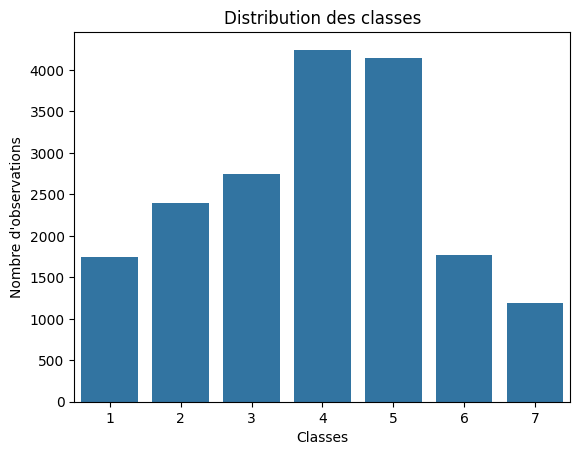

In [257]:
df_tot_notation=df_tot.copy()
df_tot_notation_predict=df_tot_notation.drop(columns=["Défaut"])
probabilities_tot = model.predict_proba(scaler.transform(df_tot_notation_predict))
df_tot_notation['PD'] = probabilities_tot[:, 1]
# Define the bin thresholds
bin_thresholds = [0.001, 0.03, 0.2, 0.8, 0.97, 0.995]
# Bin the values in the "PD" column into discrete classes
df_tot_notation['classPD'] = np.digitize(df_tot_notation['PD'], bin_thresholds)
df_tot_notation["classPD"]=df_tot_notation["classPD"]+1
#df_tot_notation
import seaborn as sns
import matplotlib.pyplot as plt

# Charger les données dans df_notation

# Créer un plot de distribution
sns.countplot(data=df_tot_notation, x="classPD")
plt.title("Distribution des classes")
plt.xlabel("Classes")
plt.ylabel("Nombre d'observations")
plt.show()

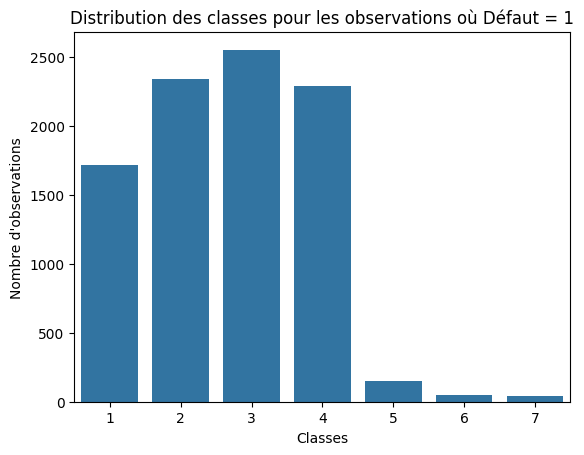

In [258]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrer les données pour inclure uniquement les lignes où "Défaut" est égal à 1
df_notation_defaut = df_tot_notation[df_tot_notation["Défaut"] == 0]

# Créer un plot de distribution
sns.countplot(data=df_notation_defaut, x="classPD")
plt.title("Distribution des classes pour les observations où Défaut = 1")
plt.xlabel("Classes")
plt.ylabel("Nombre d'observations")
plt.show()

In [259]:
# Group the values in the "Défaut" column based on the "classPD" column
grouped = df_notation.groupby("classPD")["Défaut"]


# Count the number of occurrences of "Défaut" and "Non Défaut" for each class
class_counts = grouped.value_counts().unstack(fill_value=0)
class_counts

Défaut,0,1
classPD,,
1,420,53
2,114,24
3,97,29
4,67,48
5,59,87
6,47,162
7,75,846


In [260]:
# Calculate the total number of occurrences for each class
class_totals = class_counts.sum(axis=1)

# Calculate the rates of occurrences of "0" and "1" for each class
class_rates = class_counts.divide(class_totals, axis=0)

# Print the rates for each class
print("Rates for each class:")
print(class_rates)

Rates for each class:
Défaut          0         1
classPD                    
1        0.887949  0.112051
2        0.826087  0.173913
3        0.769841  0.230159
4        0.582609  0.417391
5        0.404110  0.595890
6        0.224880  0.775120
7        0.081433  0.918567


In [261]:
class_rates = class_rates.round(2)
class_rates

Défaut,0,1
classPD,,
1,0.89,0.11
2,0.83,0.17
3,0.77,0.23
4,0.58,0.42
5,0.40,0.60
6,0.22,0.78
7,0.08,0.92


In [262]:
class_rates[1]

classPD
1    0.11
2    0.17
3    0.23
4    0.42
5    0.60
6    0.78
7    0.92
Name: 1, dtype: float64

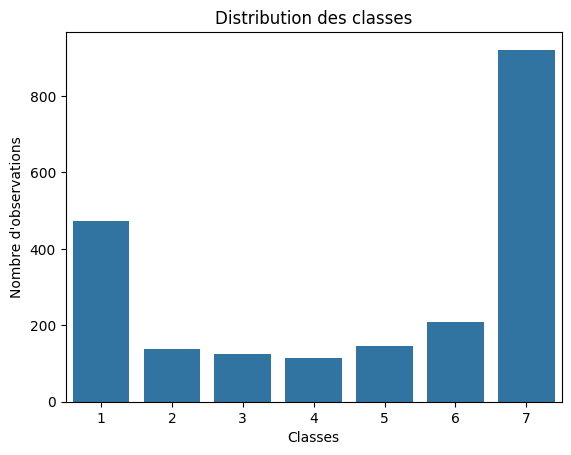

In [263]:
import seaborn as sns
import matplotlib.pyplot as plt

# Charger les données dans df_notation

# Créer un plot de distribution
sns.countplot(data=df_notation, x="classPD")
plt.title("Distribution des classes")
plt.xlabel("Classes")
plt.ylabel("Nombre d'observations")
plt.show()

<Axes: xlabel='classPD'>

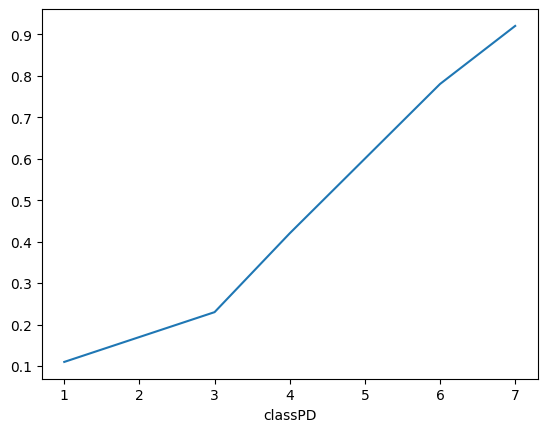

In [264]:
class_rates[1].plot()

In [265]:
df_average_observations = df_notation.copy()
df_average_observations 

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,CATEGORIE_JUR,Flag_client_cote,Flag_groupe,Secteurs2,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER,Défaut,PD,classPD
6,2020,13929532.0,-2001732.0,-497776.0,4023328.0,-87666032.0,-107236840.0,-47974432.0,37028736.0,4745760.0,...,5,0,0,1,7.570795,2.918562,50.238678,1,0.919170,7
18,2020,46011484.0,1220320.0,-773152.0,9242576.0,-84532848.0,-78816320.0,-2409024.0,58656960.0,-2285504.0,...,6,0,0,1,3.605600,1.942081,55.199913,1,0.760326,6
23,2020,15060203.0,-352788.0,-3708488.0,-6785072.0,17857616.0,-27088848.0,31039840.0,-23075440.0,-14042208.0,...,5,0,0,1,23.200718,6.980766,52.810692,1,0.825990,6
34,2020,8033674.5,1271912.0,-17199344.0,-5958592.0,-21844120.0,133920480.0,16013024.0,-5202624.0,-26623296.0,...,5,0,1,1,10.505681,6.624648,42.041359,1,0.860478,7
49,2020,10233995.0,-2783808.0,-4996224.0,-7180304.0,-17621936.0,-12481792.0,90717568.0,7335296.0,-89698048.0,...,5,0,0,8,26.075975,10.979624,49.317207,1,0.951996,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9705,2020,30492000.0,1450000.0,669000.0,347000.0,8550000.0,7963000.0,7045000.0,4757000.0,918000.0,...,7,0,0,2,15.830137,1.876712,46.030137,0,0.056833,1
9706,2020,17039000.0,-3501000.0,-9970000.0,-12313000.0,83153000.0,67209000.0,88453000.0,21931000.0,-21244000.0,...,4,0,0,7,6.460274,1.709589,50.682192,0,0.588081,5
9708,2020,36863000.0,1224000.0,656000.0,79000.0,16889000.0,16889000.0,14488000.0,12299000.0,2401000.0,...,6,0,0,2,10.109589,1.635616,56.895890,0,0.092409,1
9709,2020,11741000.0,-154000.0,-216000.0,-410000.0,1998000.0,1588000.0,4173000.0,1513000.0,-2585000.0,...,7,0,0,2,5.876712,1.594521,47.145205,0,0.264199,2


In [266]:
grouped = df_notation["PD"].groupby(df_notation["classPD"])
grouped.count()

classPD
1    473
2    138
3    126
4    115
5    146
6    209
7    921
Name: PD, dtype: int64

In [267]:
grouped = df_notation["PD"].groupby(df_notation["Défaut"])
grouped.mean()

Défaut
0    0.278457
1    0.820290
Name: PD, dtype: float64

In [268]:
def modeling(df=df_tot,modelisation=LogisticRegression(),target_column='Défaut'):
    y = df[target_column]
    X = df.drop(target_column, axis=1)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Create a  model
    model = modelisation

    # Train the model on the training set
    model.fit(X_train, y_train)



    # Create a model classifier
    logitic_regression = modelisation

    # Train the classifier on the training set
    logitic_regression.fit(X_train,y_train) 

    # Make predictions on the test set
    y_pred = logitic_regression.predict(X_test)

    # Evaluate the performance
    acc = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred)
    
    print(f'{str(modelisation).split("(")[0]}')
    print(f'Accuracy: {acc:.2f}')
    print('Classification Report:\n', report)


modeling(df_tot,LogisticRegression(),target_column='Défaut')

LogisticRegression
Accuracy: 0.90
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.90      0.90      1825
           1       0.90      0.91      0.90      1825

    accuracy                           0.90      3650
   macro avg       0.90      0.90      0.90      3650
weighted avg       0.90      0.90      0.90      3650



c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [201]:
model=LogisticRegression()
# Function to make predictions
def predict_defect(model, scaler, df):
    #st.write("Avant Normalisation:")
    #st.write(features)
    features = scaler.transform(df.columns)
    #st.write("Aprés Normalisation:")
    #st.write(features)
    prediction = model.predict(features)
    prediction_percentage = 100 * model.predict_proba(features)
    return prediction_percentage

predict_defect(model, scaler, df)

c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



ValueError: could not convert string to float: 'Annee'

### ROC Curve (differents methods of sampling)

In [175]:
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import OneSidedSelection, TomekLinks, NearMiss
import matplotlib.pyplot as plt
from collections import Counter

In [176]:
df_Sampling=df.copy()
df_Sampling=df_Sampling.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)


y1 = df_Sampling['Défaut']
X1 = df_Sampling.drop('Défaut', axis=1)


In [177]:
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve, auc, confusion_matrix
from imblearn.over_sampling import SMOTE, RandomOverSampler

def evaluate_oversampling_methods(X_train, y_train, X_test, y_test):
    # Définition des méthodes d'oversampling
    oversampling_methods = {
        'SMOTE': SMOTE(),
        'Random Oversampling': RandomOverSampler()
    }
    
    # Initialisation d'un dictionnaire pour stocker les métriques
    metrics = {}
    
    for method_name, oversampler in oversampling_methods.items():
        # Application de la méthode d'oversampling
        X_resampled, y_resampled = oversampler.fit_resample(X_train, y_train)
        
        # Entraînement du modèle sur les données suréchantillonnées
        # (Note: Ici, vous entraînerez probablement votre modèle de classification)
        # model.fit(X_resampled, y_resampled)
        
        # Prédiction sur l'ensemble de test
        # y_pred = model.predict(X_test)
        
        # Calcul des métriques d'évaluation
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        
        # Calcul de l'AUC
        fpr, tpr, thresholds = roc_curve(y_test, y_pred)
        auc_value = auc(fpr, tpr)
        
        # Calcul du Gini (2 * AUC - 1)
        gini = 2 * auc_value - 1
        
        # Stockage des métriques dans le dictionnaire
        metrics[method_name] = {
            'Accuracy': accuracy,
            'Precision': precision,
            'F1 Score': f1,
            'AUC': auc_value,
            'Gini': gini
        }
        
    return metrics

In [178]:
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import OneSidedSelection, TomekLinks, NearMiss
import matplotlib.pyplot as plt
from collections import Counter

def ROC_Curve_Sampling_technics(Model=LogisticRegression(),df=df,df_totale=df_totale):

    #Pour la méthode de la GAN
    df_tot=df_totale.copy()
    df_tot= df_tot.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)

    y = df_tot['Défaut']
    X = df_tot.drop('Défaut', axis=1)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)


    # Standardize features if needed
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)


    model1=Model

    
    #Pour les autres Méthodes
    df_Sampling=df.copy()
    #df_Sampling=df_Sampling.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
    

    y1 = df_Sampling['Défaut']
    X1 = df_Sampling.drop('Défaut', axis=1)

    # Initialize models
    models = {
        "Random Oversampling": Model,
        "Smote Oversampling": Model,  
        "UnderSampling oneSided selection": Model,
        "Undersampling with Tomek Links": Model,
        "Undersampling with NearMiss-1": Model,
        "Undersampling with NearMiss-2": Model,
        "Undersampling with NearMiss-3": Model,
    }

    # Plot ROC curves for each model
    plt.figure(figsize=(10, 8))
    for name, model in models.items():
        if name == "Random Oversampling":
            sampler = RandomOverSampler()
        elif name == "Smote Oversampling":
            sampler = SMOTE()
        elif name == "UnderSampling oneSided selection":
            sampler = OneSidedSelection()
        elif name == "Undersampling with Tomek Links":
            sampler = TomekLinks()
        elif name.startswith("Undersampling with NearMiss"):
            sampler = NearMiss(version=int(name[-1]))
        

        X_resampled, y_resampled = sampler.fit_resample(X1, y1)

        # Split the data into training and testing sets
        X1_train, X1_test, y1_train, y1_test = train_test_split(X_resampled, y_resampled, test_size=0.3)

        # Standardize features if needed
        scaler = StandardScaler()
        X1_train = scaler.fit_transform(X1_train)
        X1_test = scaler.transform(X1_test)
        
        #plot others models
        model.fit(X1_train, y1_train)
        print(name ,Counter(y_resampled))
        y1_score = model.predict_proba(X1_test)[:, 1]
        fpr, tpr, _ = roc_curve(y1_test, y1_score)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label='%s (AUC = %0.2f)' % (name, roc_auc))
    
    #plot GAN Model
    model1.fit(X_train, y_train)
    print("Generative Adversarial Network: GAN" ,Counter(y))
    y_score = model1.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label='GAN (AUC = %0.2f)' % (roc_auc))
    


    plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Sampling technics {str(Model).split("(")[0]}(ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()

In [179]:
df_totale

,Annee,CA,EBE,RESULTAT_EXP,RESULTAT_NET,FINAN_PERM,FDR,BFR,K_PROPRES,TRES_NETTE,...,Flag_client_cote,Flag_groupe,Secteurs2,PERIODE_DE_CREATION_ENTREP,PERIODE_DE_CREATION_TIERS,Age_GER,DATE_DE_CREATION_ENTREP,DATE_DE_CREATION_TIERS,DAT_NAI_GER,Défaut
0,2017,32377442.00,14957084.00,-733352.00,-478912.00,256071392.0,2.009620e+08,36382624.00,-50283120.00,-1.034589e+08,...,0,1,14,17.425005,28.329962,65.648369,07/08/2000,09/10/1989,20/06/1952,1
1,2017,21799418.00,5167488.00,-5967192.00,6775136.00,-14042224.0,-3.529568e+07,73283184.00,14118272.00,3.059456e+06,...,0,0,6,21.808447,11.920350,69.589371,10/04/1996,07/02/2006,21/06/1948,1
2,2018,28136268.00,-61800.00,25335672.00,-3715584.00,1316784.0,3.578334e+07,40885248.00,-23707088.00,-3.673325e+07,...,0,0,8,13.045897,10.318859,48.830315,03/01/2006,04/10/2008,17/04/1970,1
3,2020,9556150.00,-1377824.00,1912672.00,-7990576.00,2694896.0,4.046144e+06,42244448.00,-6125984.00,-2.947590e+07,...,0,0,13,38.773869,11.464660,51.643723,15/04/1982,06/08/2009,17/06/1969,1
4,2018,7733764.00,-5907496.00,5820088.00,2488192.00,15725888.0,8.539475e+07,17656464.00,11941888.00,-1.459830e+07,...,0,0,2,35.836510,24.260906,35.502373,15/03/1983,08/10/1994,13/07/1983,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9706,2020,17039000.00,-3501000.00,-9970000.00,-12313000.00,83153000.0,6.720900e+07,88453000.00,21931000.00,-2.124400e+07,...,0,0,7,6.460274,1.709589,50.682192,2014-07-18 00:00:00,2019-04-17 00:00:00,1968-01-25 00:00:00,0
9707,2017,21802317.68,-332377.54,-1010307.33,-3418023.48,7090079.1,3.672056e+06,4843489.08,-2418023.48,-1.171433e+06,...,0,0,1,17.260274,-1.317808,65.041096,2000-10-01 00:00:00,2019-04-26 00:00:00,1953-01-01 00:00:00,0
9708,2020,36863000.00,1224000.00,656000.00,79000.00,16889000.0,1.688900e+07,14488000.00,12299000.00,2.401000e+06,...,0,0,2,10.109589,1.635616,56.895890,2010-11-24 00:00:00,2019-05-14 00:00:00,1964-02-22 00:00:00,0
9709,2020,11741000.00,-154000.00,-216000.00,-410000.00,1998000.0,1.588000e+06,4173000.00,1513000.00,-2.585000e+06,...,0,0,2,5.876712,1.594521,47.145205,2015-02-16 00:00:00,2019-05-29 00:00:00,1973-11-20 00:00:00,0


In [180]:
ROC_Curve_Sampling_technics(Model=LogisticRegression(),df=df,df_totale=df_totale)

DTypePromotionError: The DType <class 'numpy.dtypes.DateTime64DType'> could not be promoted by <class 'numpy.dtypes.Float64DType'>. This means that no common DType exists for the given inputs. For example they cannot be stored in a single array unless the dtype is `object`. The full list of DTypes is: (<class 'numpy.dtypes.Int64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.DateTime64DType'>, <class 'numpy.dtypes.DateTime64DType'>, <class 'numpy.dtypes.DateTime64DType'>, <class 'numpy.dtypes.Int32DType'>, <class 'numpy.dtypes.Int32DType'>, <class 'numpy.dtypes.Int64DType'>, <class 'numpy.dtypes.Int64DType'>, <class 'numpy.dtypes.Int32DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>)

<Figure size 1000x800 with 0 Axes>

#### Logistic Regression

In [181]:
Model=LogisticRegression()    
#Pour la méthode de la GAN
df_tot=df_totale.copy()
#df_tot= df_tot.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)

y = df_tot['Défaut']
X = df_tot[top_feature_names]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)


# Standardize features if needed
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


model1=Model

    
#Pour les autres Méthodes
df_Sampling=df.copy()
#df_Sampling=df_Sampling.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
    

y1 = df_Sampling['Défaut']
X1 = df_Sampling[top_feature_names]
# Initialize models
models = {
        "Random Oversampling": Model,
        "Smote Oversampling": Model,  
        "UnderSampling oneSided selection": Model,
        "Undersampling with Tomek Links": Model,
        "Undersampling with NearMiss-1": Model,
        "Undersampling with NearMiss-2": Model,
        "Undersampling with NearMiss-3": Model,
    }

    # Plot ROC curves for each model
plt.figure(figsize=(10, 8))
for name, model in models.items():
        if name == "Random Oversampling":
            sampler = RandomOverSampler()
        elif name == "Smote Oversampling":
            sampler = SMOTE()
        elif name == "UnderSampling oneSided selection":
            sampler = OneSidedSelection()
        elif name == "Undersampling with Tomek Links":
            sampler = TomekLinks()
        elif name.startswith("Undersampling with NearMiss"):
            sampler = NearMiss(version=int(name[-1]))
        

        X_resampled, y_resampled = sampler.fit_resample(X1, y1)

        # Split the data into training and testing sets
        X1_train, X1_test, y1_train, y1_test = train_test_split(X_resampled, y_resampled, test_size=0.3)

        # Standardize features if needed
        scaler = StandardScaler()
        X1_train = scaler.fit_transform(X1_train)
        X1_test = scaler.transform(X1_test)
        
        #plot others models
        model.fit(X1_train, y1_train)
        print(name ,Counter(y_resampled))
        y1_score = model.predict_proba(X1_test)[:, 1]
        fpr, tpr, _ = roc_curve(y1_test, y1_score)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label='%s (AUC = %0.2f)' % (name, roc_auc))
    
    #plot GAN Model
model1.fit(X_train, y_train)
print("Generative Adversarial Network: GAN" ,Counter(y))
y_score = model1.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label='GAN (AUC = %0.2f)' % (roc_auc))
    


plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'Sampling technics {str(Model).split("(")[0]}(ROC) Curve')
plt.legend(loc="lower right")
plt.show()

NameError: name 'top_feature_names' is not defined

In [203]:
Model=LogisticRegression()    
#Pour la méthode de la GAN
df_tot=df_totale.copy()
#df_tot= df_tot.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)

y = df_tot['Défaut']
X = df_tot[selected_variables]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)


# Standardize features if needed
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


model1=Model

    
#Pour les autres Méthodes
df_Sampling=df.copy()
#df_Sampling=df_Sampling.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
    

y1 = df_Sampling['Défaut']
X1 = df_Sampling[selected_variables]
# Initialize models
models = {
        "Random Oversampling": Model,
        "Smote Oversampling": Model,  
        "UnderSampling oneSided selection": Model,
        "Undersampling with Tomek Links": Model,
        "Undersampling with NearMiss-1": Model,
        "Undersampling with NearMiss-2": Model,
        "Undersampling with NearMiss-3": Model,
    }

    # Plot ROC curves for each model
plt.figure(figsize=(10, 8))
for name, model in models.items():
        if name == "Random Oversampling":
            sampler = RandomOverSampler()
        elif name == "Smote Oversampling":
            sampler = SMOTE()
        elif name == "UnderSampling oneSided selection":
            sampler = OneSidedSelection()
        elif name == "Undersampling with Tomek Links":
            sampler = TomekLinks()
        elif name.startswith("Undersampling with NearMiss"):
            sampler = NearMiss(version=int(name[-1]))
        

        X_resampled, y_resampled = sampler.fit_resample(X1, y1)

        # Split the data into training and testing sets
        X1_train, X1_test, y1_train, y1_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=0)

        # Standardize features if needed
        scaler = StandardScaler()
        X1_train = scaler.fit_transform(X1_train)
        X1_test = scaler.transform(X1_test)
        
        #plot others models
        model.fit(X1_train, y1_train)
        print(name ,Counter(y_resampled))
        y1_score = model.predict_proba(X1_test)[:, 1]
        fpr, tpr, _ = roc_curve(y1_test, y1_score)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label='%s (AUC = %0.2f)' % (name, roc_auc))
    
    #plot GAN Model
model1.fit(X_train, y_train)
print("Generative Adversarial Network: GAN" ,Counter(y))
y_score = model1.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label='GAN (AUC = %0.2f)' % (roc_auc))
    


plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'Sampling technics {str(Model).split("(")[0]}(ROC) Curve')
plt.legend(loc="lower right")
plt.show()

NameError: name 'selected_variables' is not defined

Random Oversampling Counter({0: 9123, 1: 9123})
Smote Oversampling Counter({0: 9123, 1: 9123})
UnderSampling oneSided selection Counter({0: 8886, 1: 588})
Undersampling with Tomek Links Counter({0: 8932, 1: 588})
Undersampling with NearMiss-1 Counter({0: 588, 1: 588})
Undersampling with NearMiss-2 Counter({0: 588, 1: 588})
Undersampling with NearMiss-3 Counter({0: 588, 1: 588})
Generative Adversarial Network: GAN Counter({1: 9123, 0: 9123})


c:\Users\user\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



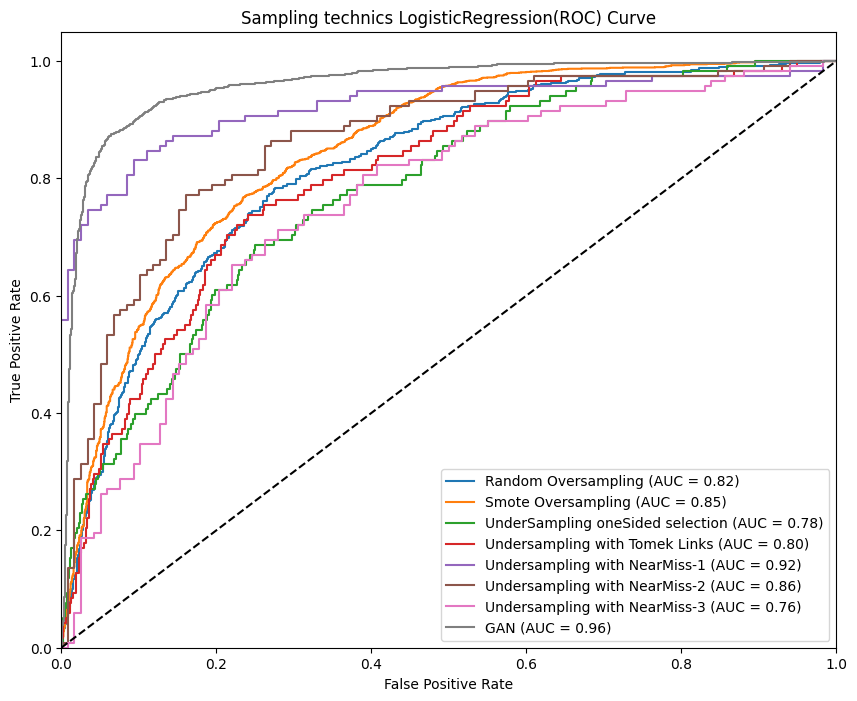

In [284]:
Model=LogisticRegression()    
#Pour la méthode de la GAN



y_gan = df_tot['Défaut']
X_gan = df_tot.drop(columns=['Défaut'])

X_train_gan, X_test_gan, y_train_gan, y_test_gan = train_test_split(X_gan, y_gan, test_size=0.2, stratify=y_gan,random_state=42)


# Standardize features if needed
scaler = StandardScaler()
X_train_gan = scaler.fit_transform(X_train_gan)
X_test_gan = scaler.transform(X_test_gan)


model1=Model

    
#Pour les autres Méthodes
df_Sampling=df.copy()
#df_Sampling=df_Sampling.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
    

y1 = df_Sampling['Défaut']
X1 = df_Sampling.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER','Défaut'], axis=1)
# Initialize models
models = {
        "Random Oversampling": Model,
        "Smote Oversampling": Model,  
        "UnderSampling oneSided selection": Model,
        "Undersampling with Tomek Links": Model,
        "Undersampling with NearMiss-1": Model,
        "Undersampling with NearMiss-2": Model,
        "Undersampling with NearMiss-3": Model,
    }

    # Plot ROC curves for each model
plt.figure(figsize=(10, 8))
for name, model in models.items():
        if name == "Random Oversampling":
            sampler = RandomOverSampler()
        elif name == "Smote Oversampling":
            sampler = SMOTE()
        elif name == "UnderSampling oneSided selection":
            sampler = OneSidedSelection()
        elif name == "Undersampling with Tomek Links":
            sampler = TomekLinks()
        elif name.startswith("Undersampling with NearMiss"):
            sampler = NearMiss(version=int(name[-1]))
        

        X_resampled, y_resampled = sampler.fit_resample(X1, y1)

        # Split the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, stratify=y_resampled,random_state=42)

        # Standardize features if needed
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)
        
        #plot others models
        model.fit(X_train, y_train)
        print(name ,Counter(y_resampled))
        y_score = model.predict_proba(X_test)[:, 1]
        fpr, tpr, _ = roc_curve(y_test, y_score)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label='%s (AUC = %0.2f)' % (name, roc_auc))
    
    #plot GAN Model
model1.fit(X_train_gan, y_train_gan)
print("Generative Adversarial Network: GAN" ,Counter(y_gan))
y_score_gan = model1.predict_proba(X_test_gan)[:, 1]
fpr, tpr, _ = roc_curve(y_test_gan, y_score_gan)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label='GAN (AUC = %0.2f)' % (roc_auc))
    


plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'Sampling technics {str(Model).split("(")[0]}(ROC) Curve')
plt.legend(loc="lower right")
plt.show()

#### Decision Tree

In [ ]:
ROC_Curve_Sampling_technics(DecisionTreeClassifier(),df,df_totale)

#### Random Forest

In [ ]:
ROC_Curve_Sampling_technics(RandomForestClassifier(),df,df_totale)

#### Xgboost

In [ ]:
ROC_Curve_Sampling_technics(xgb.XGBClassifier(),df,df_totale)

#### SVM(Support Vector Machine)

In [ ]:
#ROC_Curve_Sampling_technics(svm.SVC(probability=True),df,df_totale)

#### Naive Bayes

In [ ]:
ROC_Curve_Sampling_technics(GaussianNB(),df,df_totale)

## Generate GIF Image

In [ ]:
import imageio

# Directory containing the images
image_directory = 'Generate_600_defauts_rows'

complet_directory = f'Latent_space={latent_space} epochs={epochs}/Generate_600_defauts_rows/image_gif'

#Create directory if it doesn't exist
if not os.path.exists(complet_directory):
    os.makedirs(complet_directory)

# List all image files in the directory
image_files = sorted([os.path.join(image_directory, file) for file in os.listdir(image_directory) if file.endswith('.png')])

# Create a list to store the images
images = []

# Read each image file and append to the list
for file in image_files:
    images.append(imageio.imread(file))

# Output GIF file path
gif_file = 'image_epochs.gif'
file_path = os.path.join(complet_directory, gif_file)
# Save the images as a GIF
imageio.mimsave(file_path, images, duration=0.5)  # Adjust duration as needed (in seconds)

print(f"GIF created: {gif_file}")

In [ ]:
generate_and_save_images(generator_defaut, 'test', seed, 100)

In [ ]:
df_totale

## PICKLE

In [161]:
df_Before_GAN.dtypes.value_counts()

float64           30
int64              4
datetime64[ns]     3
int32              3
Name: count, dtype: int64

In [162]:
df_Before_GAN.select_dtypes(include='datetime64[ns]')

,DATE_DE_CREATION_TIERS,DATE_DE_CREATION_ENTREP,DAT_NAI_GER
0,2005-12-15,2001-02-14,1961-01-01
1,2005-12-15,2001-02-14,1961-01-01
2,2005-12-15,2001-02-14,1961-01-01
3,2008-05-30,2008-04-30,1968-01-25
4,1981-04-23,1981-06-05,1933-01-12
...,...,...,...
9706,2019-04-17,2014-07-18,1968-01-25
9707,2019-04-26,2000-10-01,1953-01-01
9708,2019-05-14,2010-11-24,1964-02-22
9709,2019-05-29,2015-02-16,1973-11-20


### nearmiss-3 

In [ ]:
from imblearn.under_sampling import NearMiss

dfr=df.copy()
dfr=dfr.drop(columns=['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'])
sampler = NearMiss(version=3)
X_resampled, y_resampled = sampler.fit_resample(dfr.drop('Défaut', axis=1), dfr['Défaut'])
dfri=pd.concat([X_resampled,y_resampled],axis=1)

X_train, X_test, y_train, y_test = train_test_split(X_resampled,y_resampled , test_size=0.3)


# Standardize features if needed
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Créer et entraîner le modèle de régression logistique
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

In [ ]:
print("Score NearMiss-3: testing",logreg.score(X_test, y_test))
print("Score NearMiss -3: training",logreg.score(X_train, y_train))

In [ ]:
import pickle
pickle_out=open("streamlit/Undersampling_nearmiss3/Deprecation_nearmiss3.pkl","wb")
pickle.dump(logreg, pickle_out)
pickle.dump(df_encoding,pickle_out)
pickle.dump(dfri,pickle_out)
pickle.dump(X_resampled,pickle_out)
pickle.dump(y_resampled,pickle_out)
pickle_out.close()


In [ ]:
%%writefile streamlit/Undersampling_nearmiss3/app_nearmiss-3.py
import streamlit as st
import pickle
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

categoriques_col=['SEC_ACTIVITE', 'CATEGORIE_JUR','Secteurs2']
categoriques_num=['Flag_client_cote', 'Flag_groupe']

# Charger le modèle à partir du fichier
with open("Deprecation_nearmiss3.pkl", "rb") as pickle_in:
    logreg = pickle.load(pickle_in)
    df_encoding=pickle.load(pickle_in)
    dfri=pickle.load(pickle_in)
    X_resampled=pickle.load(pickle_in)

# Fonction pour faire des prédictions
def predict_defect(features):
    # Effectuer les prédictions en utilisant le modèle chargé
    prediction = logreg.predict(features)
    prediction_pourcentage=100*logreg.predict_proba(features)
    return prediction_pourcentage

# Title
st.title("Détection de défauts")

# Dictionary to store user inputs
user_inputs = {}
# Create number input fields dynamically for each feature in the DataFrame
for feature in dfri.loc[:,:"Age_GER"].columns:
    if feature in categoriques_col:
        valeur_initiale = np.array(dfri[feature])[1]
       # valeur_initiale_encodee = np.array(df_encoding[(df_encoding["Colonne"] == feature) & (df_encoding["Valeur Encodée"] == valeur_initiale)]["Valeur d'Origine"])[0]
        user_inputs[feature] = st.selectbox(f'{feature}', df_encoding[df_encoding["Colonne"]==f'{feature}']['Valeur d\'Origine'].unique(), index=int(valeur_initiale))
        user_inputs[feature] = df_encoding[df_encoding['Valeur d\'Origine'] == user_inputs[feature]]["Valeur Encodée"].values[0]
    elif feature in categoriques_num:
        valeur_initiale = np.array(dfri[feature])[1]
        user_inputs[feature] = st.selectbox(f'{feature}', dfri[feature].unique(), index=int(valeur_initiale))   
    else:
        user_inputs[feature] = st.number_input(f'{feature}', value=np.array(dfri[feature])[1])

# Predict button
if st.button("Predict"):
    try:
        # Create a NumPy array from the user inputs
        features = np.array([[user_inputs[feature] for feature in dfri.loc[:,:'Age_GER'].columns]])
        #st.write(features)
        
        # Make the prediction
        prediction = predict_defect(features)
        
        # Round the probability of defect to two decimal places
        rounded_prediction = round(prediction[0][1], 2)
        
        # Display the prediction results
        if rounded_prediction > 50:
            st.write("L'observation est classée comme un défaut.")
        else:
            st.write("L'observation n'est pas classée comme un défaut.")
        st.write(f"Probabilité de défaut: PD = {prediction[0][1]}%")
    except Exception as e:
        st.error(f"An error occurred: {e}")

In [ ]:
# Les étapes pour streamlit
#conda activate py310
#cd C:\Users\user\Desktop\STAGE\CODE\Dataframes\streamlit\Undersampling_nearmiss3
#streamlit run app_nearmiss-3.py
#Si tensorflow ne marche plus, faire 'pip install protobuf==3.19.6'

### GAN (Selected variables)

In [ ]:
#Pour la méthode de la GAN
df_tot=df_totale.copy()
df_tot["Secteurs2"]=df_tot["Secteurs2"].astype(float)

feature_1 = 'RESULTAT_NET'
feature_2 = 'TRES_NETTE'
feature_3 = 'Secteurs2'

y = df_tot['Défaut']
X = df_tot[selected_variables]
#X = df_tot.drop('Défaut', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)


# Standardize features if needed
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Créer et entraîner le modèle de régression logistique
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

In [ ]:
import pickle
pickle_out=open("streamlit/Deprecation_copie.pkl","wb")
pickle.dump(logreg, pickle_out)
pickle.dump(df_tot, pickle_out)
pickle.dump(df_encoding,pickle_out)
pickle.dump(selected_variables,pickle_out)
pickle_out.close()

In [ ]:
%%writefile streamlit/app_copie.py
import streamlit as st
import pickle
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

categoriques_col=['SEC_ACTIVITE', 'CATEGORIE_JUR','Secteurs2']
categoriques_num=['Flag_client_cote', 'Flag_groupe']

# Charger le modèle à partir du fichier
with open("Deprecation_copie.pkl", "rb") as pickle_in:
    logreg = pickle.load(pickle_in)
    df_tot = pickle.load(pickle_in)
    df_encoding=pickle.load(pickle_in)
    selected_variables=pickle.load(pickle_in)

# Fonction pour faire des prédictions
def predict_defect(features):
    # Effectuer les prédictions en utilisant le modèle chargé
    prediction = logreg.predict(features)
    prediction_pourcentage=100*logreg.predict_proba(features)
    return prediction_pourcentage

# Title
st.title("Détection de défauts")

# Dictionary to store user inputs
user_inputs = {}


# Create number input fields dynamically for each feature in the DataFrame
for feature in df_tot[selected_variables].columns:
    if feature in categoriques_col:
        user_inputs[feature] = st.selectbox(f'{feature}', df_encoding[df_encoding["Colonne"]==f'{feature}']['Valeur d\'Origine'].unique())
        user_inputs[feature] = df_encoding[df_encoding['Valeur d\'Origine'] == user_inputs[feature]]["Valeur Encodée"].values[0]
    elif feature in categoriques_num:
        user_inputs[feature] = st.selectbox(f'{feature}', df_tot[feature].unique())   
    else:
        user_inputs[feature] = st.number_input(f'{feature}')

# Predict button
if st.button("Predict"):
    try:  
        # Create a NumPy array from the user inputs
        features = np.array([[user_inputs[feature] for feature in df_tot[selected_variables].columns]])
        #st.write(features)
      
        # Make the prediction
        prediction = predict_defect(features)
        
        # Round the probability of defect to two decimal places
        rounded_prediction = round(prediction[0][1], 2)
        
        # Display the prediction results
        if rounded_prediction > 50:
            st.write("L'observation est classée comme un défaut.")
        else:
            st.write("L'observation n'est pas classée comme un défaut.")
        st.write(f"Probabilité de défaut: PD = {prediction[0][1]}%")
    except Exception as e:
        st.error(f"An error occurred: {e}")

In [ ]:
# Les étapes pour streamlit
#conda activate py310
#cd C:\Users\user\Desktop\STAGE\CODE\Dataframes\streamlit\techniques_oversampling
#streamlit run .py
#Si tensorflow ne marche plus, faire 'pip install protobuf==3.19.6'

### GAN (kbest Columns)

In [ ]:
#Pour la méthode de la GAN
df_tot=df_totale.copy()
df_tot["Secteurs2"]=df_tot["Secteurs2"].astype(float)

feature_1 = 'RESULTAT_NET'
feature_2 = 'TRES_NETTE'
feature_3 = 'Secteurs2'

y = df_tot['Défaut']
X = df_tot[top_feature_names]
#X = df_tot.drop('Défaut', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)


# Standardize features if needed
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Créer et entraîner le modèle de régression logistique
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

In [ ]:
import pickle
pickle_out=open("streamlit/Deprecation_copie.pkl","wb")
pickle.dump(logreg, pickle_out)
pickle.dump(df_tot, pickle_out)
pickle.dump(df_encoding,pickle_out)
pickle.dump(top_feature_names,pickle_out)
pickle_out.close()

In [ ]:
%%writefile streamlit/app_copie.py
import streamlit as st
import pickle
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

categoriques_col=['SEC_ACTIVITE', 'CATEGORIE_JUR','Secteurs2']
categoriques_num=['Flag_client_cote', 'Flag_groupe']

# Charger le modèle à partir du fichier
with open("Deprecation_copie.pkl", "rb") as pickle_in:
    logreg = pickle.load(pickle_in)
    df_tot = pickle.load(pickle_in)
    df_encoding=pickle.load(pickle_in)
    top_feature_names=pickle.load(pickle_in)

# Fonction pour faire des prédictions
def predict_defect(features):
    # Effectuer les prédictions en utilisant le modèle chargé
    prediction = logreg.predict(features)
    prediction_pourcentage=100*logreg.predict_proba(features)
    return prediction_pourcentage

# Title
st.title("Détection de défauts")

# Dictionary to store user inputs
user_inputs = {}


# Create number input fields dynamically for each feature in the DataFrame
for feature in df_tot[top_feature_names].columns:
    if feature in categoriques_col:
        user_inputs[feature] = st.selectbox(f'{feature}', df_encoding[df_encoding["Colonne"]==f'{feature}']['Valeur d\'Origine'].unique())
        user_inputs[feature] = df_encoding[df_encoding['Valeur d\'Origine'] == user_inputs[feature]]["Valeur Encodée"].values[0]
    elif feature in categoriques_num:
        user_inputs[feature] = st.selectbox(f'{feature}', df_tot[feature].unique())   
    else:
        user_inputs[feature] = st.number_input(f'{feature}')

# Predict button
if st.button("Predict"):
    try:  
        # Create a NumPy array from the user inputs
        features = np.array([[user_inputs[feature] for feature in df_tot[top_feature_names].columns]])
        #st.write(features)
      
        # Make the prediction
        prediction = predict_defect(features)
        
        # Round the probability of defect to two decimal places
        rounded_prediction = round(prediction[0][1], 2)
        
        # Display the prediction results
        if rounded_prediction > 50:
            st.write("L'observation est classée comme un défaut.")
        else:
            st.write("L'observation n'est pas classée comme un défaut.")
        st.write(f"Probabilité de défaut: PD = {prediction[0][1]}%")
    except Exception as e:
        st.error(f"An error occurred: {e}")

In [ ]:
# Les étapes pour streamlit
#conda activate py310
#cd C:\Users\user\Desktop\STAGE\CODE\Dataframes\streamlit\techniques_oversampling
#streamlit run .py
#Si tensorflow ne marche plus, faire 'pip install protobuf==3.19.6'

### GAN (all columns)

In [ ]:
#Pour la méthode de la GAN
df_tot=df_totale.copy()
df_tot= df_tot.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
df_tot["Secteurs2"]=df_tot["Secteurs2"].astype(float)

feature_1 = 'RESULTAT_NET'
feature_2 = 'TRES_NETTE'
feature_3 = 'Secteurs2'

y = df_tot['Défaut']
X = df_tot.loc[:,:'Age_GER']
#X = df_tot.drop('Défaut', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)


# Standardize features if needed
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Créer et entraîner le modèle de régression logistique
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

In [ ]:
X_train

In [ ]:
from sklearn.metrics import classification_report

In [ ]:
logreg.coef_

In [ ]:
logreg.intercept_

In [ ]:
logreg.score(X_test, y_test)

In [ ]:
scaler.scale_

In [ ]:
logreg.predict_proba(scaler.transform(df_tot.drop(['Défaut'], axis=1)))

In [ ]:
import pickle
pickle_out=open("streamlit/Deprecation_copie.pkl","wb")
pickle.dump(logreg, pickle_out)
#pickle.dump(df,pickle_out)
pickle.dump(df_tot, pickle_out)
pickle.dump(df_encoding,pickle_out)
pickle.dump(scaler,pickle_out)

pickle_out.close()


In [ ]:
%%writefile streamlit/app_copie.py
import streamlit as st
import pickle
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

categoriques_col=['SEC_ACTIVITE', 'CATEGORIE_JUR','Secteurs2']
categoriques_num=['Flag_client_cote', 'Flag_groupe']

# Charger le modèle à partir du fichier
with open("Deprecation_copie.pkl", "rb") as pickle_in:
    logreg = pickle.load(pickle_in)
    #df=pickle.load(pickle_in)
    df_tot = pickle.load(pickle_in)
    df_encoding=pickle.load(pickle_in)
    scaler = pickle.load(pickle_in)



# Fonction pour faire des prédictions
def predict_defect(features):
    # Effectuer les prédictions en utilisant le modèle chargé
    features = scaler.transform(features)
    prediction = logreg.predict(features)
    prediction_pourcentage=100*logreg.predict_proba(features)
    return prediction_pourcentage

# Title
st.title("Détection de défauts")

# Dictionary to store user inputs
user_inputs = {}


# Create number input fields dynamically for each feature in the DataFrame
for feature in df_tot.loc[:,:"Age_GER"].columns:
    if feature in categoriques_col:
        valeur_initiale = np.array(df_tot[feature])[1]
       # valeur_initiale_encodee = np.array(df_encoding[(df_encoding["Colonne"] == feature) & (df_encoding["Valeur Encodée"] == valeur_initiale)]["Valeur d'Origine"])[0]
        user_inputs[feature] = st.selectbox(f'{feature}', df_encoding[df_encoding["Colonne"]==f'{feature}']['Valeur d\'Origine'].unique(), index=int(valeur_initiale))
        user_inputs[feature] = df_encoding[df_encoding['Valeur d\'Origine'] == user_inputs[feature]]["Valeur Encodée"].values[0]
    elif feature in categoriques_num:
        valeur_initiale = np.array(df_tot[feature])[1]
        user_inputs[feature] = st.selectbox(f'{feature}', df_tot[feature].unique(), index=int(valeur_initiale))   
    else:
        user_inputs[feature] = st.number_input(f'{feature}', value=np.array(df_tot[feature])[1])

# Predict button
if st.button("Predict"):
    try:
        # Create a NumPy array from the user inputs
        features = np.array([[user_inputs[feature] for feature in df_tot.loc[:,:'Age_GER'].columns]])
        #st.write(features)
        
        # Make the prediction
        prediction = predict_defect(features)
        
        # Round the probability of defect to two decimal places
        rounded_prediction = round(prediction[0][1], 2)
        
        # Display the prediction results
        if rounded_prediction > 50:
            st.write("L'observation est classée comme un défaut.")
        else:
            st.write("L'observation n'est pas classée comme un défaut.")
        st.write(f"Probabilité de défaut: PD = {rounded_prediction}%")
    except Exception as e:
        st.error(f"An error occurred: {e}")



In [ ]:
# Les étapes pour streamlit
#conda activate py310
#cd C:\Users\user\Desktop\STAGE\CODE\Dataframes\streamlit
#streamlit run app_copie.py
#Si tensorflow ne marche plus, faire 'pip install protobuf==3.19.6'

In [ ]:
print(100*logreg.predict_proba(X_train)[0][1])
100*logreg.predict_proba(X_train)

In [ ]:
logreg.coef_

In [ ]:
df_tot['SEC_ACTIVITE']

In [ ]:
df_encoding

In [ ]:
feature = 'Secteurs2'
valeur_initiale = np.array(df_tot[feature])[1]
valeur_initiale_encodee = np.array(df_encoding[(df_encoding["Colonne"] == feature) & (df_encoding["Valeur Encodée"] == valeur_initiale)]["Valeur d'Origine"])[0]

In [ ]:
valeur_initiale_encodee

### Essai

In [ ]:
%%writefile streamlit/essai/page1.py
import streamlit as st

def app():
    st.title('Page 1')
    st.write('Bienvenue sur la Page 1!')
    # Ajoutez le contenu de la Page 1 ici

In [ ]:
%%writefile streamlit/essai/page2.py
import streamlit as st

def app():
    st.title('Page 2')
    st.write('Bienvenue sur la Page 2!')
    # Ajoutez le contenu de la Page 2 ici

In [ ]:
%%writefile streamlit/essai/essai.py
"""
import streamlit as st
import page1
import page2

# Configuration de la barre latérale pour la navigation
st.sidebar.title('Navigation')
page = st.sidebar.radio('Aller à', ('Page 1', 'Page 2'))

# Afficher la page sélectionnée
if page == 'Page 1':
    page1.app()
elif page == 'Page 2':
    page2.app()
"""

import streamlit as st
import page1
import page2

# Configuration de la barre latérale pour la navigation
st.title('Navigation')

# Utiliser des boutons pour la navigation
if st.button('Page 1'):
    st.session_state.page = 'Page 1'
elif st.button('Page 2'):
    st.session_state.page = 'Page 2'


# Afficher la page sélectionnée
if st.session_state.page == 'Page 1':
    page1.app()
elif st.session_state.page == 'Page 2':
    page2.app()

In [ ]:
# Les étapes pour streamlit
#conda activate py310
#cd C:\Users\user\Desktop\STAGE\CODE\Dataframes\streamlit\essai
#streamlit run essai.py
#Si tensorflow ne marche plus, faire 'pip install protobuf==3.19.6'

### Different technics of oversampling

In [182]:
df_tot=df_totale.copy()
scaler = StandardScaler()

In [287]:
import pickle
pickle_out=open("streamlit/techniques_oversampling/Deprecation_pages.pkl","wb")
#pickle.dump(logreg, pickle_out)
pickle.dump(df_tot, pickle_out)
pickle.dump(df_encoding,pickle_out)
pickle.dump(scaler,pickle_out)
pickle.dump(df,pickle_out)
pickle.dump(class_rates,pickle_out)
pickle_out.close()

In [290]:
%%writefile streamlit/techniques_oversampling/page_principale.py
import streamlit as st
import pickle
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import OneSidedSelection, TomekLinks, NearMiss
from collections import Counter
# Add imports for NearMiss if needed

# Function to load model and data
def load_model_and_data():
    with open("Deprecation_pages.pkl", "rb") as pickle_in:
        #logreg = pickle.load(pickle_in)
        df_tot = pickle.load(pickle_in)
        df_encoding = pickle.load(pickle_in)
        scaler = pickle.load(pickle_in)
        df=pickle.load(pickle_in)
        class_rates=pickle.load(pickle_in)
    return  df_tot, df_encoding, scaler, df, class_rates

# Function to make predictions
def predict_defect(model, scaler, features):
    #st.write("Avant Normalisation:")
    #st.write(features)
    features = scaler.transform(features)
    #st.write("Aprés Normalisation:")
    #st.write(features)
    prediction = model.predict(features)
    prediction_percentage =  model.predict_proba(features)
    return prediction_percentage




# General prediction page function
def prediction_page(selected_model, selected_technique):
    # Define model mappings
    model_mapping = {
        "Logistic Regression": LogisticRegression(),
        "XGBoost": XGBClassifier(),
        "Random Forest": RandomForestClassifier(),
        "Decision Tree": DecisionTreeClassifier(),
        "SVM": SVC(probability=True),
        "Naive Bayes": GaussianNB()
    }

    # Define technique mappings
    technique_mapping = {
        "Without Balancing Data": "k",
        "GAN": None,  # Placeholder for GAN
        "Random Oversampling": RandomOverSampler(),
        "SMOTE": SMOTE(),
        "Tomek Links": TomekLinks(),
        "NearMiss-1": NearMiss(version=1), 
        "NearMiss-2": NearMiss(version=2),  
        "NearMiss-3": NearMiss(version=3)   
    }

    categoriques_col = ['SEC_ACTIVITE', 'CATEGORIE_JUR', 'Secteurs2']
    categoriques_num = ['Flag_client_cote', 'Flag_groupe']

    # Load data and pre-trained model
    df_tot, df_encoding, scaler, df, class_rates = load_model_and_data()
    

    k=df["Défaut"]
    df=df.drop(columns=["Défaut"])
    df = pd.concat([df,k], axis=1)


    df_origine=df.copy()
    df_origine= df_origine.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
    df_origine["Secteurs2"]=df_origine["Secteurs2"].astype(float)
    
    df_sampling=df.copy()
    df_sampling= df_sampling.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
    df_sampling["Secteurs2"]=df_sampling["Secteurs2"].astype(float)

    def affichage(df_tot=df_tot):
        user_inputs = {}

        # Generate input fields dynamically
        for feature in df_tot.loc[:, :"Age_GER"].columns:
            if feature in categoriques_col:
                valeur_initiale = np.array(df_tot[feature])[18000]
                user_inputs[feature] = st.selectbox(f'{feature}', df_encoding[df_encoding["Colonne"] == feature]['Valeur d\'Origine'].unique(), index=int(valeur_initiale))
                user_inputs[feature] = df_encoding[df_encoding['Valeur d\'Origine'] == user_inputs[feature]]["Valeur Encodée"].values[0]
            elif feature in categoriques_num:
                valeur_initiale = np.array(df_tot[feature])[18000]
                user_inputs[feature] = st.selectbox(f'{feature}', df_tot[feature].unique(), index=int(valeur_initiale))   
            else:
                #user_inputs[feature] = st.number_input(f'{feature}', value=np.array(df_tot[feature])[1])
  
                # Get the input number and convert it to float
                input_value = float(np.array(df_tot[feature])[18000])

                # Format the input value with spaces
                formatted_input = "{:,.2f}".format(input_value).replace(',', ' ').replace('.', ',')

                # Get the number input from the user (as a text input for custom formatting)
                input_str = st.text_input(f'{feature}', value=formatted_input)

                user_inputs[feature]=np.array(df_tot[feature])[18000]

                

        return user_inputs

    # Select the model and technique based on user input
    model = model_mapping[selected_model]
    technique = technique_mapping[selected_technique]

    # Title
    st.title("Détection de défauts")
    st.subheader(f"Modèle sélectionné : {selected_model}")
    st.subheader(f"Technique sélectionnée : {selected_technique}")


    if technique=="k":
        user_inputs=affichage(df_tot=df_origine)
    elif technique is not None:
        user_inputs=affichage(df_tot=df_sampling)
    else:
        user_inputs=affichage(df_tot=df_tot)

    if st.button("Predict"):
        try:
            
            # Apply oversampling technique if selected
            if technique=="k":
                features = np.array([[user_inputs[feature] for feature in df_tot.loc[:, :'Age_GER'].columns]])
                df_resampled=df_origine
            elif technique is not None:
                features = np.array([[user_inputs[feature] for feature in df_sampling.loc[:, :'Age_GER'].columns]])
                
                y = df_sampling['Défaut']
                X = df_sampling.drop('Défaut', axis=1)
                X_resampled, y_resampled = technique.fit_resample(X, y)
                df_resampled = pd.concat([pd.DataFrame(X_resampled), pd.DataFrame(y_resampled, columns=['Défaut'])], axis=1)
                #features = scaler.transform(features)
                #st.write(df_resampled)
            else:
                features = np.array([[user_inputs[feature] for feature in df_tot.loc[:, :'Age_GER'].columns]])
                df_resampled = df_tot
            
            #st.write(Counter(df_resampled["Défaut"]))
            # Assuming df_resampled["Défaut"] contains binary values indicating the class
            defaut_counts = Counter(df_resampled["Défaut"])
            non_defaut_counts = {'Défaut': defaut_counts[1], 'Non-Défaut': defaut_counts[0]}
            #st.write(non_defaut_counts)
            
            y=df_resampled["Défaut"]
            X=df_resampled.loc[:, :'Age_GER']
            # Train model on resampled data
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
            scaler=StandardScaler()
            X_train=scaler.fit_transform(X_train)
            X_test=scaler.transform(X_test)
            model.fit(X_train, y_train)

            # Predict and display results
            prediction = predict_defect(model, scaler, features)
            #st.write("Pourcentage d'appartenance à chaque classe")
            #st.write(prediction)
            rounded_prediction = round(prediction[0][1], 2)

                 
            if (rounded_prediction<=0.14):
                st.write("Observations appartenant à la classe PD : 1")
                st.write(f'<div style="background-color: lightgreen; padding: 10px; border: 1px solid lightcoral; border-radius: 5px;">Probabilité de défaut: PD = {class_rates[1][1]}</div>',unsafe_allow_html=True)
            elif (rounded_prediction<=0.28):
                st.write("Observations appartenant à la classe PD : 2")
                st.write(f'<div style="background-color: lightgreen; padding: 10px; border: 1px solid lightcoral; border-radius: 5px;">Probabilité de défaut: PD = {class_rates[1][2]}</div>',unsafe_allow_html=True)
            elif (rounded_prediction<=0.42):
                st.write("Observations appartenant à la classe PD : 3")
                st.write(f'<div style="background-color: lightgreen; padding: 10px; border: 1px solid lightcoral; border-radius: 5px;">Probabilité de défaut: PD = {class_rates[1][3]}</div>',unsafe_allow_html=True)
            elif (rounded_prediction<=0.56):
                st.write("Observations appartenant à la classe PD : 4")
                st.write(f'<div style="background-color: lightgreen; padding: 10px; border: 1px solid lightcoral; border-radius: 5px;">Probabilité de défaut: PD = {class_rates[1][4]}</div>',unsafe_allow_html=True)
            elif (rounded_prediction<=0.70):
                st.write("Observations appartenant à la classe PD : 5")
                st.write(f'<div style="background-color: lightgreen; padding: 10px; border: 1px solid lightcoral; border-radius: 5px;">Probabilité de défaut: PD = {class_rates[1][5]}</div>',unsafe_allow_html=True)
            elif (rounded_prediction<=0.84):
                st.write("Observations appartenant à la classe PD : 6")
                st.write(f'<div style="background-color: lightcoral; padding: 10px; border: 1px solid lightcoral; border-radius: 5px;">Probabilité de défaut: PD = {class_rates[1][6]}</div>',unsafe_allow_html=True)
            if (rounded_prediction>0.84):
                st.write("Observation appartenant à la classe PD : 7")
                st.write(f'<div style="background-color: lightcoral; padding: 10px; border: 1px solid lightcoral; border-radius: 5px;">Probabilité de défaut: PD = {class_rates[1][7]}</div>',unsafe_allow_html=True)
            
            #st.write(f"Probabilité de défaut: PD = {rounded_prediction}%")
        except Exception as e:
            st.error(f"An error occurred: {e}")

        #st.write(prediction)


# Main app function
def app():
    st.title("Sélection du Modèle et de la Technique")
    
    models = ["Logistic Regression", "XGBoost", "Random Forest", "Decision Tree", "SVM", "Naive Bayes"]
    selected_model = st.selectbox("Choisir un Modèle", models)

    techniques = ["Without Balancing Data","GAN", "Random Oversampling", "SMOTE", "Tomek Links", "NearMiss-1", "NearMiss-2", "NearMiss-3"]
    
    # Separate choices and create labels
    oversampling_choices = techniques[1:4]
    undersampling_choices = techniques[4:]
    oversampling_label = "Oversampling"
    undersampling_label = "Undersampling"

    # Display options with disabled labels
    col1, col2 = st.columns(2)
    with col1:
        st.subheader(oversampling_label)
        for choice in oversampling_choices:
            st.write(choice, disabled=True)  # Disable click on oversampling choices
    with col2:
        st.subheader(undersampling_label)
        for choice in undersampling_choices:
            st.write(choice, disabled=True)  # Disable click on undersampling ch
    # Select actual choice from a separate selectbox
    selected_technique = st.selectbox("Choisir une Technique", techniques)
    
    
        
    
    if st.button("Continuer vers la Prédiction"):
        st.session_state.selected_model = selected_model
        st.session_state.selected_technique = selected_technique
        st.experimental_rerun()

# Conditional rendering based on user selection
if 'selected_model' in st.session_state and 'selected_technique' in st.session_state:
    prediction_page(st.session_state.selected_model, st.session_state.selected_technique)
else:
    app()

Overwriting streamlit/techniques_oversampling/page_principale.py


In [185]:
# Les étapes pour streamlit
#conda activate py310
#cd C:\Users\user\Desktop\STAGE\CODE\Dataframes\streamlit\techniques_oversampling
#streamlit run page_principale.py
#Si tensorflow ne marche plus, faire 'pip install protobuf==3.19.6'
"""
            if rounded_prediction > 50:
                st.write("L'observation est classée comme un défaut.")
                texte="L'observation est classée comme un défaut."
                # Affichage du texte dans un cadre coloré
                st.write(f'<div style="background-color: lightcoral; padding: 10px; border: 1px solid lightcoral; border-radius: 5px;">Probabilité de défaut: PD = {rounded_prediction}%"</div>',
                 unsafe_allow_html=True)
            else:
                st.write("L'observation n'est pas classée comme un défaut.")
                texte="L'observation n'est pas classée comme un défaut."
                # Affichage du texte dans un cadre coloré
                st.write(f'<div style="background-color: lightcoral; padding: 10px; border: 1px solid lightcoral; border-radius: 5px;">Probabilité de défaut: PD = {rounded_prediction}%"</div>',
                 unsafe_allow_html=True)
"""

'\n            if rounded_prediction > 50:\n                st.write("L\'observation est classée comme un défaut.")\n                texte="L\'observation est classée comme un défaut."\n                # Affichage du texte dans un cadre coloré\n                st.write(f\'<div style="background-color: lightcoral; padding: 10px; border: 1px solid lightcoral; border-radius: 5px;">Probabilité de défaut: PD = {rounded_prediction}%"</div>\',\n                 unsafe_allow_html=True)\n            else:\n                st.write("L\'observation n\'est pas classée comme un défaut.")\n                texte="L\'observation n\'est pas classée comme un défaut."\n                # Affichage du texte dans un cadre coloré\n                st.write(f\'<div style="background-color: lightcoral; padding: 10px; border: 1px solid lightcoral; border-radius: 5px;">Probabilité de défaut: PD = {rounded_prediction}%"</div>\',\n                 unsafe_allow_html=True)\n'

### Different technics of oversampling Version 2

In [292]:
df_tot=df_totale.copy()
scaler = StandardScaler()

In [293]:
import pickle
pickle_out=open("streamlit/techniques_oversampling_V2/Deprecation_pages.pkl","wb")
#pickle.dump(logreg, pickle_out)
pickle.dump(df_tot, pickle_out)
pickle.dump(df_encoding,pickle_out)
pickle.dump(scaler,pickle_out)
pickle.dump(df,pickle_out)
pickle.dump(class_rates,pickle_out)
pickle.dump(logistic_regression,pickle_out)
pickle_out.close()

In [296]:
%%writefile streamlit/techniques_oversampling_V2/page_principale.py
import streamlit as st
import pickle
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import OneSidedSelection, TomekLinks, NearMiss
from collections import Counter
# Add imports for NearMiss if needed

# Function to load model and data
def load_model_and_data():
    with open("Deprecation_pages.pkl", "rb") as pickle_in:
        #logreg = pickle.load(pickle_in)
        df_tot = pickle.load(pickle_in)
        df_encoding = pickle.load(pickle_in)
        scaler = pickle.load(pickle_in)
        df=pickle.load(pickle_in)
        class_rates=pickle.load(pickle_in)
        logistic_regression=pickle.load(pickle_in)
    return  df_tot, df_encoding, scaler, df, class_rates, logistic_regression

# Function to make predictions
def predict_defect(model, scaler, features):
    #st.write("Avant Normalisation:")
    #st.write(features)
    features = scaler.transform(features)
    #st.write("Aprés Normalisation:")
    #st.write(features)
    prediction = model.predict(features)
    prediction_percentage =  model.predict_proba(features)
    return prediction_percentage




# General prediction page function
def prediction_page(selected_model, selected_technique):
    # Define model mappings
    model_mapping = {
        "Logistic Regression": LogisticRegression(),
        "XGBoost": XGBClassifier(),
        "Random Forest": RandomForestClassifier(),
        "Decision Tree": DecisionTreeClassifier(),
        "SVM": SVC(probability=True),
        "Naive Bayes": GaussianNB()
    }

    # Define technique mappings
    technique_mapping = {
        "Without Balancing Data": "k",
        "GAN": None,  # Placeholder for GAN
        "Random Oversampling": RandomOverSampler(),
        "SMOTE": SMOTE(),
        "Tomek Links": TomekLinks(),
        "NearMiss-1": NearMiss(version=1), 
        "NearMiss-2": NearMiss(version=2),  
        "NearMiss-3": NearMiss(version=3)   
    }

    categoriques_col = ['SEC_ACTIVITE', 'CATEGORIE_JUR', 'Secteurs2']
    categoriques_num = ['Flag_client_cote', 'Flag_groupe']

    # Load data and pre-trained model
    df_tot, df_encoding, scaler, df, class_rates, logistic_regression= load_model_and_data()
    

    k=df["Défaut"]
    df=df.drop(columns=["Défaut"])
    df = pd.concat([df,k], axis=1)


    df_origine=df.copy()
    df_origine= df_origine.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
    df_origine["Secteurs2"]=df_origine["Secteurs2"].astype(float)
    
    df_sampling=df.copy()
    df_sampling= df_sampling.drop(['DATE_DE_CREATION_TIERS','DATE_DE_CREATION_ENTREP','DAT_NAI_GER'], axis=1)
    df_sampling["Secteurs2"]=df_sampling["Secteurs2"].astype(float)

    def affichage(df_tot=df_tot):
        user_inputs = {}

        # Generate input fields dynamically
        for feature in df_tot.loc[:, :"Age_GER"].columns:
            if feature in categoriques_col:
                valeur_initiale = np.array(df_tot[feature])[18241]
                user_inputs[feature] = st.selectbox(f'{feature}', df_encoding[df_encoding["Colonne"] == feature]['Valeur d\'Origine'].unique(), index=int(valeur_initiale))
                user_inputs[feature] = df_encoding[df_encoding['Valeur d\'Origine'] == user_inputs[feature]]["Valeur Encodée"].values[0]
            elif feature in categoriques_num:
                valeur_initiale = np.array(df_tot[feature])[18241]
                user_inputs[feature] = st.selectbox(f'{feature}', df_tot[feature].unique(), index=int(valeur_initiale))   
            else:
                #user_inputs[feature] = st.number_input(f'{feature}', value=np.array(df_tot[feature])[1])
  
                # Get the input number and convert it to float
                input_value = float(np.array(df_tot[feature])[18241])

                # Format the input value with spaces
                formatted_input = "{:,.2f}".format(input_value).replace(',', ' ').replace('.', ',')

                # Get the number input from the user (as a text input for custom formatting)
                input_str = st.text_input(f'{feature}', value=formatted_input)

                user_inputs[feature]=np.array(df_tot[feature])[18241]

                

        return user_inputs

    # Select the model and technique based on user input
    model = model_mapping[selected_model]
    technique = technique_mapping[selected_technique]

    # Title
    st.title("Détection de défauts")
    st.subheader(f"Modèle sélectionné : {selected_model}")
    st.subheader(f"Technique sélectionnée : {selected_technique}")


    if technique=="k":
        user_inputs=affichage(df_tot=df_origine)
    elif technique is not None:
        user_inputs=affichage(df_tot=df_sampling)
    else:
        user_inputs=affichage(df_tot=df_tot)

    if st.button("Predict"):
        try:
            
            # Apply oversampling technique if selected
            if technique=="k":
                features = np.array([[user_inputs[feature] for feature in df_tot.loc[:, :'Age_GER'].columns]])
                df_resampled=df_origine
            elif technique is not None:
                features = np.array([[user_inputs[feature] for feature in df_sampling.loc[:, :'Age_GER'].columns]])
                
                y = df_sampling['Défaut']
                X = df_sampling.drop('Défaut', axis=1)
                X_resampled, y_resampled = technique.fit_resample(X, y)
                df_resampled = pd.concat([pd.DataFrame(X_resampled), pd.DataFrame(y_resampled, columns=['Défaut'])], axis=1)
                #features = scaler.transform(features)
                #st.write(df_resampled)
            else:
                features = np.array([[user_inputs[feature] for feature in df_tot.loc[:, :'Age_GER'].columns]])
                df_resampled = df_tot
            
            #st.write(Counter(df_resampled["Défaut"]))
            # Assuming df_resampled["Défaut"] contains binary values indicating the class
            defaut_counts = Counter(df_resampled["Défaut"])
            non_defaut_counts = {'Défaut': defaut_counts[1], 'Non-Défaut': defaut_counts[0]}
            #st.write(non_defaut_counts)
            
            y=df_resampled["Défaut"]
            X=df_resampled.loc[:, :'Age_GER']
            # Train model on resampled data
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
            scaler=StandardScaler()
            X_train=scaler.fit_transform(X_train)
            X_test=scaler.transform(X_test)
            model.fit(X_train, y_train)

            # Predict and display results
            prediction = predict_defect(logistic_regression, scaler, features)
            #st.write("Pourcentage d'appartenance à chaque classe")
            #st.write(prediction)
            rounded_prediction = round(prediction[0][1], 2)

                 
            if (rounded_prediction<=0.14):
                st.write("Observations appartenant à la classe PD : 1")
                st.write(f'<div style="background-color: lightgreen; padding: 10px; border: 1px solid lightcoral; border-radius: 5px;">Probabilité de défaut: PD = {class_rates[1][1]}</div>',unsafe_allow_html=True)
            elif (rounded_prediction<=0.28):
                st.write("Observations appartenant à la classe PD : 2")
                st.write(f'<div style="background-color: lightgreen; padding: 10px; border: 1px solid lightcoral; border-radius: 5px;">Probabilité de défaut: PD = {class_rates[1][2]}</div>',unsafe_allow_html=True)
            elif (rounded_prediction<=0.42):
                st.write("Observations appartenant à la classe PD : 3")
                st.write(f'<div style="background-color: lightgreen; padding: 10px; border: 1px solid lightcoral; border-radius: 5px;">Probabilité de défaut: PD = {class_rates[1][3]}</div>',unsafe_allow_html=True)
            elif (rounded_prediction<=0.56):
                st.write("Observations appartenant à la classe PD : 4")
                st.write(f'<div style="background-color: lightgreen; padding: 10px; border: 1px solid lightcoral; border-radius: 5px;">Probabilité de défaut: PD = {class_rates[1][4]}</div>',unsafe_allow_html=True)
            elif (rounded_prediction<=0.70):
                st.write("Observations appartenant à la classe PD : 5")
                st.write(f'<div style="background-color: lightgreen; padding: 10px; border: 1px solid lightcoral; border-radius: 5px;">Probabilité de défaut: PD = {class_rates[1][5]}</div>',unsafe_allow_html=True)
            elif (rounded_prediction<=0.84):
                st.write("Observations appartenant à la classe PD : 6")
                st.write(f'<div style="background-color: lightcoral; padding: 10px; border: 1px solid lightcoral; border-radius: 5px;">Probabilité de défaut: PD = {class_rates[1][6]}</div>',unsafe_allow_html=True)
            if (rounded_prediction>0.84):
                st.write("Observation appartenant à la classe PD : 7")
                st.write(f'<div style="background-color: lightcoral; padding: 10px; border: 1px solid lightcoral; border-radius: 5px;">Probabilité de défaut: PD = {class_rates[1][7]}</div>',unsafe_allow_html=True)
            
            #st.write(f"Probabilité de défaut: PD = {rounded_prediction}%")
        except Exception as e:
            st.error(f"An error occurred: {e}")

        #st.write(prediction)


# Main app function
def app():
    st.title("Sélection du Modèle et de la Technique")
    
    models = ["Logistic Regression", "XGBoost", "Random Forest", "Decision Tree", "SVM", "Naive Bayes"]
    selected_model = st.selectbox("Choisir un Modèle", models)

    techniques = ["Without Balancing Data","GAN", "Random Oversampling", "SMOTE", "Tomek Links", "NearMiss-1", "NearMiss-2", "NearMiss-3"]
    
    # Separate choices and create labels
    oversampling_choices = techniques[1:4]
    undersampling_choices = techniques[4:]
    oversampling_label = "Oversampling"
    undersampling_label = "Undersampling"

    # Display options with disabled labels
    col1, col2 = st.columns(2)
    with col1:
        st.subheader(oversampling_label)
        for choice in oversampling_choices:
            st.write(choice, disabled=True)  # Disable click on oversampling choices
    with col2:
        st.subheader(undersampling_label)
        for choice in undersampling_choices:
            st.write(choice, disabled=True)  # Disable click on undersampling ch
    # Select actual choice from a separate selectbox
    selected_technique = st.selectbox("Choisir une Technique", techniques)
    
    
        
    
    if st.button("Continuer vers la Prédiction"):
        st.session_state.selected_model = selected_model
        st.session_state.selected_technique = selected_technique
        st.experimental_rerun()

# Conditional rendering based on user selection
if 'selected_model' in st.session_state and 'selected_technique' in st.session_state:
    prediction_page(st.session_state.selected_model, st.session_state.selected_technique)
else:
    app()

Overwriting streamlit/techniques_oversampling_V2/page_principale.py


In [ ]:
# Les étapes pour streamlit
#conda activate py310
#cd C:\Users\user\Desktop\STAGE\CODE\Dataframes\streamlit\techniques_oversampling_V2
#streamlit run page_principale.py
#Si tensorflow ne marche plus, faire 'pip install protobuf==3.19.6'